In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.datasets as datasets
import imageio
import numpy as np
import matplotlib
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt
from tqdm import tqdm

# Define learning parameters

In [2]:
# learning parameters
batch_size = 512
epochs = 100
sample_size = 64 # fixed sample size for generator
nz = 128 # latent vector size
k = 1 # number of steps to apply to the discriminator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Prepare training dataset

In [3]:
transform = transforms.Compose([
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,),(0.5,)),
])
to_pil_image = transforms.ToPILImage()

# Make input, output folders
!mkdir -p input
!mkdir -p outputs
!mkdir -p outputs_original
!mkdir -p outputs_emma
# Load train data
train_data = datasets.MNIST(
    root='input/data',
    train=True,
    download=True,
    transform=transform
)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

# Generator

In [4]:
class Generator(nn.Module):
    def __init__(self, nz):
        super(Generator, self).__init__()
        self.nz = nz
        self.main = nn.Sequential(
            nn.Linear(self.nz, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )
    def forward(self, x):
        return self.main(x).view(-1, 1, 28, 28)

# Discriminator

In [5]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n_input = 784
        self.main = nn.Sequential(
            nn.Linear(self.n_input, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )
    def forward(self, x):
        x = x.view(-1, 784)
        return self.main(x)

In [6]:
generator = Generator(nz).to(device)
discriminator = Discriminator().to(device)
print('##### GENERATOR #####')
print(generator)
print('######################')
print('\n##### DISCRIMINATOR #####')
print(discriminator)
print('######################')

##### GENERATOR #####
Generator(
  (main): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2)
    (6): Linear(in_features=1024, out_features=784, bias=True)
    (7): Tanh()
  )
)
######################

##### DISCRIMINATOR #####
Discriminator(
  (main): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=512, out_features=256, bias=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Dropout(p=0.3, inplace=False)
    (9): Linear(in_features=256, out_features=1

# Tools for training

In [7]:
# optimizers
optim_g = optim.Adam(generator.parameters(), lr=0.0002)
optim_d = optim.Adam(discriminator.parameters(), lr=0.0002)

In [8]:
# loss function
criterion = nn.BCELoss() # Binary Cross Entropy loss

In [9]:
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator

In [9]:
# to create real labels (1s)
def label_real(size):
    data = torch.ones(size, 1)
    return data.to(device)
# to create fake labels (0s)
def label_fake(size):
    data = torch.zeros(size, 1)
    return data.to(device)

def label_real_penalized(size):
    data = torch.full((size, 1), 0.9)
    return data.to(device)


In [10]:
# function to create the noise vector
def create_noise(sample_size, nz):
    return torch.randn(sample_size, nz).to(device)

In [11]:
# to save the images generated by the generator
def save_generator_image(image, path):
    save_image(image, path)

In [12]:
# create the noise vector - fixed to track how GAN is trained.
noise = create_noise(sample_size, nz)

# Q. Write training loop

In [102]:
#code from https://github.com/safwankdb/Vanilla-GAN/blob/master/Vanilla_GAN.ipynb
torch.manual_seed(7777)

def generator_loss(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_real(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################

def generator_loss_original(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_fake(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################
    
def discriminator_loss(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    return error_real + error_fake
    ######################################

def discriminator_loss_emma(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real_penalized(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    print(error_real + error_fake)
    return error_real + error_fake
    ######################################


118it [00:07, 15.16it/s]                                                          


Epoch 1 of 100
Generator loss: 1.45217419, Discriminator loss: 0.89536917


118it [00:07, 15.16it/s]                                                          


Epoch 2 of 100
Generator loss: 3.58529568, Discriminator loss: 1.13631737


118it [00:07, 14.98it/s]                                                          


Epoch 3 of 100
Generator loss: 6.49354887, Discriminator loss: 0.19076172


118it [00:08, 14.65it/s]                                                          


Epoch 4 of 100
Generator loss: 3.14552259, Discriminator loss: 1.13932586


118it [00:07, 14.97it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


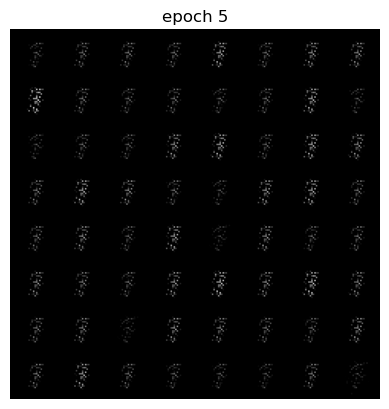

Epoch 5 of 100
Generator loss: 3.00994444, Discriminator loss: 0.63633031


118it [00:08, 14.62it/s]                                                          


Epoch 6 of 100
Generator loss: 3.43441105, Discriminator loss: 0.70064652


118it [00:07, 15.28it/s]                                                          


Epoch 7 of 100
Generator loss: 2.39026809, Discriminator loss: 0.91948414


118it [00:07, 15.20it/s]                                                          


Epoch 8 of 100
Generator loss: 2.21015859, Discriminator loss: 1.05447292


118it [00:07, 15.18it/s]                                                          


Epoch 9 of 100
Generator loss: 1.52050257, Discriminator loss: 0.98093802


118it [00:08, 14.59it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


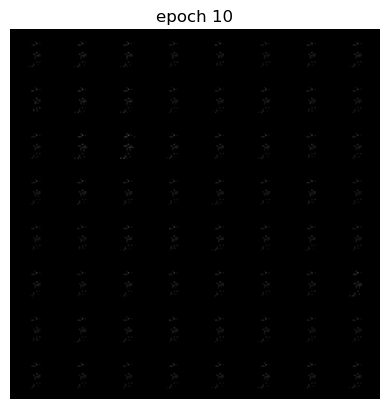

Epoch 10 of 100
Generator loss: 1.81941760, Discriminator loss: 0.82838488


118it [00:07, 15.01it/s]                                                          


Epoch 11 of 100
Generator loss: 2.44799089, Discriminator loss: 0.71957606


118it [00:07, 15.76it/s]                                                          


Epoch 12 of 100
Generator loss: 4.08759785, Discriminator loss: 0.62844521


118it [00:07, 15.87it/s]                                                          


Epoch 13 of 100
Generator loss: 3.46499801, Discriminator loss: 0.48648292


118it [00:07, 15.45it/s]                                                          


Epoch 14 of 100
Generator loss: 3.73590636, Discriminator loss: 0.41352820


118it [00:07, 15.74it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


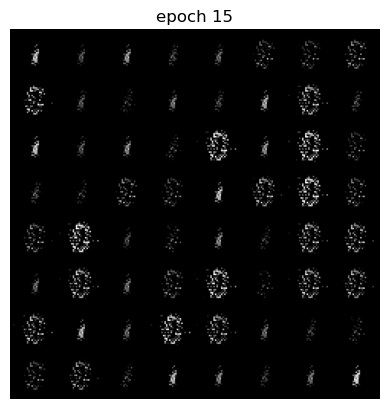

Epoch 15 of 100
Generator loss: 3.95422459, Discriminator loss: 0.46367237


118it [00:07, 15.64it/s]                                                          


Epoch 16 of 100
Generator loss: 3.10655999, Discriminator loss: 0.53059685


118it [00:07, 15.87it/s]                                                          


Epoch 17 of 100
Generator loss: 3.64888144, Discriminator loss: 0.44317862


118it [00:07, 15.89it/s]                                                          


Epoch 18 of 100
Generator loss: 2.91629744, Discriminator loss: 0.51703668


118it [00:07, 15.76it/s]                                                          


Epoch 19 of 100
Generator loss: 2.64904404, Discriminator loss: 0.59694093


118it [00:07, 15.81it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


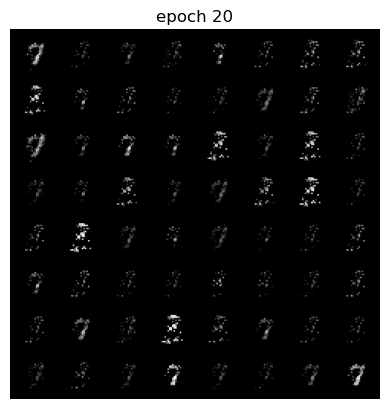

Epoch 20 of 100
Generator loss: 3.81521630, Discriminator loss: 0.44355121


118it [00:07, 15.70it/s]                                                          


Epoch 21 of 100
Generator loss: 3.26423693, Discriminator loss: 0.58100867


118it [00:07, 15.83it/s]                                                          


Epoch 22 of 100
Generator loss: 3.25427532, Discriminator loss: 0.56883806


118it [00:07, 15.31it/s]                                                          


Epoch 23 of 100
Generator loss: 3.57572961, Discriminator loss: 0.33727056


118it [00:07, 15.66it/s]                                                          


Epoch 24 of 100
Generator loss: 4.26737118, Discriminator loss: 0.36351570


118it [00:07, 15.75it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


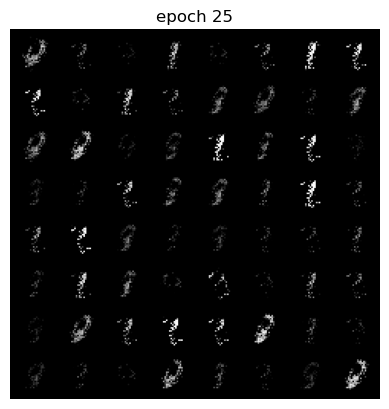

Epoch 25 of 100
Generator loss: 3.60960340, Discriminator loss: 0.45276761


118it [00:07, 15.56it/s]                                                          


Epoch 26 of 100
Generator loss: 3.40895200, Discriminator loss: 0.39657673


118it [00:07, 15.75it/s]                                                          


Epoch 27 of 100
Generator loss: 3.81363463, Discriminator loss: 0.39616260


118it [00:07, 15.79it/s]                                                          


Epoch 28 of 100
Generator loss: 3.44225311, Discriminator loss: 0.40566084


118it [00:07, 15.81it/s]                                                          


Epoch 29 of 100
Generator loss: 3.86025715, Discriminator loss: 0.41284418


118it [00:07, 15.74it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


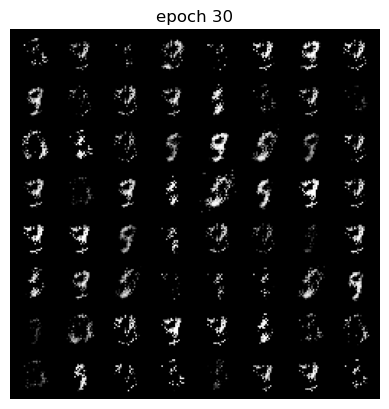

Epoch 30 of 100
Generator loss: 3.27505136, Discriminator loss: 0.49888065


118it [00:07, 15.76it/s]                                                          


Epoch 31 of 100
Generator loss: 3.30355358, Discriminator loss: 0.51984954


118it [00:07, 15.55it/s]                                                          


Epoch 32 of 100
Generator loss: 3.52322745, Discriminator loss: 0.39278352


118it [00:07, 15.88it/s]                                                          


Epoch 33 of 100
Generator loss: 3.88661242, Discriminator loss: 0.35590908


118it [00:07, 16.04it/s]                                                          


Epoch 34 of 100
Generator loss: 3.45441008, Discriminator loss: 0.46792957


118it [00:07, 16.20it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


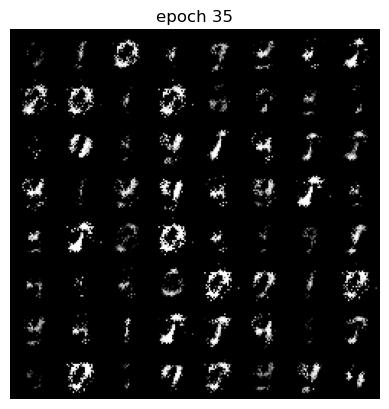

Epoch 35 of 100
Generator loss: 3.20131874, Discriminator loss: 0.49365646


118it [00:07, 16.11it/s]                                                          


Epoch 36 of 100
Generator loss: 3.23975897, Discriminator loss: 0.42766058


118it [00:07, 16.19it/s]                                                          


Epoch 37 of 100
Generator loss: 3.39869571, Discriminator loss: 0.45123714


118it [00:07, 15.96it/s]                                                          


Epoch 38 of 100
Generator loss: 3.42212558, Discriminator loss: 0.44953355


118it [00:07, 16.06it/s]                                                          


Epoch 39 of 100
Generator loss: 3.42821336, Discriminator loss: 0.49152666


118it [00:07, 16.05it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


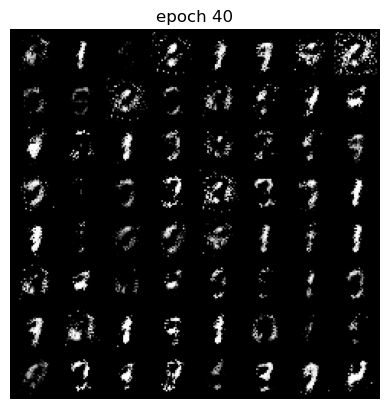

Epoch 40 of 100
Generator loss: 3.23017764, Discriminator loss: 0.46281973


118it [00:07, 16.01it/s]                                                          


Epoch 41 of 100
Generator loss: 2.91385603, Discriminator loss: 0.52653152


118it [00:07, 15.97it/s]                                                          


Epoch 42 of 100
Generator loss: 3.35241032, Discriminator loss: 0.46995589


118it [00:07, 16.07it/s]                                                          


Epoch 43 of 100
Generator loss: 3.04823780, Discriminator loss: 0.50877023


118it [00:07, 16.01it/s]                                                          


Epoch 44 of 100
Generator loss: 3.14774513, Discriminator loss: 0.49305779


118it [00:07, 16.13it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


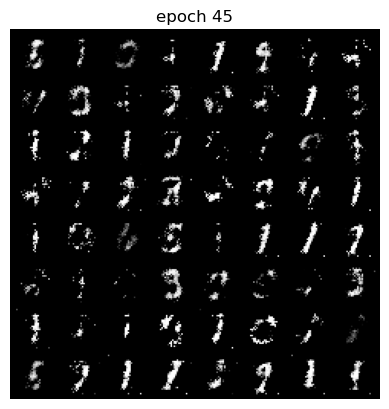

Epoch 45 of 100
Generator loss: 2.95443273, Discriminator loss: 0.49379438


118it [00:07, 16.12it/s]                                                          


Epoch 46 of 100
Generator loss: 3.08403492, Discriminator loss: 0.53072602


118it [00:07, 16.33it/s]                                                          


Epoch 47 of 100
Generator loss: 3.18825126, Discriminator loss: 0.48236308


118it [00:07, 15.85it/s]                                                          


Epoch 48 of 100
Generator loss: 3.26169157, Discriminator loss: 0.44969231


118it [00:07, 16.07it/s]                                                          


Epoch 49 of 100
Generator loss: 3.07717299, Discriminator loss: 0.45904183


118it [00:07, 16.13it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


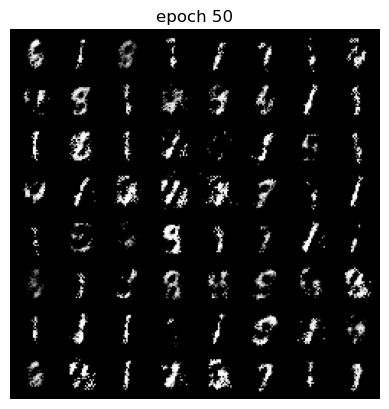

Epoch 50 of 100
Generator loss: 3.12496853, Discriminator loss: 0.46740818


118it [00:07, 15.93it/s]                                                          


Epoch 51 of 100
Generator loss: 3.16490793, Discriminator loss: 0.48819426


118it [00:07, 16.15it/s]                                                          


Epoch 52 of 100
Generator loss: 3.05314422, Discriminator loss: 0.55743337


118it [00:07, 16.19it/s]                                                          


Epoch 53 of 100
Generator loss: 2.86768031, Discriminator loss: 0.55833501


118it [00:07, 16.33it/s]                                                          


Epoch 54 of 100
Generator loss: 2.77707624, Discriminator loss: 0.56477177


118it [00:07, 16.14it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


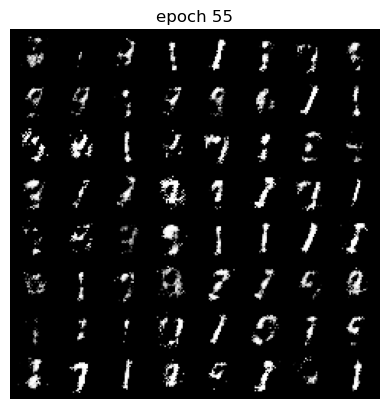

Epoch 55 of 100
Generator loss: 2.86060834, Discriminator loss: 0.56346971


118it [00:07, 16.25it/s]                                                          


Epoch 56 of 100
Generator loss: 2.74736214, Discriminator loss: 0.55646151


118it [00:07, 16.00it/s]                                                          


Epoch 57 of 100
Generator loss: 2.68510747, Discriminator loss: 0.57973015


118it [00:07, 15.95it/s]                                                          


Epoch 58 of 100
Generator loss: 2.82541394, Discriminator loss: 0.53924549


118it [00:07, 16.05it/s]                                                          


Epoch 59 of 100
Generator loss: 2.85332322, Discriminator loss: 0.52829796


118it [00:07, 16.30it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


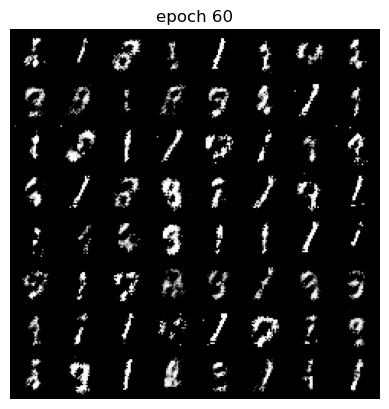

Epoch 60 of 100
Generator loss: 2.69130039, Discriminator loss: 0.54445350


118it [00:07, 16.30it/s]                                                          


Epoch 61 of 100
Generator loss: 2.53790951, Discriminator loss: 0.60133475


118it [00:07, 16.17it/s]                                                          


Epoch 62 of 100
Generator loss: 2.71151781, Discriminator loss: 0.58584249


118it [00:07, 16.36it/s]                                                          


Epoch 63 of 100
Generator loss: 2.59895635, Discriminator loss: 0.63820785


118it [00:07, 16.24it/s]                                                          


Epoch 64 of 100
Generator loss: 2.56214595, Discriminator loss: 0.62870210


118it [00:07, 16.31it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


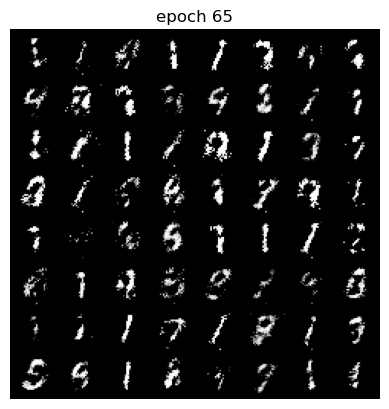

Epoch 65 of 100
Generator loss: 2.68669343, Discriminator loss: 0.60953945


118it [00:07, 16.22it/s]                                                          


Epoch 66 of 100
Generator loss: 2.58523011, Discriminator loss: 0.62297934


118it [00:07, 16.44it/s]                                                          


Epoch 67 of 100
Generator loss: 2.65447116, Discriminator loss: 0.60408640


118it [00:07, 16.34it/s]                                                          


Epoch 68 of 100
Generator loss: 2.51190281, Discriminator loss: 0.62646329


118it [00:07, 16.41it/s]                                                          


Epoch 69 of 100
Generator loss: 2.43647647, Discriminator loss: 0.65510339


118it [00:07, 16.27it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


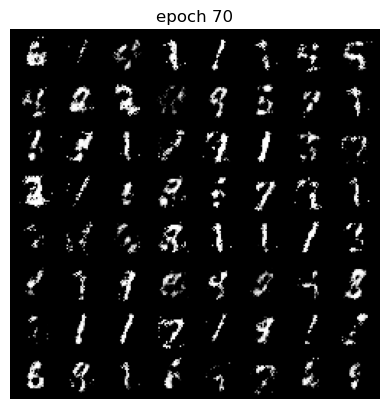

Epoch 70 of 100
Generator loss: 2.45136595, Discriminator loss: 0.63224727


118it [00:07, 16.31it/s]                                                          


Epoch 71 of 100
Generator loss: 2.52208877, Discriminator loss: 0.62013108


118it [00:07, 16.39it/s]                                                          


Epoch 72 of 100
Generator loss: 2.52562428, Discriminator loss: 0.62123650


118it [00:07, 16.37it/s]                                                          


Epoch 73 of 100
Generator loss: 2.52324152, Discriminator loss: 0.64226472


118it [00:07, 16.34it/s]                                                          


Epoch 74 of 100
Generator loss: 2.60921383, Discriminator loss: 0.58971745


118it [00:07, 16.38it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


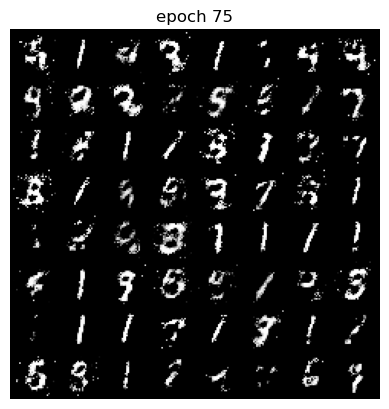

Epoch 75 of 100
Generator loss: 2.44926262, Discriminator loss: 0.61359870


118it [00:07, 16.43it/s]                                                          


Epoch 76 of 100
Generator loss: 2.43088078, Discriminator loss: 0.66420674


118it [00:07, 16.34it/s]                                                          


Epoch 77 of 100
Generator loss: 2.33721876, Discriminator loss: 0.68553460


118it [00:07, 16.34it/s]                                                          


Epoch 78 of 100
Generator loss: 2.22252631, Discriminator loss: 0.70439541


118it [00:07, 16.38it/s]                                                          


Epoch 79 of 100
Generator loss: 2.37786150, Discriminator loss: 0.66933244


118it [00:07, 16.45it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


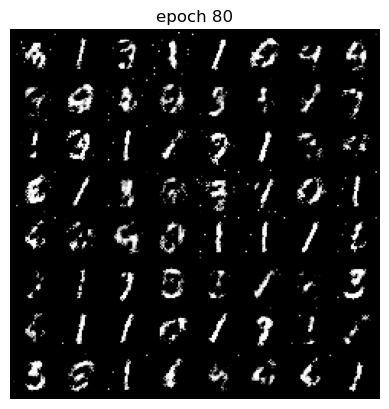

Epoch 80 of 100
Generator loss: 2.32387280, Discriminator loss: 0.69258237


118it [00:07, 16.40it/s]                                                          


Epoch 81 of 100
Generator loss: 2.27361441, Discriminator loss: 0.70298141


118it [00:07, 16.38it/s]                                                          


Epoch 82 of 100
Generator loss: 2.22960711, Discriminator loss: 0.68164325


118it [00:07, 16.48it/s]                                                          


Epoch 83 of 100
Generator loss: 2.30003023, Discriminator loss: 0.68572652


118it [00:07, 15.46it/s]                                                          


Epoch 84 of 100
Generator loss: 2.20623565, Discriminator loss: 0.73153573


118it [00:07, 16.58it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


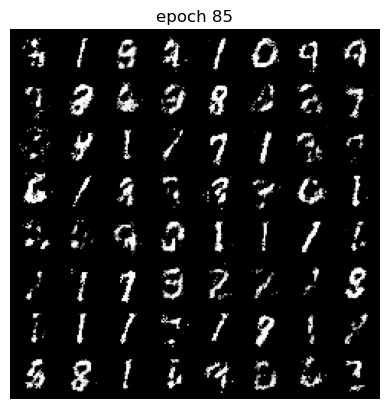

Epoch 85 of 100
Generator loss: 2.23739076, Discriminator loss: 0.70811749


118it [00:07, 16.30it/s]                                                          


Epoch 86 of 100
Generator loss: 2.17277265, Discriminator loss: 0.70924652


118it [00:07, 16.39it/s]                                                          


Epoch 87 of 100
Generator loss: 2.14967608, Discriminator loss: 0.71257997


118it [00:07, 16.05it/s]                                                          


Epoch 88 of 100
Generator loss: 2.16111708, Discriminator loss: 0.71969068


118it [00:07, 16.48it/s]                                                          


Epoch 89 of 100
Generator loss: 2.19189477, Discriminator loss: 0.73772800


118it [00:07, 16.36it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


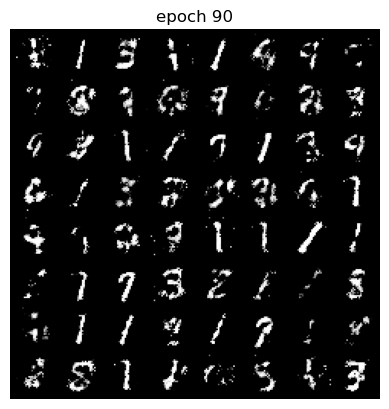

Epoch 90 of 100
Generator loss: 2.13548708, Discriminator loss: 0.75618100


118it [00:07, 16.22it/s]                                                          


Epoch 91 of 100
Generator loss: 2.05040765, Discriminator loss: 0.76571709


118it [00:07, 16.40it/s]                                                          


Epoch 92 of 100
Generator loss: 2.12920690, Discriminator loss: 0.74870294


118it [00:07, 16.53it/s]                                                          


Epoch 93 of 100
Generator loss: 2.14201283, Discriminator loss: 0.74001515


118it [00:07, 16.51it/s]                                                          


Epoch 94 of 100
Generator loss: 2.08685374, Discriminator loss: 0.74610788


118it [00:07, 16.55it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


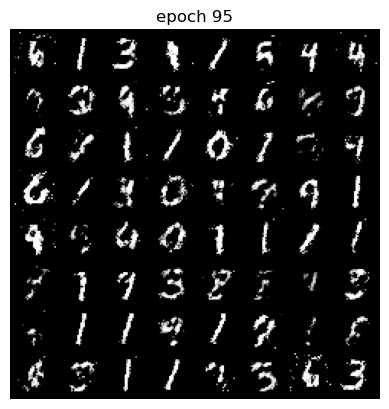

Epoch 95 of 100
Generator loss: 2.12788510, Discriminator loss: 0.73397988


118it [00:07, 16.60it/s]                                                          


Epoch 96 of 100
Generator loss: 2.08575869, Discriminator loss: 0.78040886


118it [00:07, 16.34it/s]                                                          


Epoch 97 of 100
Generator loss: 2.12957692, Discriminator loss: 0.74266618


118it [00:07, 16.56it/s]                                                          


Epoch 98 of 100
Generator loss: 2.13719320, Discriminator loss: 0.71975452


118it [00:07, 16.49it/s]                                                          


Epoch 99 of 100
Generator loss: 2.05338049, Discriminator loss: 0.81083953


118it [00:07, 16.49it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


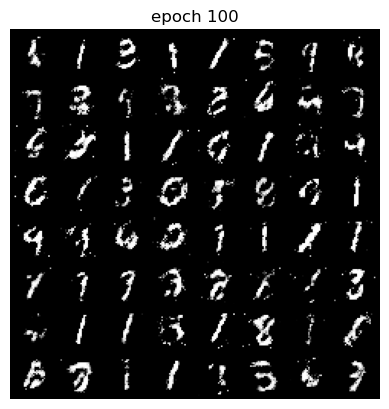

Epoch 100 of 100
Generator loss: 1.97177339, Discriminator loss: 0.80133069


In [14]:
## TRAINING FOR 1a)
losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
torch.manual_seed(7777)

def generator_loss(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_real(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################

def generator_loss_original(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_fake(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################
    
def discriminator_loss(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    return error_real + error_fake
    ######################################

def discriminator_loss_emma(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real_penalized(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    print(error_real + error_fake)
    return error_real + error_fake
    ######################################
    
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        imgs, _ = data
        m = len(imgs)
        fake_data = generator(create_noise(m, nz)).detach()
        real_data = imgs.to(device)
        loss_d += discriminator_loss(optim_d, fake_data, real_data)
        fake_data = generator(create_noise(m, nz))
        loss_g += generator_loss(optim_g, fake_data)
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g.detach().numpy())
    losses_d.append(epoch_loss_d.detach().numpy())
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [15]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs/generator.pth')

DONE TRAINING


In [16]:
# save the generated images as GIF file
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs/generator_images.gif', imgs)

[array(1.4521742, dtype=float32), array(3.5852957, dtype=float32), array(6.493549, dtype=float32), array(3.1455226, dtype=float32), array(3.0099444, dtype=float32), array(3.434411, dtype=float32), array(2.390268, dtype=float32), array(2.2101586, dtype=float32), array(1.5205026, dtype=float32), array(1.8194176, dtype=float32), array(2.447991, dtype=float32), array(4.087598, dtype=float32), array(3.464998, dtype=float32), array(3.7359064, dtype=float32), array(3.9542246, dtype=float32), array(3.10656, dtype=float32), array(3.6488814, dtype=float32), array(2.9162974, dtype=float32), array(2.649044, dtype=float32), array(3.8152163, dtype=float32), array(3.264237, dtype=float32), array(3.2542753, dtype=float32), array(3.5757296, dtype=float32), array(4.267371, dtype=float32), array(3.6096034, dtype=float32), array(3.408952, dtype=float32), array(3.8136346, dtype=float32), array(3.442253, dtype=float32), array(3.8602571, dtype=float32), array(3.2750514, dtype=float32), array(3.3035536, dtype

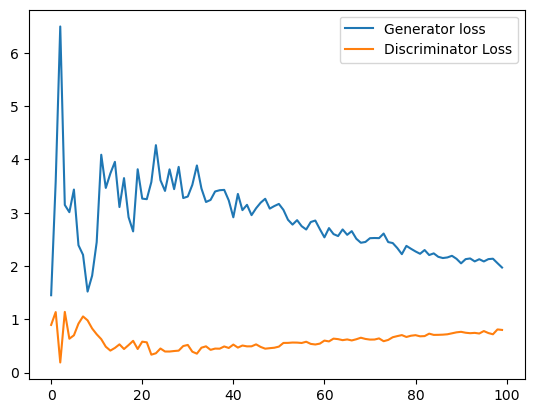

In [17]:
# plot and save the generator and discriminator loss
#losses_g_numpy = losses_g.detach().numpy()
print(losses_g)
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs/loss.png')

118it [00:07, 15.29it/s]                                                          


Epoch 1 of 100
Generator loss: 0.05749489, Discriminator loss: 0.08230203


118it [00:07, 15.29it/s]                                                          


Epoch 2 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.38it/s]                                                          


Epoch 3 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.20it/s]                                                          


Epoch 4 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.41it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


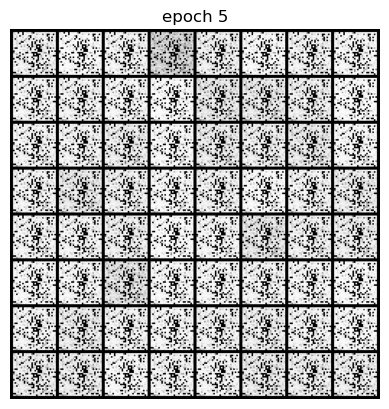

Epoch 5 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.02it/s]                                                          


Epoch 6 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.19it/s]                                                          


Epoch 7 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.13it/s]                                                          


Epoch 8 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.31it/s]                                                          


Epoch 9 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


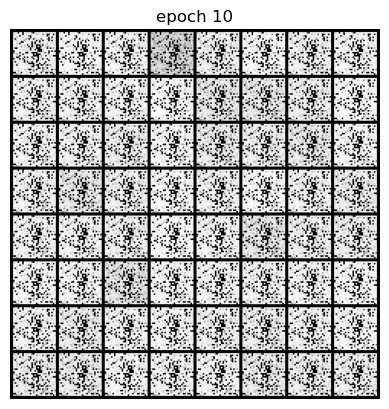

Epoch 10 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.29it/s]                                                          


Epoch 11 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.25it/s]                                                          


Epoch 12 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.21it/s]                                                          


Epoch 13 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.26it/s]                                                          


Epoch 14 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.36it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


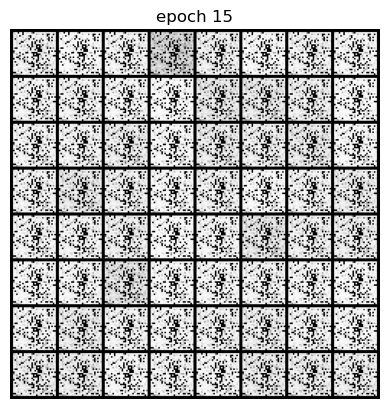

Epoch 15 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.31it/s]                                                          


Epoch 16 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                                                          


Epoch 17 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.23it/s]                                                          


Epoch 18 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.29it/s]                                                          


Epoch 19 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.34it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


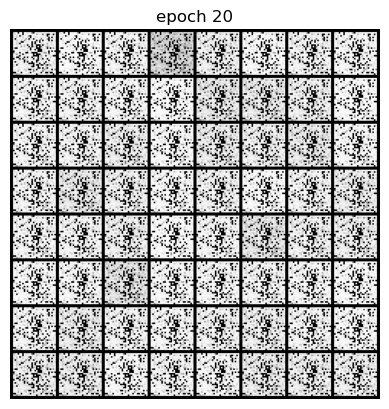

Epoch 20 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.35it/s]                                                          


Epoch 21 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.39it/s]                                                          


Epoch 22 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.50it/s]                                                          


Epoch 23 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.17it/s]                                                          


Epoch 24 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.56it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


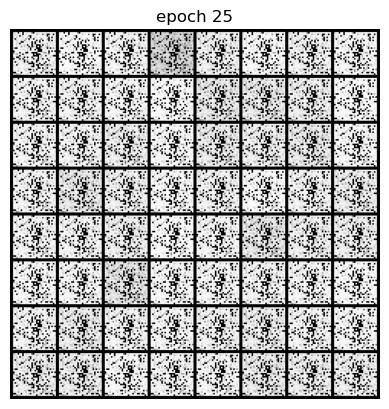

Epoch 25 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.36it/s]                                                          


Epoch 26 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 27 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.36it/s]                                                          


Epoch 28 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.48it/s]                                                          


Epoch 29 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


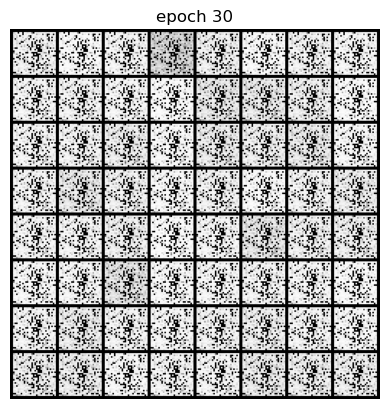

Epoch 30 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.49it/s]                                                          


Epoch 31 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.53it/s]                                                          


Epoch 32 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.49it/s]                                                          


Epoch 33 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.63it/s]                                                          


Epoch 34 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


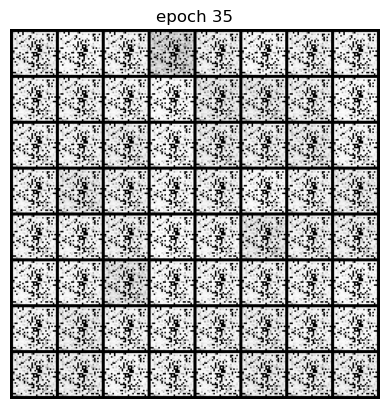

Epoch 35 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.61it/s]                                                          


Epoch 36 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 37 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.53it/s]                                                          


Epoch 38 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.33it/s]                                                          


Epoch 39 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


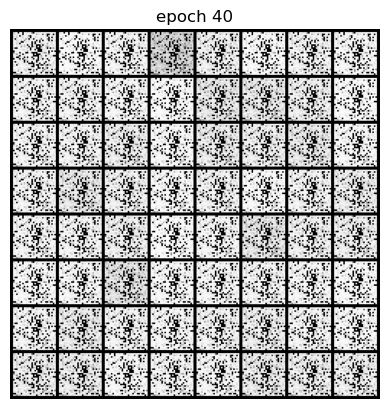

Epoch 40 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.59it/s]                                                          


Epoch 41 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.56it/s]                                                          


Epoch 42 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 43 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.66it/s]                                                          


Epoch 44 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.45it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


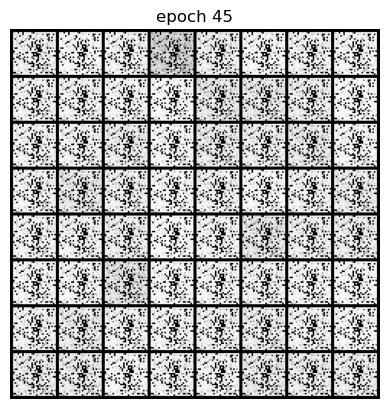

Epoch 45 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.58it/s]                                                          


Epoch 46 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.58it/s]                                                          


Epoch 47 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.62it/s]                                                          


Epoch 48 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.54it/s]                                                          


Epoch 49 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.60it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


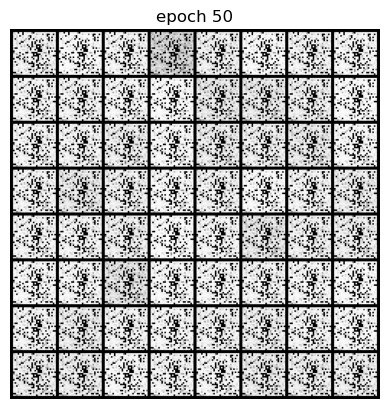

Epoch 50 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 51 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.60it/s]                                                          


Epoch 52 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.67it/s]                                                          


Epoch 53 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.76it/s]                                                          


Epoch 54 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.77it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


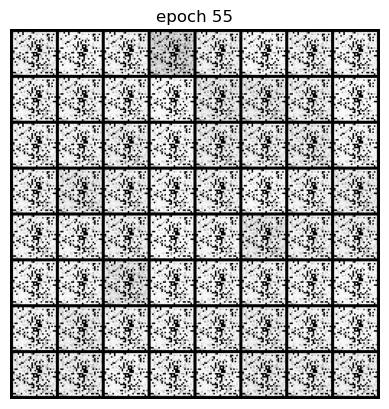

Epoch 55 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.66it/s]                                                          


Epoch 56 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.77it/s]                                                          


Epoch 57 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.58it/s]                                                          


Epoch 58 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                                                          


Epoch 59 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.78it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


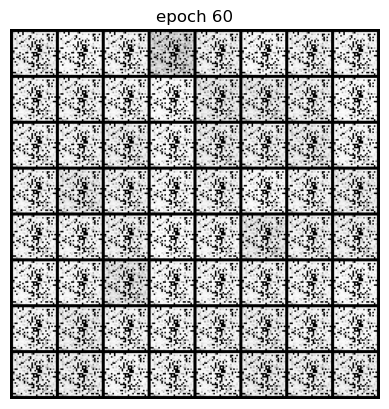

Epoch 60 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.87it/s]                                                          


Epoch 61 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.79it/s]                                                          


Epoch 62 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.87it/s]                                                          


Epoch 63 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.44it/s]                                                          


Epoch 64 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.69it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


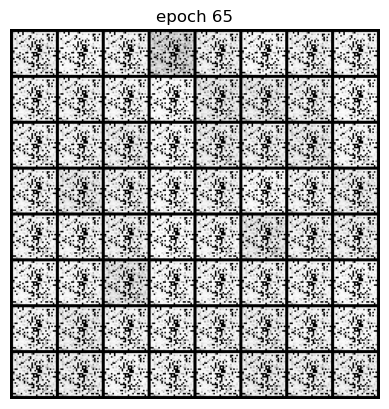

Epoch 65 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.72it/s]                                                          


Epoch 66 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.85it/s]                                                          


Epoch 67 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.29it/s]                                                          


Epoch 68 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                                                          


Epoch 69 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.84it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


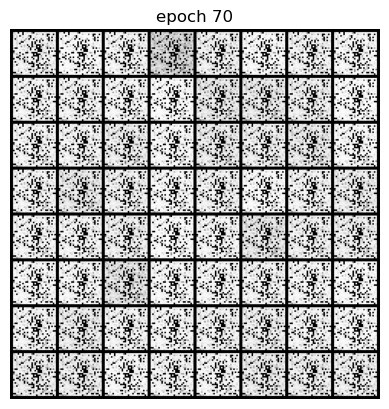

Epoch 70 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.57it/s]                                                          


Epoch 71 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.34it/s]                                                          


Epoch 72 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.37it/s]                                                          


Epoch 73 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.59it/s]                                                          


Epoch 74 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.69it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


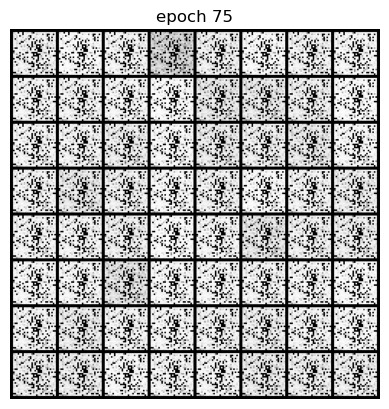

Epoch 75 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.74it/s]                                                          


Epoch 76 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.63it/s]                                                          


Epoch 77 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.61it/s]                                                          


Epoch 78 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.64it/s]                                                          


Epoch 79 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


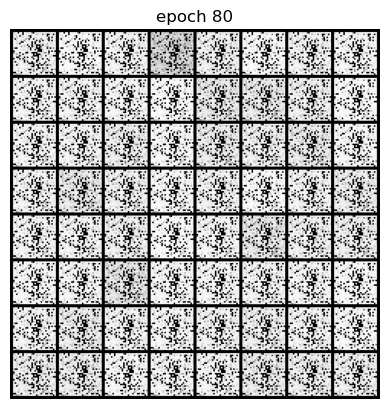

Epoch 80 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.62it/s]                                                          


Epoch 81 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.67it/s]                                                          


Epoch 82 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.70it/s]                                                          


Epoch 83 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.65it/s]                                                          


Epoch 84 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.63it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


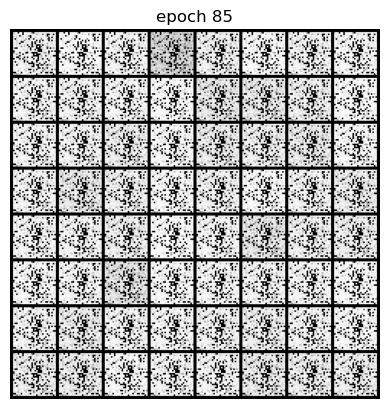

Epoch 85 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.82it/s]                                                          


Epoch 86 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.83it/s]                                                          


Epoch 87 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.62it/s]                                                          


Epoch 88 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.73it/s]                                                          


Epoch 89 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.62it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


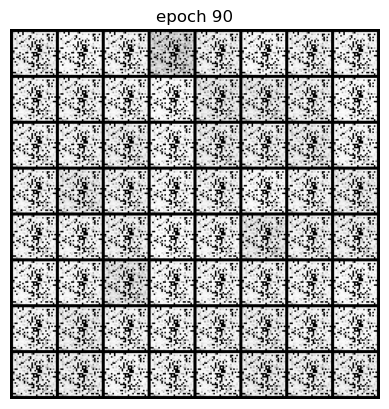

Epoch 90 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.49it/s]                                                          


Epoch 91 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 92 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.62it/s]                                                          


Epoch 93 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 94 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.55it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


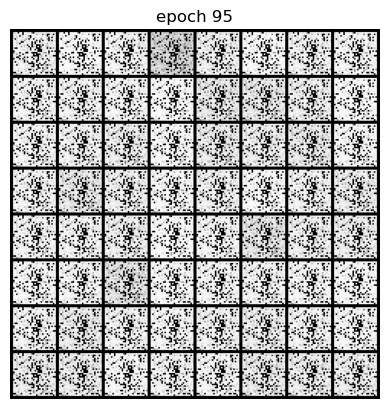

Epoch 95 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.57it/s]                                                          


Epoch 96 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.51it/s]                                                          


Epoch 97 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.63it/s]                                                          


Epoch 98 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.70it/s]                                                          


Epoch 99 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


118it [00:07, 15.46it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


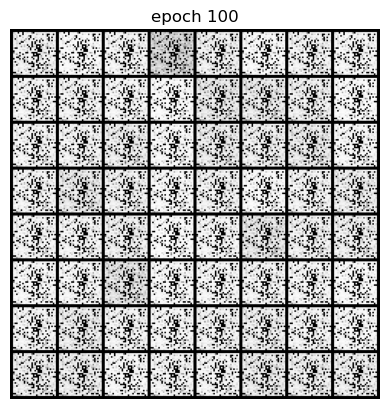

Epoch 100 of 100
Generator loss: 0.00000000, Discriminator loss: 0.00000000


In [14]:
#TRAINING FOR 1b

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
torch.manual_seed(7777)

def generator_loss(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_real(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################

def generator_loss_original(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_fake(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################
    
def discriminator_loss(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    return error_real + error_fake
    ######################################

def discriminator_loss_emma(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real_penalized(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    print(error_real + error_fake)
    return error_real + error_fake
    ######################################
    
    
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        imgs, _ = data
        m = len(imgs)
        fake_data = generator(create_noise(m, nz)).detach()
        real_data = imgs.to(device)
        loss_d += discriminator_loss(optim_d, fake_data, real_data)
        fake_data = generator(create_noise(m, nz))
        loss_g += generator_loss_original(optim_g, fake_data)
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_original/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g.detach().numpy())
    losses_d.append(epoch_loss_d.detach().numpy())
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [15]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs_original/generator_original.pth')

DONE TRAINING


In [16]:
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs_original/generator_images_original.gif', imgs)

[array(0.05749489, dtype=float32), array(6.0875744e-16, dtype=float32), array(7.547081e-16, dtype=float32), array(7.8983355e-16, dtype=float32), array(8.094658e-16, dtype=float32), array(7.4325505e-16, dtype=float32), array(6.3027695e-16, dtype=float32), array(6.423181e-16, dtype=float32), array(6.849508e-16, dtype=float32), array(6.1560083e-16, dtype=float32), array(7.262361e-16, dtype=float32), array(5.8658186e-16, dtype=float32), array(5.0081866e-16, dtype=float32), array(6.574762e-16, dtype=float32), array(1.4508018e-15, dtype=float32), array(1.1045435e-15, dtype=float32), array(8.824961e-16, dtype=float32), array(6.0635664e-16, dtype=float32), array(6.176934e-16, dtype=float32), array(7.662039e-16, dtype=float32), array(8.642437e-16, dtype=float32), array(6.092596e-16, dtype=float32), array(6.13343e-16, dtype=float32), array(7.756587e-16, dtype=float32), array(6.357678e-16, dtype=float32), array(8.695023e-16, dtype=float32), array(5.72192e-16, dtype=float32), array(6.624071e-16, d

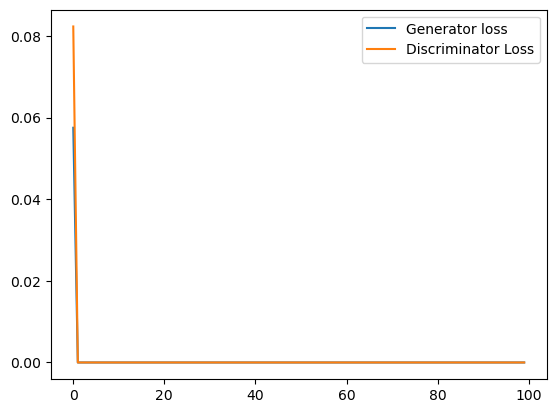

In [17]:
# plot and save the generator and discriminator loss
#losses_g_numpy = losses_g.detach().numpy()
print(losses_g)
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs_original/loss_original.png')

  2%|▊                                            | 2/117 [00:00<00:09, 12.27it/s]

tensor(1.3831, grad_fn=<AddBackward0>)
tensor(1.2726, grad_fn=<AddBackward0>)
tensor(1.1813, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.25it/s]

tensor(1.1140, grad_fn=<AddBackward0>)
tensor(1.0774, grad_fn=<AddBackward0>)
tensor(1.0839, grad_fn=<AddBackward0>)
tensor(1.1247, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.70it/s]

tensor(1.1684, grad_fn=<AddBackward0>)
tensor(1.2008, grad_fn=<AddBackward0>)
tensor(1.2088, grad_fn=<AddBackward0>)
tensor(1.2076, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.98it/s]

tensor(1.1970, grad_fn=<AddBackward0>)
tensor(1.1816, grad_fn=<AddBackward0>)
tensor(1.1668, grad_fn=<AddBackward0>)
tensor(1.1589, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.89it/s]

tensor(1.1586, grad_fn=<AddBackward0>)
tensor(1.1623, grad_fn=<AddBackward0>)
tensor(1.1584, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.85it/s]

tensor(1.1432, grad_fn=<AddBackward0>)
tensor(1.1295, grad_fn=<AddBackward0>)
tensor(1.1222, grad_fn=<AddBackward0>)
tensor(1.1414, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.95it/s]

tensor(1.1645, grad_fn=<AddBackward0>)
tensor(1.2126, grad_fn=<AddBackward0>)
tensor(1.2595, grad_fn=<AddBackward0>)
tensor(1.3264, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.97it/s]

tensor(1.4225, grad_fn=<AddBackward0>)
tensor(1.4942, grad_fn=<AddBackward0>)
tensor(1.5210, grad_fn=<AddBackward0>)
tensor(1.5491, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.98it/s]

tensor(1.5361, grad_fn=<AddBackward0>)
tensor(1.4771, grad_fn=<AddBackward0>)
tensor(1.3674, grad_fn=<AddBackward0>)
tensor(1.2563, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.94it/s]

tensor(1.1199, grad_fn=<AddBackward0>)
tensor(0.9925, grad_fn=<AddBackward0>)
tensor(0.8716, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.88it/s]

tensor(0.7611, grad_fn=<AddBackward0>)
tensor(0.6761, grad_fn=<AddBackward0>)
tensor(0.6130, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.84it/s]

tensor(0.5671, grad_fn=<AddBackward0>)
tensor(0.5436, grad_fn=<AddBackward0>)
tensor(0.5339, grad_fn=<AddBackward0>)
tensor(0.5437, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.86it/s]

tensor(0.5706, grad_fn=<AddBackward0>)
tensor(0.6274, grad_fn=<AddBackward0>)
tensor(0.7269, grad_fn=<AddBackward0>)
tensor(0.8228, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.95it/s]

tensor(0.9462, grad_fn=<AddBackward0>)
tensor(1.0852, grad_fn=<AddBackward0>)
tensor(1.1698, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.86it/s]

tensor(1.1942, grad_fn=<AddBackward0>)
tensor(1.2322, grad_fn=<AddBackward0>)
tensor(1.2060, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.84it/s]

tensor(1.2029, grad_fn=<AddBackward0>)
tensor(1.2016, grad_fn=<AddBackward0>)
tensor(1.1911, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.65it/s]

tensor(1.1963, grad_fn=<AddBackward0>)
tensor(1.2020, grad_fn=<AddBackward0>)
tensor(1.1945, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.78it/s]

tensor(1.1875, grad_fn=<AddBackward0>)
tensor(1.1681, grad_fn=<AddBackward0>)
tensor(1.1608, grad_fn=<AddBackward0>)
tensor(1.1300, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.78it/s]

tensor(1.1032, grad_fn=<AddBackward0>)
tensor(1.0646, grad_fn=<AddBackward0>)
tensor(1.0275, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.86it/s]

tensor(0.9593, grad_fn=<AddBackward0>)
tensor(0.8675, grad_fn=<AddBackward0>)
tensor(0.7483, grad_fn=<AddBackward0>)
tensor(0.6355, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.91it/s]

tensor(0.5237, grad_fn=<AddBackward0>)
tensor(0.4507, grad_fn=<AddBackward0>)
tensor(0.4081, grad_fn=<AddBackward0>)
tensor(0.3804, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.98it/s]

tensor(0.3718, grad_fn=<AddBackward0>)
tensor(0.3691, grad_fn=<AddBackward0>)
tensor(0.3692, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.91it/s]

tensor(0.3737, grad_fn=<AddBackward0>)
tensor(0.3897, grad_fn=<AddBackward0>)
tensor(0.4137, grad_fn=<AddBackward0>)
tensor(0.4583, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.72it/s]

tensor(0.5416, grad_fn=<AddBackward0>)
tensor(0.6532, grad_fn=<AddBackward0>)
tensor(0.7868, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.72it/s]

tensor(0.9345, grad_fn=<AddBackward0>)
tensor(1.0589, grad_fn=<AddBackward0>)
tensor(1.1416, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.57it/s]

tensor(1.1563, grad_fn=<AddBackward0>)
tensor(1.0771, grad_fn=<AddBackward0>)
tensor(1.0060, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.45it/s]

tensor(0.9428, grad_fn=<AddBackward0>)
tensor(0.8447, grad_fn=<AddBackward0>)
tensor(0.8064, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.39it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.6905, grad_fn=<AddBackward0>)
tensor(0.6890, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.55it/s]

tensor(0.6857, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.7248, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.64it/s]

tensor(0.6848, grad_fn=<AddBackward0>)
tensor(0.6390, grad_fn=<AddBackward0>)
tensor(0.6034, grad_fn=<AddBackward0>)
tensor(0.5681, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.73it/s]

tensor(0.5537, grad_fn=<AddBackward0>)
tensor(0.5510, grad_fn=<AddBackward0>)
tensor(0.5308, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.70it/s]

tensor(0.5429, grad_fn=<AddBackward0>)
tensor(0.5535, grad_fn=<AddBackward0>)
tensor(0.5923, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.74it/s]

tensor(0.6289, grad_fn=<AddBackward0>)
tensor(0.6612, grad_fn=<AddBackward0>)
tensor(0.7129, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.78it/s]

tensor(0.7520, grad_fn=<AddBackward0>)
tensor(0.8389, grad_fn=<AddBackward0>)
tensor(0.9138, grad_fn=<AddBackward0>)


118it [00:07, 14.84it/s]                                                          


tensor(1.0199, grad_fn=<AddBackward0>)
tensor(1.0809, grad_fn=<AddBackward0>)
Epoch 1 of 100
Generator loss: 1.69055891, Discriminator loss: 0.93554640


  2%|▊                                            | 2/117 [00:00<00:07, 14.61it/s]

tensor(1.2289, grad_fn=<AddBackward0>)
tensor(1.2634, grad_fn=<AddBackward0>)
tensor(1.3677, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.75it/s]

tensor(1.4527, grad_fn=<AddBackward0>)
tensor(1.4465, grad_fn=<AddBackward0>)
tensor(1.4635, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.81it/s]

tensor(1.5808, grad_fn=<AddBackward0>)
tensor(1.6541, grad_fn=<AddBackward0>)
tensor(1.6594, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.90it/s]

tensor(1.7895, grad_fn=<AddBackward0>)
tensor(1.8543, grad_fn=<AddBackward0>)
tensor(1.8595, grad_fn=<AddBackward0>)
tensor(2.0841, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.92it/s]

tensor(1.9965, grad_fn=<AddBackward0>)
tensor(1.7747, grad_fn=<AddBackward0>)
tensor(1.5942, grad_fn=<AddBackward0>)
tensor(1.4987, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.92it/s]

tensor(1.3626, grad_fn=<AddBackward0>)
tensor(1.3420, grad_fn=<AddBackward0>)
tensor(1.3734, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.77it/s]

tensor(1.3625, grad_fn=<AddBackward0>)
tensor(1.3746, grad_fn=<AddBackward0>)
tensor(1.3899, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.83it/s]

tensor(1.4119, grad_fn=<AddBackward0>)
tensor(1.5073, grad_fn=<AddBackward0>)
tensor(1.5384, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.88it/s]

tensor(1.5828, grad_fn=<AddBackward0>)
tensor(1.5716, grad_fn=<AddBackward0>)
tensor(1.4733, grad_fn=<AddBackward0>)
tensor(1.4147, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.88it/s]

tensor(1.3269, grad_fn=<AddBackward0>)
tensor(1.2553, grad_fn=<AddBackward0>)
tensor(1.2229, grad_fn=<AddBackward0>)
tensor(1.2039, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.96it/s]

tensor(1.1797, grad_fn=<AddBackward0>)
tensor(1.1570, grad_fn=<AddBackward0>)
tensor(1.1518, grad_fn=<AddBackward0>)
tensor(1.0943, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.95it/s]

tensor(1.1331, grad_fn=<AddBackward0>)
tensor(1.1505, grad_fn=<AddBackward0>)
tensor(1.2165, grad_fn=<AddBackward0>)
tensor(1.2562, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.89it/s]

tensor(1.2666, grad_fn=<AddBackward0>)
tensor(1.2337, grad_fn=<AddBackward0>)
tensor(1.2595, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.95it/s]

tensor(1.1675, grad_fn=<AddBackward0>)
tensor(1.1327, grad_fn=<AddBackward0>)
tensor(1.0322, grad_fn=<AddBackward0>)
tensor(0.9985, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.96it/s]

tensor(0.8964, grad_fn=<AddBackward0>)
tensor(0.8634, grad_fn=<AddBackward0>)
tensor(0.7738, grad_fn=<AddBackward0>)
tensor(0.7654, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.64it/s]

tensor(0.7154, grad_fn=<AddBackward0>)
tensor(0.6804, grad_fn=<AddBackward0>)
tensor(0.6954, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.60it/s]

tensor(0.6756, grad_fn=<AddBackward0>)
tensor(0.7043, grad_fn=<AddBackward0>)
tensor(0.6653, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.51it/s]

tensor(0.6974, grad_fn=<AddBackward0>)
tensor(0.6673, grad_fn=<AddBackward0>)
tensor(0.6867, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.60it/s]

tensor(0.6640, grad_fn=<AddBackward0>)
tensor(0.6615, grad_fn=<AddBackward0>)
tensor(0.6711, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.71it/s]

tensor(0.6721, grad_fn=<AddBackward0>)
tensor(0.6845, grad_fn=<AddBackward0>)
tensor(0.7167, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.73it/s]

tensor(0.7569, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.7894, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.72it/s]

tensor(0.8646, grad_fn=<AddBackward0>)
tensor(0.9552, grad_fn=<AddBackward0>)
tensor(0.9930, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.81it/s]

tensor(1.0460, grad_fn=<AddBackward0>)
tensor(1.1198, grad_fn=<AddBackward0>)
tensor(1.1832, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.81it/s]

tensor(1.3476, grad_fn=<AddBackward0>)
tensor(1.4544, grad_fn=<AddBackward0>)
tensor(1.6576, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.82it/s]

tensor(1.8256, grad_fn=<AddBackward0>)
tensor(1.9256, grad_fn=<AddBackward0>)
tensor(1.8182, grad_fn=<AddBackward0>)
tensor(1.3977, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.89it/s]

tensor(0.9043, grad_fn=<AddBackward0>)
tensor(0.6375, grad_fn=<AddBackward0>)
tensor(0.5904, grad_fn=<AddBackward0>)
tensor(0.5893, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.88it/s]

tensor(0.5637, grad_fn=<AddBackward0>)
tensor(0.6476, grad_fn=<AddBackward0>)
tensor(0.7202, grad_fn=<AddBackward0>)
tensor(0.9975, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.95it/s]

tensor(1.2210, grad_fn=<AddBackward0>)
tensor(1.3085, grad_fn=<AddBackward0>)
tensor(1.6199, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(1.9626, grad_fn=<AddBackward0>)
tensor(2.7336, grad_fn=<AddBackward0>)
tensor(3.6654, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.86it/s]

tensor(3.8034, grad_fn=<AddBackward0>)
tensor(3.2224, grad_fn=<AddBackward0>)
tensor(2.4389, grad_fn=<AddBackward0>)
tensor(1.5240, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.84it/s]

tensor(1.9600, grad_fn=<AddBackward0>)
tensor(2.6452, grad_fn=<AddBackward0>)
tensor(2.0687, grad_fn=<AddBackward0>)
tensor(1.3758, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.84it/s]

tensor(1.1150, grad_fn=<AddBackward0>)
tensor(1.1365, grad_fn=<AddBackward0>)
tensor(1.1405, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.86it/s]

tensor(1.1013, grad_fn=<AddBackward0>)
tensor(1.0278, grad_fn=<AddBackward0>)
tensor(1.0708, grad_fn=<AddBackward0>)
tensor(1.1262, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.81it/s]

tensor(1.1405, grad_fn=<AddBackward0>)
tensor(1.0437, grad_fn=<AddBackward0>)
tensor(0.8875, grad_fn=<AddBackward0>)


118it [00:07, 14.91it/s]                                                          


tensor(0.7738, grad_fn=<AddBackward0>)
tensor(0.7809, grad_fn=<AddBackward0>)
Epoch 2 of 100
Generator loss: 2.67279220, Discriminator loss: 1.29678679


  2%|▊                                            | 2/117 [00:00<00:07, 15.14it/s]

tensor(0.8534, grad_fn=<AddBackward0>)
tensor(1.0143, grad_fn=<AddBackward0>)
tensor(1.1529, grad_fn=<AddBackward0>)
tensor(1.2783, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.00it/s]

tensor(1.6344, grad_fn=<AddBackward0>)
tensor(2.2641, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.02it/s]

tensor(2.7321, grad_fn=<AddBackward0>)
tensor(2.6492, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.99it/s]

tensor(2.2888, grad_fn=<AddBackward0>)
tensor(1.8986, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.06it/s]

tensor(1.6339, grad_fn=<AddBackward0>)
tensor(1.3702, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.07it/s]

tensor(1.0666, grad_fn=<AddBackward0>)
tensor(0.8340, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(0.6717, grad_fn=<AddBackward0>)
tensor(0.5765, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.00it/s]

tensor(0.5419, grad_fn=<AddBackward0>)
tensor(0.5486, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.95it/s]

tensor(0.5672, grad_fn=<AddBackward0>)
tensor(0.5958, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.01it/s]

tensor(0.5854, grad_fn=<AddBackward0>)
tensor(0.5587, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.99it/s]

tensor(0.5323, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.94it/s]

tensor(0.4887, grad_fn=<AddBackward0>)
tensor(0.4651, grad_fn=<AddBackward0>)
tensor(0.4441, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.94it/s]

tensor(0.4378, grad_fn=<AddBackward0>)
tensor(0.4526, grad_fn=<AddBackward0>)
tensor(0.4619, grad_fn=<AddBackward0>)
tensor(0.4803, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.98it/s]

tensor(0.4931, grad_fn=<AddBackward0>)
tensor(0.4970, grad_fn=<AddBackward0>)
tensor(0.4836, grad_fn=<AddBackward0>)
tensor(0.4624, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.00it/s]

tensor(0.4414, grad_fn=<AddBackward0>)
tensor(0.4257, grad_fn=<AddBackward0>)
tensor(0.4169, grad_fn=<AddBackward0>)
tensor(0.4228, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.91it/s]

tensor(0.4302, grad_fn=<AddBackward0>)
tensor(0.4337, grad_fn=<AddBackward0>)
tensor(0.4461, grad_fn=<AddBackward0>)
tensor(0.4652, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.99it/s]

tensor(0.4720, grad_fn=<AddBackward0>)
tensor(0.4775, grad_fn=<AddBackward0>)
tensor(0.4883, grad_fn=<AddBackward0>)
tensor(0.5151, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.97it/s]

tensor(0.5503, grad_fn=<AddBackward0>)
tensor(0.5717, grad_fn=<AddBackward0>)
tensor(0.6123, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.79it/s]

tensor(0.6281, grad_fn=<AddBackward0>)
tensor(0.7022, grad_fn=<AddBackward0>)
tensor(0.7552, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.90it/s]

tensor(0.8340, grad_fn=<AddBackward0>)
tensor(0.8962, grad_fn=<AddBackward0>)
tensor(1.0041, grad_fn=<AddBackward0>)
tensor(1.1447, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.91it/s]

tensor(1.2628, grad_fn=<AddBackward0>)
tensor(1.3626, grad_fn=<AddBackward0>)
tensor(1.4732, grad_fn=<AddBackward0>)
tensor(1.5759, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.01it/s]

tensor(1.8716, grad_fn=<AddBackward0>)
tensor(2.0677, grad_fn=<AddBackward0>)
tensor(2.3622, grad_fn=<AddBackward0>)
tensor(2.4694, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.06it/s]

tensor(2.6342, grad_fn=<AddBackward0>)
tensor(2.5557, grad_fn=<AddBackward0>)
tensor(2.4686, grad_fn=<AddBackward0>)
tensor(2.1734, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.95it/s]

tensor(1.9286, grad_fn=<AddBackward0>)
tensor(1.6574, grad_fn=<AddBackward0>)
tensor(1.3774, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.97it/s]

tensor(1.1377, grad_fn=<AddBackward0>)
tensor(0.9729, grad_fn=<AddBackward0>)
tensor(0.7411, grad_fn=<AddBackward0>)
tensor(0.6426, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.02it/s]

tensor(0.5522, grad_fn=<AddBackward0>)
tensor(0.5120, grad_fn=<AddBackward0>)
tensor(0.4640, grad_fn=<AddBackward0>)
tensor(0.4509, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.02it/s]

tensor(0.4335, grad_fn=<AddBackward0>)
tensor(0.4292, grad_fn=<AddBackward0>)
tensor(0.4195, grad_fn=<AddBackward0>)
tensor(0.4182, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.07it/s]

tensor(0.4272, grad_fn=<AddBackward0>)
tensor(0.4336, grad_fn=<AddBackward0>)
tensor(0.4332, grad_fn=<AddBackward0>)
tensor(0.4438, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.63it/s]

tensor(0.4748, grad_fn=<AddBackward0>)
tensor(0.4839, grad_fn=<AddBackward0>)
tensor(0.5062, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.43it/s]

tensor(0.5128, grad_fn=<AddBackward0>)
tensor(0.5087, grad_fn=<AddBackward0>)
tensor(0.5672, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.36it/s]

tensor(0.5869, grad_fn=<AddBackward0>)
tensor(0.5762, grad_fn=<AddBackward0>)
tensor(0.6092, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.23it/s]

tensor(0.6142, grad_fn=<AddBackward0>)
tensor(0.6342, grad_fn=<AddBackward0>)
tensor(0.6938, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.59it/s]

tensor(0.7114, grad_fn=<AddBackward0>)
tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.7817, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.69it/s]

tensor(0.8558, grad_fn=<AddBackward0>)
tensor(0.8972, grad_fn=<AddBackward0>)
tensor(1.0058, grad_fn=<AddBackward0>)
tensor(1.0970, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.81it/s]

tensor(1.2130, grad_fn=<AddBackward0>)
tensor(1.3134, grad_fn=<AddBackward0>)
tensor(1.4831, grad_fn=<AddBackward0>)
tensor(1.6864, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.89it/s]

tensor(1.8770, grad_fn=<AddBackward0>)
tensor(1.9883, grad_fn=<AddBackward0>)
tensor(2.1564, grad_fn=<AddBackward0>)
tensor(2.1898, grad_fn=<AddBackward0>)


118it [00:07, 14.97it/s]                                                          


tensor(2.2237, grad_fn=<AddBackward0>)
tensor(2.0933, grad_fn=<AddBackward0>)
tensor(1.9759, grad_fn=<AddBackward0>)
tensor(1.8659, grad_fn=<AddBackward0>)
Epoch 3 of 100
Generator loss: 2.44742703, Discriminator loss: 1.01935661


  2%|▊                                            | 2/117 [00:00<00:07, 15.22it/s]

tensor(1.5071, grad_fn=<AddBackward0>)
tensor(1.2104, grad_fn=<AddBackward0>)
tensor(0.9911, grad_fn=<AddBackward0>)
tensor(0.7634, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.03it/s]

tensor(0.6392, grad_fn=<AddBackward0>)
tensor(0.5618, grad_fn=<AddBackward0>)
tensor(0.4804, grad_fn=<AddBackward0>)
tensor(0.4501, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.98it/s]

tensor(0.4295, grad_fn=<AddBackward0>)
tensor(0.4116, grad_fn=<AddBackward0>)
tensor(0.4084, grad_fn=<AddBackward0>)
tensor(0.4146, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.75it/s]

tensor(0.4163, grad_fn=<AddBackward0>)
tensor(0.4212, grad_fn=<AddBackward0>)
tensor(0.4181, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.68it/s]

tensor(0.4181, grad_fn=<AddBackward0>)
tensor(0.4125, grad_fn=<AddBackward0>)
tensor(0.4250, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.72it/s]

tensor(0.4220, grad_fn=<AddBackward0>)
tensor(0.4396, grad_fn=<AddBackward0>)
tensor(0.4439, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.46it/s]

tensor(0.4423, grad_fn=<AddBackward0>)
tensor(0.4587, grad_fn=<AddBackward0>)
tensor(0.4603, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.43it/s]

tensor(0.4714, grad_fn=<AddBackward0>)
tensor(0.4986, grad_fn=<AddBackward0>)
tensor(0.5118, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.63it/s]

tensor(0.5289, grad_fn=<AddBackward0>)
tensor(0.5512, grad_fn=<AddBackward0>)
tensor(0.5915, grad_fn=<AddBackward0>)
tensor(0.6338, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.88it/s]

tensor(0.6601, grad_fn=<AddBackward0>)
tensor(0.7612, grad_fn=<AddBackward0>)
tensor(0.8411, grad_fn=<AddBackward0>)
tensor(1.0391, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.94it/s]

tensor(1.1686, grad_fn=<AddBackward0>)
tensor(1.4948, grad_fn=<AddBackward0>)
tensor(1.8393, grad_fn=<AddBackward0>)
tensor(2.1242, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.97it/s]

tensor(2.4228, grad_fn=<AddBackward0>)
tensor(2.6963, grad_fn=<AddBackward0>)
tensor(2.6776, grad_fn=<AddBackward0>)
tensor(2.7175, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.08it/s]

tensor(2.5930, grad_fn=<AddBackward0>)
tensor(2.4898, grad_fn=<AddBackward0>)
tensor(2.3482, grad_fn=<AddBackward0>)
tensor(2.1539, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.15it/s]

tensor(1.9421, grad_fn=<AddBackward0>)
tensor(1.7955, grad_fn=<AddBackward0>)
tensor(1.6384, grad_fn=<AddBackward0>)
tensor(1.5094, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.16it/s]

tensor(1.4083, grad_fn=<AddBackward0>)
tensor(1.3093, grad_fn=<AddBackward0>)
tensor(1.1906, grad_fn=<AddBackward0>)
tensor(1.0980, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.14it/s]

tensor(1.0445, grad_fn=<AddBackward0>)
tensor(0.9792, grad_fn=<AddBackward0>)
tensor(0.9493, grad_fn=<AddBackward0>)
tensor(0.9440, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.17it/s]

tensor(0.9203, grad_fn=<AddBackward0>)
tensor(0.9532, grad_fn=<AddBackward0>)
tensor(0.9514, grad_fn=<AddBackward0>)
tensor(1.0054, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.09it/s]

tensor(1.0332, grad_fn=<AddBackward0>)
tensor(1.0876, grad_fn=<AddBackward0>)
tensor(1.1371, grad_fn=<AddBackward0>)
tensor(1.1871, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.09it/s]

tensor(1.1860, grad_fn=<AddBackward0>)
tensor(1.1955, grad_fn=<AddBackward0>)
tensor(1.1511, grad_fn=<AddBackward0>)
tensor(1.1213, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.05it/s]

tensor(1.0739, grad_fn=<AddBackward0>)
tensor(1.0322, grad_fn=<AddBackward0>)
tensor(1.0028, grad_fn=<AddBackward0>)
tensor(0.9915, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.15it/s]

tensor(0.9739, grad_fn=<AddBackward0>)
tensor(0.9811, grad_fn=<AddBackward0>)
tensor(0.9870, grad_fn=<AddBackward0>)
tensor(1.0160, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.06it/s]

tensor(1.0684, grad_fn=<AddBackward0>)
tensor(1.1004, grad_fn=<AddBackward0>)
tensor(1.1713, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.89it/s]

tensor(1.2119, grad_fn=<AddBackward0>)
tensor(1.2714, grad_fn=<AddBackward0>)
tensor(1.3313, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.76it/s]

tensor(1.3499, grad_fn=<AddBackward0>)
tensor(1.3542, grad_fn=<AddBackward0>)
tensor(1.3629, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.89it/s]

tensor(1.3290, grad_fn=<AddBackward0>)
tensor(1.2946, grad_fn=<AddBackward0>)
tensor(1.2561, grad_fn=<AddBackward0>)
tensor(1.1764, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.94it/s]

tensor(1.1145, grad_fn=<AddBackward0>)
tensor(1.0461, grad_fn=<AddBackward0>)
tensor(0.9591, grad_fn=<AddBackward0>)
tensor(0.8901, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.96it/s]

tensor(0.8169, grad_fn=<AddBackward0>)
tensor(0.7548, grad_fn=<AddBackward0>)
tensor(0.6925, grad_fn=<AddBackward0>)
tensor(0.6312, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.99it/s]

tensor(0.5958, grad_fn=<AddBackward0>)
tensor(0.5555, grad_fn=<AddBackward0>)
tensor(0.5306, grad_fn=<AddBackward0>)
tensor(0.5061, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.06it/s]

tensor(0.4978, grad_fn=<AddBackward0>)
tensor(0.4946, grad_fn=<AddBackward0>)
tensor(0.4903, grad_fn=<AddBackward0>)
tensor(0.5057, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.04it/s]

tensor(0.5311, grad_fn=<AddBackward0>)
tensor(0.5420, grad_fn=<AddBackward0>)
tensor(0.5747, grad_fn=<AddBackward0>)
tensor(0.6200, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.05it/s]

tensor(0.6665, grad_fn=<AddBackward0>)
tensor(0.7534, grad_fn=<AddBackward0>)
tensor(0.8476, grad_fn=<AddBackward0>)
tensor(0.9282, grad_fn=<AddBackward0>)


118it [00:07, 15.03it/s]                                                          


tensor(1.0222, grad_fn=<AddBackward0>)
tensor(1.0885, grad_fn=<AddBackward0>)
Epoch 4 of 100
Generator loss: 1.86703336, Discriminator loss: 1.01701128


  2%|▊                                            | 2/117 [00:00<00:07, 15.00it/s]

tensor(1.1588, grad_fn=<AddBackward0>)
tensor(1.1858, grad_fn=<AddBackward0>)
tensor(1.2073, grad_fn=<AddBackward0>)
tensor(1.2200, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.90it/s]

tensor(1.2308, grad_fn=<AddBackward0>)
tensor(1.2340, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.93it/s]

tensor(1.2862, grad_fn=<AddBackward0>)
tensor(1.3106, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.98it/s]

tensor(1.3972, grad_fn=<AddBackward0>)
tensor(1.4891, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.95it/s]

tensor(1.5979, grad_fn=<AddBackward0>)
tensor(1.7143, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.92it/s]

tensor(1.8459, grad_fn=<AddBackward0>)
tensor(1.9937, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.92it/s]

tensor(2.0723, grad_fn=<AddBackward0>)
tensor(2.1768, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.96it/s]

tensor(2.1871, grad_fn=<AddBackward0>)
tensor(2.1259, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.90it/s]

tensor(2.0890, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.71it/s]

tensor(1.9463, grad_fn=<AddBackward0>)
tensor(1.8362, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.68it/s]

tensor(1.7035, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.55it/s]

tensor(1.5294, grad_fn=<AddBackward0>)
tensor(1.4758, grad_fn=<AddBackward0>)
tensor(1.3192, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.52it/s]

tensor(1.2844, grad_fn=<AddBackward0>)
tensor(1.1572, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.55it/s]

tensor(1.0316, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.55it/s]

tensor(0.9596, grad_fn=<AddBackward0>)
tensor(0.8840, grad_fn=<AddBackward0>)
tensor(0.8536, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.69it/s]

tensor(0.8013, grad_fn=<AddBackward0>)
tensor(0.7722, grad_fn=<AddBackward0>)
tensor(0.7466, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.84it/s]

tensor(0.7695, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.86it/s]

tensor(0.7805, grad_fn=<AddBackward0>)
tensor(0.8044, grad_fn=<AddBackward0>)
tensor(0.8198, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.97it/s]

tensor(0.8433, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.00it/s]

tensor(0.8696, grad_fn=<AddBackward0>)
tensor(0.9285, grad_fn=<AddBackward0>)
tensor(1.0022, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.03it/s]

tensor(1.0449, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.96it/s]

tensor(1.0924, grad_fn=<AddBackward0>)
tensor(1.1367, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.93it/s]

tensor(1.1537, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.99it/s]

tensor(1.2494, grad_fn=<AddBackward0>)
tensor(1.2945, grad_fn=<AddBackward0>)
tensor(1.3504, grad_fn=<AddBackward0>)
tensor(1.3385, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.98it/s]

tensor(1.3361, grad_fn=<AddBackward0>)
tensor(1.3118, grad_fn=<AddBackward0>)
tensor(1.2919, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.92it/s]

tensor(1.2353, grad_fn=<AddBackward0>)
tensor(1.2000, grad_fn=<AddBackward0>)
tensor(1.1378, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.96it/s]

tensor(1.1153, grad_fn=<AddBackward0>)
tensor(1.0512, grad_fn=<AddBackward0>)
tensor(0.9779, grad_fn=<AddBackward0>)
tensor(0.9428, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.88it/s]

tensor(0.9024, grad_fn=<AddBackward0>)
tensor(0.8862, grad_fn=<AddBackward0>)
tensor(0.8545, grad_fn=<AddBackward0>)
tensor(0.7755, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.95it/s]

tensor(0.7010, grad_fn=<AddBackward0>)
tensor(0.6381, grad_fn=<AddBackward0>)
tensor(0.5985, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.98it/s]

tensor(0.5706, grad_fn=<AddBackward0>)
tensor(0.5050, grad_fn=<AddBackward0>)
tensor(0.5004, grad_fn=<AddBackward0>)
tensor(0.4720, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.04it/s]

tensor(0.4749, grad_fn=<AddBackward0>)
tensor(0.4703, grad_fn=<AddBackward0>)
tensor(0.4754, grad_fn=<AddBackward0>)
tensor(0.4944, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.03it/s]

tensor(0.5480, grad_fn=<AddBackward0>)
tensor(0.6254, grad_fn=<AddBackward0>)
tensor(0.6946, grad_fn=<AddBackward0>)
tensor(0.8260, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.00it/s]

tensor(1.0486, grad_fn=<AddBackward0>)
tensor(1.2424, grad_fn=<AddBackward0>)
tensor(1.5296, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.91it/s]

tensor(1.7887, grad_fn=<AddBackward0>)
tensor(2.0331, grad_fn=<AddBackward0>)
tensor(2.1632, grad_fn=<AddBackward0>)
tensor(2.1564, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.98it/s]

tensor(2.1302, grad_fn=<AddBackward0>)
tensor(1.9653, grad_fn=<AddBackward0>)
tensor(1.8324, grad_fn=<AddBackward0>)
tensor(1.6622, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.92it/s]

tensor(1.3772, grad_fn=<AddBackward0>)
tensor(1.1686, grad_fn=<AddBackward0>)
tensor(0.9731, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.49it/s]

tensor(0.8526, grad_fn=<AddBackward0>)
tensor(0.6848, grad_fn=<AddBackward0>)
tensor(0.6318, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.50it/s]

tensor(0.5603, grad_fn=<AddBackward0>)
tensor(0.5335, grad_fn=<AddBackward0>)
tensor(0.5334, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.35it/s]

tensor(0.5332, grad_fn=<AddBackward0>)
tensor(0.5566, grad_fn=<AddBackward0>)
tensor(0.6091, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.54it/s]

tensor(0.6484, grad_fn=<AddBackward0>)
tensor(0.7423, grad_fn=<AddBackward0>)
tensor(0.9025, grad_fn=<AddBackward0>)
tensor(1.1029, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.82it/s]

tensor(1.4054, grad_fn=<AddBackward0>)
tensor(1.7226, grad_fn=<AddBackward0>)
tensor(2.0258, grad_fn=<AddBackward0>)
tensor(2.3071, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.91it/s]

tensor(2.4818, grad_fn=<AddBackward0>)
tensor(2.5424, grad_fn=<AddBackward0>)
tensor(2.5608, grad_fn=<AddBackward0>)
tensor(2.4129, grad_fn=<AddBackward0>)


118it [00:07, 14.93it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(2.2448, grad_fn=<AddBackward0>)
tensor(1.9546, grad_fn=<AddBackward0>)
tensor(1.6497, grad_fn=<AddBackward0>)
tensor(1.3252, grad_fn=<AddBackward0>)


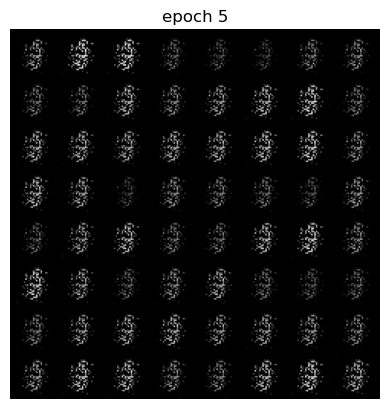

Epoch 5 of 100
Generator loss: 1.91010892, Discriminator loss: 1.24368024


  1%|▍                                            | 1/117 [00:00<00:22,  5.25it/s]

tensor(1.0151, grad_fn=<AddBackward0>)


  3%|█▏                                           | 3/117 [00:00<00:11, 10.07it/s]

tensor(0.8210, grad_fn=<AddBackward0>)
tensor(0.6558, grad_fn=<AddBackward0>)
tensor(0.5707, grad_fn=<AddBackward0>)


  4%|█▉                                           | 5/117 [00:00<00:09, 12.04it/s]

tensor(0.5256, grad_fn=<AddBackward0>)
tensor(0.5127, grad_fn=<AddBackward0>)
tensor(0.5243, grad_fn=<AddBackward0>)


  6%|██▋                                          | 7/117 [00:00<00:08, 13.11it/s]

tensor(0.5399, grad_fn=<AddBackward0>)

  8%|███▍                                         | 9/117 [00:00<00:07, 13.76it/s]


tensor(0.5625, grad_fn=<AddBackward0>)
tensor(0.5894, grad_fn=<AddBackward0>)
tensor(0.6165, grad_fn=<AddBackward0>)


 11%|████▉                                       | 13/117 [00:00<00:07, 14.42it/s]

tensor(0.6410, grad_fn=<AddBackward0>)
tensor(0.6430, grad_fn=<AddBackward0>)
tensor(0.6838, grad_fn=<AddBackward0>)
tensor(0.7504, grad_fn=<AddBackward0>)


 15%|██████▍                                     | 17/117 [00:01<00:06, 14.73it/s]

tensor(0.8504, grad_fn=<AddBackward0>)
tensor(0.9442, grad_fn=<AddBackward0>)
tensor(1.0596, grad_fn=<AddBackward0>)
tensor(1.1783, grad_fn=<AddBackward0>)


 18%|███████▉                                    | 21/117 [00:01<00:06, 14.67it/s]

tensor(1.3099, grad_fn=<AddBackward0>)
tensor(1.4557, grad_fn=<AddBackward0>)
tensor(1.5825, grad_fn=<AddBackward0>)


 21%|█████████▍                                  | 25/117 [00:01<00:06, 14.79it/s]

tensor(1.7235, grad_fn=<AddBackward0>)
tensor(2.0355, grad_fn=<AddBackward0>)
tensor(2.0441, grad_fn=<AddBackward0>)
tensor(2.0425, grad_fn=<AddBackward0>)


 25%|██████████▉                                 | 29/117 [00:02<00:05, 14.86it/s]

tensor(2.1538, grad_fn=<AddBackward0>)
tensor(2.1941, grad_fn=<AddBackward0>)
tensor(2.1763, grad_fn=<AddBackward0>)


 26%|███████████▋                                | 31/117 [00:02<00:05, 14.80it/s]

tensor(2.1467, grad_fn=<AddBackward0>)
tensor(2.1236, grad_fn=<AddBackward0>)
tensor(2.0232, grad_fn=<AddBackward0>)


 30%|█████████████▏                              | 35/117 [00:02<00:05, 14.90it/s]

tensor(1.9304, grad_fn=<AddBackward0>)
tensor(1.8299, grad_fn=<AddBackward0>)
tensor(1.8268, grad_fn=<AddBackward0>)
tensor(1.7036, grad_fn=<AddBackward0>)


 33%|██████████████▋                             | 39/117 [00:02<00:05, 14.90it/s]

tensor(1.6681, grad_fn=<AddBackward0>)
tensor(1.5991, grad_fn=<AddBackward0>)
tensor(1.5778, grad_fn=<AddBackward0>)


 35%|███████████████▍                            | 41/117 [00:02<00:05, 14.92it/s]

tensor(1.5364, grad_fn=<AddBackward0>)
tensor(1.4662, grad_fn=<AddBackward0>)
tensor(1.4217, grad_fn=<AddBackward0>)
tensor(1.3780, grad_fn=<AddBackward0>)


 38%|████████████████▉                           | 45/117 [00:03<00:04, 14.92it/s]

tensor(1.3105, grad_fn=<AddBackward0>)
tensor(1.2913, grad_fn=<AddBackward0>)
tensor(1.2289, grad_fn=<AddBackward0>)
tensor(1.1763, grad_fn=<AddBackward0>)


 42%|██████████████████▍                         | 49/117 [00:03<00:04, 14.92it/s]

tensor(1.0985, grad_fn=<AddBackward0>)
tensor(1.0425, grad_fn=<AddBackward0>)
tensor(1.0167, grad_fn=<AddBackward0>)
tensor(0.9771, grad_fn=<AddBackward0>)


 45%|███████████████████▉                        | 53/117 [00:03<00:04, 14.94it/s]

tensor(0.8976, grad_fn=<AddBackward0>)
tensor(0.8437, grad_fn=<AddBackward0>)
tensor(0.7812, grad_fn=<AddBackward0>)


 49%|█████████████████████▍                      | 57/117 [00:03<00:04, 14.91it/s]

tensor(0.7506, grad_fn=<AddBackward0>)
tensor(0.7036, grad_fn=<AddBackward0>)
tensor(0.6409, grad_fn=<AddBackward0>)
tensor(0.6071, grad_fn=<AddBackward0>)


 52%|██████████████████████▉                     | 61/117 [00:04<00:03, 14.95it/s]

tensor(0.6153, grad_fn=<AddBackward0>)
tensor(0.6419, grad_fn=<AddBackward0>)
tensor(0.6477, grad_fn=<AddBackward0>)
tensor(0.6313, grad_fn=<AddBackward0>)


 54%|███████████████████████▋                    | 63/117 [00:04<00:03, 14.96it/s]

tensor(0.7099, grad_fn=<AddBackward0>)
tensor(0.7395, grad_fn=<AddBackward0>)
tensor(0.7993, grad_fn=<AddBackward0>)


 57%|█████████████████████████▏                  | 67/117 [00:04<00:03, 13.68it/s]

tensor(0.8550, grad_fn=<AddBackward0>)
tensor(0.8887, grad_fn=<AddBackward0>)
tensor(0.9837, grad_fn=<AddBackward0>)
tensor(1.0350, grad_fn=<AddBackward0>)


 61%|██████████████████████████▋                 | 71/117 [00:04<00:03, 14.29it/s]

tensor(1.1216, grad_fn=<AddBackward0>)
tensor(1.2079, grad_fn=<AddBackward0>)
tensor(1.2678, grad_fn=<AddBackward0>)
tensor(1.2664, grad_fn=<AddBackward0>)


 64%|████████████████████████████▏               | 75/117 [00:05<00:02, 14.67it/s]

tensor(1.2912, grad_fn=<AddBackward0>)
tensor(1.3104, grad_fn=<AddBackward0>)
tensor(1.3100, grad_fn=<AddBackward0>)
tensor(1.2878, grad_fn=<AddBackward0>)


 68%|█████████████████████████████▋              | 79/117 [00:05<00:02, 14.79it/s]

tensor(1.2526, grad_fn=<AddBackward0>)
tensor(1.1471, grad_fn=<AddBackward0>)
tensor(1.1114, grad_fn=<AddBackward0>)
tensor(0.9988, grad_fn=<AddBackward0>)


 71%|███████████████████████████████▏            | 83/117 [00:05<00:02, 14.89it/s]

tensor(0.8963, grad_fn=<AddBackward0>)
tensor(0.8571, grad_fn=<AddBackward0>)
tensor(0.8371, grad_fn=<AddBackward0>)
tensor(0.7672, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▋           | 87/117 [00:06<00:02, 14.90it/s]

tensor(0.8190, grad_fn=<AddBackward0>)
tensor(0.8016, grad_fn=<AddBackward0>)
tensor(0.8096, grad_fn=<AddBackward0>)
tensor(0.8143, grad_fn=<AddBackward0>)


 78%|██████████████████████████████████▏         | 91/117 [00:06<00:01, 14.94it/s]

tensor(0.8994, grad_fn=<AddBackward0>)
tensor(0.9036, grad_fn=<AddBackward0>)
tensor(1.0100, grad_fn=<AddBackward0>)
tensor(1.0555, grad_fn=<AddBackward0>)


 81%|███████████████████████████████████▋        | 95/117 [00:06<00:01, 14.84it/s]

tensor(1.1405, grad_fn=<AddBackward0>)
tensor(1.2109, grad_fn=<AddBackward0>)
tensor(1.3192, grad_fn=<AddBackward0>)
tensor(1.3889, grad_fn=<AddBackward0>)


 85%|█████████████████████████████████████▏      | 99/117 [00:06<00:01, 14.93it/s]

tensor(1.4005, grad_fn=<AddBackward0>)
tensor(1.4512, grad_fn=<AddBackward0>)
tensor(1.4503, grad_fn=<AddBackward0>)
tensor(1.3856, grad_fn=<AddBackward0>)


 88%|█████████████████████████████████████▊     | 103/117 [00:07<00:00, 14.87it/s]

tensor(1.3970, grad_fn=<AddBackward0>)
tensor(1.4089, grad_fn=<AddBackward0>)
tensor(1.3674, grad_fn=<AddBackward0>)


 91%|███████████████████████████████████████▎   | 107/117 [00:07<00:00, 14.89it/s]

tensor(1.3619, grad_fn=<AddBackward0>)
tensor(1.3083, grad_fn=<AddBackward0>)
tensor(1.2249, grad_fn=<AddBackward0>)


 93%|████████████████████████████████████████   | 109/117 [00:07<00:00, 14.87it/s]

tensor(1.0923, grad_fn=<AddBackward0>)
tensor(1.0310, grad_fn=<AddBackward0>)
tensor(0.9550, grad_fn=<AddBackward0>)
tensor(0.8385, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▌ | 113/117 [00:07<00:00, 14.87it/s]

tensor(0.7935, grad_fn=<AddBackward0>)
tensor(0.6937, grad_fn=<AddBackward0>)
tensor(0.6546, grad_fn=<AddBackward0>)
tensor(0.5924, grad_fn=<AddBackward0>)


118it [00:08, 14.66it/s]                                                          


tensor(0.5483, grad_fn=<AddBackward0>)
tensor(0.5403, grad_fn=<AddBackward0>)
tensor(0.5335, grad_fn=<AddBackward0>)
Epoch 6 of 100
Generator loss: 2.01388049, Discriminator loss: 1.12546968


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.5061, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.84it/s]

tensor(0.5391, grad_fn=<AddBackward0>)
tensor(0.5580, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.84it/s]

tensor(0.5905, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.85it/s]

tensor(0.6936, grad_fn=<AddBackward0>)
tensor(0.7487, grad_fn=<AddBackward0>)
tensor(0.8683, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.80it/s]

tensor(0.9816, grad_fn=<AddBackward0>)
tensor(1.2532, grad_fn=<AddBackward0>)
tensor(1.5455, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.86it/s]

tensor(1.8996, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.91it/s]

tensor(2.2796, grad_fn=<AddBackward0>)
tensor(2.6176, grad_fn=<AddBackward0>)
tensor(2.8792, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.99it/s]

tensor(2.9583, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.93it/s]

tensor(2.9621, grad_fn=<AddBackward0>)
tensor(2.8343, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.88it/s]

tensor(2.7301, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.85it/s]

tensor(2.4531, grad_fn=<AddBackward0>)
tensor(2.2285, grad_fn=<AddBackward0>)
tensor(1.9326, grad_fn=<AddBackward0>)
tensor(1.7122, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.88it/s]

tensor(1.3698, grad_fn=<AddBackward0>)
tensor(1.0722, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.93it/s]

tensor(0.8671, grad_fn=<AddBackward0>)
tensor(0.7044, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.91it/s]

tensor(0.6104, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.88it/s]

tensor(0.5537, grad_fn=<AddBackward0>)
tensor(0.5251, grad_fn=<AddBackward0>)
tensor(0.5231, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.94it/s]

tensor(0.5332, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.95it/s]

tensor(0.5629, grad_fn=<AddBackward0>)
tensor(0.6243, grad_fn=<AddBackward0>)
tensor(0.7047, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.95it/s]

tensor(0.7872, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.92it/s]

tensor(0.8567, grad_fn=<AddBackward0>)
tensor(1.0337, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.91it/s]

tensor(1.1805, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.84it/s]

tensor(1.3867, grad_fn=<AddBackward0>)
tensor(1.5219, grad_fn=<AddBackward0>)
tensor(1.6845, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.84it/s]

tensor(1.6789, grad_fn=<AddBackward0>)
tensor(1.6064, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.77it/s]

tensor(1.5491, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.84it/s]

tensor(1.4294, grad_fn=<AddBackward0>)
tensor(1.2494, grad_fn=<AddBackward0>)
tensor(1.1251, grad_fn=<AddBackward0>)
tensor(0.9553, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.88it/s]

tensor(0.9242, grad_fn=<AddBackward0>)
tensor(0.9082, grad_fn=<AddBackward0>)
tensor(0.8764, grad_fn=<AddBackward0>)
tensor(0.9444, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.89it/s]

tensor(0.9777, grad_fn=<AddBackward0>)
tensor(1.1400, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.91it/s]

tensor(1.2455, grad_fn=<AddBackward0>)
tensor(1.4904, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.91it/s]

tensor(1.6096, grad_fn=<AddBackward0>)
tensor(1.7385, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.88it/s]

tensor(1.7541, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.85it/s]

tensor(1.7684, grad_fn=<AddBackward0>)
tensor(1.7123, grad_fn=<AddBackward0>)
tensor(1.6207, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.94it/s]

tensor(1.5161, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.93it/s]

tensor(1.4071, grad_fn=<AddBackward0>)
tensor(1.3571, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.88it/s]

tensor(1.2551, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.90it/s]

tensor(1.2081, grad_fn=<AddBackward0>)
tensor(1.2282, grad_fn=<AddBackward0>)
tensor(1.1230, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.87it/s]

tensor(1.1809, grad_fn=<AddBackward0>)
tensor(1.1631, grad_fn=<AddBackward0>)
tensor(1.2077, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.84it/s]

tensor(1.1764, grad_fn=<AddBackward0>)
tensor(1.2574, grad_fn=<AddBackward0>)
tensor(1.2285, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.82it/s]

tensor(1.3072, grad_fn=<AddBackward0>)
tensor(1.3243, grad_fn=<AddBackward0>)
tensor(1.2820, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.86it/s]

tensor(1.2691, grad_fn=<AddBackward0>)
tensor(1.2240, grad_fn=<AddBackward0>)
tensor(1.2360, grad_fn=<AddBackward0>)
tensor(1.2105, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.92it/s]

tensor(1.2280, grad_fn=<AddBackward0>)
tensor(1.2130, grad_fn=<AddBackward0>)
tensor(1.2179, grad_fn=<AddBackward0>)
tensor(1.2074, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.93it/s]

tensor(1.1531, grad_fn=<AddBackward0>)
tensor(1.2148, grad_fn=<AddBackward0>)
tensor(1.1838, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.74it/s]

tensor(1.1694, grad_fn=<AddBackward0>)
tensor(1.1998, grad_fn=<AddBackward0>)
tensor(1.2360, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.61it/s]

tensor(1.1370, grad_fn=<AddBackward0>)
tensor(1.1935, grad_fn=<AddBackward0>)
tensor(1.1424, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.60it/s]

tensor(1.1318, grad_fn=<AddBackward0>)
tensor(1.0988, grad_fn=<AddBackward0>)
tensor(1.1111, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.37it/s]

tensor(1.0931, grad_fn=<AddBackward0>)
tensor(1.1378, grad_fn=<AddBackward0>)
tensor(1.1848, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.70it/s]

tensor(1.1813, grad_fn=<AddBackward0>)
tensor(1.2228, grad_fn=<AddBackward0>)
tensor(1.2817, grad_fn=<AddBackward0>)
tensor(1.2959, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.87it/s]

tensor(1.3360, grad_fn=<AddBackward0>)
tensor(1.3339, grad_fn=<AddBackward0>)
tensor(1.3521, grad_fn=<AddBackward0>)
tensor(1.3693, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.91it/s]

tensor(1.3942, grad_fn=<AddBackward0>)
tensor(1.4276, grad_fn=<AddBackward0>)
tensor(1.4151, grad_fn=<AddBackward0>)
tensor(1.4208, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.94it/s]

tensor(1.4193, grad_fn=<AddBackward0>)
tensor(1.4181, grad_fn=<AddBackward0>)
tensor(1.4179, grad_fn=<AddBackward0>)


118it [00:07, 14.93it/s]                                                          


tensor(1.3813, grad_fn=<AddBackward0>)
tensor(1.3445, grad_fn=<AddBackward0>)
Epoch 7 of 100
Generator loss: 1.78330040, Discriminator loss: 1.31286335


  2%|▊                                            | 2/117 [00:00<00:07, 14.84it/s]

tensor(1.3257, grad_fn=<AddBackward0>)
tensor(1.3194, grad_fn=<AddBackward0>)
tensor(1.3483, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.71it/s]

tensor(1.2832, grad_fn=<AddBackward0>)
tensor(1.3294, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.75it/s]

tensor(1.2720, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.83it/s]

tensor(1.2520, grad_fn=<AddBackward0>)
tensor(1.1785, grad_fn=<AddBackward0>)
tensor(1.1512, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.79it/s]

tensor(1.1965, grad_fn=<AddBackward0>)
tensor(1.1328, grad_fn=<AddBackward0>)
tensor(1.1253, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.84it/s]

tensor(1.0682, grad_fn=<AddBackward0>)
tensor(1.1076, grad_fn=<AddBackward0>)
tensor(1.0338, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.93it/s]

tensor(1.0017, grad_fn=<AddBackward0>)
tensor(0.9842, grad_fn=<AddBackward0>)
tensor(0.9590, grad_fn=<AddBackward0>)
tensor(0.9742, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.92it/s]

tensor(0.9231, grad_fn=<AddBackward0>)
tensor(0.9548, grad_fn=<AddBackward0>)
tensor(0.9589, grad_fn=<AddBackward0>)
tensor(0.9597, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.97it/s]

tensor(0.9576, grad_fn=<AddBackward0>)
tensor(0.9411, grad_fn=<AddBackward0>)
tensor(0.9599, grad_fn=<AddBackward0>)
tensor(0.9703, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.99it/s]

tensor(0.9729, grad_fn=<AddBackward0>)
tensor(0.9767, grad_fn=<AddBackward0>)
tensor(1.0161, grad_fn=<AddBackward0>)
tensor(1.0285, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(1.0575, grad_fn=<AddBackward0>)
tensor(1.0483, grad_fn=<AddBackward0>)
tensor(1.0888, grad_fn=<AddBackward0>)
tensor(1.1468, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.99it/s]

tensor(1.1845, grad_fn=<AddBackward0>)
tensor(1.2021, grad_fn=<AddBackward0>)
tensor(1.2357, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.95it/s]

tensor(1.2624, grad_fn=<AddBackward0>)
tensor(1.3362, grad_fn=<AddBackward0>)
tensor(1.3291, grad_fn=<AddBackward0>)
tensor(1.3626, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.93it/s]

tensor(1.4142, grad_fn=<AddBackward0>)
tensor(1.3776, grad_fn=<AddBackward0>)
tensor(1.4288, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.89it/s]

tensor(1.3800, grad_fn=<AddBackward0>)
tensor(1.3927, grad_fn=<AddBackward0>)
tensor(1.3080, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.88it/s]

tensor(1.3256, grad_fn=<AddBackward0>)
tensor(1.2545, grad_fn=<AddBackward0>)
tensor(1.2451, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.80it/s]

tensor(1.1804, grad_fn=<AddBackward0>)
tensor(1.1420, grad_fn=<AddBackward0>)
tensor(1.1456, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.73it/s]

tensor(1.1204, grad_fn=<AddBackward0>)
tensor(1.1090, grad_fn=<AddBackward0>)
tensor(1.0664, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.84it/s]

tensor(1.0459, grad_fn=<AddBackward0>)
tensor(1.0367, grad_fn=<AddBackward0>)
tensor(1.0510, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.83it/s]

tensor(1.0483, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)
tensor(1.0400, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.87it/s]

tensor(1.0265, grad_fn=<AddBackward0>)
tensor(1.0055, grad_fn=<AddBackward0>)
tensor(0.9331, grad_fn=<AddBackward0>)
tensor(0.9113, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.95it/s]

tensor(0.8865, grad_fn=<AddBackward0>)
tensor(0.8345, grad_fn=<AddBackward0>)
tensor(0.8150, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.88it/s]

tensor(0.7745, grad_fn=<AddBackward0>)
tensor(0.7228, grad_fn=<AddBackward0>)
tensor(0.6628, grad_fn=<AddBackward0>)
tensor(0.6403, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.94it/s]

tensor(0.6315, grad_fn=<AddBackward0>)
tensor(0.5941, grad_fn=<AddBackward0>)
tensor(0.5969, grad_fn=<AddBackward0>)
tensor(0.5781, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.00it/s]

tensor(0.5926, grad_fn=<AddBackward0>)
tensor(0.6221, grad_fn=<AddBackward0>)
tensor(0.6397, grad_fn=<AddBackward0>)
tensor(0.7238, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.88it/s]

tensor(0.7959, grad_fn=<AddBackward0>)
tensor(0.8690, grad_fn=<AddBackward0>)
tensor(0.9945, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.76it/s]

tensor(1.1359, grad_fn=<AddBackward0>)
tensor(1.2207, grad_fn=<AddBackward0>)
tensor(1.3717, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.76it/s]

tensor(1.5225, grad_fn=<AddBackward0>)
tensor(1.5693, grad_fn=<AddBackward0>)
tensor(1.6741, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.85it/s]

tensor(1.8152, grad_fn=<AddBackward0>)
tensor(1.8519, grad_fn=<AddBackward0>)
tensor(1.9066, grad_fn=<AddBackward0>)
tensor(1.8911, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.87it/s]

tensor(1.9018, grad_fn=<AddBackward0>)
tensor(1.8368, grad_fn=<AddBackward0>)
tensor(1.7498, grad_fn=<AddBackward0>)
tensor(1.7013, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.88it/s]

tensor(1.6919, grad_fn=<AddBackward0>)
tensor(1.8929, grad_fn=<AddBackward0>)
tensor(1.8167, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.85it/s]

tensor(1.8034, grad_fn=<AddBackward0>)
tensor(1.7297, grad_fn=<AddBackward0>)
tensor(1.6454, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.87it/s]

tensor(1.5194, grad_fn=<AddBackward0>)
tensor(1.4687, grad_fn=<AddBackward0>)
tensor(1.3985, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.76it/s]

tensor(1.2991, grad_fn=<AddBackward0>)
tensor(1.1689, grad_fn=<AddBackward0>)
tensor(1.1946, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.86it/s]

tensor(1.2875, grad_fn=<AddBackward0>)
tensor(1.3121, grad_fn=<AddBackward0>)
tensor(1.3505, grad_fn=<AddBackward0>)
tensor(1.3876, grad_fn=<AddBackward0>)


118it [00:07, 14.95it/s]                                                          


tensor(1.3882, grad_fn=<AddBackward0>)
tensor(1.3381, grad_fn=<AddBackward0>)
tensor(1.3190, grad_fn=<AddBackward0>)
Epoch 8 of 100
Generator loss: 1.76915550, Discriminator loss: 1.19709229


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.3852, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.65it/s]

tensor(1.4324, grad_fn=<AddBackward0>)
tensor(1.4375, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.84it/s]

tensor(1.5412, grad_fn=<AddBackward0>)
tensor(1.5646, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.84it/s]

tensor(1.5342, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.85it/s]

tensor(1.5867, grad_fn=<AddBackward0>)
tensor(1.6638, grad_fn=<AddBackward0>)
tensor(1.6529, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.84it/s]

tensor(1.7281, grad_fn=<AddBackward0>)
tensor(1.8529, grad_fn=<AddBackward0>)
tensor(1.7259, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.91it/s]

tensor(1.8245, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.82it/s]

tensor(1.8133, grad_fn=<AddBackward0>)
tensor(1.7800, grad_fn=<AddBackward0>)
tensor(1.8543, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:07, 13.22it/s]

tensor(1.8140, grad_fn=<AddBackward0>)
tensor(1.8568, grad_fn=<AddBackward0>)
tensor(1.8255, grad_fn=<AddBackward0>)
tensor(1.7441, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:07, 13.73it/s]

tensor(1.7555, grad_fn=<AddBackward0>)
tensor(1.6767, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.04it/s]

tensor(1.6798, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.32it/s]

tensor(1.6326, grad_fn=<AddBackward0>)
tensor(1.6592, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.46it/s]

tensor(1.6475, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.57it/s]

tensor(1.5405, grad_fn=<AddBackward0>)
tensor(1.5607, grad_fn=<AddBackward0>)
tensor(1.5131, grad_fn=<AddBackward0>)
tensor(1.4856, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.70it/s]

tensor(1.4885, grad_fn=<AddBackward0>)
tensor(1.4912, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.73it/s]

tensor(1.4262, grad_fn=<AddBackward0>)
tensor(1.4552, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.80it/s]

tensor(1.4121, grad_fn=<AddBackward0>)
tensor(1.4194, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.84it/s]

tensor(1.3588, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.82it/s]

tensor(1.3953, grad_fn=<AddBackward0>)
tensor(1.3547, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.83it/s]

tensor(1.3583, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.86it/s]

tensor(1.3175, grad_fn=<AddBackward0>)
tensor(1.3283, grad_fn=<AddBackward0>)
tensor(1.3036, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:04, 14.82it/s]

tensor(1.2727, grad_fn=<AddBackward0>)
tensor(1.2805, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.59it/s]

tensor(1.2470, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.62it/s]

tensor(1.2352, grad_fn=<AddBackward0>)
tensor(1.2065, grad_fn=<AddBackward0>)
tensor(1.1923, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.64it/s]

tensor(1.1679, grad_fn=<AddBackward0>)
tensor(1.1481, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.45it/s]

tensor(1.1393, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.47it/s]

tensor(1.1026, grad_fn=<AddBackward0>)
tensor(1.0985, grad_fn=<AddBackward0>)
tensor(1.0788, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.54it/s]

tensor(1.0209, grad_fn=<AddBackward0>)
tensor(1.0385, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:04<00:04, 14.62it/s]

tensor(1.0117, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.70it/s]

tensor(1.0086, grad_fn=<AddBackward0>)
tensor(0.9840, grad_fn=<AddBackward0>)
tensor(0.9619, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.68it/s]

tensor(0.9374, grad_fn=<AddBackward0>)
tensor(0.9026, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.72it/s]

tensor(0.9006, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.80it/s]

tensor(0.8997, grad_fn=<AddBackward0>)
tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.8370, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.47it/s]

tensor(0.8336, grad_fn=<AddBackward0>)
tensor(0.8199, grad_fn=<AddBackward0>)
tensor(0.7990, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.49it/s]

tensor(0.7991, grad_fn=<AddBackward0>)
tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.7807, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.63it/s]

tensor(0.7589, grad_fn=<AddBackward0>)
tensor(0.7433, grad_fn=<AddBackward0>)
tensor(0.7392, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.73it/s]

tensor(0.7336, grad_fn=<AddBackward0>)
tensor(0.7406, grad_fn=<AddBackward0>)
tensor(0.7106, grad_fn=<AddBackward0>)
tensor(0.7177, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.85it/s]

tensor(0.7298, grad_fn=<AddBackward0>)
tensor(0.7135, grad_fn=<AddBackward0>)
tensor(0.7266, grad_fn=<AddBackward0>)
tensor(0.7136, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.92it/s]

tensor(0.7123, grad_fn=<AddBackward0>)
tensor(0.7115, grad_fn=<AddBackward0>)
tensor(0.7194, grad_fn=<AddBackward0>)
tensor(0.7101, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.90it/s]

tensor(0.7361, grad_fn=<AddBackward0>)
tensor(0.7405, grad_fn=<AddBackward0>)
tensor(0.7474, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.81it/s]

tensor(0.7644, grad_fn=<AddBackward0>)
tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.81it/s]

tensor(0.8128, grad_fn=<AddBackward0>)
tensor(0.8155, grad_fn=<AddBackward0>)
tensor(0.8346, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.52it/s]

tensor(0.8868, grad_fn=<AddBackward0>)
tensor(0.8793, grad_fn=<AddBackward0>)
tensor(0.9016, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:07<00:01, 14.39it/s]

tensor(0.8974, grad_fn=<AddBackward0>)
tensor(0.9375, grad_fn=<AddBackward0>)
tensor(0.9155, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.49it/s]

tensor(0.9476, grad_fn=<AddBackward0>)
tensor(0.9664, grad_fn=<AddBackward0>)
tensor(0.9854, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.68it/s]

tensor(1.0209, grad_fn=<AddBackward0>)
tensor(1.0483, grad_fn=<AddBackward0>)
tensor(1.0438, grad_fn=<AddBackward0>)
tensor(1.0641, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.79it/s]

tensor(1.0676, grad_fn=<AddBackward0>)
tensor(1.0860, grad_fn=<AddBackward0>)
tensor(1.1382, grad_fn=<AddBackward0>)
tensor(1.1469, grad_fn=<AddBackward0>)


118it [00:08, 14.68it/s]                                                          


tensor(1.1716, grad_fn=<AddBackward0>)
tensor(1.1829, grad_fn=<AddBackward0>)
tensor(1.2353, grad_fn=<AddBackward0>)
tensor(1.3651, grad_fn=<AddBackward0>)
Epoch 9 of 100
Generator loss: 1.28832710, Discriminator loss: 1.17937279


  2%|▊                                            | 2/117 [00:00<00:07, 15.01it/s]

tensor(1.2823, grad_fn=<AddBackward0>)
tensor(1.2645, grad_fn=<AddBackward0>)
tensor(1.2745, grad_fn=<AddBackward0>)
tensor(1.3330, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.95it/s]

tensor(1.3348, grad_fn=<AddBackward0>)
tensor(1.3455, grad_fn=<AddBackward0>)
tensor(1.3112, grad_fn=<AddBackward0>)
tensor(1.3563, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.04it/s]

tensor(1.3712, grad_fn=<AddBackward0>)
tensor(1.3852, grad_fn=<AddBackward0>)
tensor(1.4784, grad_fn=<AddBackward0>)
tensor(1.4798, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.76it/s]

tensor(1.5076, grad_fn=<AddBackward0>)
tensor(1.5763, grad_fn=<AddBackward0>)
tensor(1.4899, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.78it/s]

tensor(1.5677, grad_fn=<AddBackward0>)
tensor(1.5802, grad_fn=<AddBackward0>)
tensor(1.6844, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.85it/s]

tensor(1.5902, grad_fn=<AddBackward0>)
tensor(1.6446, grad_fn=<AddBackward0>)
tensor(1.6610, grad_fn=<AddBackward0>)
tensor(1.6685, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.54it/s]

tensor(1.6372, grad_fn=<AddBackward0>)
tensor(1.6459, grad_fn=<AddBackward0>)
tensor(1.5785, grad_fn=<AddBackward0>)
tensor(1.5873, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.34it/s]

tensor(1.5125, grad_fn=<AddBackward0>)
tensor(1.4346, grad_fn=<AddBackward0>)
tensor(1.4681, grad_fn=<AddBackward0>)
tensor(1.3803, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.58it/s]

tensor(1.3456, grad_fn=<AddBackward0>)
tensor(1.3199, grad_fn=<AddBackward0>)
tensor(1.2939, grad_fn=<AddBackward0>)
tensor(1.2424, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.72it/s]

tensor(1.1831, grad_fn=<AddBackward0>)
tensor(1.1921, grad_fn=<AddBackward0>)
tensor(1.1090, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.87it/s]

tensor(1.1053, grad_fn=<AddBackward0>)
tensor(1.1219, grad_fn=<AddBackward0>)
tensor(1.0521, grad_fn=<AddBackward0>)
tensor(1.0181, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.89it/s]

tensor(1.0116, grad_fn=<AddBackward0>)
tensor(0.9906, grad_fn=<AddBackward0>)
tensor(0.9889, grad_fn=<AddBackward0>)
tensor(0.9448, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.90it/s]

tensor(0.9309, grad_fn=<AddBackward0>)
tensor(0.9341, grad_fn=<AddBackward0>)
tensor(0.9377, grad_fn=<AddBackward0>)
tensor(0.9049, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.93it/s]

tensor(0.9287, grad_fn=<AddBackward0>)
tensor(0.9365, grad_fn=<AddBackward0>)
tensor(0.9599, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.92it/s]

tensor(0.9620, grad_fn=<AddBackward0>)
tensor(0.9996, grad_fn=<AddBackward0>)
tensor(1.0016, grad_fn=<AddBackward0>)
tensor(1.0420, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.61it/s]

tensor(1.0921, grad_fn=<AddBackward0>)
tensor(1.0856, grad_fn=<AddBackward0>)
tensor(1.1261, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 13.99it/s]

tensor(1.1381, grad_fn=<AddBackward0>)
tensor(1.1279, grad_fn=<AddBackward0>)
tensor(1.1158, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.01it/s]

tensor(1.0703, grad_fn=<AddBackward0>)
tensor(1.0241, grad_fn=<AddBackward0>)
tensor(0.9895, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.30it/s]

tensor(0.9237, grad_fn=<AddBackward0>)
tensor(0.8030, grad_fn=<AddBackward0>)
tensor(0.7185, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.35it/s]

tensor(0.6639, grad_fn=<AddBackward0>)
tensor(0.6549, grad_fn=<AddBackward0>)
tensor(0.6662, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.66it/s]

tensor(0.6765, grad_fn=<AddBackward0>)
tensor(0.6812, grad_fn=<AddBackward0>)
tensor(0.6976, grad_fn=<AddBackward0>)
tensor(0.7172, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.81it/s]

tensor(0.8045, grad_fn=<AddBackward0>)
tensor(0.7923, grad_fn=<AddBackward0>)
tensor(0.9222, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.80it/s]

tensor(0.9734, grad_fn=<AddBackward0>)
tensor(1.0696, grad_fn=<AddBackward0>)
tensor(1.2399, grad_fn=<AddBackward0>)
tensor(1.2793, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.97it/s]

tensor(1.5444, grad_fn=<AddBackward0>)
tensor(1.7018, grad_fn=<AddBackward0>)
tensor(1.7747, grad_fn=<AddBackward0>)
tensor(1.8841, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.98it/s]

tensor(1.9832, grad_fn=<AddBackward0>)
tensor(1.9849, grad_fn=<AddBackward0>)
tensor(2.0395, grad_fn=<AddBackward0>)
tensor(2.0106, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.98it/s]

tensor(1.9296, grad_fn=<AddBackward0>)
tensor(1.8674, grad_fn=<AddBackward0>)
tensor(1.8268, grad_fn=<AddBackward0>)
tensor(1.7549, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.96it/s]

tensor(1.7597, grad_fn=<AddBackward0>)
tensor(1.6725, grad_fn=<AddBackward0>)
tensor(1.6175, grad_fn=<AddBackward0>)
tensor(1.5730, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.00it/s]

tensor(1.5285, grad_fn=<AddBackward0>)
tensor(1.5269, grad_fn=<AddBackward0>)
tensor(1.4562, grad_fn=<AddBackward0>)
tensor(1.4323, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.93it/s]

tensor(1.4028, grad_fn=<AddBackward0>)
tensor(1.3630, grad_fn=<AddBackward0>)
tensor(1.3347, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.92it/s]

tensor(1.2850, grad_fn=<AddBackward0>)
tensor(1.2739, grad_fn=<AddBackward0>)
tensor(1.2080, grad_fn=<AddBackward0>)
tensor(1.1683, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.01it/s]

tensor(1.1369, grad_fn=<AddBackward0>)
tensor(1.1037, grad_fn=<AddBackward0>)
tensor(1.0676, grad_fn=<AddBackward0>)
tensor(1.0272, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.98it/s]

tensor(1.0023, grad_fn=<AddBackward0>)
tensor(0.9664, grad_fn=<AddBackward0>)
tensor(0.9484, grad_fn=<AddBackward0>)


118it [00:07, 14.85it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9311, grad_fn=<AddBackward0>)
tensor(0.8963, grad_fn=<AddBackward0>)


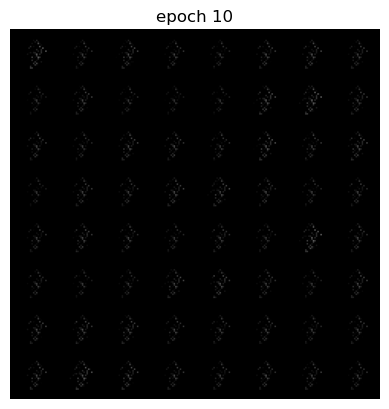

Epoch 10 of 100
Generator loss: 1.17327368, Discriminator loss: 1.27287292


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8958, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.49it/s]

tensor(0.8830, grad_fn=<AddBackward0>)
tensor(0.8684, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.52it/s]

tensor(0.8545, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.73it/s]

tensor(0.8282, grad_fn=<AddBackward0>)
tensor(0.8362, grad_fn=<AddBackward0>)
tensor(0.8287, grad_fn=<AddBackward0>)
tensor(0.8275, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.83it/s]

tensor(0.8053, grad_fn=<AddBackward0>)
tensor(0.8135, grad_fn=<AddBackward0>)
tensor(0.8082, grad_fn=<AddBackward0>)
tensor(0.8230, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.89it/s]

tensor(0.8199, grad_fn=<AddBackward0>)
tensor(0.8093, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.89it/s]

tensor(0.8445, grad_fn=<AddBackward0>)
tensor(0.8489, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.90it/s]

tensor(0.8518, grad_fn=<AddBackward0>)
tensor(0.8569, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.93it/s]

tensor(0.8709, grad_fn=<AddBackward0>)
tensor(0.8984, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.93it/s]

tensor(0.9356, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.91it/s]

tensor(0.9337, grad_fn=<AddBackward0>)
tensor(0.9818, grad_fn=<AddBackward0>)
tensor(0.9936, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.92it/s]

tensor(1.0346, grad_fn=<AddBackward0>)

 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.91it/s]


tensor(1.0477, grad_fn=<AddBackward0>)
tensor(1.0698, grad_fn=<AddBackward0>)
tensor(1.1436, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.98it/s]

tensor(1.2113, grad_fn=<AddBackward0>)
tensor(1.2220, grad_fn=<AddBackward0>)
tensor(1.2464, grad_fn=<AddBackward0>)
tensor(1.2810, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.02it/s]

tensor(1.3312, grad_fn=<AddBackward0>)
tensor(1.3360, grad_fn=<AddBackward0>)
tensor(1.3764, grad_fn=<AddBackward0>)
tensor(1.3998, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.99it/s]

tensor(1.3792, grad_fn=<AddBackward0>)
tensor(1.3944, grad_fn=<AddBackward0>)
tensor(1.3721, grad_fn=<AddBackward0>)
tensor(1.3283, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.06it/s]

tensor(1.3628, grad_fn=<AddBackward0>)
tensor(1.3410, grad_fn=<AddBackward0>)
tensor(1.3715, grad_fn=<AddBackward0>)
tensor(1.3233, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.06it/s]

tensor(1.3571, grad_fn=<AddBackward0>)
tensor(1.3520, grad_fn=<AddBackward0>)
tensor(1.3262, grad_fn=<AddBackward0>)
tensor(1.3425, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.02it/s]

tensor(1.3545, grad_fn=<AddBackward0>)
tensor(1.3305, grad_fn=<AddBackward0>)
tensor(1.3167, grad_fn=<AddBackward0>)
tensor(1.3455, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.97it/s]

tensor(1.3044, grad_fn=<AddBackward0>)
tensor(1.3249, grad_fn=<AddBackward0>)
tensor(1.3189, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.97it/s]

tensor(1.3310, grad_fn=<AddBackward0>)
tensor(1.3086, grad_fn=<AddBackward0>)
tensor(1.3616, grad_fn=<AddBackward0>)
tensor(1.3389, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.02it/s]

tensor(1.3220, grad_fn=<AddBackward0>)
tensor(1.3577, grad_fn=<AddBackward0>)
tensor(1.3342, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.91it/s]

tensor(1.3137, grad_fn=<AddBackward0>)
tensor(1.3218, grad_fn=<AddBackward0>)
tensor(1.3094, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.89it/s]

tensor(1.2938, grad_fn=<AddBackward0>)
tensor(1.3073, grad_fn=<AddBackward0>)
tensor(1.2844, grad_fn=<AddBackward0>)
tensor(1.2581, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 15.00it/s]

tensor(1.2526, grad_fn=<AddBackward0>)
tensor(1.2541, grad_fn=<AddBackward0>)
tensor(1.3057, grad_fn=<AddBackward0>)
tensor(1.2366, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.03it/s]

tensor(1.2882, grad_fn=<AddBackward0>)
tensor(1.2435, grad_fn=<AddBackward0>)
tensor(1.2580, grad_fn=<AddBackward0>)
tensor(1.2675, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.02it/s]

tensor(1.2577, grad_fn=<AddBackward0>)
tensor(1.2306, grad_fn=<AddBackward0>)
tensor(1.2303, grad_fn=<AddBackward0>)
tensor(1.2231, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.08it/s]

tensor(1.2073, grad_fn=<AddBackward0>)
tensor(1.2274, grad_fn=<AddBackward0>)
tensor(1.2191, grad_fn=<AddBackward0>)
tensor(1.1772, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.05it/s]

tensor(1.1391, grad_fn=<AddBackward0>)
tensor(1.1429, grad_fn=<AddBackward0>)
tensor(1.1391, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.95it/s]

tensor(1.1066, grad_fn=<AddBackward0>)
tensor(1.0909, grad_fn=<AddBackward0>)
tensor(1.0831, grad_fn=<AddBackward0>)
tensor(1.0862, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.93it/s]

tensor(1.0533, grad_fn=<AddBackward0>)
tensor(1.0472, grad_fn=<AddBackward0>)
tensor(1.0052, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.63it/s]

tensor(1.0153, grad_fn=<AddBackward0>)
tensor(0.9803, grad_fn=<AddBackward0>)
tensor(0.9609, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.52it/s]

tensor(0.9393, grad_fn=<AddBackward0>)
tensor(0.9256, grad_fn=<AddBackward0>)
tensor(0.9447, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.42it/s]

tensor(0.9147, grad_fn=<AddBackward0>)
tensor(0.8840, grad_fn=<AddBackward0>)
tensor(0.8848, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.59it/s]

tensor(0.8741, grad_fn=<AddBackward0>)
tensor(0.8536, grad_fn=<AddBackward0>)
tensor(0.8627, grad_fn=<AddBackward0>)
tensor(0.8546, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.77it/s]

tensor(0.8516, grad_fn=<AddBackward0>)
tensor(0.8245, grad_fn=<AddBackward0>)
tensor(0.8423, grad_fn=<AddBackward0>)
tensor(0.7965, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.80it/s]

tensor(0.8248, grad_fn=<AddBackward0>)
tensor(0.7973, grad_fn=<AddBackward0>)
tensor(0.8230, grad_fn=<AddBackward0>)


118it [00:07, 14.98it/s]                                                          


tensor(0.7669, grad_fn=<AddBackward0>)
tensor(0.7821, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)
Epoch 11 of 100
Generator loss: 1.11258721, Discriminator loss: 1.11254144


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8187, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.85it/s]

tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.8144, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.86it/s]

tensor(0.8242, grad_fn=<AddBackward0>)
tensor(0.8654, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.88it/s]

tensor(0.8848, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.91it/s]

tensor(0.9376, grad_fn=<AddBackward0>)
tensor(0.9912, grad_fn=<AddBackward0>)
tensor(1.0926, grad_fn=<AddBackward0>)
tensor(1.1596, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.00it/s]

tensor(1.2738, grad_fn=<AddBackward0>)
tensor(1.3959, grad_fn=<AddBackward0>)
tensor(1.4638, grad_fn=<AddBackward0>)
tensor(1.5977, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.99it/s]

tensor(1.6553, grad_fn=<AddBackward0>)
tensor(1.8632, grad_fn=<AddBackward0>)
tensor(2.0208, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.89it/s]

tensor(2.0854, grad_fn=<AddBackward0>)
tensor(2.2658, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.92it/s]

tensor(2.2232, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.82it/s]

tensor(2.3858, grad_fn=<AddBackward0>)
tensor(2.4827, grad_fn=<AddBackward0>)
tensor(2.5169, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.82it/s]

tensor(2.4850, grad_fn=<AddBackward0>)
tensor(2.4329, grad_fn=<AddBackward0>)
tensor(2.4133, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.86it/s]

tensor(2.3678, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.91it/s]

tensor(2.3408, grad_fn=<AddBackward0>)
tensor(2.2766, grad_fn=<AddBackward0>)
tensor(2.2523, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.94it/s]

tensor(2.1929, grad_fn=<AddBackward0>)
tensor(2.1177, grad_fn=<AddBackward0>)
tensor(2.0294, grad_fn=<AddBackward0>)
tensor(1.9832, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.81it/s]

tensor(1.9281, grad_fn=<AddBackward0>)
tensor(1.8579, grad_fn=<AddBackward0>)
tensor(1.8045, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.72it/s]

tensor(1.7719, grad_fn=<AddBackward0>)
tensor(1.7127, grad_fn=<AddBackward0>)
tensor(1.6892, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.70it/s]

tensor(1.6478, grad_fn=<AddBackward0>)
tensor(1.6190, grad_fn=<AddBackward0>)
tensor(1.5796, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.79it/s]

tensor(1.5346, grad_fn=<AddBackward0>)
tensor(1.5171, grad_fn=<AddBackward0>)
tensor(1.4790, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.89it/s]

tensor(1.4510, grad_fn=<AddBackward0>)
tensor(1.4391, grad_fn=<AddBackward0>)
tensor(1.4086, grad_fn=<AddBackward0>)
tensor(1.3781, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.98it/s]

tensor(1.3686, grad_fn=<AddBackward0>)
tensor(1.3267, grad_fn=<AddBackward0>)
tensor(1.3238, grad_fn=<AddBackward0>)
tensor(1.2891, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.81it/s]

tensor(1.2649, grad_fn=<AddBackward0>)
tensor(1.2353, grad_fn=<AddBackward0>)
tensor(1.2072, grad_fn=<AddBackward0>)
tensor(1.1851, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.92it/s]

tensor(1.1792, grad_fn=<AddBackward0>)
tensor(1.1484, grad_fn=<AddBackward0>)
tensor(1.1198, grad_fn=<AddBackward0>)
tensor(1.0898, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.99it/s]

tensor(1.0535, grad_fn=<AddBackward0>)
tensor(1.0420, grad_fn=<AddBackward0>)
tensor(0.9936, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.83it/s]

tensor(0.9756, grad_fn=<AddBackward0>)
tensor(0.9441, grad_fn=<AddBackward0>)
tensor(0.9185, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.88it/s]

tensor(0.8956, grad_fn=<AddBackward0>)
tensor(0.8608, grad_fn=<AddBackward0>)
tensor(0.8548, grad_fn=<AddBackward0>)
tensor(0.8185, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.87it/s]

tensor(0.7866, grad_fn=<AddBackward0>)
tensor(0.7730, grad_fn=<AddBackward0>)
tensor(0.7453, grad_fn=<AddBackward0>)
tensor(0.7386, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.93it/s]

tensor(0.7208, grad_fn=<AddBackward0>)
tensor(0.7046, grad_fn=<AddBackward0>)
tensor(0.6965, grad_fn=<AddBackward0>)
tensor(0.6739, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.01it/s]

tensor(0.6680, grad_fn=<AddBackward0>)
tensor(0.6613, grad_fn=<AddBackward0>)
tensor(0.6642, grad_fn=<AddBackward0>)
tensor(0.6639, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.00it/s]

tensor(0.6658, grad_fn=<AddBackward0>)
tensor(0.6670, grad_fn=<AddBackward0>)
tensor(0.6725, grad_fn=<AddBackward0>)
tensor(0.6699, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.95it/s]

tensor(0.6908, grad_fn=<AddBackward0>)
tensor(0.7282, grad_fn=<AddBackward0>)
tensor(0.7311, grad_fn=<AddBackward0>)
tensor(0.7532, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.89it/s]

tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.7988, grad_fn=<AddBackward0>)
tensor(0.7921, grad_fn=<AddBackward0>)
tensor(0.8577, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.9234, grad_fn=<AddBackward0>)
tensor(1.0088, grad_fn=<AddBackward0>)
tensor(1.1043, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.87it/s]

tensor(1.1817, grad_fn=<AddBackward0>)
tensor(1.2675, grad_fn=<AddBackward0>)
tensor(1.4396, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.83it/s]

tensor(1.4992, grad_fn=<AddBackward0>)
tensor(1.5661, grad_fn=<AddBackward0>)
tensor(1.7989, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.84it/s]

tensor(1.9414, grad_fn=<AddBackward0>)
tensor(1.9596, grad_fn=<AddBackward0>)
tensor(2.0863, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.81it/s]

tensor(2.1109, grad_fn=<AddBackward0>)
tensor(2.0570, grad_fn=<AddBackward0>)
tensor(1.9981, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.92it/s]

tensor(1.9498, grad_fn=<AddBackward0>)
tensor(1.8814, grad_fn=<AddBackward0>)
tensor(1.7855, grad_fn=<AddBackward0>)
tensor(1.7269, grad_fn=<AddBackward0>)


118it [00:07, 14.96it/s]                                                          


tensor(1.6624, grad_fn=<AddBackward0>)
tensor(1.6404, grad_fn=<AddBackward0>)
tensor(1.6121, grad_fn=<AddBackward0>)
Epoch 12 of 100
Generator loss: 1.07758021, Discriminator loss: 1.39088726


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.6019, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.74it/s]

tensor(1.6248, grad_fn=<AddBackward0>)
tensor(1.5627, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.84it/s]

tensor(1.5376, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.84it/s]

tensor(1.5402, grad_fn=<AddBackward0>)
tensor(1.4947, grad_fn=<AddBackward0>)
tensor(1.4655, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.80it/s]

tensor(1.4716, grad_fn=<AddBackward0>)
tensor(1.4339, grad_fn=<AddBackward0>)
tensor(1.3922, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 13.73it/s]

tensor(1.3716, grad_fn=<AddBackward0>)
tensor(1.3634, grad_fn=<AddBackward0>)
tensor(1.3467, grad_fn=<AddBackward0>)
tensor(1.2893, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:07, 14.31it/s]

tensor(1.3072, grad_fn=<AddBackward0>)
tensor(1.2704, grad_fn=<AddBackward0>)
tensor(1.2580, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.47it/s]

tensor(1.2474, grad_fn=<AddBackward0>)
tensor(1.2147, grad_fn=<AddBackward0>)
tensor(1.2133, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.64it/s]

tensor(1.2108, grad_fn=<AddBackward0>)

 19%|████████▎                                   | 22/117 [00:01<00:06, 14.73it/s]


tensor(1.1926, grad_fn=<AddBackward0>)
tensor(1.1932, grad_fn=<AddBackward0>)
tensor(1.1526, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.91it/s]

tensor(1.1361, grad_fn=<AddBackward0>)
tensor(1.1571, grad_fn=<AddBackward0>)
tensor(1.1508, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.88it/s]

tensor(1.1276, grad_fn=<AddBackward0>)
tensor(1.1175, grad_fn=<AddBackward0>)
tensor(1.1232, grad_fn=<AddBackward0>)
tensor(1.1221, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.97it/s]

tensor(1.1114, grad_fn=<AddBackward0>)
tensor(1.1102, grad_fn=<AddBackward0>)
tensor(1.1219, grad_fn=<AddBackward0>)
tensor(1.1264, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.05it/s]

tensor(1.1181, grad_fn=<AddBackward0>)
tensor(1.1222, grad_fn=<AddBackward0>)
tensor(1.1187, grad_fn=<AddBackward0>)
tensor(1.1252, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.69it/s]

tensor(1.0946, grad_fn=<AddBackward0>)
tensor(1.0628, grad_fn=<AddBackward0>)
tensor(1.0784, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:05, 14.47it/s]

tensor(1.0136, grad_fn=<AddBackward0>)
tensor(0.9971, grad_fn=<AddBackward0>)
tensor(0.9434, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.07it/s]

tensor(0.9318, grad_fn=<AddBackward0>)
tensor(0.9009, grad_fn=<AddBackward0>)
tensor(0.8786, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.06it/s]

tensor(0.9053, grad_fn=<AddBackward0>)
tensor(0.8853, grad_fn=<AddBackward0>)
tensor(0.8673, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.11it/s]

tensor(0.8652, grad_fn=<AddBackward0>)
tensor(0.8402, grad_fn=<AddBackward0>)
tensor(0.8324, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.27it/s]

tensor(0.8620, grad_fn=<AddBackward0>)
tensor(0.8434, grad_fn=<AddBackward0>)
tensor(0.8421, grad_fn=<AddBackward0>)
tensor(0.8587, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.28it/s]

tensor(0.8659, grad_fn=<AddBackward0>)
tensor(0.8671, grad_fn=<AddBackward0>)
tensor(0.8565, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.53it/s]

tensor(0.8667, grad_fn=<AddBackward0>)
tensor(0.9232, grad_fn=<AddBackward0>)
tensor(0.9262, grad_fn=<AddBackward0>)
tensor(0.8979, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.82it/s]

tensor(0.9051, grad_fn=<AddBackward0>)
tensor(0.9010, grad_fn=<AddBackward0>)
tensor(0.8973, grad_fn=<AddBackward0>)
tensor(0.9350, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.95it/s]

tensor(0.9352, grad_fn=<AddBackward0>)
tensor(0.9443, grad_fn=<AddBackward0>)
tensor(0.9567, grad_fn=<AddBackward0>)
tensor(0.9821, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.01it/s]

tensor(0.9607, grad_fn=<AddBackward0>)
tensor(1.0187, grad_fn=<AddBackward0>)
tensor(0.9981, grad_fn=<AddBackward0>)
tensor(1.0183, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.87it/s]

tensor(1.0414, grad_fn=<AddBackward0>)
tensor(1.0035, grad_fn=<AddBackward0>)
tensor(1.0978, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.91it/s]

tensor(1.1106, grad_fn=<AddBackward0>)
tensor(1.1219, grad_fn=<AddBackward0>)
tensor(1.1201, grad_fn=<AddBackward0>)
tensor(1.1502, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.95it/s]

tensor(1.1613, grad_fn=<AddBackward0>)
tensor(1.1318, grad_fn=<AddBackward0>)
tensor(1.1624, grad_fn=<AddBackward0>)
tensor(1.1444, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.02it/s]

tensor(1.1568, grad_fn=<AddBackward0>)
tensor(1.1375, grad_fn=<AddBackward0>)
tensor(1.1610, grad_fn=<AddBackward0>)
tensor(1.1451, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.02it/s]

tensor(1.1535, grad_fn=<AddBackward0>)
tensor(1.1514, grad_fn=<AddBackward0>)
tensor(1.2091, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.82it/s]

tensor(1.2362, grad_fn=<AddBackward0>)
tensor(1.2314, grad_fn=<AddBackward0>)
tensor(1.2310, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.70it/s]

tensor(1.2835, grad_fn=<AddBackward0>)
tensor(1.2603, grad_fn=<AddBackward0>)
tensor(1.2591, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.56it/s]

tensor(1.3076, grad_fn=<AddBackward0>)
tensor(1.3159, grad_fn=<AddBackward0>)
tensor(1.2886, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.57it/s]

tensor(1.2834, grad_fn=<AddBackward0>)
tensor(1.2479, grad_fn=<AddBackward0>)
tensor(1.2820, grad_fn=<AddBackward0>)
tensor(1.2968, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.81it/s]

tensor(1.3248, grad_fn=<AddBackward0>)
tensor(1.2828, grad_fn=<AddBackward0>)
tensor(1.2935, grad_fn=<AddBackward0>)
tensor(1.2720, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.92it/s]

tensor(1.2826, grad_fn=<AddBackward0>)
tensor(1.2610, grad_fn=<AddBackward0>)
tensor(1.2884, grad_fn=<AddBackward0>)
tensor(1.2352, grad_fn=<AddBackward0>)


118it [00:07, 14.76it/s]                                                          


tensor(1.2602, grad_fn=<AddBackward0>)
tensor(1.2424, grad_fn=<AddBackward0>)
Epoch 13 of 100
Generator loss: 1.17842317, Discriminator loss: 1.14898026


  2%|▊                                            | 2/117 [00:00<00:07, 15.05it/s]

tensor(1.1711, grad_fn=<AddBackward0>)
tensor(1.1133, grad_fn=<AddBackward0>)
tensor(1.0597, grad_fn=<AddBackward0>)
tensor(1.0122, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.98it/s]

tensor(0.9173, grad_fn=<AddBackward0>)
tensor(0.8350, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.05it/s]

tensor(0.7981, grad_fn=<AddBackward0>)
tensor(0.7578, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.10it/s]

tensor(0.7067, grad_fn=<AddBackward0>)
tensor(0.6932, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.02it/s]

tensor(0.6435, grad_fn=<AddBackward0>)
tensor(0.6450, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.01it/s]

tensor(0.5995, grad_fn=<AddBackward0>)
tensor(0.6027, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.03it/s]

tensor(0.6127, grad_fn=<AddBackward0>)
tensor(0.5990, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.98it/s]

tensor(0.5914, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.92it/s]

tensor(0.5989, grad_fn=<AddBackward0>)
tensor(0.6403, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.95it/s]

tensor(0.6642, grad_fn=<AddBackward0>)
tensor(0.6806, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.97it/s]

tensor(0.7398, grad_fn=<AddBackward0>)
tensor(0.7968, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.95it/s]

tensor(0.8325, grad_fn=<AddBackward0>)
tensor(0.8810, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.02it/s]

tensor(0.9737, grad_fn=<AddBackward0>)
tensor(1.0367, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.02it/s]

tensor(1.1256, grad_fn=<AddBackward0>)
tensor(1.1863, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.09it/s]

tensor(1.2956, grad_fn=<AddBackward0>)
tensor(1.3954, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.18it/s]

tensor(1.4132, grad_fn=<AddBackward0>)
tensor(1.4644, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.19it/s]

tensor(1.5245, grad_fn=<AddBackward0>)
tensor(1.6489, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.18it/s]

tensor(1.7001, grad_fn=<AddBackward0>)
tensor(1.6962, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.10it/s]

tensor(1.7779, grad_fn=<AddBackward0>)
tensor(1.7623, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.08it/s]

tensor(1.7866, grad_fn=<AddBackward0>)
tensor(1.8072, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.08it/s]

tensor(1.8053, grad_fn=<AddBackward0>)
tensor(1.7800, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.10it/s]

tensor(1.7774, grad_fn=<AddBackward0>)
tensor(1.7544, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.06it/s]

tensor(1.7445, grad_fn=<AddBackward0>)
tensor(1.6803, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.02it/s]

tensor(1.6807, grad_fn=<AddBackward0>)
tensor(1.6666, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.02it/s]

tensor(1.6371, grad_fn=<AddBackward0>)
tensor(1.5666, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.98it/s]

tensor(1.5778, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.02it/s]

tensor(1.5625, grad_fn=<AddBackward0>)
tensor(1.5095, grad_fn=<AddBackward0>)
tensor(1.5216, grad_fn=<AddBackward0>)
tensor(1.4667, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.08it/s]

tensor(1.4688, grad_fn=<AddBackward0>)
tensor(1.3980, grad_fn=<AddBackward0>)
tensor(1.3829, grad_fn=<AddBackward0>)
tensor(1.3456, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.05it/s]

tensor(1.2759, grad_fn=<AddBackward0>)
tensor(1.2384, grad_fn=<AddBackward0>)
tensor(1.2295, grad_fn=<AddBackward0>)
tensor(1.1723, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.07it/s]

tensor(1.1602, grad_fn=<AddBackward0>)
tensor(1.1168, grad_fn=<AddBackward0>)
tensor(1.1024, grad_fn=<AddBackward0>)
tensor(1.0708, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.99it/s]

tensor(1.0534, grad_fn=<AddBackward0>)
tensor(1.0201, grad_fn=<AddBackward0>)
tensor(0.9805, grad_fn=<AddBackward0>)
tensor(0.9475, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.04it/s]

tensor(0.8973, grad_fn=<AddBackward0>)
tensor(0.8752, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.00it/s]

tensor(0.8361, grad_fn=<AddBackward0>)
tensor(0.7905, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.03it/s]

tensor(0.7868, grad_fn=<AddBackward0>)
tensor(0.7572, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.05it/s]

tensor(0.7298, grad_fn=<AddBackward0>)
tensor(0.7075, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.06it/s]

tensor(0.6527, grad_fn=<AddBackward0>)
tensor(0.6543, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.07it/s]

tensor(0.6550, grad_fn=<AddBackward0>)
tensor(0.6509, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.05it/s]

tensor(0.6463, grad_fn=<AddBackward0>)
tensor(0.6600, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.02it/s]

tensor(0.6165, grad_fn=<AddBackward0>)
tensor(0.6238, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.05it/s]

tensor(0.6486, grad_fn=<AddBackward0>)
tensor(0.6428, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.06it/s]

tensor(0.6469, grad_fn=<AddBackward0>)
tensor(0.6167, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.00it/s]

tensor(0.6302, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.92it/s]

tensor(0.6499, grad_fn=<AddBackward0>)
tensor(0.6434, grad_fn=<AddBackward0>)
tensor(0.6472, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.02it/s]

tensor(0.6538, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.01it/s]

tensor(0.6618, grad_fn=<AddBackward0>)
tensor(0.6857, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.96it/s]

tensor(0.7238, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.98it/s]

tensor(0.7353, grad_fn=<AddBackward0>)
tensor(0.7811, grad_fn=<AddBackward0>)
tensor(0.8423, grad_fn=<AddBackward0>)
tensor(0.8489, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.12it/s]

tensor(0.9321, grad_fn=<AddBackward0>)
tensor(0.9852, grad_fn=<AddBackward0>)
tensor(1.0125, grad_fn=<AddBackward0>)
tensor(1.0634, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.91it/s]

tensor(1.1480, grad_fn=<AddBackward0>)
tensor(1.1850, grad_fn=<AddBackward0>)
tensor(1.2477, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.91it/s]

tensor(1.4005, grad_fn=<AddBackward0>)
tensor(1.4104, grad_fn=<AddBackward0>)
tensor(1.5038, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.95it/s]

tensor(1.6373, grad_fn=<AddBackward0>)


118it [00:07, 15.11it/s]                                                          


tensor(1.6542, grad_fn=<AddBackward0>)
tensor(1.6668, grad_fn=<AddBackward0>)
tensor(1.7966, grad_fn=<AddBackward0>)
Epoch 14 of 100
Generator loss: 1.44196022, Discriminator loss: 1.09164894


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.7554, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.00it/s]

tensor(1.7386, grad_fn=<AddBackward0>)
tensor(1.7791, grad_fn=<AddBackward0>)
tensor(1.7247, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.02it/s]

tensor(1.7059, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.08it/s]

tensor(1.7073, grad_fn=<AddBackward0>)
tensor(1.6600, grad_fn=<AddBackward0>)
tensor(1.6299, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.16it/s]

tensor(1.6019, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.11it/s]

tensor(1.5264, grad_fn=<AddBackward0>)
tensor(1.5371, grad_fn=<AddBackward0>)
tensor(1.5091, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.06it/s]

tensor(1.4663, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(1.4257, grad_fn=<AddBackward0>)
tensor(1.4362, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.80it/s]

tensor(1.3506, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.62it/s]

tensor(1.3313, grad_fn=<AddBackward0>)
tensor(1.3177, grad_fn=<AddBackward0>)
tensor(1.2654, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.61it/s]

tensor(1.2080, grad_fn=<AddBackward0>)
tensor(1.1956, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.54it/s]

tensor(1.1250, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.62it/s]

tensor(1.1166, grad_fn=<AddBackward0>)
tensor(1.0184, grad_fn=<AddBackward0>)
tensor(0.9983, grad_fn=<AddBackward0>)
tensor(0.9531, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.69it/s]

tensor(0.8902, grad_fn=<AddBackward0>)
tensor(0.8404, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.76it/s]

tensor(0.8260, grad_fn=<AddBackward0>)
tensor(0.7814, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.80it/s]

tensor(0.7020, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.74it/s]

tensor(0.6917, grad_fn=<AddBackward0>)
tensor(0.6534, grad_fn=<AddBackward0>)
tensor(0.6237, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.85it/s]

tensor(0.5900, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.92it/s]

tensor(0.5784, grad_fn=<AddBackward0>)
tensor(0.5715, grad_fn=<AddBackward0>)
tensor(0.5602, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.95it/s]

tensor(0.5663, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.98it/s]

tensor(0.5997, grad_fn=<AddBackward0>)
tensor(0.6091, grad_fn=<AddBackward0>)
tensor(0.6284, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.96it/s]

tensor(0.6684, grad_fn=<AddBackward0>)

 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.92it/s]


tensor(0.6611, grad_fn=<AddBackward0>)
tensor(0.7270, grad_fn=<AddBackward0>)
tensor(0.7576, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.99it/s]

tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.8427, grad_fn=<AddBackward0>)
tensor(0.9007, grad_fn=<AddBackward0>)
tensor(0.9805, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.02it/s]

tensor(1.0487, grad_fn=<AddBackward0>)
tensor(1.1631, grad_fn=<AddBackward0>)
tensor(1.1798, grad_fn=<AddBackward0>)
tensor(1.2413, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.12it/s]

tensor(1.3343, grad_fn=<AddBackward0>)
tensor(1.4245, grad_fn=<AddBackward0>)
tensor(1.4725, grad_fn=<AddBackward0>)
tensor(1.5194, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.07it/s]

tensor(1.5520, grad_fn=<AddBackward0>)
tensor(1.5359, grad_fn=<AddBackward0>)
tensor(1.5461, grad_fn=<AddBackward0>)
tensor(1.5345, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.12it/s]

tensor(1.5464, grad_fn=<AddBackward0>)
tensor(1.5230, grad_fn=<AddBackward0>)
tensor(1.4802, grad_fn=<AddBackward0>)
tensor(1.5131, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.12it/s]

tensor(1.4172, grad_fn=<AddBackward0>)
tensor(1.3501, grad_fn=<AddBackward0>)
tensor(1.4015, grad_fn=<AddBackward0>)
tensor(1.2883, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.06it/s]

tensor(1.2570, grad_fn=<AddBackward0>)
tensor(1.1640, grad_fn=<AddBackward0>)
tensor(1.1808, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.92it/s]

tensor(1.1089, grad_fn=<AddBackward0>)
tensor(1.0402, grad_fn=<AddBackward0>)
tensor(1.0110, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.88it/s]

tensor(0.9310, grad_fn=<AddBackward0>)
tensor(0.8889, grad_fn=<AddBackward0>)
tensor(0.8299, grad_fn=<AddBackward0>)
tensor(0.8496, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.99it/s]

tensor(0.7967, grad_fn=<AddBackward0>)
tensor(0.7636, grad_fn=<AddBackward0>)
tensor(0.7183, grad_fn=<AddBackward0>)
tensor(0.6983, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.03it/s]

tensor(0.6499, grad_fn=<AddBackward0>)
tensor(0.6437, grad_fn=<AddBackward0>)
tensor(0.6421, grad_fn=<AddBackward0>)
tensor(0.5890, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.01it/s]

tensor(0.5801, grad_fn=<AddBackward0>)
tensor(0.5892, grad_fn=<AddBackward0>)
tensor(0.5535, grad_fn=<AddBackward0>)
tensor(0.5825, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.95it/s]

tensor(0.6321, grad_fn=<AddBackward0>)
tensor(0.6466, grad_fn=<AddBackward0>)
tensor(0.6996, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.90it/s]

tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7776, grad_fn=<AddBackward0>)
tensor(0.7919, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.80it/s]

tensor(0.8501, grad_fn=<AddBackward0>)
tensor(0.8686, grad_fn=<AddBackward0>)
tensor(1.0120, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.60it/s]

tensor(1.1002, grad_fn=<AddBackward0>)
tensor(1.0931, grad_fn=<AddBackward0>)
tensor(1.0848, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.57it/s]

tensor(1.0305, grad_fn=<AddBackward0>)
tensor(1.0179, grad_fn=<AddBackward0>)
tensor(1.0332, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.32it/s]

tensor(1.0087, grad_fn=<AddBackward0>)
tensor(1.0005, grad_fn=<AddBackward0>)
tensor(0.9175, grad_fn=<AddBackward0>)
tensor(0.9060, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.67it/s]

tensor(0.8860, grad_fn=<AddBackward0>)
tensor(0.8999, grad_fn=<AddBackward0>)
tensor(0.8649, grad_fn=<AddBackward0>)
tensor(0.8703, grad_fn=<AddBackward0>)


118it [00:07, 14.95it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9304, grad_fn=<AddBackward0>)
tensor(0.9583, grad_fn=<AddBackward0>)
tensor(1.1434, grad_fn=<AddBackward0>)


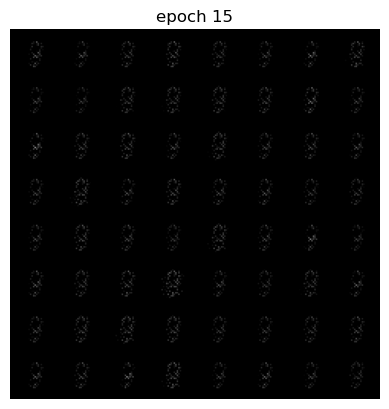

Epoch 15 of 100
Generator loss: 1.69978499, Discriminator loss: 1.05991590


  2%|▊                                            | 2/117 [00:00<00:07, 14.55it/s]

tensor(1.0062, grad_fn=<AddBackward0>)
tensor(0.9823, grad_fn=<AddBackward0>)
tensor(0.9864, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.64it/s]

tensor(0.9567, grad_fn=<AddBackward0>)
tensor(0.9410, grad_fn=<AddBackward0>)
tensor(0.8468, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.78it/s]

tensor(0.8058, grad_fn=<AddBackward0>)
tensor(0.8239, grad_fn=<AddBackward0>)
tensor(0.8097, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.73it/s]

tensor(0.8477, grad_fn=<AddBackward0>)
tensor(0.8453, grad_fn=<AddBackward0>)
tensor(0.8482, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.75it/s]

tensor(0.8945, grad_fn=<AddBackward0>)
tensor(1.0721, grad_fn=<AddBackward0>)
tensor(1.1998, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.89it/s]

tensor(1.2953, grad_fn=<AddBackward0>)
tensor(1.3730, grad_fn=<AddBackward0>)
tensor(1.4333, grad_fn=<AddBackward0>)
tensor(1.5035, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.92it/s]

tensor(1.3087, grad_fn=<AddBackward0>)
tensor(1.1450, grad_fn=<AddBackward0>)
tensor(1.0012, grad_fn=<AddBackward0>)
tensor(0.8123, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.95it/s]

tensor(0.8065, grad_fn=<AddBackward0>)
tensor(0.8393, grad_fn=<AddBackward0>)
tensor(0.8455, grad_fn=<AddBackward0>)
tensor(0.9422, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.92it/s]

tensor(1.0863, grad_fn=<AddBackward0>)
tensor(1.3125, grad_fn=<AddBackward0>)
tensor(1.4987, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.87it/s]

tensor(1.8405, grad_fn=<AddBackward0>)
tensor(2.0830, grad_fn=<AddBackward0>)
tensor(2.2989, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.94it/s]

tensor(2.4026, grad_fn=<AddBackward0>)
tensor(2.5498, grad_fn=<AddBackward0>)
tensor(2.3721, grad_fn=<AddBackward0>)
tensor(2.4861, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.98it/s]

tensor(2.3871, grad_fn=<AddBackward0>)
tensor(2.0596, grad_fn=<AddBackward0>)
tensor(1.8681, grad_fn=<AddBackward0>)
tensor(1.8264, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.94it/s]

tensor(1.8613, grad_fn=<AddBackward0>)
tensor(1.8106, grad_fn=<AddBackward0>)
tensor(1.7263, grad_fn=<AddBackward0>)
tensor(1.5947, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.96it/s]

tensor(1.5946, grad_fn=<AddBackward0>)
tensor(1.6387, grad_fn=<AddBackward0>)
tensor(1.5400, grad_fn=<AddBackward0>)
tensor(1.5595, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.03it/s]

tensor(1.5380, grad_fn=<AddBackward0>)
tensor(1.5184, grad_fn=<AddBackward0>)
tensor(1.6112, grad_fn=<AddBackward0>)
tensor(1.6389, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.03it/s]

tensor(1.6168, grad_fn=<AddBackward0>)
tensor(1.6806, grad_fn=<AddBackward0>)
tensor(1.6125, grad_fn=<AddBackward0>)
tensor(1.6850, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.91it/s]

tensor(1.6906, grad_fn=<AddBackward0>)
tensor(1.7890, grad_fn=<AddBackward0>)
tensor(1.7339, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.91it/s]

tensor(1.6664, grad_fn=<AddBackward0>)
tensor(1.6616, grad_fn=<AddBackward0>)
tensor(1.6285, grad_fn=<AddBackward0>)
tensor(1.6030, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.95it/s]

tensor(1.5909, grad_fn=<AddBackward0>)
tensor(1.5192, grad_fn=<AddBackward0>)
tensor(1.5379, grad_fn=<AddBackward0>)
tensor(1.4664, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.02it/s]

tensor(1.4447, grad_fn=<AddBackward0>)
tensor(1.3932, grad_fn=<AddBackward0>)
tensor(1.3658, grad_fn=<AddBackward0>)
tensor(1.3230, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.00it/s]

tensor(1.2872, grad_fn=<AddBackward0>)
tensor(1.2392, grad_fn=<AddBackward0>)
tensor(1.1907, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.77it/s]

tensor(1.1643, grad_fn=<AddBackward0>)
tensor(1.1283, grad_fn=<AddBackward0>)
tensor(1.0715, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.84it/s]

tensor(1.0562, grad_fn=<AddBackward0>)
tensor(1.0094, grad_fn=<AddBackward0>)
tensor(0.9808, grad_fn=<AddBackward0>)
tensor(0.9264, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.88it/s]

tensor(0.8616, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)
tensor(0.7998, grad_fn=<AddBackward0>)
tensor(0.7509, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.97it/s]

tensor(0.7225, grad_fn=<AddBackward0>)
tensor(0.6987, grad_fn=<AddBackward0>)
tensor(0.6806, grad_fn=<AddBackward0>)
tensor(0.6463, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.97it/s]

tensor(0.6535, grad_fn=<AddBackward0>)
tensor(0.6423, grad_fn=<AddBackward0>)
tensor(0.6281, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.87it/s]

tensor(0.6276, grad_fn=<AddBackward0>)
tensor(0.6276, grad_fn=<AddBackward0>)
tensor(0.6381, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.85it/s]

tensor(0.6715, grad_fn=<AddBackward0>)
tensor(0.6960, grad_fn=<AddBackward0>)
tensor(0.6898, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.76it/s]

tensor(0.7491, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.8610, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.73it/s]

tensor(0.9317, grad_fn=<AddBackward0>)
tensor(0.9977, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.79it/s]

tensor(1.0758, grad_fn=<AddBackward0>)
tensor(1.2439, grad_fn=<AddBackward0>)
tensor(1.3494, grad_fn=<AddBackward0>)
tensor(1.5481, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.84it/s]

tensor(1.5608, grad_fn=<AddBackward0>)
tensor(1.6648, grad_fn=<AddBackward0>)
tensor(1.6034, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.91it/s]

tensor(1.6509, grad_fn=<AddBackward0>)
tensor(1.6642, grad_fn=<AddBackward0>)
tensor(1.6553, grad_fn=<AddBackward0>)
tensor(1.5530, grad_fn=<AddBackward0>)


118it [00:07, 14.97it/s]                                                          


tensor(1.5652, grad_fn=<AddBackward0>)
tensor(1.4735, grad_fn=<AddBackward0>)
Epoch 16 of 100
Generator loss: 1.72080135, Discriminator loss: 1.30564594


  2%|▊                                            | 2/117 [00:00<00:07, 14.69it/s]

tensor(1.3962, grad_fn=<AddBackward0>)
tensor(1.2860, grad_fn=<AddBackward0>)
tensor(1.2393, grad_fn=<AddBackward0>)
tensor(1.1056, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.93it/s]

tensor(1.0477, grad_fn=<AddBackward0>)
tensor(0.9949, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.91it/s]

tensor(0.9609, grad_fn=<AddBackward0>)
tensor(0.9006, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.00it/s]

tensor(0.8861, grad_fn=<AddBackward0>)
tensor(0.8484, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.95it/s]

tensor(0.8688, grad_fn=<AddBackward0>)
tensor(0.8486, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.97it/s]

tensor(0.9448, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.87it/s]

tensor(0.9019, grad_fn=<AddBackward0>)
tensor(0.9930, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.93it/s]

tensor(0.9849, grad_fn=<AddBackward0>)
tensor(0.9884, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.97it/s]

tensor(1.0553, grad_fn=<AddBackward0>)
tensor(1.0407, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.95it/s]

tensor(1.0851, grad_fn=<AddBackward0>)
tensor(1.1081, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.05it/s]

tensor(1.0633, grad_fn=<AddBackward0>)
tensor(1.0583, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.05it/s]

tensor(1.0190, grad_fn=<AddBackward0>)
tensor(1.0584, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.01it/s]

tensor(0.9589, grad_fn=<AddBackward0>)
tensor(0.9037, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(0.8244, grad_fn=<AddBackward0>)
tensor(0.7563, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.02it/s]

tensor(0.7381, grad_fn=<AddBackward0>)
tensor(0.6700, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.94it/s]

tensor(0.6426, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.90it/s]

tensor(0.6308, grad_fn=<AddBackward0>)
tensor(0.6251, grad_fn=<AddBackward0>)
tensor(0.6250, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.85it/s]

tensor(0.7511, grad_fn=<AddBackward0>)
tensor(0.7410, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.78it/s]

tensor(0.8289, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.90it/s]

tensor(0.7451, grad_fn=<AddBackward0>)
tensor(0.7836, grad_fn=<AddBackward0>)
tensor(0.7099, grad_fn=<AddBackward0>)
tensor(0.9651, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.98it/s]

tensor(0.7732, grad_fn=<AddBackward0>)
tensor(0.7071, grad_fn=<AddBackward0>)
tensor(0.8682, grad_fn=<AddBackward0>)
tensor(1.7549, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.03it/s]

tensor(2.4950, grad_fn=<AddBackward0>)
tensor(4.6841, grad_fn=<AddBackward0>)
tensor(4.6780, grad_fn=<AddBackward0>)
tensor(2.9764, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.99it/s]

tensor(2.2388, grad_fn=<AddBackward0>)
tensor(1.9811, grad_fn=<AddBackward0>)
tensor(1.6112, grad_fn=<AddBackward0>)
tensor(1.4105, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.93it/s]

tensor(1.0839, grad_fn=<AddBackward0>)
tensor(1.0482, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.97it/s]

tensor(0.8935, grad_fn=<AddBackward0>)
tensor(0.9549, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.00it/s]

tensor(1.0682, grad_fn=<AddBackward0>)
tensor(1.4468, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.95it/s]

tensor(1.9855, grad_fn=<AddBackward0>)
tensor(3.2619, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.02it/s]

tensor(4.1299, grad_fn=<AddBackward0>)
tensor(5.0702, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.96it/s]

tensor(5.2849, grad_fn=<AddBackward0>)
tensor(5.1736, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.00it/s]

tensor(4.5959, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.89it/s]

tensor(3.6892, grad_fn=<AddBackward0>)
tensor(3.1819, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.93it/s]

tensor(2.5229, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.90it/s]

tensor(1.9892, grad_fn=<AddBackward0>)
tensor(1.5079, grad_fn=<AddBackward0>)
tensor(1.1557, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.79it/s]

tensor(0.9898, grad_fn=<AddBackward0>)
tensor(0.9401, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.75it/s]

tensor(0.8270, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.80it/s]

tensor(0.6565, grad_fn=<AddBackward0>)
tensor(0.5484, grad_fn=<AddBackward0>)
tensor(0.5453, grad_fn=<AddBackward0>)
tensor(0.5068, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.82it/s]

tensor(0.4990, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.83it/s]

tensor(0.5026, grad_fn=<AddBackward0>)
tensor(0.4776, grad_fn=<AddBackward0>)
tensor(0.4831, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.87it/s]

tensor(0.4772, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.95it/s]

tensor(0.5138, grad_fn=<AddBackward0>)
tensor(0.5041, grad_fn=<AddBackward0>)
tensor(0.5167, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.01it/s]

tensor(0.5031, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.03it/s]

tensor(0.5087, grad_fn=<AddBackward0>)
tensor(0.5270, grad_fn=<AddBackward0>)
tensor(0.5337, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.05it/s]

tensor(0.5561, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.97it/s]

tensor(0.5590, grad_fn=<AddBackward0>)
tensor(0.5704, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.94it/s]

tensor(0.6047, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.91it/s]

tensor(0.6439, grad_fn=<AddBackward0>)
tensor(0.6361, grad_fn=<AddBackward0>)
tensor(0.6677, grad_fn=<AddBackward0>)
tensor(0.6835, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.85it/s]

tensor(0.7267, grad_fn=<AddBackward0>)
tensor(0.7691, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.67it/s]

tensor(0.8874, grad_fn=<AddBackward0>)
tensor(0.9453, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.50it/s]

tensor(1.0472, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.40it/s]

tensor(1.1343, grad_fn=<AddBackward0>)
tensor(1.1879, grad_fn=<AddBackward0>)
tensor(1.2310, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.32it/s]

tensor(1.3556, grad_fn=<AddBackward0>)
tensor(1.4339, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.46it/s]

tensor(1.5695, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.67it/s]

tensor(1.6386, grad_fn=<AddBackward0>)
tensor(1.7298, grad_fn=<AddBackward0>)
tensor(1.7922, grad_fn=<AddBackward0>)
tensor(1.8436, grad_fn=<AddBackward0>)


118it [00:07, 14.96it/s]                                                          


tensor(1.8906, grad_fn=<AddBackward0>)
tensor(1.8730, grad_fn=<AddBackward0>)
Epoch 17 of 100
Generator loss: 3.18737841, Discriminator loss: 1.32205462


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.9144, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.88it/s]

tensor(1.9913, grad_fn=<AddBackward0>)
tensor(1.8664, grad_fn=<AddBackward0>)
tensor(1.8549, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.99it/s]

tensor(1.8981, grad_fn=<AddBackward0>)
tensor(1.8160, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.99it/s]

tensor(1.8305, grad_fn=<AddBackward0>)
tensor(1.8187, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.99it/s]

tensor(1.7686, grad_fn=<AddBackward0>)
tensor(1.7427, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.00it/s]

tensor(1.7165, grad_fn=<AddBackward0>)
tensor(1.6877, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.03it/s]

tensor(1.6417, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.79it/s]

tensor(1.6118, grad_fn=<AddBackward0>)
tensor(1.6213, grad_fn=<AddBackward0>)
tensor(1.5801, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.89it/s]

tensor(1.5831, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.96it/s]

tensor(1.5412, grad_fn=<AddBackward0>)
tensor(1.5462, grad_fn=<AddBackward0>)
tensor(1.4900, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.96it/s]

tensor(1.4828, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.99it/s]

tensor(1.4302, grad_fn=<AddBackward0>)
tensor(1.3985, grad_fn=<AddBackward0>)
tensor(1.3816, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(1.3828, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.99it/s]

tensor(1.3242, grad_fn=<AddBackward0>)
tensor(1.3140, grad_fn=<AddBackward0>)
tensor(1.3201, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(1.2431, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.11it/s]

tensor(1.2577, grad_fn=<AddBackward0>)
tensor(1.2326, grad_fn=<AddBackward0>)
tensor(1.1948, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.09it/s]

tensor(1.1562, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.07it/s]

tensor(1.1643, grad_fn=<AddBackward0>)
tensor(1.1020, grad_fn=<AddBackward0>)
tensor(1.1109, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.04it/s]

tensor(1.0610, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.99it/s]

tensor(1.0462, grad_fn=<AddBackward0>)
tensor(0.9934, grad_fn=<AddBackward0>)
tensor(0.9526, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.01it/s]

tensor(0.9192, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.99it/s]

tensor(0.9060, grad_fn=<AddBackward0>)
tensor(0.8757, grad_fn=<AddBackward0>)
tensor(0.8378, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.95it/s]

tensor(0.7726, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.98it/s]

tensor(0.7726, grad_fn=<AddBackward0>)
tensor(0.7348, grad_fn=<AddBackward0>)
tensor(0.7038, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.98it/s]

tensor(0.6811, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.02it/s]

tensor(0.6457, grad_fn=<AddBackward0>)
tensor(0.6443, grad_fn=<AddBackward0>)
tensor(0.6508, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.06it/s]

tensor(0.6272, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.02it/s]

tensor(0.6262, grad_fn=<AddBackward0>)
tensor(0.6266, grad_fn=<AddBackward0>)
tensor(0.6253, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.02it/s]

tensor(0.6389, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.05it/s]

tensor(0.6591, grad_fn=<AddBackward0>)
tensor(0.6980, grad_fn=<AddBackward0>)
tensor(0.7387, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.05it/s]

tensor(0.7335, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.08it/s]

tensor(0.7914, grad_fn=<AddBackward0>)
tensor(0.8172, grad_fn=<AddBackward0>)
tensor(0.9304, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.06it/s]

tensor(1.0170, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.05it/s]

tensor(1.1500, grad_fn=<AddBackward0>)
tensor(1.2737, grad_fn=<AddBackward0>)
tensor(1.4313, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.09it/s]

tensor(1.5922, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.08it/s]

tensor(1.8280, grad_fn=<AddBackward0>)
tensor(1.9629, grad_fn=<AddBackward0>)
tensor(2.1598, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.12it/s]

tensor(2.2614, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.06it/s]

tensor(2.3460, grad_fn=<AddBackward0>)
tensor(2.4927, grad_fn=<AddBackward0>)
tensor(2.4865, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.06it/s]

tensor(2.4503, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.06it/s]

tensor(2.4128, grad_fn=<AddBackward0>)
tensor(2.3534, grad_fn=<AddBackward0>)
tensor(2.2754, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.96it/s]

tensor(2.1902, grad_fn=<AddBackward0>)
tensor(1.9906, grad_fn=<AddBackward0>)
tensor(1.8419, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.94it/s]

tensor(1.7147, grad_fn=<AddBackward0>)
tensor(1.5771, grad_fn=<AddBackward0>)
tensor(1.4403, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.01it/s]

tensor(1.3449, grad_fn=<AddBackward0>)
tensor(1.1941, grad_fn=<AddBackward0>)
tensor(1.0975, grad_fn=<AddBackward0>)
tensor(0.9891, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.99it/s]

tensor(0.8833, grad_fn=<AddBackward0>)
tensor(0.8386, grad_fn=<AddBackward0>)
tensor(0.7626, grad_fn=<AddBackward0>)
tensor(0.7051, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.99it/s]

tensor(0.6805, grad_fn=<AddBackward0>)
tensor(0.6819, grad_fn=<AddBackward0>)
tensor(0.6708, grad_fn=<AddBackward0>)
tensor(0.6939, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.92it/s]

tensor(0.6953, grad_fn=<AddBackward0>)
tensor(0.7097, grad_fn=<AddBackward0>)
tensor(0.7077, grad_fn=<AddBackward0>)
tensor(0.6945, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.97it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.6999, grad_fn=<AddBackward0>)
tensor(0.7234, grad_fn=<AddBackward0>)
tensor(0.7206, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.97it/s]

tensor(0.7315, grad_fn=<AddBackward0>)
tensor(0.7330, grad_fn=<AddBackward0>)
tensor(0.7424, grad_fn=<AddBackward0>)
tensor(0.7326, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.96it/s]

tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7437, grad_fn=<AddBackward0>)
tensor(0.7690, grad_fn=<AddBackward0>)
tensor(0.7801, grad_fn=<AddBackward0>)


118it [00:07, 15.08it/s]                                                          


tensor(0.7798, grad_fn=<AddBackward0>)
tensor(0.7989, grad_fn=<AddBackward0>)
tensor(0.8001, grad_fn=<AddBackward0>)
tensor(0.7851, grad_fn=<AddBackward0>)
Epoch 18 of 100
Generator loss: 1.32186794, Discriminator loss: 1.23336148


  2%|▊                                            | 2/117 [00:00<00:07, 15.21it/s]

tensor(0.8408, grad_fn=<AddBackward0>)
tensor(0.8351, grad_fn=<AddBackward0>)
tensor(0.8474, grad_fn=<AddBackward0>)
tensor(0.8796, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.92it/s]

tensor(0.8690, grad_fn=<AddBackward0>)
tensor(0.9246, grad_fn=<AddBackward0>)
tensor(0.9050, grad_fn=<AddBackward0>)
tensor(0.9325, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.93it/s]

tensor(0.9614, grad_fn=<AddBackward0>)
tensor(0.9372, grad_fn=<AddBackward0>)
tensor(0.9625, grad_fn=<AddBackward0>)
tensor(1.0218, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.86it/s]

tensor(1.0148, grad_fn=<AddBackward0>)
tensor(0.9802, grad_fn=<AddBackward0>)
tensor(0.9996, grad_fn=<AddBackward0>)
tensor(1.0573, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.04it/s]

tensor(1.0505, grad_fn=<AddBackward0>)
tensor(1.0857, grad_fn=<AddBackward0>)
tensor(1.0904, grad_fn=<AddBackward0>)
tensor(1.0741, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.03it/s]

tensor(1.1239, grad_fn=<AddBackward0>)
tensor(1.1048, grad_fn=<AddBackward0>)
tensor(1.0738, grad_fn=<AddBackward0>)
tensor(1.1306, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.01it/s]

tensor(1.1655, grad_fn=<AddBackward0>)
tensor(1.1820, grad_fn=<AddBackward0>)
tensor(1.1878, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.82it/s]

tensor(1.1775, grad_fn=<AddBackward0>)
tensor(1.2473, grad_fn=<AddBackward0>)
tensor(1.2331, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.25it/s]

tensor(1.2105, grad_fn=<AddBackward0>)
tensor(1.2890, grad_fn=<AddBackward0>)
tensor(1.2686, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.10it/s]

tensor(1.3484, grad_fn=<AddBackward0>)
tensor(1.3173, grad_fn=<AddBackward0>)
tensor(1.3576, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.29it/s]

tensor(1.3885, grad_fn=<AddBackward0>)
tensor(1.3609, grad_fn=<AddBackward0>)
tensor(1.3762, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.53it/s]

tensor(1.3714, grad_fn=<AddBackward0>)
tensor(1.3468, grad_fn=<AddBackward0>)
tensor(1.3651, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:05, 14.53it/s]

tensor(1.3981, grad_fn=<AddBackward0>)
tensor(1.3924, grad_fn=<AddBackward0>)
tensor(1.3359, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.66it/s]

tensor(1.3428, grad_fn=<AddBackward0>)
tensor(1.3183, grad_fn=<AddBackward0>)
tensor(1.3106, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.20it/s]

tensor(1.3146, grad_fn=<AddBackward0>)
tensor(1.2997, grad_fn=<AddBackward0>)
tensor(1.2409, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.56it/s]

tensor(1.2474, grad_fn=<AddBackward0>)
tensor(1.2407, grad_fn=<AddBackward0>)
tensor(1.2601, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.62it/s]

tensor(1.2170, grad_fn=<AddBackward0>)
tensor(1.2232, grad_fn=<AddBackward0>)
tensor(1.2222, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.75it/s]

tensor(1.1926, grad_fn=<AddBackward0>)
tensor(1.1804, grad_fn=<AddBackward0>)
tensor(1.1758, grad_fn=<AddBackward0>)
tensor(1.1692, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.90it/s]

tensor(1.1195, grad_fn=<AddBackward0>)
tensor(1.1121, grad_fn=<AddBackward0>)
tensor(1.0876, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.91it/s]

tensor(1.0918, grad_fn=<AddBackward0>)
tensor(1.0375, grad_fn=<AddBackward0>)
tensor(1.0504, grad_fn=<AddBackward0>)
tensor(1.0439, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.96it/s]

tensor(1.0033, grad_fn=<AddBackward0>)
tensor(0.9995, grad_fn=<AddBackward0>)
tensor(0.9972, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:03, 13.84it/s]

tensor(0.9407, grad_fn=<AddBackward0>)
tensor(0.9031, grad_fn=<AddBackward0>)
tensor(0.8751, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.10it/s]

tensor(0.8456, grad_fn=<AddBackward0>)
tensor(0.8106, grad_fn=<AddBackward0>)
tensor(0.7793, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.40it/s]

tensor(0.7390, grad_fn=<AddBackward0>)
tensor(0.7302, grad_fn=<AddBackward0>)
tensor(0.6659, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.56it/s]

tensor(0.6504, grad_fn=<AddBackward0>)
tensor(0.6571, grad_fn=<AddBackward0>)
tensor(0.6596, grad_fn=<AddBackward0>)
tensor(0.6223, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.81it/s]

tensor(0.6540, grad_fn=<AddBackward0>)
tensor(0.6480, grad_fn=<AddBackward0>)
tensor(0.6709, grad_fn=<AddBackward0>)
tensor(0.7670, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.82it/s]

tensor(0.7652, grad_fn=<AddBackward0>)
tensor(0.7803, grad_fn=<AddBackward0>)
tensor(0.8519, grad_fn=<AddBackward0>)
tensor(0.8561, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.90it/s]

tensor(0.9906, grad_fn=<AddBackward0>)
tensor(1.0099, grad_fn=<AddBackward0>)
tensor(1.0293, grad_fn=<AddBackward0>)
tensor(1.1964, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.75it/s]

tensor(1.3566, grad_fn=<AddBackward0>)
tensor(1.4520, grad_fn=<AddBackward0>)
tensor(1.4900, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.52it/s]

tensor(1.6456, grad_fn=<AddBackward0>)
tensor(1.6766, grad_fn=<AddBackward0>)
tensor(1.7129, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.51it/s]

tensor(1.7951, grad_fn=<AddBackward0>)
tensor(1.8029, grad_fn=<AddBackward0>)
tensor(1.8891, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.47it/s]

tensor(1.7817, grad_fn=<AddBackward0>)
tensor(1.7837, grad_fn=<AddBackward0>)
tensor(1.6467, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.36it/s]

tensor(1.5033, grad_fn=<AddBackward0>)
tensor(1.4216, grad_fn=<AddBackward0>)
tensor(1.2469, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 13.99it/s]

tensor(1.1616, grad_fn=<AddBackward0>)
tensor(1.1410, grad_fn=<AddBackward0>)
tensor(1.0330, grad_fn=<AddBackward0>)


118it [00:08, 14.66it/s]                                                          


tensor(0.9692, grad_fn=<AddBackward0>)
tensor(0.8901, grad_fn=<AddBackward0>)
tensor(0.8314, grad_fn=<AddBackward0>)
tensor(0.7629, grad_fn=<AddBackward0>)
Epoch 19 of 100
Generator loss: 1.46200323, Discriminator loss: 1.13344944


  2%|▊                                            | 2/117 [00:00<00:07, 15.11it/s]

tensor(0.7434, grad_fn=<AddBackward0>)
tensor(0.6834, grad_fn=<AddBackward0>)
tensor(0.6751, grad_fn=<AddBackward0>)
tensor(0.6723, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.41it/s]

tensor(0.6327, grad_fn=<AddBackward0>)
tensor(0.6291, grad_fn=<AddBackward0>)
tensor(0.6134, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.61it/s]

tensor(0.6315, grad_fn=<AddBackward0>)
tensor(0.6146, grad_fn=<AddBackward0>)
tensor(0.6384, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.78it/s]

tensor(0.6577, grad_fn=<AddBackward0>)
tensor(0.6771, grad_fn=<AddBackward0>)
tensor(0.6741, grad_fn=<AddBackward0>)
tensor(0.7331, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.98it/s]

tensor(0.7786, grad_fn=<AddBackward0>)
tensor(0.8258, grad_fn=<AddBackward0>)
tensor(0.8651, grad_fn=<AddBackward0>)
tensor(0.8572, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.91it/s]

tensor(0.9362, grad_fn=<AddBackward0>)
tensor(0.9755, grad_fn=<AddBackward0>)
tensor(1.0057, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.83it/s]

tensor(1.0334, grad_fn=<AddBackward0>)
tensor(1.0352, grad_fn=<AddBackward0>)
tensor(1.1053, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.83it/s]

tensor(1.1464, grad_fn=<AddBackward0>)
tensor(1.1165, grad_fn=<AddBackward0>)
tensor(1.0726, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.64it/s]

tensor(1.0581, grad_fn=<AddBackward0>)
tensor(1.0048, grad_fn=<AddBackward0>)
tensor(0.8999, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.37it/s]

tensor(0.8708, grad_fn=<AddBackward0>)
tensor(0.7982, grad_fn=<AddBackward0>)
tensor(0.7508, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.53it/s]

tensor(0.7060, grad_fn=<AddBackward0>)
tensor(0.7119, grad_fn=<AddBackward0>)
tensor(0.6832, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.63it/s]

tensor(0.6813, grad_fn=<AddBackward0>)
tensor(0.6379, grad_fn=<AddBackward0>)
tensor(0.6610, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.59it/s]

tensor(0.6807, grad_fn=<AddBackward0>)
tensor(0.7201, grad_fn=<AddBackward0>)
tensor(0.7729, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.64it/s]

tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.9233, grad_fn=<AddBackward0>)
tensor(1.0361, grad_fn=<AddBackward0>)
tensor(1.0860, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.82it/s]

tensor(1.1915, grad_fn=<AddBackward0>)
tensor(1.2414, grad_fn=<AddBackward0>)
tensor(1.4365, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.92it/s]

tensor(1.5104, grad_fn=<AddBackward0>)
tensor(1.5913, grad_fn=<AddBackward0>)
tensor(1.6171, grad_fn=<AddBackward0>)
tensor(1.5417, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.92it/s]

tensor(1.5116, grad_fn=<AddBackward0>)
tensor(1.5216, grad_fn=<AddBackward0>)
tensor(1.4633, grad_fn=<AddBackward0>)
tensor(1.2894, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.92it/s]

tensor(1.2565, grad_fn=<AddBackward0>)
tensor(1.1013, grad_fn=<AddBackward0>)
tensor(0.9846, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.94it/s]

tensor(0.8900, grad_fn=<AddBackward0>)
tensor(0.7629, grad_fn=<AddBackward0>)
tensor(0.7170, grad_fn=<AddBackward0>)
tensor(0.6040, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.97it/s]

tensor(0.5663, grad_fn=<AddBackward0>)
tensor(0.5084, grad_fn=<AddBackward0>)
tensor(0.5058, grad_fn=<AddBackward0>)
tensor(0.4988, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.97it/s]

tensor(0.4933, grad_fn=<AddBackward0>)
tensor(0.5073, grad_fn=<AddBackward0>)
tensor(0.5173, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.95it/s]

tensor(0.5266, grad_fn=<AddBackward0>)
tensor(0.5663, grad_fn=<AddBackward0>)
tensor(0.6055, grad_fn=<AddBackward0>)
tensor(0.6719, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.93it/s]

tensor(0.7141, grad_fn=<AddBackward0>)
tensor(0.7166, grad_fn=<AddBackward0>)
tensor(0.8392, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.93it/s]

tensor(0.8907, grad_fn=<AddBackward0>)
tensor(1.0690, grad_fn=<AddBackward0>)
tensor(1.1221, grad_fn=<AddBackward0>)
tensor(1.2707, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.90it/s]

tensor(1.4010, grad_fn=<AddBackward0>)
tensor(1.4492, grad_fn=<AddBackward0>)
tensor(1.5621, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.96it/s]

tensor(1.6198, grad_fn=<AddBackward0>)
tensor(1.6451, grad_fn=<AddBackward0>)
tensor(1.6446, grad_fn=<AddBackward0>)
tensor(1.6288, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.00it/s]

tensor(1.6028, grad_fn=<AddBackward0>)
tensor(1.5702, grad_fn=<AddBackward0>)
tensor(1.5485, grad_fn=<AddBackward0>)
tensor(1.4813, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.99it/s]

tensor(1.4338, grad_fn=<AddBackward0>)
tensor(1.3444, grad_fn=<AddBackward0>)
tensor(1.3006, grad_fn=<AddBackward0>)
tensor(1.2234, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.87it/s]

tensor(1.2123, grad_fn=<AddBackward0>)
tensor(1.1619, grad_fn=<AddBackward0>)
tensor(1.1466, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.88it/s]

tensor(1.1133, grad_fn=<AddBackward0>)
tensor(1.0668, grad_fn=<AddBackward0>)
tensor(1.0738, grad_fn=<AddBackward0>)
tensor(1.0173, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.95it/s]

tensor(1.0235, grad_fn=<AddBackward0>)
tensor(1.0107, grad_fn=<AddBackward0>)
tensor(0.9614, grad_fn=<AddBackward0>)
tensor(0.8978, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.95it/s]

tensor(0.8912, grad_fn=<AddBackward0>)
tensor(0.9050, grad_fn=<AddBackward0>)
tensor(0.8472, grad_fn=<AddBackward0>)
tensor(0.8426, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.88it/s]

tensor(0.8259, grad_fn=<AddBackward0>)
tensor(0.8096, grad_fn=<AddBackward0>)
tensor(0.7979, grad_fn=<AddBackward0>)


118it [00:07, 14.93it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7552, grad_fn=<AddBackward0>)
tensor(0.7550, grad_fn=<AddBackward0>)
tensor(0.6914, grad_fn=<AddBackward0>)


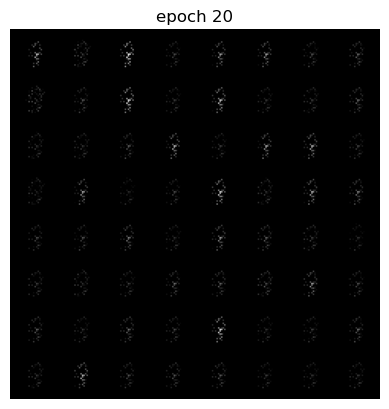

Epoch 20 of 100
Generator loss: 2.14826655, Discriminator loss: 0.97952592


  2%|▊                                            | 2/117 [00:00<00:07, 14.45it/s]

tensor(0.7077, grad_fn=<AddBackward0>)
tensor(0.7317, grad_fn=<AddBackward0>)
tensor(0.7002, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.58it/s]

tensor(0.6972, grad_fn=<AddBackward0>)
tensor(0.6967, grad_fn=<AddBackward0>)
tensor(0.7111, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.80it/s]

tensor(0.6856, grad_fn=<AddBackward0>)
tensor(0.6976, grad_fn=<AddBackward0>)
tensor(0.6962, grad_fn=<AddBackward0>)
tensor(0.7026, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.83it/s]

tensor(0.6984, grad_fn=<AddBackward0>)
tensor(0.7076, grad_fn=<AddBackward0>)
tensor(0.7007, grad_fn=<AddBackward0>)
tensor(0.6955, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.95it/s]

tensor(0.7102, grad_fn=<AddBackward0>)
tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7256, grad_fn=<AddBackward0>)
tensor(0.7601, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.86it/s]

tensor(0.7473, grad_fn=<AddBackward0>)
tensor(0.7728, grad_fn=<AddBackward0>)
tensor(0.7730, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.95it/s]

tensor(0.7560, grad_fn=<AddBackward0>)
tensor(0.7848, grad_fn=<AddBackward0>)
tensor(0.8250, grad_fn=<AddBackward0>)
tensor(0.8420, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.94it/s]

tensor(0.8926, grad_fn=<AddBackward0>)
tensor(0.8839, grad_fn=<AddBackward0>)
tensor(0.9097, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.96it/s]

tensor(0.9175, grad_fn=<AddBackward0>)
tensor(0.8926, grad_fn=<AddBackward0>)
tensor(0.9360, grad_fn=<AddBackward0>)
tensor(1.0266, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.01it/s]

tensor(1.0085, grad_fn=<AddBackward0>)
tensor(1.0230, grad_fn=<AddBackward0>)
tensor(1.0298, grad_fn=<AddBackward0>)
tensor(1.0870, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.96it/s]

tensor(1.1051, grad_fn=<AddBackward0>)
tensor(1.1284, grad_fn=<AddBackward0>)
tensor(1.0531, grad_fn=<AddBackward0>)
tensor(1.0797, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.95it/s]

tensor(1.0790, grad_fn=<AddBackward0>)
tensor(1.1754, grad_fn=<AddBackward0>)
tensor(1.0760, grad_fn=<AddBackward0>)
tensor(1.1213, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.00it/s]

tensor(1.1084, grad_fn=<AddBackward0>)
tensor(1.1140, grad_fn=<AddBackward0>)
tensor(1.0760, grad_fn=<AddBackward0>)
tensor(1.0644, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.05it/s]

tensor(1.0746, grad_fn=<AddBackward0>)
tensor(1.0608, grad_fn=<AddBackward0>)
tensor(1.0153, grad_fn=<AddBackward0>)
tensor(1.0376, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.97it/s]

tensor(1.0093, grad_fn=<AddBackward0>)
tensor(1.0338, grad_fn=<AddBackward0>)
tensor(0.9396, grad_fn=<AddBackward0>)
tensor(0.9396, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.91it/s]

tensor(0.9330, grad_fn=<AddBackward0>)
tensor(0.9096, grad_fn=<AddBackward0>)
tensor(0.8667, grad_fn=<AddBackward0>)
tensor(0.8147, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.00it/s]

tensor(0.8114, grad_fn=<AddBackward0>)
tensor(0.7358, grad_fn=<AddBackward0>)
tensor(0.7711, grad_fn=<AddBackward0>)
tensor(0.7247, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.95it/s]

tensor(0.7094, grad_fn=<AddBackward0>)
tensor(0.6815, grad_fn=<AddBackward0>)
tensor(0.6735, grad_fn=<AddBackward0>)
tensor(0.6514, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.93it/s]

tensor(0.6543, grad_fn=<AddBackward0>)
tensor(0.6319, grad_fn=<AddBackward0>)
tensor(0.6916, grad_fn=<AddBackward0>)
tensor(0.6630, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.97it/s]

tensor(0.6777, grad_fn=<AddBackward0>)
tensor(0.7086, grad_fn=<AddBackward0>)
tensor(0.7099, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.05it/s]

tensor(0.8618, grad_fn=<AddBackward0>)
tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.8826, grad_fn=<AddBackward0>)
tensor(0.9869, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.99it/s]

tensor(1.0334, grad_fn=<AddBackward0>)
tensor(1.0496, grad_fn=<AddBackward0>)
tensor(1.0678, grad_fn=<AddBackward0>)
tensor(1.0983, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.97it/s]

tensor(1.0724, grad_fn=<AddBackward0>)
tensor(1.0586, grad_fn=<AddBackward0>)
tensor(0.9646, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.89it/s]

tensor(0.8935, grad_fn=<AddBackward0>)
tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7069, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.86it/s]

tensor(0.6754, grad_fn=<AddBackward0>)
tensor(0.6462, grad_fn=<AddBackward0>)
tensor(0.6275, grad_fn=<AddBackward0>)
tensor(0.6016, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.66it/s]

tensor(0.6047, grad_fn=<AddBackward0>)
tensor(0.6086, grad_fn=<AddBackward0>)
tensor(0.6533, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.76it/s]

tensor(0.7059, grad_fn=<AddBackward0>)
tensor(0.7659, grad_fn=<AddBackward0>)
tensor(0.8233, grad_fn=<AddBackward0>)
tensor(0.9222, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.81it/s]

tensor(1.0146, grad_fn=<AddBackward0>)
tensor(0.9874, grad_fn=<AddBackward0>)
tensor(1.1205, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.73it/s]

tensor(1.2197, grad_fn=<AddBackward0>)
tensor(1.3012, grad_fn=<AddBackward0>)
tensor(1.4291, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.37it/s]

tensor(1.4257, grad_fn=<AddBackward0>)
tensor(1.4076, grad_fn=<AddBackward0>)
tensor(1.5322, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.40it/s]

tensor(1.4394, grad_fn=<AddBackward0>)
tensor(1.4139, grad_fn=<AddBackward0>)
tensor(1.3592, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.37it/s]

tensor(1.3739, grad_fn=<AddBackward0>)
tensor(1.2911, grad_fn=<AddBackward0>)
tensor(1.2364, grad_fn=<AddBackward0>)


118it [00:07, 14.93it/s]                                                          


tensor(1.2343, grad_fn=<AddBackward0>)
tensor(1.1070, grad_fn=<AddBackward0>)
Epoch 21 of 100
Generator loss: 1.78774917, Discriminator loss: 0.92109776


  2%|▊                                            | 2/117 [00:00<00:07, 15.08it/s]

tensor(1.0815, grad_fn=<AddBackward0>)
tensor(1.0925, grad_fn=<AddBackward0>)
tensor(1.0028, grad_fn=<AddBackward0>)
tensor(0.9594, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.96it/s]

tensor(0.9062, grad_fn=<AddBackward0>)
tensor(0.8355, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.02it/s]

tensor(0.8269, grad_fn=<AddBackward0>)
tensor(0.8122, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.99it/s]

tensor(0.7874, grad_fn=<AddBackward0>)
tensor(0.8022, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.99it/s]

tensor(0.7729, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.89it/s]

tensor(0.8061, grad_fn=<AddBackward0>)
tensor(0.7917, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.82it/s]

tensor(0.8150, grad_fn=<AddBackward0>)
tensor(0.8237, grad_fn=<AddBackward0>)
tensor(0.8720, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.84it/s]

tensor(0.8576, grad_fn=<AddBackward0>)
tensor(0.9595, grad_fn=<AddBackward0>)
tensor(0.9524, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.84it/s]

tensor(0.9818, grad_fn=<AddBackward0>)
tensor(1.0393, grad_fn=<AddBackward0>)
tensor(1.0877, grad_fn=<AddBackward0>)
tensor(1.0787, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.90it/s]

tensor(1.1848, grad_fn=<AddBackward0>)
tensor(1.2534, grad_fn=<AddBackward0>)
tensor(1.2078, grad_fn=<AddBackward0>)
tensor(1.3134, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.83it/s]

tensor(1.3261, grad_fn=<AddBackward0>)
tensor(1.4113, grad_fn=<AddBackward0>)
tensor(1.4072, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.86it/s]

tensor(1.5064, grad_fn=<AddBackward0>)
tensor(1.4740, grad_fn=<AddBackward0>)
tensor(1.4499, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.76it/s]

tensor(1.4463, grad_fn=<AddBackward0>)
tensor(1.4777, grad_fn=<AddBackward0>)
tensor(1.4993, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.89it/s]

tensor(1.4085, grad_fn=<AddBackward0>)
tensor(1.3539, grad_fn=<AddBackward0>)
tensor(1.3443, grad_fn=<AddBackward0>)
tensor(1.3683, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.89it/s]

tensor(1.3096, grad_fn=<AddBackward0>)
tensor(1.2569, grad_fn=<AddBackward0>)
tensor(1.1658, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.88it/s]

tensor(1.1142, grad_fn=<AddBackward0>)
tensor(1.0823, grad_fn=<AddBackward0>)
tensor(1.0386, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.86it/s]

tensor(1.0177, grad_fn=<AddBackward0>)
tensor(1.0006, grad_fn=<AddBackward0>)
tensor(0.9176, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.85it/s]

tensor(0.8331, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.7677, grad_fn=<AddBackward0>)
tensor(0.7541, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.96it/s]

tensor(0.7191, grad_fn=<AddBackward0>)
tensor(0.7328, grad_fn=<AddBackward0>)
tensor(0.6858, grad_fn=<AddBackward0>)
tensor(0.7151, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.97it/s]

tensor(0.6646, grad_fn=<AddBackward0>)
tensor(0.6686, grad_fn=<AddBackward0>)
tensor(0.6465, grad_fn=<AddBackward0>)
tensor(0.6719, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.01it/s]

tensor(0.7142, grad_fn=<AddBackward0>)
tensor(0.7082, grad_fn=<AddBackward0>)
tensor(0.7617, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.97it/s]

tensor(0.7701, grad_fn=<AddBackward0>)
tensor(0.8206, grad_fn=<AddBackward0>)
tensor(0.8585, grad_fn=<AddBackward0>)
tensor(0.8906, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.03it/s]

tensor(0.9488, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)
tensor(1.0224, grad_fn=<AddBackward0>)
tensor(1.1408, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.00it/s]

tensor(1.1824, grad_fn=<AddBackward0>)
tensor(1.2737, grad_fn=<AddBackward0>)
tensor(1.2803, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.85it/s]

tensor(1.3135, grad_fn=<AddBackward0>)
tensor(1.3184, grad_fn=<AddBackward0>)
tensor(1.4160, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.85it/s]

tensor(1.3864, grad_fn=<AddBackward0>)
tensor(1.3809, grad_fn=<AddBackward0>)
tensor(1.3184, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.93it/s]

tensor(1.3533, grad_fn=<AddBackward0>)
tensor(1.2873, grad_fn=<AddBackward0>)
tensor(1.2564, grad_fn=<AddBackward0>)
tensor(1.2061, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.93it/s]

tensor(1.1477, grad_fn=<AddBackward0>)
tensor(1.1108, grad_fn=<AddBackward0>)
tensor(1.0725, grad_fn=<AddBackward0>)
tensor(1.0910, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.98it/s]

tensor(1.0655, grad_fn=<AddBackward0>)
tensor(1.0424, grad_fn=<AddBackward0>)
tensor(1.0220, grad_fn=<AddBackward0>)
tensor(1.0302, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.94it/s]

tensor(0.9839, grad_fn=<AddBackward0>)
tensor(0.9665, grad_fn=<AddBackward0>)
tensor(0.9430, grad_fn=<AddBackward0>)
tensor(0.9632, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.92it/s]

tensor(0.9313, grad_fn=<AddBackward0>)
tensor(0.8720, grad_fn=<AddBackward0>)
tensor(0.8660, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.94it/s]

tensor(0.8500, grad_fn=<AddBackward0>)
tensor(0.8504, grad_fn=<AddBackward0>)
tensor(0.8597, grad_fn=<AddBackward0>)
tensor(0.8726, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.94it/s]

tensor(0.8862, grad_fn=<AddBackward0>)
tensor(0.8873, grad_fn=<AddBackward0>)
tensor(0.8720, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.93it/s]

tensor(0.9115, grad_fn=<AddBackward0>)
tensor(0.8836, grad_fn=<AddBackward0>)
tensor(0.9374, grad_fn=<AddBackward0>)
tensor(0.9462, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.96it/s]

tensor(0.9361, grad_fn=<AddBackward0>)
tensor(0.9888, grad_fn=<AddBackward0>)
tensor(1.0292, grad_fn=<AddBackward0>)


118it [00:07, 14.99it/s]                                                          


tensor(1.0279, grad_fn=<AddBackward0>)
tensor(1.0423, grad_fn=<AddBackward0>)
tensor(1.0105, grad_fn=<AddBackward0>)
Epoch 22 of 100
Generator loss: 1.64840579, Discriminator loss: 1.03627658


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.0372, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.15it/s]

tensor(1.1349, grad_fn=<AddBackward0>)
tensor(1.1148, grad_fn=<AddBackward0>)
tensor(1.1326, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.19it/s]

tensor(1.1332, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.09it/s]

tensor(1.1537, grad_fn=<AddBackward0>)
tensor(1.1651, grad_fn=<AddBackward0>)
tensor(1.1845, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.06it/s]

tensor(1.1747, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.81it/s]

tensor(1.1402, grad_fn=<AddBackward0>)
tensor(1.1466, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.75it/s]

tensor(1.1756, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.76it/s]

tensor(1.1106, grad_fn=<AddBackward0>)
tensor(1.0696, grad_fn=<AddBackward0>)
tensor(1.0676, grad_fn=<AddBackward0>)
tensor(1.0208, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.84it/s]

tensor(1.0090, grad_fn=<AddBackward0>)
tensor(0.9417, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.90it/s]

tensor(0.9600, grad_fn=<AddBackward0>)
tensor(0.8926, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.92it/s]

tensor(0.8855, grad_fn=<AddBackward0>)
tensor(0.8576, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.05it/s]

tensor(0.9453, grad_fn=<AddBackward0>)
tensor(0.8274, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.09it/s]

tensor(0.9396, grad_fn=<AddBackward0>)
tensor(0.9006, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.10it/s]

tensor(0.8571, grad_fn=<AddBackward0>)
tensor(0.8623, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.07it/s]

tensor(0.9081, grad_fn=<AddBackward0>)
tensor(0.9642, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.04it/s]

tensor(0.9757, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.97it/s]

tensor(0.9649, grad_fn=<AddBackward0>)
tensor(0.9867, grad_fn=<AddBackward0>)
tensor(1.0430, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.00it/s]

tensor(1.0476, grad_fn=<AddBackward0>)
tensor(1.0545, grad_fn=<AddBackward0>)
tensor(1.1099, grad_fn=<AddBackward0>)
tensor(1.1355, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.96it/s]

tensor(1.1620, grad_fn=<AddBackward0>)
tensor(1.2306, grad_fn=<AddBackward0>)
tensor(1.1949, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.92it/s]

tensor(1.2089, grad_fn=<AddBackward0>)
tensor(1.1847, grad_fn=<AddBackward0>)
tensor(1.2086, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.89it/s]

tensor(1.1422, grad_fn=<AddBackward0>)
tensor(1.1017, grad_fn=<AddBackward0>)
tensor(1.0186, grad_fn=<AddBackward0>)
tensor(1.0101, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.96it/s]

tensor(0.9326, grad_fn=<AddBackward0>)
tensor(0.9425, grad_fn=<AddBackward0>)
tensor(0.9265, grad_fn=<AddBackward0>)
tensor(0.8591, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.98it/s]

tensor(0.8161, grad_fn=<AddBackward0>)
tensor(0.8512, grad_fn=<AddBackward0>)
tensor(0.8039, grad_fn=<AddBackward0>)
tensor(0.7994, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.10it/s]

tensor(0.7462, grad_fn=<AddBackward0>)
tensor(0.7737, grad_fn=<AddBackward0>)
tensor(0.8152, grad_fn=<AddBackward0>)
tensor(0.7881, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.07it/s]

tensor(0.7759, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.8226, grad_fn=<AddBackward0>)
tensor(0.8240, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.06it/s]

tensor(0.8218, grad_fn=<AddBackward0>)
tensor(0.8939, grad_fn=<AddBackward0>)
tensor(0.9720, grad_fn=<AddBackward0>)
tensor(0.9483, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.03it/s]

tensor(1.0216, grad_fn=<AddBackward0>)
tensor(0.9997, grad_fn=<AddBackward0>)
tensor(1.1191, grad_fn=<AddBackward0>)
tensor(1.1712, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.06it/s]

tensor(1.1833, grad_fn=<AddBackward0>)
tensor(1.2451, grad_fn=<AddBackward0>)
tensor(1.2192, grad_fn=<AddBackward0>)
tensor(1.2364, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.03it/s]

tensor(1.2320, grad_fn=<AddBackward0>)
tensor(1.2081, grad_fn=<AddBackward0>)
tensor(1.2298, grad_fn=<AddBackward0>)
tensor(1.2011, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.04it/s]

tensor(1.1761, grad_fn=<AddBackward0>)
tensor(1.1272, grad_fn=<AddBackward0>)
tensor(1.1096, grad_fn=<AddBackward0>)
tensor(1.1195, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.93it/s]

tensor(1.0890, grad_fn=<AddBackward0>)
tensor(1.1018, grad_fn=<AddBackward0>)
tensor(1.0807, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.93it/s]

tensor(1.0768, grad_fn=<AddBackward0>)
tensor(1.0619, grad_fn=<AddBackward0>)
tensor(1.0419, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.96it/s]

tensor(1.0689, grad_fn=<AddBackward0>)
tensor(0.9890, grad_fn=<AddBackward0>)
tensor(1.0019, grad_fn=<AddBackward0>)
tensor(1.0010, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.98it/s]

tensor(1.0138, grad_fn=<AddBackward0>)
tensor(1.0198, grad_fn=<AddBackward0>)
tensor(0.9876, grad_fn=<AddBackward0>)
tensor(1.0027, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.96it/s]

tensor(0.9853, grad_fn=<AddBackward0>)
tensor(1.0353, grad_fn=<AddBackward0>)
tensor(1.0294, grad_fn=<AddBackward0>)
tensor(1.0223, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.00it/s]

tensor(1.0354, grad_fn=<AddBackward0>)
tensor(1.0314, grad_fn=<AddBackward0>)
tensor(0.9880, grad_fn=<AddBackward0>)
tensor(1.0285, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.02it/s]

tensor(1.0720, grad_fn=<AddBackward0>)
tensor(1.0679, grad_fn=<AddBackward0>)
tensor(1.0639, grad_fn=<AddBackward0>)
tensor(1.1139, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.85it/s]

tensor(1.1813, grad_fn=<AddBackward0>)
tensor(1.1897, grad_fn=<AddBackward0>)
tensor(1.1909, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.81it/s]

tensor(1.2281, grad_fn=<AddBackward0>)
tensor(1.2501, grad_fn=<AddBackward0>)
tensor(1.2394, grad_fn=<AddBackward0>)


118it [00:07, 15.04it/s]                                                          


tensor(1.2631, grad_fn=<AddBackward0>)
tensor(1.2719, grad_fn=<AddBackward0>)
Epoch 23 of 100
Generator loss: 1.60450745, Discriminator loss: 1.04984152


  2%|▊                                            | 2/117 [00:00<00:07, 14.44it/s]

tensor(1.2645, grad_fn=<AddBackward0>)
tensor(1.2845, grad_fn=<AddBackward0>)
tensor(1.3221, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.67it/s]

tensor(1.2859, grad_fn=<AddBackward0>)
tensor(1.2613, grad_fn=<AddBackward0>)
tensor(1.2484, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.87it/s]

tensor(1.2898, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.93it/s]

tensor(1.2797, grad_fn=<AddBackward0>)
tensor(1.2867, grad_fn=<AddBackward0>)
tensor(1.2343, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.00it/s]

tensor(1.2449, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.05it/s]

tensor(1.2154, grad_fn=<AddBackward0>)
tensor(1.1742, grad_fn=<AddBackward0>)
tensor(1.2056, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.05it/s]

tensor(1.1813, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.05it/s]

tensor(1.1103, grad_fn=<AddBackward0>)
tensor(1.1572, grad_fn=<AddBackward0>)
tensor(1.1543, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.08it/s]

tensor(1.1005, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.07it/s]

tensor(1.1401, grad_fn=<AddBackward0>)
tensor(1.0786, grad_fn=<AddBackward0>)
tensor(1.0548, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.08it/s]

tensor(1.0416, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.08it/s]

tensor(1.0409, grad_fn=<AddBackward0>)
tensor(1.0795, grad_fn=<AddBackward0>)
tensor(1.0350, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.10it/s]

tensor(1.0077, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(1.0056, grad_fn=<AddBackward0>)
tensor(1.0521, grad_fn=<AddBackward0>)
tensor(1.0196, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.06it/s]

tensor(0.9749, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.06it/s]

tensor(0.9981, grad_fn=<AddBackward0>)
tensor(0.9372, grad_fn=<AddBackward0>)
tensor(0.9673, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.11it/s]

tensor(0.9851, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.16it/s]

tensor(0.9461, grad_fn=<AddBackward0>)
tensor(0.9689, grad_fn=<AddBackward0>)
tensor(1.0042, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.12it/s]

tensor(0.9995, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.14it/s]

tensor(1.0039, grad_fn=<AddBackward0>)
tensor(1.0513, grad_fn=<AddBackward0>)
tensor(1.0674, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.08it/s]

tensor(1.0322, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.08it/s]

tensor(0.9730, grad_fn=<AddBackward0>)
tensor(0.9743, grad_fn=<AddBackward0>)
tensor(0.9644, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.06it/s]

tensor(0.9639, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.06it/s]

tensor(0.9319, grad_fn=<AddBackward0>)
tensor(0.8362, grad_fn=<AddBackward0>)
tensor(0.7658, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.03it/s]

tensor(0.7071, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.04it/s]

tensor(0.7298, grad_fn=<AddBackward0>)
tensor(0.7420, grad_fn=<AddBackward0>)
tensor(0.6450, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.07it/s]

tensor(0.6862, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.02it/s]

tensor(0.6641, grad_fn=<AddBackward0>)
tensor(0.6892, grad_fn=<AddBackward0>)
tensor(0.7033, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.05it/s]

tensor(0.7457, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.07it/s]

tensor(0.8561, grad_fn=<AddBackward0>)
tensor(0.9219, grad_fn=<AddBackward0>)
tensor(0.8579, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.06it/s]

tensor(0.9300, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.97it/s]

tensor(1.0049, grad_fn=<AddBackward0>)
tensor(0.9804, grad_fn=<AddBackward0>)
tensor(1.0332, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.03it/s]

tensor(1.0453, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.01it/s]

tensor(1.0783, grad_fn=<AddBackward0>)
tensor(1.1621, grad_fn=<AddBackward0>)
tensor(1.1722, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.01it/s]

tensor(1.1986, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.99it/s]

tensor(1.2452, grad_fn=<AddBackward0>)
tensor(1.3430, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.87it/s]

tensor(1.3765, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.88it/s]

tensor(1.3356, grad_fn=<AddBackward0>)
tensor(1.3463, grad_fn=<AddBackward0>)
tensor(1.3006, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.82it/s]

tensor(1.2129, grad_fn=<AddBackward0>)
tensor(1.2366, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.71it/s]

tensor(1.1594, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.78it/s]

tensor(1.1573, grad_fn=<AddBackward0>)
tensor(1.1337, grad_fn=<AddBackward0>)
tensor(1.0864, grad_fn=<AddBackward0>)
tensor(1.1217, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.82it/s]

tensor(1.0541, grad_fn=<AddBackward0>)
tensor(1.0192, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.84it/s]

tensor(1.0469, grad_fn=<AddBackward0>)
tensor(1.0242, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.93it/s]

tensor(0.9984, grad_fn=<AddBackward0>)
tensor(0.9751, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.90it/s]

tensor(0.9336, grad_fn=<AddBackward0>)
tensor(0.9880, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.97it/s]

tensor(1.0150, grad_fn=<AddBackward0>)
tensor(1.0214, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.08it/s]

tensor(1.0214, grad_fn=<AddBackward0>)
tensor(1.1047, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.97it/s]

tensor(1.0637, grad_fn=<AddBackward0>)
tensor(1.0588, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.01it/s]

tensor(1.0662, grad_fn=<AddBackward0>)
tensor(1.0905, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.98it/s]

tensor(1.0136, grad_fn=<AddBackward0>)
tensor(1.1229, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.96it/s]

tensor(1.1556, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.88it/s]

tensor(1.2823, grad_fn=<AddBackward0>)
tensor(1.2997, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.91it/s]

tensor(1.4109, grad_fn=<AddBackward0>)
tensor(1.4924, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.96it/s]

tensor(1.5949, grad_fn=<AddBackward0>)
tensor(1.6097, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.97it/s]

tensor(1.6569, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.94it/s]

tensor(1.6733, grad_fn=<AddBackward0>)
tensor(1.6872, grad_fn=<AddBackward0>)
tensor(1.6829, grad_fn=<AddBackward0>)
tensor(1.6331, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.98it/s]

tensor(1.6624, grad_fn=<AddBackward0>)
tensor(1.5969, grad_fn=<AddBackward0>)


118it [00:07, 15.08it/s]                                                          


tensor(1.6061, grad_fn=<AddBackward0>)
tensor(1.5742, grad_fn=<AddBackward0>)
Epoch 24 of 100
Generator loss: 1.85933137, Discriminator loss: 1.12860096


  2%|▊                                            | 2/117 [00:00<00:07, 15.11it/s]

tensor(1.5369, grad_fn=<AddBackward0>)
tensor(1.4789, grad_fn=<AddBackward0>)
tensor(1.4717, grad_fn=<AddBackward0>)
tensor(1.4187, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.02it/s]

tensor(1.3763, grad_fn=<AddBackward0>)
tensor(1.3744, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.06it/s]

tensor(1.3042, grad_fn=<AddBackward0>)
tensor(1.2867, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.03it/s]

tensor(1.2576, grad_fn=<AddBackward0>)
tensor(1.1950, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(1.1910, grad_fn=<AddBackward0>)
tensor(1.1573, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.07it/s]

tensor(1.0989, grad_fn=<AddBackward0>)
tensor(1.0813, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.03it/s]

tensor(1.0900, grad_fn=<AddBackward0>)
tensor(1.0255, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.05it/s]

tensor(0.9787, grad_fn=<AddBackward0>)
tensor(0.9948, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.05it/s]

tensor(0.9350, grad_fn=<AddBackward0>)
tensor(0.8993, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.16it/s]

tensor(0.8513, grad_fn=<AddBackward0>)
tensor(0.8758, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.11it/s]

tensor(0.8435, grad_fn=<AddBackward0>)
tensor(0.8226, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.11it/s]

tensor(0.7862, grad_fn=<AddBackward0>)
tensor(0.7955, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.09it/s]

tensor(0.7957, grad_fn=<AddBackward0>)
tensor(0.7923, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.96it/s]

tensor(0.7784, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.98it/s]

tensor(0.7583, grad_fn=<AddBackward0>)
tensor(0.7709, grad_fn=<AddBackward0>)
tensor(0.7731, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.06it/s]

tensor(0.8053, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.04it/s]

tensor(0.7695, grad_fn=<AddBackward0>)
tensor(0.8192, grad_fn=<AddBackward0>)
tensor(0.7857, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.03it/s]

tensor(0.7884, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.07it/s]

tensor(0.8004, grad_fn=<AddBackward0>)
tensor(0.7768, grad_fn=<AddBackward0>)
tensor(0.7893, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.05it/s]

tensor(0.8119, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.83it/s]

tensor(0.8366, grad_fn=<AddBackward0>)
tensor(0.8227, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.94it/s]

tensor(0.8266, grad_fn=<AddBackward0>)
tensor(0.8323, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.83it/s]

tensor(0.8687, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.86it/s]

tensor(0.8311, grad_fn=<AddBackward0>)
tensor(0.8662, grad_fn=<AddBackward0>)
tensor(0.8588, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.80it/s]

tensor(0.8846, grad_fn=<AddBackward0>)
tensor(0.9098, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.87it/s]

tensor(0.8817, grad_fn=<AddBackward0>)
tensor(0.8842, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.92it/s]

tensor(0.9387, grad_fn=<AddBackward0>)
tensor(0.8670, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.93it/s]

tensor(0.9107, grad_fn=<AddBackward0>)
tensor(0.8863, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.96it/s]

tensor(0.8981, grad_fn=<AddBackward0>)
tensor(0.8963, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.99it/s]

tensor(0.9295, grad_fn=<AddBackward0>)
tensor(0.9340, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.98it/s]

tensor(0.9320, grad_fn=<AddBackward0>)
tensor(0.9411, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.01it/s]

tensor(0.9153, grad_fn=<AddBackward0>)
tensor(0.9491, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.00it/s]

tensor(0.9380, grad_fn=<AddBackward0>)
tensor(0.9527, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.00it/s]

tensor(0.9183, grad_fn=<AddBackward0>)
tensor(0.9677, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.01it/s]

tensor(0.9591, grad_fn=<AddBackward0>)
tensor(0.9672, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.01it/s]

tensor(0.9302, grad_fn=<AddBackward0>)
tensor(0.9496, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.01it/s]

tensor(0.9543, grad_fn=<AddBackward0>)
tensor(0.9602, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.99it/s]

tensor(0.9060, grad_fn=<AddBackward0>)
tensor(0.8716, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.96it/s]

tensor(0.9022, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.96it/s]

tensor(0.8967, grad_fn=<AddBackward0>)
tensor(0.9167, grad_fn=<AddBackward0>)
tensor(0.9114, grad_fn=<AddBackward0>)
tensor(0.9218, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.96it/s]

tensor(0.9261, grad_fn=<AddBackward0>)
tensor(0.8832, grad_fn=<AddBackward0>)
tensor(0.8623, grad_fn=<AddBackward0>)
tensor(0.8689, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.97it/s]

tensor(0.8360, grad_fn=<AddBackward0>)
tensor(0.8586, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.92it/s]

tensor(0.8882, grad_fn=<AddBackward0>)
tensor(0.8611, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.94it/s]

tensor(0.8511, grad_fn=<AddBackward0>)
tensor(0.8282, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.95it/s]

tensor(0.8479, grad_fn=<AddBackward0>)
tensor(0.8417, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.01it/s]

tensor(0.8371, grad_fn=<AddBackward0>)
tensor(0.8461, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.03it/s]

tensor(0.8177, grad_fn=<AddBackward0>)
tensor(0.8640, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.07it/s]

tensor(0.8675, grad_fn=<AddBackward0>)
tensor(0.8766, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.04it/s]

tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.8495, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.08it/s]

tensor(0.8643, grad_fn=<AddBackward0>)
tensor(0.8957, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.98it/s]

tensor(0.8716, grad_fn=<AddBackward0>)
tensor(0.9320, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.97it/s]

tensor(0.8752, grad_fn=<AddBackward0>)
tensor(0.9239, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.02it/s]

tensor(0.9405, grad_fn=<AddBackward0>)
tensor(0.9638, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.06it/s]

tensor(0.9693, grad_fn=<AddBackward0>)
tensor(0.9952, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.06it/s]

tensor(1.0033, grad_fn=<AddBackward0>)
tensor(1.0469, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.03it/s]

tensor(1.0487, grad_fn=<AddBackward0>)


118it [00:07, 15.06it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(1.0563, grad_fn=<AddBackward0>)
tensor(1.0405, grad_fn=<AddBackward0>)
tensor(1.0249, grad_fn=<AddBackward0>)


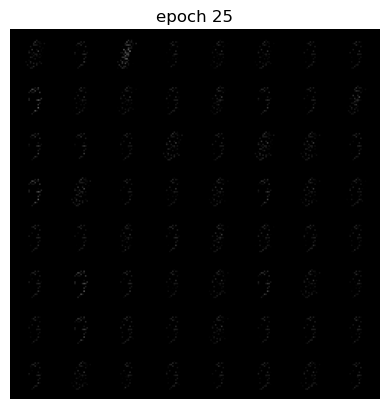

Epoch 25 of 100
Generator loss: 1.60675454, Discriminator loss: 0.94597054


  2%|▊                                            | 2/117 [00:00<00:08, 13.50it/s]

tensor(1.1244, grad_fn=<AddBackward0>)
tensor(1.1222, grad_fn=<AddBackward0>)
tensor(1.1309, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.31it/s]

tensor(1.1705, grad_fn=<AddBackward0>)
tensor(1.1489, grad_fn=<AddBackward0>)
tensor(1.2088, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.57it/s]

tensor(1.2633, grad_fn=<AddBackward0>)
tensor(1.2234, grad_fn=<AddBackward0>)
tensor(1.2897, grad_fn=<AddBackward0>)
tensor(1.2410, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 13.20it/s]

tensor(1.1941, grad_fn=<AddBackward0>)
tensor(1.1936, grad_fn=<AddBackward0>)
tensor(1.2043, grad_fn=<AddBackward0>)
tensor(1.0997, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:07, 14.13it/s]

tensor(1.0555, grad_fn=<AddBackward0>)
tensor(0.9877, grad_fn=<AddBackward0>)
tensor(0.9854, grad_fn=<AddBackward0>)
tensor(0.9282, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.55it/s]

tensor(0.8584, grad_fn=<AddBackward0>)
tensor(0.8101, grad_fn=<AddBackward0>)
tensor(0.7811, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.71it/s]

tensor(0.7431, grad_fn=<AddBackward0>)
tensor(0.7021, grad_fn=<AddBackward0>)
tensor(0.6780, grad_fn=<AddBackward0>)
tensor(0.6686, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.97it/s]

tensor(0.6386, grad_fn=<AddBackward0>)
tensor(0.6169, grad_fn=<AddBackward0>)
tensor(0.5999, grad_fn=<AddBackward0>)
tensor(0.6067, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.05it/s]

tensor(0.6028, grad_fn=<AddBackward0>)
tensor(0.5913, grad_fn=<AddBackward0>)
tensor(0.5824, grad_fn=<AddBackward0>)
tensor(0.5895, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.05it/s]

tensor(0.5673, grad_fn=<AddBackward0>)
tensor(0.5978, grad_fn=<AddBackward0>)
tensor(0.5877, grad_fn=<AddBackward0>)
tensor(0.6025, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.18it/s]

tensor(0.6012, grad_fn=<AddBackward0>)
tensor(0.6158, grad_fn=<AddBackward0>)
tensor(0.6276, grad_fn=<AddBackward0>)
tensor(0.6191, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.20it/s]

tensor(0.6442, grad_fn=<AddBackward0>)
tensor(0.6525, grad_fn=<AddBackward0>)
tensor(0.7223, grad_fn=<AddBackward0>)
tensor(0.7108, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.18it/s]

tensor(0.7460, grad_fn=<AddBackward0>)
tensor(0.7355, grad_fn=<AddBackward0>)
tensor(0.7925, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.22it/s]

tensor(0.8967, grad_fn=<AddBackward0>)
tensor(0.9772, grad_fn=<AddBackward0>)
tensor(1.0020, grad_fn=<AddBackward0>)
tensor(1.1177, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.24it/s]

tensor(1.1167, grad_fn=<AddBackward0>)
tensor(1.2193, grad_fn=<AddBackward0>)
tensor(1.2063, grad_fn=<AddBackward0>)
tensor(1.2217, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.30it/s]

tensor(1.1573, grad_fn=<AddBackward0>)
tensor(1.2403, grad_fn=<AddBackward0>)
tensor(1.1082, grad_fn=<AddBackward0>)
tensor(1.0859, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.19it/s]

tensor(1.0586, grad_fn=<AddBackward0>)
tensor(0.9533, grad_fn=<AddBackward0>)
tensor(0.8951, grad_fn=<AddBackward0>)
tensor(0.8921, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.12it/s]

tensor(0.8264, grad_fn=<AddBackward0>)
tensor(0.8083, grad_fn=<AddBackward0>)
tensor(0.7446, grad_fn=<AddBackward0>)
tensor(0.6843, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.11it/s]

tensor(0.6699, grad_fn=<AddBackward0>)
tensor(0.6773, grad_fn=<AddBackward0>)
tensor(0.7049, grad_fn=<AddBackward0>)
tensor(0.6221, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.05it/s]

tensor(0.6552, grad_fn=<AddBackward0>)
tensor(0.6642, grad_fn=<AddBackward0>)
tensor(0.6557, grad_fn=<AddBackward0>)
tensor(0.6775, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.02it/s]

tensor(0.7028, grad_fn=<AddBackward0>)
tensor(0.7325, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.98it/s]

tensor(0.8696, grad_fn=<AddBackward0>)
tensor(0.9285, grad_fn=<AddBackward0>)
tensor(1.0127, grad_fn=<AddBackward0>)
tensor(1.1195, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.92it/s]

tensor(1.2340, grad_fn=<AddBackward0>)
tensor(1.2630, grad_fn=<AddBackward0>)
tensor(1.4264, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.99it/s]

tensor(1.3642, grad_fn=<AddBackward0>)
tensor(1.4508, grad_fn=<AddBackward0>)
tensor(1.4107, grad_fn=<AddBackward0>)
tensor(1.4392, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.00it/s]

tensor(1.3841, grad_fn=<AddBackward0>)
tensor(1.3905, grad_fn=<AddBackward0>)
tensor(1.3461, grad_fn=<AddBackward0>)
tensor(1.3454, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.97it/s]

tensor(1.2968, grad_fn=<AddBackward0>)
tensor(1.2806, grad_fn=<AddBackward0>)
tensor(1.1967, grad_fn=<AddBackward0>)
tensor(1.2179, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 15.00it/s]

tensor(1.1713, grad_fn=<AddBackward0>)
tensor(1.1254, grad_fn=<AddBackward0>)
tensor(1.1314, grad_fn=<AddBackward0>)
tensor(1.0969, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.04it/s]

tensor(1.1062, grad_fn=<AddBackward0>)
tensor(1.0808, grad_fn=<AddBackward0>)
tensor(1.0662, grad_fn=<AddBackward0>)
tensor(1.0505, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.06it/s]

tensor(1.0470, grad_fn=<AddBackward0>)
tensor(1.0204, grad_fn=<AddBackward0>)
tensor(0.9795, grad_fn=<AddBackward0>)
tensor(0.9890, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.06it/s]

tensor(0.9571, grad_fn=<AddBackward0>)
tensor(0.9506, grad_fn=<AddBackward0>)
tensor(0.9298, grad_fn=<AddBackward0>)
tensor(0.9134, grad_fn=<AddBackward0>)


118it [00:07, 15.02it/s]                                                          


tensor(0.8983, grad_fn=<AddBackward0>)
tensor(0.8406, grad_fn=<AddBackward0>)
Epoch 26 of 100
Generator loss: 1.83434737, Discriminator loss: 0.95834380


  2%|▊                                            | 2/117 [00:00<00:07, 14.93it/s]

tensor(0.8659, grad_fn=<AddBackward0>)
tensor(0.8507, grad_fn=<AddBackward0>)
tensor(0.8150, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.00it/s]

tensor(0.8116, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)
tensor(0.7788, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.05it/s]

tensor(0.7961, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.02it/s]

tensor(0.7624, grad_fn=<AddBackward0>)
tensor(0.7609, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.94it/s]

tensor(0.7464, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.95it/s]

tensor(0.7335, grad_fn=<AddBackward0>)
tensor(0.7396, grad_fn=<AddBackward0>)
tensor(0.7355, grad_fn=<AddBackward0>)
tensor(0.7398, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.96it/s]

tensor(0.7274, grad_fn=<AddBackward0>)
tensor(0.7439, grad_fn=<AddBackward0>)
tensor(0.6954, grad_fn=<AddBackward0>)
tensor(0.7229, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.99it/s]

tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.7693, grad_fn=<AddBackward0>)
tensor(0.7384, grad_fn=<AddBackward0>)
tensor(0.7626, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.96it/s]

tensor(0.7742, grad_fn=<AddBackward0>)
tensor(0.7618, grad_fn=<AddBackward0>)
tensor(0.8197, grad_fn=<AddBackward0>)
tensor(0.8516, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.94it/s]

tensor(0.8542, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.91it/s]

tensor(0.8832, grad_fn=<AddBackward0>)
tensor(0.9084, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.97it/s]

tensor(0.9770, grad_fn=<AddBackward0>)
tensor(0.9595, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.90it/s]

tensor(0.9898, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.91it/s]

tensor(1.0504, grad_fn=<AddBackward0>)
tensor(1.0960, grad_fn=<AddBackward0>)
tensor(1.1886, grad_fn=<AddBackward0>)
tensor(1.2412, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.92it/s]

tensor(1.3435, grad_fn=<AddBackward0>)
tensor(1.3087, grad_fn=<AddBackward0>)
tensor(1.3670, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.88it/s]

tensor(1.3271, grad_fn=<AddBackward0>)
tensor(1.3595, grad_fn=<AddBackward0>)
tensor(1.2982, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.96it/s]

tensor(1.3334, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.92it/s]

tensor(1.2710, grad_fn=<AddBackward0>)
tensor(1.2303, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.87it/s]

tensor(1.2043, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.91it/s]

tensor(1.1753, grad_fn=<AddBackward0>)
tensor(1.1722, grad_fn=<AddBackward0>)
tensor(1.1621, grad_fn=<AddBackward0>)
tensor(1.1119, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.91it/s]

tensor(1.0582, grad_fn=<AddBackward0>)
tensor(1.0589, grad_fn=<AddBackward0>)
tensor(1.0376, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.86it/s]

tensor(0.9554, grad_fn=<AddBackward0>)
tensor(0.9337, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.82it/s]

tensor(0.8863, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.86it/s]

tensor(0.8490, grad_fn=<AddBackward0>)
tensor(0.8032, grad_fn=<AddBackward0>)
tensor(0.7888, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.87it/s]

tensor(0.7384, grad_fn=<AddBackward0>)
tensor(0.6921, grad_fn=<AddBackward0>)
tensor(0.6984, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.91it/s]

tensor(0.6806, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.96it/s]

tensor(0.6419, grad_fn=<AddBackward0>)
tensor(0.6447, grad_fn=<AddBackward0>)
tensor(0.6242, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.99it/s]

tensor(0.5985, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.96it/s]

tensor(0.6109, grad_fn=<AddBackward0>)
tensor(0.6352, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.93it/s]

tensor(0.6847, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.84it/s]

tensor(0.7129, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.8380, grad_fn=<AddBackward0>)
tensor(0.8555, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.96it/s]

tensor(0.8920, grad_fn=<AddBackward0>)
tensor(1.0065, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.97it/s]

tensor(1.1669, grad_fn=<AddBackward0>)
tensor(1.2062, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.97it/s]

tensor(1.2637, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.92it/s]

tensor(1.2641, grad_fn=<AddBackward0>)
tensor(1.3376, grad_fn=<AddBackward0>)
tensor(1.3903, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.96it/s]

tensor(1.3741, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.93it/s]

tensor(1.2979, grad_fn=<AddBackward0>)
tensor(1.2305, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.89it/s]

tensor(1.1235, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.91it/s]

tensor(1.0885, grad_fn=<AddBackward0>)
tensor(0.9980, grad_fn=<AddBackward0>)
tensor(0.9038, grad_fn=<AddBackward0>)
tensor(0.8700, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.93it/s]

tensor(0.8454, grad_fn=<AddBackward0>)
tensor(0.7784, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.91it/s]

tensor(0.7743, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.89it/s]

tensor(0.7248, grad_fn=<AddBackward0>)
tensor(0.7405, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.88it/s]

tensor(0.7312, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.6993, grad_fn=<AddBackward0>)
tensor(0.6959, grad_fn=<AddBackward0>)
tensor(0.7117, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.84it/s]

tensor(0.7051, grad_fn=<AddBackward0>)
tensor(0.7412, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.89it/s]

tensor(0.7341, grad_fn=<AddBackward0>)
tensor(0.7152, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.92it/s]

tensor(0.7105, grad_fn=<AddBackward0>)
tensor(0.7532, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.94it/s]

tensor(0.7589, grad_fn=<AddBackward0>)
tensor(0.7871, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.00it/s]

tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.7846, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.98it/s]

tensor(0.8227, grad_fn=<AddBackward0>)
tensor(0.8813, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.02it/s]

tensor(0.8747, grad_fn=<AddBackward0>)
tensor(0.9605, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.90it/s]

tensor(0.9903, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.86it/s]

tensor(1.0363, grad_fn=<AddBackward0>)
tensor(1.0169, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(1.0468, grad_fn=<AddBackward0>)
tensor(1.1570, grad_fn=<AddBackward0>)
Epoch 27 of 100
Generator loss: 1.94449306, Discriminator loss: 0.92290229


  2%|▊                                            | 2/117 [00:00<00:07, 14.61it/s]

tensor(1.0837, grad_fn=<AddBackward0>)
tensor(1.0336, grad_fn=<AddBackward0>)
tensor(0.9703, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.33it/s]

tensor(0.9811, grad_fn=<AddBackward0>)
tensor(0.9288, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.46it/s]

tensor(0.9841, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.47it/s]

tensor(0.9215, grad_fn=<AddBackward0>)
tensor(0.8718, grad_fn=<AddBackward0>)
tensor(0.8880, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.47it/s]

tensor(0.8495, grad_fn=<AddBackward0>)
tensor(0.8731, grad_fn=<AddBackward0>)
tensor(0.9051, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.69it/s]

tensor(0.8540, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.81it/s]

tensor(0.8497, grad_fn=<AddBackward0>)
tensor(0.9430, grad_fn=<AddBackward0>)
tensor(0.9136, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.90it/s]

tensor(0.9018, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.97it/s]

tensor(0.8728, grad_fn=<AddBackward0>)
tensor(0.9152, grad_fn=<AddBackward0>)
tensor(0.9659, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.90it/s]

tensor(0.9866, grad_fn=<AddBackward0>)
tensor(0.9483, grad_fn=<AddBackward0>)
tensor(1.0000, grad_fn=<AddBackward0>)
tensor(0.9396, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.97it/s]

tensor(1.0096, grad_fn=<AddBackward0>)
tensor(0.9781, grad_fn=<AddBackward0>)
tensor(1.0064, grad_fn=<AddBackward0>)
tensor(1.0596, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.08it/s]

tensor(1.0228, grad_fn=<AddBackward0>)
tensor(0.9498, grad_fn=<AddBackward0>)
tensor(0.9645, grad_fn=<AddBackward0>)
tensor(0.9420, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(0.9401, grad_fn=<AddBackward0>)
tensor(0.8513, grad_fn=<AddBackward0>)
tensor(0.8648, grad_fn=<AddBackward0>)
tensor(0.8140, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.01it/s]

tensor(0.7915, grad_fn=<AddBackward0>)
tensor(0.7807, grad_fn=<AddBackward0>)
tensor(0.7637, grad_fn=<AddBackward0>)
tensor(0.8047, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.02it/s]

tensor(0.7664, grad_fn=<AddBackward0>)
tensor(0.7609, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)
tensor(0.7584, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.07it/s]

tensor(0.7621, grad_fn=<AddBackward0>)
tensor(0.7649, grad_fn=<AddBackward0>)
tensor(0.8173, grad_fn=<AddBackward0>)
tensor(0.7897, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.04it/s]

tensor(0.8087, grad_fn=<AddBackward0>)
tensor(0.8078, grad_fn=<AddBackward0>)
tensor(0.8708, grad_fn=<AddBackward0>)
tensor(0.8495, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.00it/s]

tensor(0.9303, grad_fn=<AddBackward0>)
tensor(1.0028, grad_fn=<AddBackward0>)
tensor(1.0075, grad_fn=<AddBackward0>)
tensor(1.0794, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.89it/s]

tensor(1.1471, grad_fn=<AddBackward0>)
tensor(1.2133, grad_fn=<AddBackward0>)
tensor(1.2765, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.88it/s]

tensor(1.2437, grad_fn=<AddBackward0>)
tensor(1.3087, grad_fn=<AddBackward0>)
tensor(1.3068, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.88it/s]

tensor(1.3288, grad_fn=<AddBackward0>)
tensor(1.3881, grad_fn=<AddBackward0>)
tensor(1.3402, grad_fn=<AddBackward0>)
tensor(1.3840, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.89it/s]

tensor(1.3561, grad_fn=<AddBackward0>)
tensor(1.3244, grad_fn=<AddBackward0>)
tensor(1.2796, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.92it/s]

tensor(1.2262, grad_fn=<AddBackward0>)
tensor(1.1782, grad_fn=<AddBackward0>)
tensor(1.0943, grad_fn=<AddBackward0>)
tensor(1.0732, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.94it/s]

tensor(1.0251, grad_fn=<AddBackward0>)
tensor(1.0391, grad_fn=<AddBackward0>)
tensor(0.9662, grad_fn=<AddBackward0>)
tensor(0.9140, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.96it/s]

tensor(0.9293, grad_fn=<AddBackward0>)
tensor(0.8681, grad_fn=<AddBackward0>)
tensor(0.8271, grad_fn=<AddBackward0>)
tensor(0.7880, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.96it/s]

tensor(0.8092, grad_fn=<AddBackward0>)
tensor(0.8146, grad_fn=<AddBackward0>)
tensor(0.7507, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.88it/s]

tensor(0.7417, grad_fn=<AddBackward0>)
tensor(0.7355, grad_fn=<AddBackward0>)
tensor(0.7045, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.88it/s]

tensor(0.6778, grad_fn=<AddBackward0>)
tensor(0.6953, grad_fn=<AddBackward0>)
tensor(0.6813, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.87it/s]

tensor(0.6660, grad_fn=<AddBackward0>)
tensor(0.6551, grad_fn=<AddBackward0>)
tensor(0.6429, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.81it/s]

tensor(0.6518, grad_fn=<AddBackward0>)
tensor(0.6501, grad_fn=<AddBackward0>)
tensor(0.6463, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.6674, grad_fn=<AddBackward0>)
tensor(0.6486, grad_fn=<AddBackward0>)
tensor(0.6675, grad_fn=<AddBackward0>)
tensor(0.6671, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.97it/s]

tensor(0.7045, grad_fn=<AddBackward0>)
tensor(0.7187, grad_fn=<AddBackward0>)
tensor(0.6916, grad_fn=<AddBackward0>)
tensor(0.7308, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.98it/s]

tensor(0.7252, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.7382, grad_fn=<AddBackward0>)
tensor(0.8095, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.7816, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)
tensor(0.7878, grad_fn=<AddBackward0>)
tensor(0.8260, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.00it/s]

tensor(0.8553, grad_fn=<AddBackward0>)
tensor(0.8853, grad_fn=<AddBackward0>)
tensor(0.8788, grad_fn=<AddBackward0>)
tensor(0.9569, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(0.8971, grad_fn=<AddBackward0>)
tensor(0.8523, grad_fn=<AddBackward0>)
Epoch 28 of 100
Generator loss: 2.10636663, Discriminator loss: 0.91303736


  2%|▊                                            | 2/117 [00:00<00:07, 15.10it/s]

tensor(1.0406, grad_fn=<AddBackward0>)
tensor(1.1604, grad_fn=<AddBackward0>)
tensor(1.1868, grad_fn=<AddBackward0>)
tensor(1.1575, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.08it/s]

tensor(1.2932, grad_fn=<AddBackward0>)
tensor(1.3122, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.03it/s]

tensor(1.2925, grad_fn=<AddBackward0>)
tensor(1.3024, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.78it/s]

tensor(1.2797, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.73it/s]

tensor(1.2393, grad_fn=<AddBackward0>)
tensor(1.2146, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.75it/s]

tensor(1.0512, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.76it/s]

tensor(1.0108, grad_fn=<AddBackward0>)
tensor(0.9548, grad_fn=<AddBackward0>)
tensor(0.9020, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.82it/s]

tensor(0.9190, grad_fn=<AddBackward0>)
tensor(0.8847, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.94it/s]

tensor(0.7290, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.95it/s]

tensor(0.7209, grad_fn=<AddBackward0>)
tensor(0.6653, grad_fn=<AddBackward0>)
tensor(0.6986, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(0.6671, grad_fn=<AddBackward0>)
tensor(0.6784, grad_fn=<AddBackward0>)
tensor(0.6629, grad_fn=<AddBackward0>)
tensor(0.6279, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.99it/s]

tensor(0.6328, grad_fn=<AddBackward0>)
tensor(0.6527, grad_fn=<AddBackward0>)
tensor(0.6681, grad_fn=<AddBackward0>)
tensor(0.7161, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.93it/s]

tensor(0.8163, grad_fn=<AddBackward0>)
tensor(0.8026, grad_fn=<AddBackward0>)
tensor(0.8867, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.00it/s]

tensor(0.9395, grad_fn=<AddBackward0>)
tensor(0.9728, grad_fn=<AddBackward0>)
tensor(1.0228, grad_fn=<AddBackward0>)
tensor(1.0484, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.06it/s]

tensor(1.1913, grad_fn=<AddBackward0>)
tensor(1.2058, grad_fn=<AddBackward0>)
tensor(1.2274, grad_fn=<AddBackward0>)
tensor(1.4275, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.01it/s]

tensor(1.3322, grad_fn=<AddBackward0>)
tensor(1.4180, grad_fn=<AddBackward0>)
tensor(1.3869, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.97it/s]

tensor(1.3137, grad_fn=<AddBackward0>)
tensor(1.2723, grad_fn=<AddBackward0>)
tensor(1.3046, grad_fn=<AddBackward0>)
tensor(1.2220, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.99it/s]

tensor(1.2187, grad_fn=<AddBackward0>)
tensor(1.2292, grad_fn=<AddBackward0>)
tensor(1.2414, grad_fn=<AddBackward0>)
tensor(1.2026, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.94it/s]

tensor(1.1683, grad_fn=<AddBackward0>)
tensor(1.1443, grad_fn=<AddBackward0>)
tensor(1.1266, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.90it/s]

tensor(1.1408, grad_fn=<AddBackward0>)
tensor(1.1265, grad_fn=<AddBackward0>)
tensor(1.1151, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.92it/s]

tensor(1.0895, grad_fn=<AddBackward0>)
tensor(1.0792, grad_fn=<AddBackward0>)
tensor(1.0916, grad_fn=<AddBackward0>)
tensor(1.0782, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.93it/s]

tensor(1.0399, grad_fn=<AddBackward0>)
tensor(1.0224, grad_fn=<AddBackward0>)
tensor(1.0028, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.89it/s]

tensor(1.0051, grad_fn=<AddBackward0>)
tensor(0.9819, grad_fn=<AddBackward0>)
tensor(0.9281, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.82it/s]

tensor(0.9448, grad_fn=<AddBackward0>)
tensor(0.9241, grad_fn=<AddBackward0>)
tensor(0.9402, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.87it/s]

tensor(0.9197, grad_fn=<AddBackward0>)
tensor(0.9349, grad_fn=<AddBackward0>)
tensor(0.9074, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.85it/s]

tensor(0.9269, grad_fn=<AddBackward0>)
tensor(0.9458, grad_fn=<AddBackward0>)
tensor(0.9800, grad_fn=<AddBackward0>)
tensor(0.9903, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.92it/s]

tensor(0.9823, grad_fn=<AddBackward0>)
tensor(1.0524, grad_fn=<AddBackward0>)
tensor(1.0265, grad_fn=<AddBackward0>)
tensor(1.1345, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.94it/s]

tensor(1.1124, grad_fn=<AddBackward0>)
tensor(1.2199, grad_fn=<AddBackward0>)
tensor(1.2350, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.87it/s]

tensor(1.2983, grad_fn=<AddBackward0>)
tensor(1.3202, grad_fn=<AddBackward0>)
tensor(1.2578, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.87it/s]

tensor(1.3079, grad_fn=<AddBackward0>)
tensor(1.3268, grad_fn=<AddBackward0>)
tensor(1.4212, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.89it/s]

tensor(1.3631, grad_fn=<AddBackward0>)
tensor(1.2759, grad_fn=<AddBackward0>)
tensor(1.3014, grad_fn=<AddBackward0>)
tensor(1.2357, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.91it/s]

tensor(1.1853, grad_fn=<AddBackward0>)
tensor(1.1580, grad_fn=<AddBackward0>)
tensor(1.1297, grad_fn=<AddBackward0>)
tensor(1.1840, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.91it/s]

tensor(1.1165, grad_fn=<AddBackward0>)
tensor(1.0531, grad_fn=<AddBackward0>)
tensor(0.9687, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.91it/s]

tensor(0.9995, grad_fn=<AddBackward0>)
tensor(0.9385, grad_fn=<AddBackward0>)
tensor(0.9651, grad_fn=<AddBackward0>)
tensor(0.8851, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.00it/s]

tensor(0.8884, grad_fn=<AddBackward0>)
tensor(0.8724, grad_fn=<AddBackward0>)
tensor(0.8669, grad_fn=<AddBackward0>)
tensor(0.7983, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.97it/s]

tensor(0.8472, grad_fn=<AddBackward0>)
tensor(0.7857, grad_fn=<AddBackward0>)
tensor(0.8263, grad_fn=<AddBackward0>)
tensor(0.8428, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(0.8621, grad_fn=<AddBackward0>)
tensor(0.9060, grad_fn=<AddBackward0>)
tensor(0.9159, grad_fn=<AddBackward0>)
tensor(0.9077, grad_fn=<AddBackward0>)
Epoch 29 of 100
Generator loss: 2.12281322, Discriminator loss: 1.05253148


  2%|▊                                            | 2/117 [00:00<00:07, 14.66it/s]

tensor(0.9049, grad_fn=<AddBackward0>)
tensor(0.9201, grad_fn=<AddBackward0>)
tensor(0.9758, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.53it/s]

tensor(0.9720, grad_fn=<AddBackward0>)
tensor(1.0242, grad_fn=<AddBackward0>)
tensor(0.9871, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.46it/s]

tensor(1.0703, grad_fn=<AddBackward0>)
tensor(1.1334, grad_fn=<AddBackward0>)
tensor(1.0899, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.30it/s]

tensor(1.1697, grad_fn=<AddBackward0>)
tensor(1.1759, grad_fn=<AddBackward0>)
tensor(1.1544, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:07, 14.38it/s]

tensor(1.2616, grad_fn=<AddBackward0>)
tensor(1.3201, grad_fn=<AddBackward0>)
tensor(1.2171, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.69it/s]

tensor(1.3432, grad_fn=<AddBackward0>)
tensor(1.2495, grad_fn=<AddBackward0>)
tensor(1.2833, grad_fn=<AddBackward0>)
tensor(1.2282, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.77it/s]

tensor(1.2645, grad_fn=<AddBackward0>)
tensor(1.2382, grad_fn=<AddBackward0>)
tensor(1.2227, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.86it/s]

tensor(1.2311, grad_fn=<AddBackward0>)
tensor(1.1752, grad_fn=<AddBackward0>)
tensor(1.1433, grad_fn=<AddBackward0>)
tensor(1.1520, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.94it/s]

tensor(1.1622, grad_fn=<AddBackward0>)
tensor(1.1675, grad_fn=<AddBackward0>)
tensor(1.1517, grad_fn=<AddBackward0>)
tensor(1.1063, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.90it/s]

tensor(1.1220, grad_fn=<AddBackward0>)
tensor(1.0962, grad_fn=<AddBackward0>)
tensor(1.0733, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.91it/s]

tensor(1.0488, grad_fn=<AddBackward0>)
tensor(1.0432, grad_fn=<AddBackward0>)
tensor(1.0349, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.97it/s]

tensor(1.0543, grad_fn=<AddBackward0>)
tensor(1.0116, grad_fn=<AddBackward0>)
tensor(0.9848, grad_fn=<AddBackward0>)
tensor(0.9872, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.91it/s]

tensor(0.9773, grad_fn=<AddBackward0>)
tensor(0.9366, grad_fn=<AddBackward0>)
tensor(0.9206, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.88it/s]

tensor(0.9069, grad_fn=<AddBackward0>)
tensor(0.9833, grad_fn=<AddBackward0>)
tensor(0.9183, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.91it/s]

tensor(0.9510, grad_fn=<AddBackward0>)
tensor(0.9196, grad_fn=<AddBackward0>)
tensor(0.8863, grad_fn=<AddBackward0>)
tensor(0.9205, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.88it/s]

tensor(0.9081, grad_fn=<AddBackward0>)
tensor(0.8641, grad_fn=<AddBackward0>)
tensor(0.8917, grad_fn=<AddBackward0>)
tensor(0.8879, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.01it/s]

tensor(0.8578, grad_fn=<AddBackward0>)
tensor(0.8550, grad_fn=<AddBackward0>)
tensor(0.8276, grad_fn=<AddBackward0>)
tensor(0.8317, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.01it/s]

tensor(0.7994, grad_fn=<AddBackward0>)
tensor(0.7652, grad_fn=<AddBackward0>)
tensor(0.7954, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.89it/s]

tensor(0.7504, grad_fn=<AddBackward0>)
tensor(0.7468, grad_fn=<AddBackward0>)
tensor(0.7191, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.86it/s]

tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.7288, grad_fn=<AddBackward0>)
tensor(0.6825, grad_fn=<AddBackward0>)
tensor(0.6718, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.87it/s]

tensor(0.6767, grad_fn=<AddBackward0>)
tensor(0.6612, grad_fn=<AddBackward0>)
tensor(0.6662, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.87it/s]

tensor(0.6372, grad_fn=<AddBackward0>)
tensor(0.6281, grad_fn=<AddBackward0>)
tensor(0.6660, grad_fn=<AddBackward0>)
tensor(0.6405, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.89it/s]

tensor(0.6722, grad_fn=<AddBackward0>)
tensor(0.6692, grad_fn=<AddBackward0>)
tensor(0.7056, grad_fn=<AddBackward0>)
tensor(0.6630, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.83it/s]

tensor(0.6895, grad_fn=<AddBackward0>)
tensor(0.6773, grad_fn=<AddBackward0>)
tensor(0.7313, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.87it/s]

tensor(0.7412, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)
tensor(0.7731, grad_fn=<AddBackward0>)
tensor(0.7890, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.86it/s]

tensor(0.8429, grad_fn=<AddBackward0>)
tensor(0.8736, grad_fn=<AddBackward0>)
tensor(0.9130, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.82it/s]

tensor(0.9622, grad_fn=<AddBackward0>)
tensor(0.9694, grad_fn=<AddBackward0>)
tensor(1.0039, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.80it/s]

tensor(1.0605, grad_fn=<AddBackward0>)
tensor(1.1146, grad_fn=<AddBackward0>)
tensor(1.0999, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.83it/s]

tensor(1.1588, grad_fn=<AddBackward0>)
tensor(1.1961, grad_fn=<AddBackward0>)
tensor(1.2623, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.83it/s]

tensor(1.2083, grad_fn=<AddBackward0>)
tensor(1.2219, grad_fn=<AddBackward0>)
tensor(1.1522, grad_fn=<AddBackward0>)
tensor(1.1447, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.88it/s]

tensor(1.1426, grad_fn=<AddBackward0>)
tensor(1.1015, grad_fn=<AddBackward0>)
tensor(1.0264, grad_fn=<AddBackward0>)
tensor(1.0227, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.92it/s]

tensor(0.9769, grad_fn=<AddBackward0>)
tensor(0.9537, grad_fn=<AddBackward0>)
tensor(0.9040, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.90it/s]

tensor(0.9132, grad_fn=<AddBackward0>)
tensor(0.8924, grad_fn=<AddBackward0>)
tensor(0.8606, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.93it/s]

tensor(0.8120, grad_fn=<AddBackward0>)
tensor(0.8331, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.7758, grad_fn=<AddBackward0>)


118it [00:07, 14.93it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7391, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)


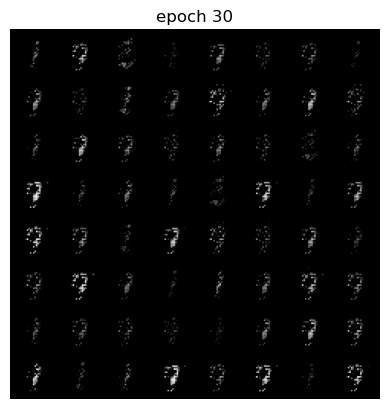

Epoch 30 of 100
Generator loss: 1.82910025, Discriminator loss: 0.96281147


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.7789, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.39it/s]

tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.8146, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.47it/s]

tensor(0.8076, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.64it/s]

tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.9010, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.70it/s]

tensor(0.9773, grad_fn=<AddBackward0>)
tensor(1.1383, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.80it/s]

tensor(1.1399, grad_fn=<AddBackward0>)
tensor(1.1980, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.92it/s]

tensor(1.2565, grad_fn=<AddBackward0>)
tensor(1.3921, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.92it/s]

tensor(1.4339, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.93it/s]

tensor(1.3793, grad_fn=<AddBackward0>)
tensor(1.4629, grad_fn=<AddBackward0>)
tensor(1.3797, grad_fn=<AddBackward0>)
tensor(1.3398, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.04it/s]

tensor(1.2571, grad_fn=<AddBackward0>)
tensor(1.2381, grad_fn=<AddBackward0>)
tensor(1.1618, grad_fn=<AddBackward0>)
tensor(1.2441, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.89it/s]

tensor(1.1286, grad_fn=<AddBackward0>)
tensor(1.1458, grad_fn=<AddBackward0>)
tensor(1.1064, grad_fn=<AddBackward0>)
tensor(1.0353, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.00it/s]

tensor(1.0966, grad_fn=<AddBackward0>)
tensor(1.0993, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.95it/s]

tensor(1.0720, grad_fn=<AddBackward0>)
tensor(1.0725, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.00it/s]

tensor(1.0574, grad_fn=<AddBackward0>)
tensor(1.1051, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.03it/s]

tensor(1.0568, grad_fn=<AddBackward0>)
tensor(1.1405, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.98it/s]

tensor(1.0959, grad_fn=<AddBackward0>)
tensor(1.1439, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.94it/s]

tensor(1.1753, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.82it/s]

tensor(1.2458, grad_fn=<AddBackward0>)
tensor(1.2651, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.78it/s]

tensor(1.2217, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.81it/s]

tensor(1.2785, grad_fn=<AddBackward0>)
tensor(1.2980, grad_fn=<AddBackward0>)
tensor(1.2729, grad_fn=<AddBackward0>)
tensor(1.3122, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.87it/s]

tensor(1.3126, grad_fn=<AddBackward0>)
tensor(1.2777, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.88it/s]

tensor(1.2834, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.84it/s]

tensor(1.3355, grad_fn=<AddBackward0>)
tensor(1.2530, grad_fn=<AddBackward0>)
tensor(1.2507, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.90it/s]

tensor(1.2002, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.92it/s]

tensor(1.2048, grad_fn=<AddBackward0>)
tensor(1.1593, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.88it/s]

tensor(1.1282, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.87it/s]

tensor(1.0836, grad_fn=<AddBackward0>)
tensor(1.0346, grad_fn=<AddBackward0>)
tensor(1.0272, grad_fn=<AddBackward0>)
tensor(1.0008, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.95it/s]

tensor(0.9499, grad_fn=<AddBackward0>)
tensor(0.9632, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.00it/s]

tensor(0.9204, grad_fn=<AddBackward0>)
tensor(0.8722, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.96it/s]

tensor(0.8413, grad_fn=<AddBackward0>)
tensor(0.8187, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.94it/s]

tensor(0.7828, grad_fn=<AddBackward0>)
tensor(0.7633, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.93it/s]

tensor(0.7474, grad_fn=<AddBackward0>)
tensor(0.6810, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.91it/s]

tensor(0.7150, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.90it/s]

tensor(0.6849, grad_fn=<AddBackward0>)
tensor(0.6628, grad_fn=<AddBackward0>)
tensor(0.6676, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.97it/s]

tensor(0.6358, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.90it/s]

tensor(0.6552, grad_fn=<AddBackward0>)
tensor(0.6287, grad_fn=<AddBackward0>)
tensor(0.6340, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.04it/s]

tensor(0.6790, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.00it/s]

tensor(0.6507, grad_fn=<AddBackward0>)
tensor(0.6726, grad_fn=<AddBackward0>)
tensor(0.6968, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.00it/s]

tensor(0.6729, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.06it/s]

tensor(0.6676, grad_fn=<AddBackward0>)
tensor(0.7179, grad_fn=<AddBackward0>)
tensor(0.7237, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.03it/s]

tensor(0.7704, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.08it/s]

tensor(0.7492, grad_fn=<AddBackward0>)
tensor(0.7432, grad_fn=<AddBackward0>)
tensor(0.7759, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.05it/s]

tensor(0.8026, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.02it/s]

tensor(0.7661, grad_fn=<AddBackward0>)
tensor(0.7700, grad_fn=<AddBackward0>)
tensor(0.8001, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.08it/s]

tensor(0.7946, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.96it/s]

tensor(0.8040, grad_fn=<AddBackward0>)
tensor(0.7875, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.91it/s]

tensor(0.7573, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.8018, grad_fn=<AddBackward0>)
tensor(0.8187, grad_fn=<AddBackward0>)
tensor(0.7673, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.81it/s]

tensor(0.7526, grad_fn=<AddBackward0>)
tensor(0.7222, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.83it/s]

tensor(0.7806, grad_fn=<AddBackward0>)
tensor(0.8043, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.96it/s]

tensor(0.7777, grad_fn=<AddBackward0>)
tensor(0.7866, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.94it/s]

tensor(0.7705, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.92it/s]

tensor(0.7580, grad_fn=<AddBackward0>)
tensor(0.7800, grad_fn=<AddBackward0>)
tensor(0.8201, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.88it/s]

tensor(0.8159, grad_fn=<AddBackward0>)
tensor(0.8593, grad_fn=<AddBackward0>)
tensor(0.8317, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.96it/s]

tensor(0.8672, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.86it/s]

tensor(0.9033, grad_fn=<AddBackward0>)
tensor(0.8664, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.83it/s]

tensor(0.8694, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(0.9009, grad_fn=<AddBackward0>)
tensor(0.9261, grad_fn=<AddBackward0>)
Epoch 31 of 100
Generator loss: 2.05596542, Discriminator loss: 0.96785897


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8579, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.84it/s]

tensor(0.8391, grad_fn=<AddBackward0>)
tensor(0.8169, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.82it/s]

tensor(0.7847, grad_fn=<AddBackward0>)
tensor(0.7921, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.82it/s]

tensor(0.8235, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.79it/s]

tensor(0.8634, grad_fn=<AddBackward0>)
tensor(0.9111, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.70it/s]

tensor(1.0137, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.66it/s]

tensor(1.0568, grad_fn=<AddBackward0>)
tensor(1.0193, grad_fn=<AddBackward0>)
tensor(1.1847, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:07, 14.54it/s]

tensor(1.1962, grad_fn=<AddBackward0>)
tensor(1.2212, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.47it/s]

tensor(1.2908, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.64it/s]

tensor(1.2910, grad_fn=<AddBackward0>)
tensor(1.3375, grad_fn=<AddBackward0>)
tensor(1.3280, grad_fn=<AddBackward0>)
tensor(1.4038, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.84it/s]

tensor(1.3811, grad_fn=<AddBackward0>)
tensor(1.2889, grad_fn=<AddBackward0>)
tensor(1.3595, grad_fn=<AddBackward0>)
tensor(1.3190, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.87it/s]

tensor(1.2394, grad_fn=<AddBackward0>)
tensor(1.2408, grad_fn=<AddBackward0>)
tensor(1.1744, grad_fn=<AddBackward0>)
tensor(1.1694, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.92it/s]

tensor(1.1619, grad_fn=<AddBackward0>)
tensor(1.1476, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.89it/s]

tensor(1.1784, grad_fn=<AddBackward0>)
tensor(1.0957, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.91it/s]

tensor(1.0892, grad_fn=<AddBackward0>)
tensor(1.1039, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.92it/s]

tensor(1.1659, grad_fn=<AddBackward0>)
tensor(1.1988, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.93it/s]

tensor(1.2384, grad_fn=<AddBackward0>)
tensor(1.1984, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.94it/s]

tensor(1.1807, grad_fn=<AddBackward0>)
tensor(1.1234, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.02it/s]

tensor(1.0454, grad_fn=<AddBackward0>)
tensor(1.0870, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.03it/s]

tensor(1.0061, grad_fn=<AddBackward0>)
tensor(0.9077, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.97it/s]

tensor(0.8876, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.96it/s]

tensor(0.7924, grad_fn=<AddBackward0>)
tensor(0.7076, grad_fn=<AddBackward0>)
tensor(0.6707, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.95it/s]

tensor(0.6392, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.03it/s]

tensor(0.6680, grad_fn=<AddBackward0>)
tensor(0.6879, grad_fn=<AddBackward0>)
tensor(0.8218, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.01it/s]

tensor(0.8536, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.97it/s]

tensor(0.9037, grad_fn=<AddBackward0>)
tensor(1.0757, grad_fn=<AddBackward0>)
tensor(1.0001, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.93it/s]

tensor(1.0910, grad_fn=<AddBackward0>)
tensor(1.1519, grad_fn=<AddBackward0>)
tensor(1.0654, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.91it/s]

tensor(1.2315, grad_fn=<AddBackward0>)
tensor(1.2702, grad_fn=<AddBackward0>)
tensor(1.3412, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 13.92it/s]

tensor(1.3438, grad_fn=<AddBackward0>)
tensor(1.3466, grad_fn=<AddBackward0>)
tensor(1.4352, grad_fn=<AddBackward0>)
tensor(1.3542, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.47it/s]

tensor(1.3263, grad_fn=<AddBackward0>)
tensor(1.3831, grad_fn=<AddBackward0>)
tensor(1.3490, grad_fn=<AddBackward0>)
tensor(1.3869, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.77it/s]

tensor(1.3219, grad_fn=<AddBackward0>)
tensor(1.3178, grad_fn=<AddBackward0>)
tensor(1.3107, grad_fn=<AddBackward0>)
tensor(1.2938, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.91it/s]

tensor(1.2716, grad_fn=<AddBackward0>)
tensor(1.2735, grad_fn=<AddBackward0>)
tensor(1.2237, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.86it/s]

tensor(1.2066, grad_fn=<AddBackward0>)
tensor(1.1767, grad_fn=<AddBackward0>)
tensor(1.1585, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.92it/s]

tensor(1.1305, grad_fn=<AddBackward0>)
tensor(1.0988, grad_fn=<AddBackward0>)
tensor(1.0598, grad_fn=<AddBackward0>)
tensor(0.9988, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.88it/s]

tensor(0.9614, grad_fn=<AddBackward0>)
tensor(0.9536, grad_fn=<AddBackward0>)
tensor(0.9149, grad_fn=<AddBackward0>)
tensor(0.9007, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 13.81it/s]

tensor(0.8868, grad_fn=<AddBackward0>)
tensor(0.9007, grad_fn=<AddBackward0>)
tensor(0.8231, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 13.94it/s]

tensor(0.7712, grad_fn=<AddBackward0>)
tensor(0.8140, grad_fn=<AddBackward0>)
tensor(0.7555, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.20it/s]

tensor(0.7294, grad_fn=<AddBackward0>)
tensor(0.7176, grad_fn=<AddBackward0>)
tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.6702, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.52it/s]

tensor(0.6411, grad_fn=<AddBackward0>)
tensor(0.6569, grad_fn=<AddBackward0>)
tensor(0.6287, grad_fn=<AddBackward0>)
tensor(0.6252, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.75it/s]

tensor(0.6199, grad_fn=<AddBackward0>)
tensor(0.6125, grad_fn=<AddBackward0>)
tensor(0.5758, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.83it/s]

tensor(0.5931, grad_fn=<AddBackward0>)
tensor(0.6071, grad_fn=<AddBackward0>)
tensor(0.5790, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.79it/s]

tensor(0.5774, grad_fn=<AddBackward0>)
tensor(0.5740, grad_fn=<AddBackward0>)
tensor(0.5803, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.87it/s]

tensor(0.5686, grad_fn=<AddBackward0>)
tensor(0.5792, grad_fn=<AddBackward0>)
tensor(0.6050, grad_fn=<AddBackward0>)
tensor(0.6119, grad_fn=<AddBackward0>)


118it [00:07, 14.79it/s]                                                          


tensor(0.6105, grad_fn=<AddBackward0>)
tensor(0.6056, grad_fn=<AddBackward0>)
tensor(0.5672, grad_fn=<AddBackward0>)
Epoch 32 of 100
Generator loss: 2.14262319, Discriminator loss: 1.00107992


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.6299, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.88it/s]

tensor(0.6452, grad_fn=<AddBackward0>)
tensor(0.6661, grad_fn=<AddBackward0>)
tensor(0.6926, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.99it/s]

tensor(0.7176, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.96it/s]

tensor(0.7568, grad_fn=<AddBackward0>)
tensor(0.7746, grad_fn=<AddBackward0>)
tensor(0.8079, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.06it/s]

tensor(0.8566, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.03it/s]

tensor(0.9495, grad_fn=<AddBackward0>)
tensor(0.9396, grad_fn=<AddBackward0>)
tensor(0.9761, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.08it/s]

tensor(0.9742, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.08it/s]

tensor(1.0064, grad_fn=<AddBackward0>)
tensor(1.0387, grad_fn=<AddBackward0>)
tensor(1.0614, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:07, 13.86it/s]

tensor(1.0515, grad_fn=<AddBackward0>)
tensor(1.0281, grad_fn=<AddBackward0>)
tensor(1.0535, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.30it/s]

tensor(1.0078, grad_fn=<AddBackward0>)
tensor(1.0106, grad_fn=<AddBackward0>)
tensor(0.9216, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.53it/s]

tensor(0.8759, grad_fn=<AddBackward0>)
tensor(0.9309, grad_fn=<AddBackward0>)
tensor(0.8553, grad_fn=<AddBackward0>)
tensor(0.8226, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.75it/s]

tensor(0.8364, grad_fn=<AddBackward0>)
tensor(0.7939, grad_fn=<AddBackward0>)
tensor(0.7378, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.80it/s]

tensor(0.7357, grad_fn=<AddBackward0>)
tensor(0.7086, grad_fn=<AddBackward0>)
tensor(0.6799, grad_fn=<AddBackward0>)
tensor(0.6863, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.20it/s]

tensor(0.6881, grad_fn=<AddBackward0>)
tensor(0.6576, grad_fn=<AddBackward0>)
tensor(0.6457, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 13.62it/s]

tensor(0.6172, grad_fn=<AddBackward0>)
tensor(0.6199, grad_fn=<AddBackward0>)
tensor(0.6007, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.15it/s]

tensor(0.5687, grad_fn=<AddBackward0>)
tensor(0.5863, grad_fn=<AddBackward0>)
tensor(0.5756, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:05, 14.37it/s]

tensor(0.5763, grad_fn=<AddBackward0>)
tensor(0.5790, grad_fn=<AddBackward0>)
tensor(0.5559, grad_fn=<AddBackward0>)
tensor(0.5622, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.77it/s]

tensor(0.5703, grad_fn=<AddBackward0>)
tensor(0.5600, grad_fn=<AddBackward0>)
tensor(0.5432, grad_fn=<AddBackward0>)
tensor(0.5581, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.90it/s]

tensor(0.5448, grad_fn=<AddBackward0>)
tensor(0.5367, grad_fn=<AddBackward0>)
tensor(0.5546, grad_fn=<AddBackward0>)
tensor(0.5354, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.07it/s]

tensor(0.5646, grad_fn=<AddBackward0>)
tensor(0.5658, grad_fn=<AddBackward0>)
tensor(0.5713, grad_fn=<AddBackward0>)
tensor(0.5843, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.09it/s]

tensor(0.5725, grad_fn=<AddBackward0>)
tensor(0.5864, grad_fn=<AddBackward0>)
tensor(0.6045, grad_fn=<AddBackward0>)
tensor(0.6094, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.08it/s]

tensor(0.5964, grad_fn=<AddBackward0>)
tensor(0.6246, grad_fn=<AddBackward0>)
tensor(0.6330, grad_fn=<AddBackward0>)
tensor(0.6431, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.04it/s]

tensor(0.6914, grad_fn=<AddBackward0>)
tensor(0.6648, grad_fn=<AddBackward0>)
tensor(0.7153, grad_fn=<AddBackward0>)
tensor(0.6761, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.96it/s]

tensor(0.7234, grad_fn=<AddBackward0>)
tensor(0.7305, grad_fn=<AddBackward0>)
tensor(0.7201, grad_fn=<AddBackward0>)
tensor(0.7179, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.96it/s]

tensor(0.7535, grad_fn=<AddBackward0>)
tensor(0.7598, grad_fn=<AddBackward0>)
tensor(0.7606, grad_fn=<AddBackward0>)
tensor(0.7800, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.97it/s]

tensor(0.7688, grad_fn=<AddBackward0>)
tensor(0.7415, grad_fn=<AddBackward0>)
tensor(0.7611, grad_fn=<AddBackward0>)
tensor(0.7396, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.87it/s]

tensor(0.7568, grad_fn=<AddBackward0>)
tensor(0.7500, grad_fn=<AddBackward0>)
tensor(0.7342, grad_fn=<AddBackward0>)
tensor(0.6990, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.95it/s]

tensor(0.7010, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.7193, grad_fn=<AddBackward0>)
tensor(0.7026, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.97it/s]

tensor(0.7405, grad_fn=<AddBackward0>)
tensor(0.7452, grad_fn=<AddBackward0>)
tensor(0.7370, grad_fn=<AddBackward0>)
tensor(0.7639, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.96it/s]

tensor(0.7750, grad_fn=<AddBackward0>)
tensor(0.7447, grad_fn=<AddBackward0>)
tensor(0.7525, grad_fn=<AddBackward0>)
tensor(0.7506, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.01it/s]

tensor(0.7060, grad_fn=<AddBackward0>)
tensor(0.7170, grad_fn=<AddBackward0>)
tensor(0.6615, grad_fn=<AddBackward0>)
tensor(0.6520, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 15.00it/s]

tensor(0.6543, grad_fn=<AddBackward0>)
tensor(0.6296, grad_fn=<AddBackward0>)
tensor(0.5920, grad_fn=<AddBackward0>)
tensor(0.5995, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.95it/s]

tensor(0.6161, grad_fn=<AddBackward0>)
tensor(0.6082, grad_fn=<AddBackward0>)
tensor(0.6070, grad_fn=<AddBackward0>)
tensor(0.6351, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.02it/s]

tensor(0.6214, grad_fn=<AddBackward0>)
tensor(0.6647, grad_fn=<AddBackward0>)
tensor(0.6330, grad_fn=<AddBackward0>)
tensor(0.6856, grad_fn=<AddBackward0>)


118it [00:07, 14.88it/s]                                                          


tensor(0.7173, grad_fn=<AddBackward0>)
tensor(0.6798, grad_fn=<AddBackward0>)
tensor(0.7242, grad_fn=<AddBackward0>)
tensor(0.7407, grad_fn=<AddBackward0>)
Epoch 33 of 100
Generator loss: 2.37838364, Discriminator loss: 0.72013706


  2%|▊                                            | 2/117 [00:00<00:07, 15.14it/s]

tensor(0.7363, grad_fn=<AddBackward0>)
tensor(0.7634, grad_fn=<AddBackward0>)
tensor(0.8191, grad_fn=<AddBackward0>)
tensor(0.8547, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.98it/s]

tensor(0.9004, grad_fn=<AddBackward0>)
tensor(0.9280, grad_fn=<AddBackward0>)
tensor(0.8891, grad_fn=<AddBackward0>)
tensor(0.8997, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.91it/s]

tensor(0.8729, grad_fn=<AddBackward0>)
tensor(0.9417, grad_fn=<AddBackward0>)
tensor(0.8575, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.77it/s]

tensor(0.8320, grad_fn=<AddBackward0>)
tensor(0.7991, grad_fn=<AddBackward0>)
tensor(0.7292, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.62it/s]

tensor(0.7074, grad_fn=<AddBackward0>)
tensor(0.7144, grad_fn=<AddBackward0>)
tensor(0.6867, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.48it/s]

tensor(0.6731, grad_fn=<AddBackward0>)
tensor(0.6600, grad_fn=<AddBackward0>)
tensor(0.6338, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.50it/s]

tensor(0.6458, grad_fn=<AddBackward0>)
tensor(0.6563, grad_fn=<AddBackward0>)
tensor(0.6475, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.45it/s]

tensor(0.6406, grad_fn=<AddBackward0>)
tensor(0.6044, grad_fn=<AddBackward0>)
tensor(0.6214, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.56it/s]

tensor(0.6089, grad_fn=<AddBackward0>)
tensor(0.6171, grad_fn=<AddBackward0>)
tensor(0.6005, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.77it/s]

tensor(0.5737, grad_fn=<AddBackward0>)
tensor(0.6101, grad_fn=<AddBackward0>)
tensor(0.6543, grad_fn=<AddBackward0>)
tensor(0.6307, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.78it/s]

tensor(0.6282, grad_fn=<AddBackward0>)
tensor(0.6627, grad_fn=<AddBackward0>)
tensor(0.6704, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.85it/s]

tensor(0.6438, grad_fn=<AddBackward0>)
tensor(0.7346, grad_fn=<AddBackward0>)
tensor(0.7083, grad_fn=<AddBackward0>)
tensor(0.6945, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.90it/s]

tensor(0.7418, grad_fn=<AddBackward0>)
tensor(0.7515, grad_fn=<AddBackward0>)
tensor(0.7792, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.89it/s]

tensor(0.8524, grad_fn=<AddBackward0>)
tensor(0.8261, grad_fn=<AddBackward0>)
tensor(0.8635, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.90it/s]

tensor(0.8065, grad_fn=<AddBackward0>)
tensor(0.8300, grad_fn=<AddBackward0>)
tensor(0.8277, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.43it/s]

tensor(0.9166, grad_fn=<AddBackward0>)
tensor(0.9000, grad_fn=<AddBackward0>)
tensor(0.8585, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.31it/s]

tensor(0.8423, grad_fn=<AddBackward0>)
tensor(0.8710, grad_fn=<AddBackward0>)
tensor(0.8851, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.53it/s]

tensor(0.8711, grad_fn=<AddBackward0>)
tensor(0.9298, grad_fn=<AddBackward0>)
tensor(0.8770, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.66it/s]

tensor(0.9256, grad_fn=<AddBackward0>)
tensor(0.9162, grad_fn=<AddBackward0>)
tensor(0.8884, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.72it/s]

tensor(0.8959, grad_fn=<AddBackward0>)
tensor(0.8637, grad_fn=<AddBackward0>)
tensor(0.7954, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.76it/s]

tensor(0.7595, grad_fn=<AddBackward0>)
tensor(0.7079, grad_fn=<AddBackward0>)
tensor(0.7027, grad_fn=<AddBackward0>)
tensor(0.6765, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.95it/s]

tensor(0.6623, grad_fn=<AddBackward0>)
tensor(0.6063, grad_fn=<AddBackward0>)
tensor(0.5981, grad_fn=<AddBackward0>)
tensor(0.5907, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.90it/s]

tensor(0.5787, grad_fn=<AddBackward0>)
tensor(0.5723, grad_fn=<AddBackward0>)
tensor(0.5489, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.89it/s]

tensor(0.5990, grad_fn=<AddBackward0>)
tensor(0.5663, grad_fn=<AddBackward0>)
tensor(0.5908, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.88it/s]

tensor(0.5786, grad_fn=<AddBackward0>)
tensor(0.5814, grad_fn=<AddBackward0>)
tensor(0.5820, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.90it/s]

tensor(0.6279, grad_fn=<AddBackward0>)
tensor(0.6035, grad_fn=<AddBackward0>)
tensor(0.6378, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.89it/s]

tensor(0.6278, grad_fn=<AddBackward0>)
tensor(0.6662, grad_fn=<AddBackward0>)
tensor(0.7149, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.88it/s]

tensor(0.7382, grad_fn=<AddBackward0>)
tensor(0.7863, grad_fn=<AddBackward0>)
tensor(0.7134, grad_fn=<AddBackward0>)
tensor(0.7402, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.94it/s]

tensor(0.7503, grad_fn=<AddBackward0>)
tensor(0.7725, grad_fn=<AddBackward0>)
tensor(0.8132, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.93it/s]

tensor(0.7628, grad_fn=<AddBackward0>)
tensor(0.7551, grad_fn=<AddBackward0>)
tensor(0.7659, grad_fn=<AddBackward0>)
tensor(0.7529, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.06it/s]

tensor(0.7757, grad_fn=<AddBackward0>)
tensor(0.7114, grad_fn=<AddBackward0>)
tensor(0.7500, grad_fn=<AddBackward0>)
tensor(0.7373, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.98it/s]

tensor(0.7273, grad_fn=<AddBackward0>)
tensor(0.7411, grad_fn=<AddBackward0>)
tensor(0.7629, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.98it/s]

tensor(0.7104, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)
tensor(0.7534, grad_fn=<AddBackward0>)
tensor(0.7303, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.98it/s]

tensor(0.7659, grad_fn=<AddBackward0>)
tensor(0.7551, grad_fn=<AddBackward0>)
tensor(0.7138, grad_fn=<AddBackward0>)
tensor(0.7740, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.96it/s]

tensor(0.7843, grad_fn=<AddBackward0>)
tensor(0.7235, grad_fn=<AddBackward0>)
tensor(0.6922, grad_fn=<AddBackward0>)


118it [00:07, 14.88it/s]                                                          


tensor(0.6921, grad_fn=<AddBackward0>)
tensor(0.7931, grad_fn=<AddBackward0>)
Epoch 34 of 100
Generator loss: 2.96134877, Discriminator loss: 0.74207085


  2%|▊                                            | 2/117 [00:00<00:07, 15.06it/s]

tensor(0.7432, grad_fn=<AddBackward0>)
tensor(0.7720, grad_fn=<AddBackward0>)
tensor(0.7289, grad_fn=<AddBackward0>)
tensor(0.7934, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.95it/s]

tensor(0.7677, grad_fn=<AddBackward0>)
tensor(0.8005, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.07it/s]

tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.7913, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.10it/s]

tensor(0.8355, grad_fn=<AddBackward0>)
tensor(0.8291, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.7614, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.97it/s]

tensor(0.7619, grad_fn=<AddBackward0>)
tensor(0.7400, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.03it/s]

tensor(0.7530, grad_fn=<AddBackward0>)
tensor(0.7884, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.08it/s]

tensor(0.7700, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.99it/s]

tensor(0.7536, grad_fn=<AddBackward0>)
tensor(0.7874, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.02it/s]

tensor(0.7748, grad_fn=<AddBackward0>)
tensor(0.6764, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.04it/s]

tensor(0.7078, grad_fn=<AddBackward0>)
tensor(0.6627, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.03it/s]

tensor(0.6831, grad_fn=<AddBackward0>)
tensor(0.6300, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.00it/s]

tensor(0.6863, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.96it/s]

tensor(0.6589, grad_fn=<AddBackward0>)
tensor(0.7006, grad_fn=<AddBackward0>)
tensor(0.7018, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.97it/s]

tensor(0.6989, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.98it/s]

tensor(0.7231, grad_fn=<AddBackward0>)
tensor(0.7664, grad_fn=<AddBackward0>)
tensor(0.8181, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.01it/s]

tensor(0.7906, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.93it/s]

tensor(0.8438, grad_fn=<AddBackward0>)
tensor(0.8931, grad_fn=<AddBackward0>)
tensor(0.9008, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.98it/s]

tensor(0.9269, grad_fn=<AddBackward0>)

 34%|███████████████                             | 40/117 [00:02<00:05, 14.94it/s]


tensor(0.9374, grad_fn=<AddBackward0>)
tensor(0.8752, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.95it/s]

tensor(0.8622, grad_fn=<AddBackward0>)
tensor(0.7824, grad_fn=<AddBackward0>)
tensor(0.8310, grad_fn=<AddBackward0>)
tensor(0.8463, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.03it/s]

tensor(0.8510, grad_fn=<AddBackward0>)
tensor(0.8570, grad_fn=<AddBackward0>)
tensor(0.8813, grad_fn=<AddBackward0>)
tensor(0.8038, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.03it/s]

tensor(0.8518, grad_fn=<AddBackward0>)
tensor(0.9003, grad_fn=<AddBackward0>)
tensor(0.9035, grad_fn=<AddBackward0>)
tensor(0.8850, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.81it/s]

tensor(0.8650, grad_fn=<AddBackward0>)
tensor(0.8855, grad_fn=<AddBackward0>)
tensor(0.8725, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.88it/s]

tensor(0.8251, grad_fn=<AddBackward0>)
tensor(0.7645, grad_fn=<AddBackward0>)
tensor(0.8264, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.91it/s]

tensor(0.7453, grad_fn=<AddBackward0>)
tensor(0.7436, grad_fn=<AddBackward0>)
tensor(0.7379, grad_fn=<AddBackward0>)
tensor(0.7143, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.85it/s]

tensor(0.6938, grad_fn=<AddBackward0>)
tensor(0.6604, grad_fn=<AddBackward0>)
tensor(0.6537, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.96it/s]

tensor(0.6936, grad_fn=<AddBackward0>)
tensor(0.6466, grad_fn=<AddBackward0>)
tensor(0.6635, grad_fn=<AddBackward0>)
tensor(0.7003, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.94it/s]

tensor(0.7020, grad_fn=<AddBackward0>)
tensor(0.6696, grad_fn=<AddBackward0>)
tensor(0.7305, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.86it/s]

tensor(0.6930, grad_fn=<AddBackward0>)
tensor(0.7143, grad_fn=<AddBackward0>)
tensor(0.7337, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.89it/s]

tensor(0.6795, grad_fn=<AddBackward0>)
tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7245, grad_fn=<AddBackward0>)
tensor(0.6991, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.86it/s]

tensor(0.6726, grad_fn=<AddBackward0>)
tensor(0.6772, grad_fn=<AddBackward0>)
tensor(0.6667, grad_fn=<AddBackward0>)
tensor(0.6887, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.95it/s]

tensor(0.6672, grad_fn=<AddBackward0>)
tensor(0.6417, grad_fn=<AddBackward0>)
tensor(0.6114, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.01it/s]

tensor(0.6079, grad_fn=<AddBackward0>)
tensor(0.6329, grad_fn=<AddBackward0>)
tensor(0.6431, grad_fn=<AddBackward0>)
tensor(0.6267, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.89it/s]

tensor(0.6847, grad_fn=<AddBackward0>)
tensor(0.6867, grad_fn=<AddBackward0>)
tensor(0.7508, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.93it/s]

tensor(0.6877, grad_fn=<AddBackward0>)
tensor(0.7480, grad_fn=<AddBackward0>)
tensor(0.7614, grad_fn=<AddBackward0>)
tensor(0.8097, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.98it/s]

tensor(0.7888, grad_fn=<AddBackward0>)
tensor(0.7894, grad_fn=<AddBackward0>)
tensor(0.8197, grad_fn=<AddBackward0>)
tensor(0.8441, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.96it/s]

tensor(0.8542, grad_fn=<AddBackward0>)
tensor(0.8295, grad_fn=<AddBackward0>)
tensor(0.8368, grad_fn=<AddBackward0>)
tensor(0.8090, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.92it/s]

tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.7392, grad_fn=<AddBackward0>)
tensor(0.7181, grad_fn=<AddBackward0>)
tensor(0.6912, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.95it/s]

tensor(0.6773, grad_fn=<AddBackward0>)
tensor(0.6727, grad_fn=<AddBackward0>)
tensor(0.6198, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.95it/s]

tensor(0.6743, grad_fn=<AddBackward0>)
tensor(0.6669, grad_fn=<AddBackward0>)
tensor(0.6308, grad_fn=<AddBackward0>)
tensor(0.6286, grad_fn=<AddBackward0>)


118it [00:07, 15.04it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6653, grad_fn=<AddBackward0>)


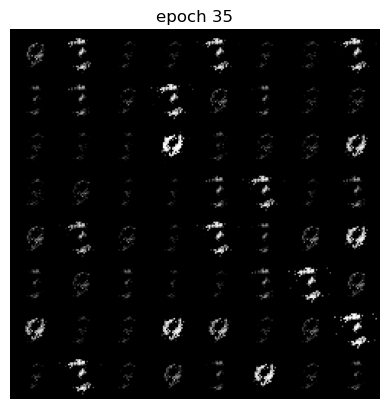

Epoch 35 of 100
Generator loss: 2.69748950, Discriminator loss: 0.75764966


  2%|▊                                            | 2/117 [00:00<00:07, 14.52it/s]

tensor(0.6656, grad_fn=<AddBackward0>)
tensor(0.7541, grad_fn=<AddBackward0>)
tensor(0.7273, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.39it/s]

tensor(0.8497, grad_fn=<AddBackward0>)
tensor(0.8296, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.65it/s]

tensor(0.8215, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.75it/s]

tensor(0.9133, grad_fn=<AddBackward0>)
tensor(0.9986, grad_fn=<AddBackward0>)
tensor(0.8720, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.73it/s]

tensor(1.0086, grad_fn=<AddBackward0>)
tensor(0.9693, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.73it/s]

tensor(0.9518, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:07, 14.57it/s]

tensor(0.8363, grad_fn=<AddBackward0>)
tensor(0.8691, grad_fn=<AddBackward0>)
tensor(0.8564, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:07, 14.43it/s]

tensor(0.7740, grad_fn=<AddBackward0>)
tensor(0.7041, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.27it/s]

tensor(0.6656, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.36it/s]

tensor(0.6729, grad_fn=<AddBackward0>)
tensor(0.6439, grad_fn=<AddBackward0>)
tensor(0.6393, grad_fn=<AddBackward0>)
tensor(0.6234, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.61it/s]

tensor(0.6513, grad_fn=<AddBackward0>)
tensor(0.6491, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.67it/s]

tensor(0.6384, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.71it/s]

tensor(0.6470, grad_fn=<AddBackward0>)
tensor(0.6324, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.74it/s]

tensor(0.6790, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.80it/s]

tensor(0.7096, grad_fn=<AddBackward0>)
tensor(0.7345, grad_fn=<AddBackward0>)
tensor(0.7335, grad_fn=<AddBackward0>)
tensor(0.8049, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.91it/s]

tensor(0.8639, grad_fn=<AddBackward0>)
tensor(0.8645, grad_fn=<AddBackward0>)
tensor(0.8913, grad_fn=<AddBackward0>)
tensor(0.9213, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.94it/s]

tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8830, grad_fn=<AddBackward0>)
tensor(0.7987, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.98it/s]

tensor(0.7726, grad_fn=<AddBackward0>)
tensor(0.6993, grad_fn=<AddBackward0>)
tensor(0.7659, grad_fn=<AddBackward0>)
tensor(0.7312, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.84it/s]

tensor(0.6837, grad_fn=<AddBackward0>)
tensor(0.7020, grad_fn=<AddBackward0>)
tensor(0.6797, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.94it/s]

tensor(0.6628, grad_fn=<AddBackward0>)
tensor(0.6639, grad_fn=<AddBackward0>)
tensor(0.6587, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.96it/s]

tensor(0.6274, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.92it/s]

tensor(0.6741, grad_fn=<AddBackward0>)
tensor(0.6633, grad_fn=<AddBackward0>)
tensor(0.6695, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.96it/s]

tensor(0.6241, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.00it/s]

tensor(0.6099, grad_fn=<AddBackward0>)
tensor(0.6339, grad_fn=<AddBackward0>)
tensor(0.6323, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.99it/s]

tensor(0.5949, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.95it/s]

tensor(0.5742, grad_fn=<AddBackward0>)
tensor(0.6168, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.93it/s]

tensor(0.6424, grad_fn=<AddBackward0>)
tensor(0.5557, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.99it/s]

tensor(0.6140, grad_fn=<AddBackward0>)
tensor(0.5907, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.96it/s]

tensor(0.5581, grad_fn=<AddBackward0>)
tensor(0.6008, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.02it/s]

tensor(0.5953, grad_fn=<AddBackward0>)
tensor(0.5642, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.00it/s]

tensor(0.5850, grad_fn=<AddBackward0>)
tensor(0.6581, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 15.00it/s]

tensor(0.6062, grad_fn=<AddBackward0>)
tensor(0.5949, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.96it/s]

tensor(0.6464, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.87it/s]

tensor(0.6445, grad_fn=<AddBackward0>)
tensor(0.6715, grad_fn=<AddBackward0>)
tensor(0.7268, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.89it/s]

tensor(0.6658, grad_fn=<AddBackward0>)
tensor(0.7425, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.90it/s]

tensor(0.7931, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.95it/s]

tensor(0.8668, grad_fn=<AddBackward0>)
tensor(0.8545, grad_fn=<AddBackward0>)
tensor(0.8409, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.03it/s]

tensor(0.9074, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.97it/s]

tensor(0.9671, grad_fn=<AddBackward0>)
tensor(1.0099, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.92it/s]

tensor(1.0730, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.03it/s]

tensor(1.0271, grad_fn=<AddBackward0>)
tensor(1.0434, grad_fn=<AddBackward0>)
tensor(1.1080, grad_fn=<AddBackward0>)
tensor(1.0264, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.06it/s]

tensor(1.0954, grad_fn=<AddBackward0>)
tensor(1.0740, grad_fn=<AddBackward0>)
tensor(1.1124, grad_fn=<AddBackward0>)
tensor(1.1726, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.13it/s]

tensor(1.0866, grad_fn=<AddBackward0>)
tensor(1.1245, grad_fn=<AddBackward0>)
tensor(1.0865, grad_fn=<AddBackward0>)
tensor(1.0648, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.11it/s]

tensor(1.0064, grad_fn=<AddBackward0>)
tensor(0.9922, grad_fn=<AddBackward0>)
tensor(0.9492, grad_fn=<AddBackward0>)
tensor(0.9691, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.92it/s]

tensor(0.8830, grad_fn=<AddBackward0>)
tensor(0.9221, grad_fn=<AddBackward0>)
tensor(0.8535, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.78it/s]

tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.8083, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.75it/s]

tensor(0.7564, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.67it/s]

tensor(0.7322, grad_fn=<AddBackward0>)
tensor(0.7329, grad_fn=<AddBackward0>)
tensor(0.6695, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.70it/s]

tensor(0.6441, grad_fn=<AddBackward0>)
tensor(0.6308, grad_fn=<AddBackward0>)
tensor(0.6325, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.82it/s]

tensor(0.5978, grad_fn=<AddBackward0>)


118it [00:07, 14.95it/s]                                                          


tensor(0.6298, grad_fn=<AddBackward0>)
Epoch 36 of 100
Generator loss: 2.70059705, Discriminator loss: 0.78626192


  2%|▊                                            | 2/117 [00:00<00:07, 15.29it/s]

tensor(0.5900, grad_fn=<AddBackward0>)
tensor(0.5773, grad_fn=<AddBackward0>)
tensor(0.5844, grad_fn=<AddBackward0>)
tensor(0.5784, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.88it/s]

tensor(0.5641, grad_fn=<AddBackward0>)
tensor(0.5992, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.96it/s]

tensor(0.5884, grad_fn=<AddBackward0>)
tensor(0.5998, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.02it/s]

tensor(0.6136, grad_fn=<AddBackward0>)
tensor(0.5923, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(0.5718, grad_fn=<AddBackward0>)
tensor(0.6175, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.06it/s]

tensor(0.6615, grad_fn=<AddBackward0>)
tensor(0.6724, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.98it/s]

tensor(0.7553, grad_fn=<AddBackward0>)
tensor(0.7062, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.98it/s]

tensor(0.7774, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.94it/s]

tensor(0.7958, grad_fn=<AddBackward0>)
tensor(0.8687, grad_fn=<AddBackward0>)
tensor(0.7999, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.94it/s]

tensor(0.9085, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.97it/s]

tensor(0.9926, grad_fn=<AddBackward0>)
tensor(0.8464, grad_fn=<AddBackward0>)
tensor(0.9192, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(0.8514, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.01it/s]

tensor(0.8107, grad_fn=<AddBackward0>)
tensor(0.8124, grad_fn=<AddBackward0>)
tensor(0.9324, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.03it/s]

tensor(0.7905, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.01it/s]

tensor(0.7934, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.7320, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.04it/s]

tensor(0.7558, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(0.7749, grad_fn=<AddBackward0>)
tensor(0.6777, grad_fn=<AddBackward0>)
tensor(0.7335, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.05it/s]

tensor(0.6984, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.03it/s]

tensor(0.6786, grad_fn=<AddBackward0>)
tensor(0.6738, grad_fn=<AddBackward0>)
tensor(0.6631, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.99it/s]

tensor(0.6669, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.08it/s]

tensor(0.6124, grad_fn=<AddBackward0>)
tensor(0.6338, grad_fn=<AddBackward0>)
tensor(0.6430, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.10it/s]

tensor(0.6245, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.00it/s]

tensor(0.6766, grad_fn=<AddBackward0>)
tensor(0.6654, grad_fn=<AddBackward0>)
tensor(0.6847, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.04it/s]

tensor(0.7660, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.08it/s]

tensor(0.7730, grad_fn=<AddBackward0>)
tensor(0.8200, grad_fn=<AddBackward0>)
tensor(0.8430, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.07it/s]

tensor(0.9328, grad_fn=<AddBackward0>)
tensor(1.0427, grad_fn=<AddBackward0>)
tensor(1.0663, grad_fn=<AddBackward0>)
tensor(1.1411, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.11it/s]

tensor(1.2499, grad_fn=<AddBackward0>)
tensor(1.2250, grad_fn=<AddBackward0>)
tensor(1.3174, grad_fn=<AddBackward0>)
tensor(1.2738, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.10it/s]

tensor(1.1936, grad_fn=<AddBackward0>)
tensor(1.1581, grad_fn=<AddBackward0>)
tensor(1.1042, grad_fn=<AddBackward0>)
tensor(1.0600, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.05it/s]

tensor(0.9889, grad_fn=<AddBackward0>)
tensor(0.9558, grad_fn=<AddBackward0>)
tensor(0.9187, grad_fn=<AddBackward0>)
tensor(0.8420, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.09it/s]

tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.7730, grad_fn=<AddBackward0>)
tensor(0.7507, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.07it/s]

tensor(0.7429, grad_fn=<AddBackward0>)
tensor(0.7468, grad_fn=<AddBackward0>)
tensor(0.7865, grad_fn=<AddBackward0>)
tensor(0.7489, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.09it/s]

tensor(0.7480, grad_fn=<AddBackward0>)
tensor(0.8067, grad_fn=<AddBackward0>)
tensor(0.7923, grad_fn=<AddBackward0>)
tensor(0.9132, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.14it/s]

tensor(0.9139, grad_fn=<AddBackward0>)
tensor(0.9013, grad_fn=<AddBackward0>)
tensor(0.9399, grad_fn=<AddBackward0>)
tensor(1.0253, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.05it/s]

tensor(1.1096, grad_fn=<AddBackward0>)
tensor(1.1266, grad_fn=<AddBackward0>)
tensor(1.1543, grad_fn=<AddBackward0>)
tensor(1.1370, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.08it/s]

tensor(1.2001, grad_fn=<AddBackward0>)
tensor(1.2064, grad_fn=<AddBackward0>)
tensor(1.2237, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.00it/s]

tensor(1.1603, grad_fn=<AddBackward0>)
tensor(1.0653, grad_fn=<AddBackward0>)
tensor(1.0090, grad_fn=<AddBackward0>)
tensor(0.9944, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.99it/s]

tensor(1.0117, grad_fn=<AddBackward0>)
tensor(0.9277, grad_fn=<AddBackward0>)
tensor(0.8958, grad_fn=<AddBackward0>)
tensor(0.8326, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.02it/s]

tensor(0.8452, grad_fn=<AddBackward0>)
tensor(0.8053, grad_fn=<AddBackward0>)
tensor(0.7366, grad_fn=<AddBackward0>)
tensor(0.8020, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.02it/s]

tensor(0.7499, grad_fn=<AddBackward0>)
tensor(0.7118, grad_fn=<AddBackward0>)
tensor(0.7321, grad_fn=<AddBackward0>)
tensor(0.7269, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.6909, grad_fn=<AddBackward0>)
tensor(0.6951, grad_fn=<AddBackward0>)
tensor(0.6834, grad_fn=<AddBackward0>)
tensor(0.7325, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.02it/s]

tensor(0.7380, grad_fn=<AddBackward0>)
tensor(0.7100, grad_fn=<AddBackward0>)
tensor(0.7551, grad_fn=<AddBackward0>)
tensor(0.7621, grad_fn=<AddBackward0>)


118it [00:07, 15.12it/s]                                                          


tensor(0.7971, grad_fn=<AddBackward0>)
tensor(0.8501, grad_fn=<AddBackward0>)
tensor(0.8795, grad_fn=<AddBackward0>)
Epoch 37 of 100
Generator loss: 2.98756242, Discriminator loss: 0.84125870


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8745, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.05it/s]

tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.9229, grad_fn=<AddBackward0>)
tensor(0.9098, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.09it/s]

tensor(0.9570, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.16it/s]

tensor(0.9622, grad_fn=<AddBackward0>)
tensor(0.9679, grad_fn=<AddBackward0>)
tensor(0.9251, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.09it/s]

tensor(0.9866, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.06it/s]

tensor(0.9987, grad_fn=<AddBackward0>)
tensor(1.0209, grad_fn=<AddBackward0>)
tensor(0.9914, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.05it/s]

tensor(0.9600, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.02it/s]

tensor(0.9603, grad_fn=<AddBackward0>)
tensor(0.9782, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.83it/s]

tensor(0.9275, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.73it/s]

tensor(0.9371, grad_fn=<AddBackward0>)
tensor(0.9115, grad_fn=<AddBackward0>)
tensor(0.9046, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.73it/s]

tensor(0.8756, grad_fn=<AddBackward0>)
tensor(0.8703, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.66it/s]

tensor(0.7975, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.61it/s]

tensor(0.8344, grad_fn=<AddBackward0>)
tensor(0.7672, grad_fn=<AddBackward0>)
tensor(0.7524, grad_fn=<AddBackward0>)
tensor(0.7486, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.73it/s]

tensor(0.7146, grad_fn=<AddBackward0>)
tensor(0.7448, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.80it/s]

tensor(0.7269, grad_fn=<AddBackward0>)
tensor(0.7338, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.90it/s]

tensor(0.7316, grad_fn=<AddBackward0>)
tensor(0.7012, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.89it/s]

tensor(0.6960, grad_fn=<AddBackward0>)
tensor(0.7108, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.90it/s]

tensor(0.7462, grad_fn=<AddBackward0>)
tensor(0.7594, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.93it/s]

tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.7292, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.96it/s]

tensor(0.7589, grad_fn=<AddBackward0>)
tensor(0.7389, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.00it/s]

tensor(0.8112, grad_fn=<AddBackward0>)
tensor(0.8077, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.06it/s]

tensor(0.8095, grad_fn=<AddBackward0>)
tensor(0.8459, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.02it/s]

tensor(0.8577, grad_fn=<AddBackward0>)
tensor(0.8321, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.04it/s]

tensor(0.8870, grad_fn=<AddBackward0>)
tensor(0.9555, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.05it/s]

tensor(1.0070, grad_fn=<AddBackward0>)
tensor(1.0025, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.04it/s]

tensor(0.9886, grad_fn=<AddBackward0>)
tensor(0.9772, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.97it/s]

tensor(1.0525, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.92it/s]

tensor(1.1406, grad_fn=<AddBackward0>)
tensor(1.1046, grad_fn=<AddBackward0>)
tensor(1.0503, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.97it/s]

tensor(1.0797, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.05it/s]

tensor(1.0340, grad_fn=<AddBackward0>)
tensor(1.1263, grad_fn=<AddBackward0>)
tensor(1.0726, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.15it/s]

tensor(1.0991, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.14it/s]

tensor(1.1062, grad_fn=<AddBackward0>)
tensor(1.0229, grad_fn=<AddBackward0>)
tensor(1.0487, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.08it/s]

tensor(1.0014, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.04it/s]

tensor(0.9312, grad_fn=<AddBackward0>)
tensor(0.9366, grad_fn=<AddBackward0>)
tensor(0.8968, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.00it/s]

tensor(0.9006, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.03it/s]

tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.8653, grad_fn=<AddBackward0>)
tensor(0.7910, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.06it/s]

tensor(0.7772, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.98it/s]

tensor(0.7703, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7302, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.06it/s]

tensor(0.7804, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.01it/s]

tensor(0.7765, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)
tensor(0.7571, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.10it/s]

tensor(0.8258, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.04it/s]

tensor(0.7627, grad_fn=<AddBackward0>)
tensor(0.7798, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.00it/s]

tensor(0.7688, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.86it/s]

tensor(0.7894, grad_fn=<AddBackward0>)
tensor(0.7817, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.79it/s]

tensor(0.7821, grad_fn=<AddBackward0>)
tensor(0.7726, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.76it/s]

tensor(0.8157, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.73it/s]

tensor(0.7818, grad_fn=<AddBackward0>)
tensor(0.7711, grad_fn=<AddBackward0>)
tensor(0.8046, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.77it/s]

tensor(0.8152, grad_fn=<AddBackward0>)
tensor(0.7774, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.67it/s]

tensor(0.7369, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.68it/s]

tensor(0.7330, grad_fn=<AddBackward0>)
tensor(0.7570, grad_fn=<AddBackward0>)
tensor(0.7447, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.78it/s]

tensor(0.7332, grad_fn=<AddBackward0>)
tensor(0.6906, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.85it/s]

tensor(0.6947, grad_fn=<AddBackward0>)
tensor(0.7273, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.90it/s]

tensor(0.7184, grad_fn=<AddBackward0>)
tensor(0.6606, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.92it/s]

tensor(0.6772, grad_fn=<AddBackward0>)
tensor(0.6419, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.04it/s]

tensor(0.6377, grad_fn=<AddBackward0>)
tensor(0.6530, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.96it/s]

tensor(0.6403, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 13.31it/s]

tensor(0.6186, grad_fn=<AddBackward0>)
tensor(0.6372, grad_fn=<AddBackward0>)
tensor(0.6400, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 13.83it/s]

tensor(0.6077, grad_fn=<AddBackward0>)


118it [00:07, 14.92it/s]                                                          


tensor(0.6551, grad_fn=<AddBackward0>)
tensor(0.6205, grad_fn=<AddBackward0>)
tensor(0.6862, grad_fn=<AddBackward0>)
Epoch 38 of 100
Generator loss: 2.39592004, Discriminator loss: 0.84059441


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.6406, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.42it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.7282, grad_fn=<AddBackward0>)
tensor(0.7300, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.33it/s]

tensor(0.7350, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.26it/s]

tensor(0.7651, grad_fn=<AddBackward0>)
tensor(0.8036, grad_fn=<AddBackward0>)
tensor(0.7915, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.98it/s]

tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.8475, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(0.8321, grad_fn=<AddBackward0>)
tensor(0.9000, grad_fn=<AddBackward0>)
tensor(0.9133, grad_fn=<AddBackward0>)
tensor(0.8694, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.03it/s]

tensor(0.8527, grad_fn=<AddBackward0>)
tensor(0.8739, grad_fn=<AddBackward0>)
tensor(0.8970, grad_fn=<AddBackward0>)
tensor(0.9445, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.10it/s]

tensor(0.8148, grad_fn=<AddBackward0>)
tensor(0.8546, grad_fn=<AddBackward0>)
tensor(0.8140, grad_fn=<AddBackward0>)
tensor(0.7800, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.17it/s]

tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.7737, grad_fn=<AddBackward0>)
tensor(0.7310, grad_fn=<AddBackward0>)
tensor(0.6818, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.18it/s]

tensor(0.6688, grad_fn=<AddBackward0>)
tensor(0.6851, grad_fn=<AddBackward0>)
tensor(0.6520, grad_fn=<AddBackward0>)
tensor(0.6466, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.15it/s]

tensor(0.6386, grad_fn=<AddBackward0>)
tensor(0.6537, grad_fn=<AddBackward0>)
tensor(0.6380, grad_fn=<AddBackward0>)
tensor(0.6487, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.08it/s]

tensor(0.6865, grad_fn=<AddBackward0>)
tensor(0.6921, grad_fn=<AddBackward0>)
tensor(0.6994, grad_fn=<AddBackward0>)
tensor(0.7239, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.96it/s]

tensor(0.7566, grad_fn=<AddBackward0>)
tensor(0.7682, grad_fn=<AddBackward0>)
tensor(0.7623, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.00it/s]

tensor(0.7329, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)
tensor(0.8165, grad_fn=<AddBackward0>)
tensor(0.8510, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.04it/s]

tensor(0.9396, grad_fn=<AddBackward0>)
tensor(0.9372, grad_fn=<AddBackward0>)
tensor(1.0036, grad_fn=<AddBackward0>)
tensor(1.0163, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.13it/s]

tensor(1.0477, grad_fn=<AddBackward0>)
tensor(1.0754, grad_fn=<AddBackward0>)
tensor(1.1220, grad_fn=<AddBackward0>)
tensor(1.0740, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.15it/s]

tensor(1.1389, grad_fn=<AddBackward0>)
tensor(1.1164, grad_fn=<AddBackward0>)
tensor(1.0420, grad_fn=<AddBackward0>)
tensor(1.0336, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.12it/s]

tensor(1.0562, grad_fn=<AddBackward0>)
tensor(1.0144, grad_fn=<AddBackward0>)
tensor(0.9615, grad_fn=<AddBackward0>)
tensor(0.9216, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.09it/s]

tensor(0.8315, grad_fn=<AddBackward0>)
tensor(0.8450, grad_fn=<AddBackward0>)
tensor(0.7549, grad_fn=<AddBackward0>)
tensor(0.7265, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.14it/s]

tensor(0.7273, grad_fn=<AddBackward0>)
tensor(0.6725, grad_fn=<AddBackward0>)
tensor(0.6816, grad_fn=<AddBackward0>)
tensor(0.6217, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.07it/s]

tensor(0.6187, grad_fn=<AddBackward0>)
tensor(0.6100, grad_fn=<AddBackward0>)
tensor(0.5858, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.91it/s]

tensor(0.5929, grad_fn=<AddBackward0>)
tensor(0.5602, grad_fn=<AddBackward0>)
tensor(0.5411, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.98it/s]

tensor(0.5532, grad_fn=<AddBackward0>)
tensor(0.5503, grad_fn=<AddBackward0>)
tensor(0.5401, grad_fn=<AddBackward0>)
tensor(0.5426, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.01it/s]

tensor(0.5667, grad_fn=<AddBackward0>)
tensor(0.5182, grad_fn=<AddBackward0>)
tensor(0.5560, grad_fn=<AddBackward0>)
tensor(0.5443, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.10it/s]

tensor(0.5979, grad_fn=<AddBackward0>)
tensor(0.5932, grad_fn=<AddBackward0>)
tensor(0.6060, grad_fn=<AddBackward0>)
tensor(0.6468, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.09it/s]

tensor(0.6587, grad_fn=<AddBackward0>)
tensor(0.6479, grad_fn=<AddBackward0>)
tensor(0.6647, grad_fn=<AddBackward0>)
tensor(0.6767, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.06it/s]

tensor(0.7108, grad_fn=<AddBackward0>)
tensor(0.7399, grad_fn=<AddBackward0>)
tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.7959, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.08it/s]

tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.7828, grad_fn=<AddBackward0>)
tensor(0.8075, grad_fn=<AddBackward0>)
tensor(0.8142, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.13it/s]

tensor(0.7917, grad_fn=<AddBackward0>)
tensor(0.7864, grad_fn=<AddBackward0>)
tensor(0.8194, grad_fn=<AddBackward0>)
tensor(0.7973, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.21it/s]

tensor(0.7942, grad_fn=<AddBackward0>)
tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7187, grad_fn=<AddBackward0>)
tensor(0.7500, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.21it/s]

tensor(0.7998, grad_fn=<AddBackward0>)
tensor(0.7179, grad_fn=<AddBackward0>)
tensor(0.7164, grad_fn=<AddBackward0>)
tensor(0.7233, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.20it/s]

tensor(0.7289, grad_fn=<AddBackward0>)
tensor(0.6889, grad_fn=<AddBackward0>)
tensor(0.6987, grad_fn=<AddBackward0>)
tensor(0.6769, grad_fn=<AddBackward0>)


118it [00:07, 15.18it/s]                                                          


tensor(0.7320, grad_fn=<AddBackward0>)
tensor(0.8424, grad_fn=<AddBackward0>)
Epoch 39 of 100
Generator loss: 3.14270639, Discriminator loss: 0.77019274


  2%|▊                                            | 2/117 [00:00<00:07, 15.18it/s]

tensor(0.6525, grad_fn=<AddBackward0>)
tensor(0.6623, grad_fn=<AddBackward0>)
tensor(0.7042, grad_fn=<AddBackward0>)
tensor(0.6452, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.11it/s]

tensor(0.6947, grad_fn=<AddBackward0>)
tensor(0.7112, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.07it/s]

tensor(0.7295, grad_fn=<AddBackward0>)
tensor(0.7107, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.10it/s]

tensor(0.7377, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.83it/s]

tensor(0.7495, grad_fn=<AddBackward0>)
tensor(0.7813, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.84it/s]

tensor(0.7248, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.89it/s]

tensor(0.7589, grad_fn=<AddBackward0>)
tensor(0.7809, grad_fn=<AddBackward0>)
tensor(0.7533, grad_fn=<AddBackward0>)
tensor(0.7757, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.90it/s]

tensor(0.7362, grad_fn=<AddBackward0>)
tensor(0.7095, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.00it/s]

tensor(0.6481, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.87it/s]

tensor(0.6940, grad_fn=<AddBackward0>)
tensor(0.6958, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.74it/s]

tensor(0.6763, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.71it/s]

tensor(0.6964, grad_fn=<AddBackward0>)
tensor(0.6967, grad_fn=<AddBackward0>)
tensor(0.6650, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.67it/s]

tensor(0.7089, grad_fn=<AddBackward0>)
tensor(0.6972, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.54it/s]

tensor(0.7103, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.64it/s]

tensor(0.6820, grad_fn=<AddBackward0>)
tensor(0.7275, grad_fn=<AddBackward0>)
tensor(0.7391, grad_fn=<AddBackward0>)
tensor(0.7463, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.76it/s]

tensor(0.7606, grad_fn=<AddBackward0>)
tensor(0.7893, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.81it/s]

tensor(0.8259, grad_fn=<AddBackward0>)
tensor(0.7624, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.93it/s]

tensor(0.8863, grad_fn=<AddBackward0>)
tensor(1.0086, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.95it/s]

tensor(0.9584, grad_fn=<AddBackward0>)
tensor(0.9570, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.03it/s]

tensor(1.0286, grad_fn=<AddBackward0>)
tensor(1.0968, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.06it/s]

tensor(1.1302, grad_fn=<AddBackward0>)
tensor(1.1325, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.10it/s]

tensor(1.1173, grad_fn=<AddBackward0>)
tensor(1.0166, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.07it/s]

tensor(1.0555, grad_fn=<AddBackward0>)
tensor(0.9579, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.03it/s]

tensor(0.9833, grad_fn=<AddBackward0>)
tensor(0.9639, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.08it/s]

tensor(0.9537, grad_fn=<AddBackward0>)
tensor(0.9538, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.06it/s]

tensor(0.8727, grad_fn=<AddBackward0>)
tensor(0.8719, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.03it/s]

tensor(0.8883, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.95it/s]

tensor(0.8784, grad_fn=<AddBackward0>)
tensor(0.8971, grad_fn=<AddBackward0>)
tensor(0.9275, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.99it/s]

tensor(0.9058, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.97it/s]

tensor(0.8726, grad_fn=<AddBackward0>)
tensor(0.9213, grad_fn=<AddBackward0>)
tensor(0.9138, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.02it/s]

tensor(0.9357, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.99it/s]

tensor(0.9923, grad_fn=<AddBackward0>)
tensor(0.9143, grad_fn=<AddBackward0>)
tensor(0.9774, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.83it/s]

tensor(0.9971, grad_fn=<AddBackward0>)
tensor(0.9900, grad_fn=<AddBackward0>)
tensor(0.9738, grad_fn=<AddBackward0>)
tensor(0.9688, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.00it/s]

tensor(0.9158, grad_fn=<AddBackward0>)
tensor(1.0142, grad_fn=<AddBackward0>)
tensor(0.9477, grad_fn=<AddBackward0>)
tensor(0.9944, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(1.0102, grad_fn=<AddBackward0>)
tensor(0.9661, grad_fn=<AddBackward0>)
tensor(0.9391, grad_fn=<AddBackward0>)
tensor(1.0198, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.06it/s]

tensor(0.9981, grad_fn=<AddBackward0>)
tensor(1.0470, grad_fn=<AddBackward0>)
tensor(1.0539, grad_fn=<AddBackward0>)
tensor(1.0886, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.08it/s]

tensor(1.0944, grad_fn=<AddBackward0>)
tensor(1.0823, grad_fn=<AddBackward0>)
tensor(1.0844, grad_fn=<AddBackward0>)
tensor(1.1325, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.95it/s]

tensor(1.1145, grad_fn=<AddBackward0>)
tensor(1.1114, grad_fn=<AddBackward0>)
tensor(1.0762, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.68it/s]

tensor(1.0346, grad_fn=<AddBackward0>)
tensor(0.9999, grad_fn=<AddBackward0>)
tensor(0.9642, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.74it/s]

tensor(0.9332, grad_fn=<AddBackward0>)
tensor(0.8810, grad_fn=<AddBackward0>)
tensor(0.8735, grad_fn=<AddBackward0>)
tensor(0.8459, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.86it/s]

tensor(0.8236, grad_fn=<AddBackward0>)
tensor(0.7850, grad_fn=<AddBackward0>)
tensor(0.7763, grad_fn=<AddBackward0>)
tensor(0.7199, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.93it/s]

tensor(0.6938, grad_fn=<AddBackward0>)
tensor(0.7036, grad_fn=<AddBackward0>)
tensor(0.6993, grad_fn=<AddBackward0>)
tensor(0.6684, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.99it/s]

tensor(0.6795, grad_fn=<AddBackward0>)
tensor(0.6612, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.87it/s]

tensor(0.6254, grad_fn=<AddBackward0>)
tensor(0.6271, grad_fn=<AddBackward0>)
tensor(0.6805, grad_fn=<AddBackward0>)
tensor(0.6301, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.80it/s]

tensor(0.6280, grad_fn=<AddBackward0>)
tensor(0.6634, grad_fn=<AddBackward0>)
tensor(0.5962, grad_fn=<AddBackward0>)


118it [00:07, 14.99it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6208, grad_fn=<AddBackward0>)
tensor(0.6679, grad_fn=<AddBackward0>)
tensor(0.6383, grad_fn=<AddBackward0>)
tensor(0.6859, grad_fn=<AddBackward0>)


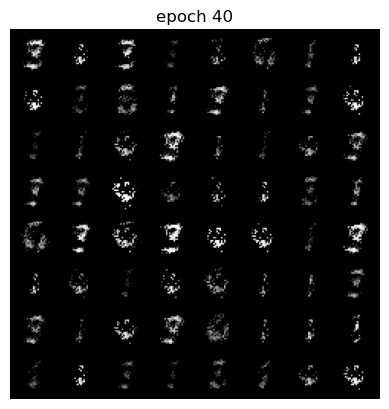

Epoch 40 of 100
Generator loss: 2.59154749, Discriminator loss: 0.85479432


  2%|▊                                            | 2/117 [00:00<00:07, 14.43it/s]

tensor(0.5932, grad_fn=<AddBackward0>)
tensor(0.6489, grad_fn=<AddBackward0>)
tensor(0.6441, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.84it/s]

tensor(0.6309, grad_fn=<AddBackward0>)
tensor(0.6145, grad_fn=<AddBackward0>)
tensor(0.6960, grad_fn=<AddBackward0>)
tensor(0.6779, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.97it/s]

tensor(0.7364, grad_fn=<AddBackward0>)
tensor(0.6728, grad_fn=<AddBackward0>)
tensor(0.6827, grad_fn=<AddBackward0>)
tensor(0.7416, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.09it/s]

tensor(0.7930, grad_fn=<AddBackward0>)
tensor(0.7154, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.7717, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.07it/s]

tensor(0.7541, grad_fn=<AddBackward0>)
tensor(0.8098, grad_fn=<AddBackward0>)
tensor(0.7511, grad_fn=<AddBackward0>)
tensor(0.7848, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.05it/s]

tensor(0.8251, grad_fn=<AddBackward0>)
tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.8459, grad_fn=<AddBackward0>)
tensor(0.8203, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.10it/s]

tensor(0.7794, grad_fn=<AddBackward0>)
tensor(0.8059, grad_fn=<AddBackward0>)
tensor(0.8806, grad_fn=<AddBackward0>)
tensor(0.8432, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.01it/s]

tensor(0.8510, grad_fn=<AddBackward0>)
tensor(0.8951, grad_fn=<AddBackward0>)
tensor(0.8162, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.03it/s]

tensor(0.8911, grad_fn=<AddBackward0>)
tensor(0.8416, grad_fn=<AddBackward0>)
tensor(0.8695, grad_fn=<AddBackward0>)
tensor(0.8026, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.99it/s]

tensor(0.8477, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.8508, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.76it/s]

tensor(0.8017, grad_fn=<AddBackward0>)
tensor(0.8471, grad_fn=<AddBackward0>)
tensor(0.7982, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.82it/s]

tensor(0.7911, grad_fn=<AddBackward0>)
tensor(0.7859, grad_fn=<AddBackward0>)
tensor(0.7559, grad_fn=<AddBackward0>)
tensor(0.7634, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.95it/s]

tensor(0.7367, grad_fn=<AddBackward0>)
tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.7638, grad_fn=<AddBackward0>)
tensor(0.7165, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.93it/s]

tensor(0.7290, grad_fn=<AddBackward0>)
tensor(0.6724, grad_fn=<AddBackward0>)
tensor(0.7152, grad_fn=<AddBackward0>)
tensor(0.6851, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.01it/s]

tensor(0.7095, grad_fn=<AddBackward0>)
tensor(0.7238, grad_fn=<AddBackward0>)
tensor(0.6860, grad_fn=<AddBackward0>)
tensor(0.7219, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.98it/s]

tensor(0.7438, grad_fn=<AddBackward0>)
tensor(0.7373, grad_fn=<AddBackward0>)
tensor(0.7738, grad_fn=<AddBackward0>)
tensor(0.7852, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.97it/s]

tensor(0.7436, grad_fn=<AddBackward0>)
tensor(0.8232, grad_fn=<AddBackward0>)
tensor(0.7644, grad_fn=<AddBackward0>)
tensor(0.8199, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.90it/s]

tensor(0.8146, grad_fn=<AddBackward0>)
tensor(0.8734, grad_fn=<AddBackward0>)
tensor(0.7857, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.91it/s]

tensor(0.8758, grad_fn=<AddBackward0>)
tensor(0.8399, grad_fn=<AddBackward0>)
tensor(0.8636, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.96it/s]

tensor(0.8981, grad_fn=<AddBackward0>)
tensor(0.9258, grad_fn=<AddBackward0>)
tensor(0.8721, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.96it/s]

tensor(0.8135, grad_fn=<AddBackward0>)
tensor(0.8894, grad_fn=<AddBackward0>)
tensor(0.8094, grad_fn=<AddBackward0>)
tensor(0.8106, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.95it/s]

tensor(0.7316, grad_fn=<AddBackward0>)
tensor(0.7304, grad_fn=<AddBackward0>)
tensor(0.7701, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.99it/s]

tensor(0.7677, grad_fn=<AddBackward0>)
tensor(0.7653, grad_fn=<AddBackward0>)
tensor(0.7603, grad_fn=<AddBackward0>)
tensor(0.7352, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.02it/s]

tensor(0.7574, grad_fn=<AddBackward0>)
tensor(0.7550, grad_fn=<AddBackward0>)
tensor(0.8141, grad_fn=<AddBackward0>)
tensor(0.7799, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.02it/s]

tensor(0.7830, grad_fn=<AddBackward0>)
tensor(0.8860, grad_fn=<AddBackward0>)
tensor(0.8859, grad_fn=<AddBackward0>)
tensor(0.9301, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.03it/s]

tensor(0.9260, grad_fn=<AddBackward0>)
tensor(0.9829, grad_fn=<AddBackward0>)
tensor(0.9515, grad_fn=<AddBackward0>)
tensor(0.9502, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.01it/s]

tensor(1.0197, grad_fn=<AddBackward0>)
tensor(0.9884, grad_fn=<AddBackward0>)
tensor(0.9091, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.99it/s]

tensor(0.9507, grad_fn=<AddBackward0>)
tensor(0.9728, grad_fn=<AddBackward0>)
tensor(0.9372, grad_fn=<AddBackward0>)
tensor(0.8909, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.93it/s]

tensor(0.8621, grad_fn=<AddBackward0>)
tensor(0.8841, grad_fn=<AddBackward0>)
tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.8236, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.04it/s]

tensor(0.8079, grad_fn=<AddBackward0>)
tensor(0.7623, grad_fn=<AddBackward0>)
tensor(0.7240, grad_fn=<AddBackward0>)
tensor(0.7477, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.01it/s]

tensor(0.7154, grad_fn=<AddBackward0>)
tensor(0.6921, grad_fn=<AddBackward0>)
tensor(0.6702, grad_fn=<AddBackward0>)


118it [00:07, 15.02it/s]                                                          


tensor(0.7094, grad_fn=<AddBackward0>)
tensor(0.6840, grad_fn=<AddBackward0>)
tensor(0.7371, grad_fn=<AddBackward0>)
Epoch 41 of 100
Generator loss: 2.75334358, Discriminator loss: 0.80177939


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.7217, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.94it/s]

tensor(0.7322, grad_fn=<AddBackward0>)
tensor(0.7157, grad_fn=<AddBackward0>)
tensor(0.7472, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.09it/s]

tensor(0.7731, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.96it/s]

tensor(0.8671, grad_fn=<AddBackward0>)
tensor(0.8609, grad_fn=<AddBackward0>)
tensor(0.8267, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.10it/s]

tensor(0.8984, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.09it/s]

tensor(0.9666, grad_fn=<AddBackward0>)
tensor(0.9544, grad_fn=<AddBackward0>)
tensor(0.9524, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.06it/s]

tensor(0.9933, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.07it/s]

tensor(0.9465, grad_fn=<AddBackward0>)
tensor(1.0116, grad_fn=<AddBackward0>)
tensor(0.9619, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.04it/s]

tensor(0.8931, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.08it/s]

tensor(0.8507, grad_fn=<AddBackward0>)
tensor(0.8801, grad_fn=<AddBackward0>)
tensor(0.8535, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.13it/s]

tensor(0.8319, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.09it/s]

tensor(0.7673, grad_fn=<AddBackward0>)
tensor(0.7294, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.94it/s]

tensor(0.7229, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.79it/s]

tensor(0.7625, grad_fn=<AddBackward0>)
tensor(0.7096, grad_fn=<AddBackward0>)
tensor(0.7050, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.57it/s]

tensor(0.6821, grad_fn=<AddBackward0>)
tensor(0.6869, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.50it/s]

tensor(0.7242, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.50it/s]

tensor(0.7707, grad_fn=<AddBackward0>)
tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.9457, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.61it/s]

tensor(0.8862, grad_fn=<AddBackward0>)
tensor(0.9519, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.70it/s]

tensor(0.9842, grad_fn=<AddBackward0>)
tensor(1.0581, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.81it/s]

tensor(1.0316, grad_fn=<AddBackward0>)
tensor(1.0442, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.83it/s]

tensor(1.0115, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.81it/s]

tensor(1.0842, grad_fn=<AddBackward0>)
tensor(0.9863, grad_fn=<AddBackward0>)
tensor(0.9403, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.84it/s]

tensor(0.8993, grad_fn=<AddBackward0>)
tensor(0.8503, grad_fn=<AddBackward0>)
tensor(0.8113, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.94it/s]

tensor(0.8404, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.97it/s]

tensor(0.7953, grad_fn=<AddBackward0>)
tensor(0.7771, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.99it/s]

tensor(0.7443, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.99it/s]

tensor(0.7285, grad_fn=<AddBackward0>)
tensor(0.6905, grad_fn=<AddBackward0>)
tensor(0.7003, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.95it/s]

tensor(0.6741, grad_fn=<AddBackward0>)
tensor(0.6549, grad_fn=<AddBackward0>)
tensor(0.6719, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.00it/s]

tensor(0.6910, grad_fn=<AddBackward0>)
tensor(0.6828, grad_fn=<AddBackward0>)
tensor(0.6728, grad_fn=<AddBackward0>)
tensor(0.6690, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.07it/s]

tensor(0.6863, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)
tensor(0.6749, grad_fn=<AddBackward0>)
tensor(0.6913, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.11it/s]

tensor(0.6762, grad_fn=<AddBackward0>)
tensor(0.6704, grad_fn=<AddBackward0>)
tensor(0.6957, grad_fn=<AddBackward0>)
tensor(0.7214, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.14it/s]

tensor(0.6859, grad_fn=<AddBackward0>)
tensor(0.6814, grad_fn=<AddBackward0>)
tensor(0.7339, grad_fn=<AddBackward0>)
tensor(0.6876, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(0.7691, grad_fn=<AddBackward0>)
tensor(0.7529, grad_fn=<AddBackward0>)
tensor(0.7463, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.95it/s]

tensor(0.7741, grad_fn=<AddBackward0>)
tensor(0.7542, grad_fn=<AddBackward0>)
tensor(0.8004, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.95it/s]

tensor(0.7850, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)
tensor(0.7844, grad_fn=<AddBackward0>)
tensor(0.7928, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.99it/s]

tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.8562, grad_fn=<AddBackward0>)
tensor(0.8121, grad_fn=<AddBackward0>)
tensor(0.8255, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.01it/s]

tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.8469, grad_fn=<AddBackward0>)
tensor(0.8444, grad_fn=<AddBackward0>)
tensor(0.8405, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.99it/s]

tensor(0.8129, grad_fn=<AddBackward0>)
tensor(0.8125, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.8247, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.13it/s]

tensor(0.7807, grad_fn=<AddBackward0>)
tensor(0.7360, grad_fn=<AddBackward0>)
tensor(0.7411, grad_fn=<AddBackward0>)
tensor(0.7283, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.06it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.7136, grad_fn=<AddBackward0>)
tensor(0.7182, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.94it/s]

tensor(0.6875, grad_fn=<AddBackward0>)
tensor(0.7018, grad_fn=<AddBackward0>)
tensor(0.6654, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.04it/s]

tensor(0.6835, grad_fn=<AddBackward0>)
tensor(0.7069, grad_fn=<AddBackward0>)
tensor(0.7708, grad_fn=<AddBackward0>)
tensor(0.7480, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.03it/s]

tensor(0.7795, grad_fn=<AddBackward0>)
tensor(0.7995, grad_fn=<AddBackward0>)
tensor(0.7899, grad_fn=<AddBackward0>)
tensor(0.7888, grad_fn=<AddBackward0>)


118it [00:07, 15.05it/s]                                                          


tensor(0.8414, grad_fn=<AddBackward0>)
tensor(0.8765, grad_fn=<AddBackward0>)
tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.8371, grad_fn=<AddBackward0>)
Epoch 42 of 100
Generator loss: 2.68798256, Discriminator loss: 0.80191237


  2%|▊                                            | 2/117 [00:00<00:07, 15.22it/s]

tensor(0.9368, grad_fn=<AddBackward0>)
tensor(0.9717, grad_fn=<AddBackward0>)
tensor(0.9759, grad_fn=<AddBackward0>)
tensor(1.0004, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.06it/s]

tensor(0.9609, grad_fn=<AddBackward0>)
tensor(0.9754, grad_fn=<AddBackward0>)
tensor(1.0072, grad_fn=<AddBackward0>)
tensor(0.9878, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.08it/s]

tensor(0.9116, grad_fn=<AddBackward0>)
tensor(0.9122, grad_fn=<AddBackward0>)
tensor(0.8700, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.04it/s]

tensor(0.8454, grad_fn=<AddBackward0>)
tensor(0.8674, grad_fn=<AddBackward0>)
tensor(0.8182, grad_fn=<AddBackward0>)
tensor(0.8167, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.05it/s]

tensor(0.7578, grad_fn=<AddBackward0>)
tensor(0.8019, grad_fn=<AddBackward0>)
tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.7980, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.12it/s]

tensor(0.7756, grad_fn=<AddBackward0>)
tensor(0.7939, grad_fn=<AddBackward0>)
tensor(0.7796, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.14it/s]

tensor(0.8446, grad_fn=<AddBackward0>)
tensor(0.8313, grad_fn=<AddBackward0>)
tensor(0.8199, grad_fn=<AddBackward0>)
tensor(0.8455, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.16it/s]

tensor(0.8598, grad_fn=<AddBackward0>)
tensor(0.8552, grad_fn=<AddBackward0>)
tensor(0.9475, grad_fn=<AddBackward0>)
tensor(0.9010, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.00it/s]

tensor(0.9189, grad_fn=<AddBackward0>)
tensor(0.8492, grad_fn=<AddBackward0>)
tensor(0.8841, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.05it/s]

tensor(0.9310, grad_fn=<AddBackward0>)
tensor(0.9269, grad_fn=<AddBackward0>)
tensor(0.8389, grad_fn=<AddBackward0>)
tensor(0.8692, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.09it/s]

tensor(0.7874, grad_fn=<AddBackward0>)
tensor(0.8096, grad_fn=<AddBackward0>)
tensor(0.8170, grad_fn=<AddBackward0>)
tensor(0.7363, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.06it/s]

tensor(0.7595, grad_fn=<AddBackward0>)
tensor(0.7008, grad_fn=<AddBackward0>)
tensor(0.7028, grad_fn=<AddBackward0>)
tensor(0.7290, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.93it/s]

tensor(0.6584, grad_fn=<AddBackward0>)
tensor(0.6871, grad_fn=<AddBackward0>)
tensor(0.6756, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.97it/s]

tensor(0.6792, grad_fn=<AddBackward0>)
tensor(0.6500, grad_fn=<AddBackward0>)
tensor(0.6855, grad_fn=<AddBackward0>)
tensor(0.6781, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.08it/s]

tensor(0.6630, grad_fn=<AddBackward0>)
tensor(0.7218, grad_fn=<AddBackward0>)
tensor(0.7040, grad_fn=<AddBackward0>)
tensor(0.7081, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.19it/s]

tensor(0.7809, grad_fn=<AddBackward0>)
tensor(0.7462, grad_fn=<AddBackward0>)
tensor(0.7414, grad_fn=<AddBackward0>)
tensor(0.7386, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.05it/s]

tensor(0.7965, grad_fn=<AddBackward0>)
tensor(0.7894, grad_fn=<AddBackward0>)
tensor(0.7990, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.09it/s]

tensor(0.8418, grad_fn=<AddBackward0>)
tensor(0.7877, grad_fn=<AddBackward0>)
tensor(0.7648, grad_fn=<AddBackward0>)
tensor(0.7943, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.15it/s]

tensor(0.7799, grad_fn=<AddBackward0>)
tensor(0.8420, grad_fn=<AddBackward0>)
tensor(0.7460, grad_fn=<AddBackward0>)
tensor(0.7948, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(0.8669, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)
tensor(0.7648, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.08it/s]

tensor(0.7915, grad_fn=<AddBackward0>)
tensor(0.8442, grad_fn=<AddBackward0>)
tensor(0.8299, grad_fn=<AddBackward0>)
tensor(0.8467, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.10it/s]

tensor(0.8459, grad_fn=<AddBackward0>)
tensor(0.9013, grad_fn=<AddBackward0>)
tensor(0.9082, grad_fn=<AddBackward0>)
tensor(0.9662, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.03it/s]

tensor(0.9549, grad_fn=<AddBackward0>)
tensor(0.9540, grad_fn=<AddBackward0>)
tensor(0.9772, grad_fn=<AddBackward0>)
tensor(0.9708, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.02it/s]

tensor(1.0036, grad_fn=<AddBackward0>)
tensor(0.9748, grad_fn=<AddBackward0>)
tensor(0.9677, grad_fn=<AddBackward0>)
tensor(0.9268, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.01it/s]

tensor(0.9614, grad_fn=<AddBackward0>)
tensor(0.8760, grad_fn=<AddBackward0>)
tensor(0.8371, grad_fn=<AddBackward0>)
tensor(0.8032, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.10it/s]

tensor(0.7923, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)
tensor(0.7405, grad_fn=<AddBackward0>)
tensor(0.7590, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.04it/s]

tensor(0.7641, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)
tensor(0.7796, grad_fn=<AddBackward0>)
tensor(0.8076, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.04it/s]

tensor(0.8829, grad_fn=<AddBackward0>)
tensor(0.9058, grad_fn=<AddBackward0>)
tensor(0.9232, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.9376, grad_fn=<AddBackward0>)
tensor(1.0574, grad_fn=<AddBackward0>)
tensor(1.0079, grad_fn=<AddBackward0>)
tensor(1.0870, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.10it/s]

tensor(1.1384, grad_fn=<AddBackward0>)
tensor(1.1558, grad_fn=<AddBackward0>)
tensor(1.2384, grad_fn=<AddBackward0>)
tensor(1.2280, grad_fn=<AddBackward0>)


118it [00:07, 15.15it/s]                                                          


tensor(1.1677, grad_fn=<AddBackward0>)
tensor(1.1884, grad_fn=<AddBackward0>)
tensor(1.2043, grad_fn=<AddBackward0>)
Epoch 43 of 100
Generator loss: 2.70511794, Discriminator loss: 0.86513591


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.1291, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.10it/s]

tensor(1.1165, grad_fn=<AddBackward0>)
tensor(1.0164, grad_fn=<AddBackward0>)
tensor(1.0328, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.95it/s]

tensor(1.0412, grad_fn=<AddBackward0>)
tensor(0.9930, grad_fn=<AddBackward0>)
tensor(0.9536, grad_fn=<AddBackward0>)
tensor(0.9066, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(0.8645, grad_fn=<AddBackward0>)
tensor(0.7993, grad_fn=<AddBackward0>)
tensor(0.7437, grad_fn=<AddBackward0>)
tensor(0.7032, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(0.7108, grad_fn=<AddBackward0>)
tensor(0.7156, grad_fn=<AddBackward0>)
tensor(0.6182, grad_fn=<AddBackward0>)
tensor(0.6298, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.01it/s]

tensor(0.5946, grad_fn=<AddBackward0>)
tensor(0.5978, grad_fn=<AddBackward0>)
tensor(0.5541, grad_fn=<AddBackward0>)
tensor(0.5537, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.04it/s]

tensor(0.5317, grad_fn=<AddBackward0>)
tensor(0.6071, grad_fn=<AddBackward0>)
tensor(0.6235, grad_fn=<AddBackward0>)
tensor(0.6363, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.04it/s]

tensor(0.6753, grad_fn=<AddBackward0>)
tensor(0.6738, grad_fn=<AddBackward0>)
tensor(0.7730, grad_fn=<AddBackward0>)
tensor(0.8395, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.95it/s]

tensor(0.8574, grad_fn=<AddBackward0>)
tensor(0.8907, grad_fn=<AddBackward0>)
tensor(0.8931, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.88it/s]

tensor(0.8859, grad_fn=<AddBackward0>)
tensor(0.9435, grad_fn=<AddBackward0>)
tensor(0.8582, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.81it/s]

tensor(0.8006, grad_fn=<AddBackward0>)
tensor(0.8295, grad_fn=<AddBackward0>)
tensor(0.7325, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.87it/s]

tensor(0.7452, grad_fn=<AddBackward0>)
tensor(0.7216, grad_fn=<AddBackward0>)
tensor(0.6859, grad_fn=<AddBackward0>)
tensor(0.6884, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.02it/s]

tensor(0.7036, grad_fn=<AddBackward0>)
tensor(0.6795, grad_fn=<AddBackward0>)
tensor(0.6657, grad_fn=<AddBackward0>)
tensor(0.7132, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.03it/s]

tensor(0.6602, grad_fn=<AddBackward0>)
tensor(0.6481, grad_fn=<AddBackward0>)
tensor(0.6529, grad_fn=<AddBackward0>)
tensor(0.6687, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.11it/s]

tensor(0.7031, grad_fn=<AddBackward0>)
tensor(0.6786, grad_fn=<AddBackward0>)
tensor(0.7053, grad_fn=<AddBackward0>)
tensor(0.6944, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.16it/s]

tensor(0.6743, grad_fn=<AddBackward0>)
tensor(0.6783, grad_fn=<AddBackward0>)
tensor(0.7153, grad_fn=<AddBackward0>)
tensor(0.7087, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.15it/s]

tensor(0.7564, grad_fn=<AddBackward0>)
tensor(0.7764, grad_fn=<AddBackward0>)
tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7918, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.10it/s]

tensor(0.7820, grad_fn=<AddBackward0>)
tensor(0.7951, grad_fn=<AddBackward0>)
tensor(0.7836, grad_fn=<AddBackward0>)
tensor(0.7941, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.07it/s]

tensor(0.8043, grad_fn=<AddBackward0>)
tensor(0.8147, grad_fn=<AddBackward0>)
tensor(0.7615, grad_fn=<AddBackward0>)
tensor(0.7531, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.95it/s]

tensor(0.7239, grad_fn=<AddBackward0>)
tensor(0.7615, grad_fn=<AddBackward0>)
tensor(0.7357, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.90it/s]

tensor(0.7342, grad_fn=<AddBackward0>)
tensor(0.7361, grad_fn=<AddBackward0>)
tensor(0.7828, grad_fn=<AddBackward0>)
tensor(0.7058, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.99it/s]

tensor(0.7509, grad_fn=<AddBackward0>)
tensor(0.7862, grad_fn=<AddBackward0>)
tensor(0.7756, grad_fn=<AddBackward0>)
tensor(0.7946, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.01it/s]

tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.7549, grad_fn=<AddBackward0>)
tensor(0.8185, grad_fn=<AddBackward0>)
tensor(0.7896, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.07it/s]

tensor(0.7946, grad_fn=<AddBackward0>)
tensor(0.7755, grad_fn=<AddBackward0>)
tensor(0.8450, grad_fn=<AddBackward0>)
tensor(0.8178, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.07it/s]

tensor(0.7988, grad_fn=<AddBackward0>)
tensor(0.8842, grad_fn=<AddBackward0>)
tensor(0.8429, grad_fn=<AddBackward0>)
tensor(0.8555, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.02it/s]

tensor(0.7964, grad_fn=<AddBackward0>)
tensor(0.8330, grad_fn=<AddBackward0>)
tensor(0.8601, grad_fn=<AddBackward0>)
tensor(0.8847, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.05it/s]

tensor(0.8886, grad_fn=<AddBackward0>)
tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.8277, grad_fn=<AddBackward0>)
tensor(0.7771, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.14it/s]

tensor(0.8202, grad_fn=<AddBackward0>)
tensor(0.7340, grad_fn=<AddBackward0>)
tensor(0.7403, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.09it/s]

tensor(0.7401, grad_fn=<AddBackward0>)
tensor(0.7686, grad_fn=<AddBackward0>)
tensor(0.8251, grad_fn=<AddBackward0>)
tensor(0.8359, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.14it/s]

tensor(0.9300, grad_fn=<AddBackward0>)
tensor(0.9690, grad_fn=<AddBackward0>)
tensor(0.9955, grad_fn=<AddBackward0>)
tensor(1.0770, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.13it/s]

tensor(1.0612, grad_fn=<AddBackward0>)
tensor(1.1425, grad_fn=<AddBackward0>)
tensor(1.1227, grad_fn=<AddBackward0>)
tensor(1.1499, grad_fn=<AddBackward0>)


118it [00:07, 15.11it/s]                                                          


tensor(1.2307, grad_fn=<AddBackward0>)
tensor(1.1597, grad_fn=<AddBackward0>)
Epoch 44 of 100
Generator loss: 3.03177261, Discriminator loss: 0.80668616


  2%|▊                                            | 2/117 [00:00<00:07, 15.23it/s]

tensor(1.1363, grad_fn=<AddBackward0>)
tensor(1.1830, grad_fn=<AddBackward0>)
tensor(1.0176, grad_fn=<AddBackward0>)
tensor(1.0217, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.12it/s]

tensor(1.0293, grad_fn=<AddBackward0>)
tensor(0.9699, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.06it/s]

tensor(0.8485, grad_fn=<AddBackward0>)
tensor(0.8524, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.99it/s]

tensor(0.8614, grad_fn=<AddBackward0>)
tensor(0.7967, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(0.8062, grad_fn=<AddBackward0>)
tensor(0.7015, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.04it/s]

tensor(0.7302, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.14it/s]

tensor(0.6719, grad_fn=<AddBackward0>)
tensor(0.7067, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:07, 14.30it/s]

tensor(0.6935, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.53it/s]

tensor(0.7018, grad_fn=<AddBackward0>)
tensor(0.7024, grad_fn=<AddBackward0>)
tensor(0.6725, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.71it/s]

tensor(0.6754, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.86it/s]

tensor(0.6819, grad_fn=<AddBackward0>)
tensor(0.7030, grad_fn=<AddBackward0>)
tensor(0.6842, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.91it/s]

tensor(0.7686, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.92it/s]

tensor(0.7437, grad_fn=<AddBackward0>)
tensor(0.7752, grad_fn=<AddBackward0>)
tensor(0.8248, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.95it/s]

tensor(0.8238, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.98it/s]

tensor(0.8921, grad_fn=<AddBackward0>)
tensor(0.8575, grad_fn=<AddBackward0>)
tensor(0.9382, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.04it/s]

tensor(0.9790, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(0.9206, grad_fn=<AddBackward0>)
tensor(1.0293, grad_fn=<AddBackward0>)
tensor(0.9983, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.11it/s]

tensor(0.9783, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.16it/s]

tensor(1.0331, grad_fn=<AddBackward0>)
tensor(0.9807, grad_fn=<AddBackward0>)
tensor(0.9645, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.13it/s]

tensor(1.0009, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.17it/s]

tensor(0.9480, grad_fn=<AddBackward0>)
tensor(0.9448, grad_fn=<AddBackward0>)
tensor(0.9713, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.19it/s]

tensor(0.9598, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.05it/s]

tensor(0.9138, grad_fn=<AddBackward0>)
tensor(0.8994, grad_fn=<AddBackward0>)
tensor(0.9418, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.12it/s]

tensor(0.8504, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.01it/s]

tensor(0.8486, grad_fn=<AddBackward0>)
tensor(0.8009, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.99it/s]

tensor(0.7849, grad_fn=<AddBackward0>)
tensor(0.8546, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.04it/s]

tensor(0.7850, grad_fn=<AddBackward0>)
tensor(0.7826, grad_fn=<AddBackward0>)
tensor(0.7561, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 13.95it/s]

tensor(0.7883, grad_fn=<AddBackward0>)
tensor(0.7897, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)
tensor(0.7775, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.57it/s]

tensor(0.7588, grad_fn=<AddBackward0>)
tensor(0.7851, grad_fn=<AddBackward0>)
tensor(0.8408, grad_fn=<AddBackward0>)
tensor(0.8038, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.78it/s]

tensor(0.8482, grad_fn=<AddBackward0>)
tensor(0.9332, grad_fn=<AddBackward0>)
tensor(0.8607, grad_fn=<AddBackward0>)
tensor(0.8509, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.84it/s]

tensor(0.9502, grad_fn=<AddBackward0>)
tensor(1.0182, grad_fn=<AddBackward0>)
tensor(1.0189, grad_fn=<AddBackward0>)
tensor(0.9666, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.92it/s]

tensor(1.0458, grad_fn=<AddBackward0>)
tensor(1.0176, grad_fn=<AddBackward0>)
tensor(1.0897, grad_fn=<AddBackward0>)
tensor(1.0758, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.92it/s]

tensor(1.0843, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.85it/s]

tensor(1.0149, grad_fn=<AddBackward0>)
tensor(1.0716, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.96it/s]

tensor(0.9971, grad_fn=<AddBackward0>)
tensor(1.0809, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.99it/s]

tensor(1.0373, grad_fn=<AddBackward0>)
tensor(1.0402, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.90it/s]

tensor(1.0188, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.97it/s]

tensor(1.0485, grad_fn=<AddBackward0>)
tensor(0.9884, grad_fn=<AddBackward0>)
tensor(0.9897, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:02, 14.19it/s]

tensor(0.9565, grad_fn=<AddBackward0>)
tensor(0.9416, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.48it/s]

tensor(0.9115, grad_fn=<AddBackward0>)
tensor(0.9148, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.61it/s]

tensor(0.9164, grad_fn=<AddBackward0>)
tensor(0.9116, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.77it/s]

tensor(0.8917, grad_fn=<AddBackward0>)
tensor(0.8743, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.91it/s]

tensor(0.8414, grad_fn=<AddBackward0>)
tensor(0.8679, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.94it/s]

tensor(0.9040, grad_fn=<AddBackward0>)
tensor(0.8869, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.86it/s]

tensor(0.8222, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.92it/s]

tensor(0.8474, grad_fn=<AddBackward0>)
tensor(0.8374, grad_fn=<AddBackward0>)
tensor(0.8336, grad_fn=<AddBackward0>)
tensor(0.8345, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.95it/s]

tensor(0.8059, grad_fn=<AddBackward0>)
tensor(0.8479, grad_fn=<AddBackward0>)
tensor(0.8352, grad_fn=<AddBackward0>)
tensor(0.8518, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.06it/s]

tensor(0.8326, grad_fn=<AddBackward0>)
tensor(0.8607, grad_fn=<AddBackward0>)
tensor(0.8849, grad_fn=<AddBackward0>)
tensor(0.8206, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.98it/s]

tensor(0.8942, grad_fn=<AddBackward0>)
tensor(0.9194, grad_fn=<AddBackward0>)
tensor(0.8785, grad_fn=<AddBackward0>)


118it [00:07, 14.94it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9098, grad_fn=<AddBackward0>)
tensor(0.9111, grad_fn=<AddBackward0>)
tensor(1.0115, grad_fn=<AddBackward0>)


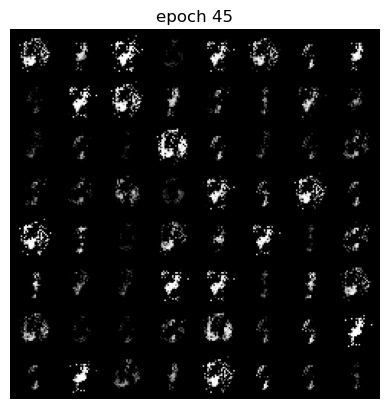

Epoch 45 of 100
Generator loss: 2.56805086, Discriminator loss: 0.89536965


  2%|▊                                            | 2/117 [00:00<00:07, 14.54it/s]

tensor(0.9481, grad_fn=<AddBackward0>)
tensor(0.9148, grad_fn=<AddBackward0>)
tensor(1.0290, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.85it/s]

tensor(0.9815, grad_fn=<AddBackward0>)
tensor(0.9574, grad_fn=<AddBackward0>)
tensor(1.0053, grad_fn=<AddBackward0>)
tensor(0.9895, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.94it/s]

tensor(0.9954, grad_fn=<AddBackward0>)
tensor(1.0003, grad_fn=<AddBackward0>)
tensor(1.0102, grad_fn=<AddBackward0>)
tensor(1.0338, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.00it/s]

tensor(1.0176, grad_fn=<AddBackward0>)
tensor(0.9595, grad_fn=<AddBackward0>)
tensor(0.9573, grad_fn=<AddBackward0>)
tensor(0.9478, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.04it/s]

tensor(0.9257, grad_fn=<AddBackward0>)
tensor(0.9363, grad_fn=<AddBackward0>)
tensor(0.9444, grad_fn=<AddBackward0>)
tensor(0.9401, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.03it/s]

tensor(0.9280, grad_fn=<AddBackward0>)
tensor(0.9112, grad_fn=<AddBackward0>)
tensor(0.9280, grad_fn=<AddBackward0>)
tensor(0.8939, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.08it/s]

tensor(0.9268, grad_fn=<AddBackward0>)
tensor(0.8373, grad_fn=<AddBackward0>)
tensor(0.8250, grad_fn=<AddBackward0>)
tensor(0.7792, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.04it/s]

tensor(0.8337, grad_fn=<AddBackward0>)
tensor(0.7775, grad_fn=<AddBackward0>)
tensor(0.7496, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.92it/s]

tensor(0.7559, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.7562, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.65it/s]

tensor(0.7464, grad_fn=<AddBackward0>)
tensor(0.7185, grad_fn=<AddBackward0>)
tensor(0.7607, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.53it/s]

tensor(0.7401, grad_fn=<AddBackward0>)
tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.7290, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.54it/s]

tensor(0.7585, grad_fn=<AddBackward0>)
tensor(0.7611, grad_fn=<AddBackward0>)
tensor(0.7008, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.72it/s]

tensor(0.7881, grad_fn=<AddBackward0>)
tensor(0.7647, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.84it/s]

tensor(0.7580, grad_fn=<AddBackward0>)
tensor(0.7849, grad_fn=<AddBackward0>)
tensor(0.7773, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.89it/s]

tensor(0.7892, grad_fn=<AddBackward0>)
tensor(0.7901, grad_fn=<AddBackward0>)
tensor(0.7784, grad_fn=<AddBackward0>)
tensor(0.8028, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.82it/s]

tensor(0.7949, grad_fn=<AddBackward0>)
tensor(0.8149, grad_fn=<AddBackward0>)
tensor(0.8196, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.84it/s]

tensor(0.7875, grad_fn=<AddBackward0>)
tensor(0.8716, grad_fn=<AddBackward0>)
tensor(0.8081, grad_fn=<AddBackward0>)
tensor(0.8669, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.96it/s]

tensor(0.8176, grad_fn=<AddBackward0>)
tensor(0.8211, grad_fn=<AddBackward0>)
tensor(0.8183, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.00it/s]

tensor(0.8235, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)
tensor(0.8059, grad_fn=<AddBackward0>)
tensor(0.7271, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.00it/s]

tensor(0.7412, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.7572, grad_fn=<AddBackward0>)
tensor(0.7609, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.09it/s]

tensor(0.7665, grad_fn=<AddBackward0>)
tensor(0.7864, grad_fn=<AddBackward0>)
tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7255, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.11it/s]

tensor(0.7479, grad_fn=<AddBackward0>)
tensor(0.8027, grad_fn=<AddBackward0>)
tensor(0.7862, grad_fn=<AddBackward0>)
tensor(0.8210, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.09it/s]

tensor(0.8125, grad_fn=<AddBackward0>)
tensor(0.8579, grad_fn=<AddBackward0>)
tensor(0.7518, grad_fn=<AddBackward0>)
tensor(0.7858, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.01it/s]

tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.8122, grad_fn=<AddBackward0>)
tensor(0.8046, grad_fn=<AddBackward0>)
tensor(0.7395, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.98it/s]

tensor(0.7931, grad_fn=<AddBackward0>)
tensor(0.8010, grad_fn=<AddBackward0>)
tensor(0.8184, grad_fn=<AddBackward0>)
tensor(0.8039, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.07it/s]

tensor(0.7863, grad_fn=<AddBackward0>)
tensor(0.8232, grad_fn=<AddBackward0>)
tensor(0.8152, grad_fn=<AddBackward0>)
tensor(0.8505, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.08it/s]

tensor(0.8369, grad_fn=<AddBackward0>)
tensor(0.8647, grad_fn=<AddBackward0>)
tensor(0.8312, grad_fn=<AddBackward0>)
tensor(0.8787, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.00it/s]

tensor(0.8647, grad_fn=<AddBackward0>)
tensor(0.9139, grad_fn=<AddBackward0>)
tensor(0.8860, grad_fn=<AddBackward0>)
tensor(0.8761, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.13it/s]

tensor(0.8815, grad_fn=<AddBackward0>)
tensor(0.9545, grad_fn=<AddBackward0>)
tensor(0.8794, grad_fn=<AddBackward0>)
tensor(0.8749, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.01it/s]

tensor(0.8252, grad_fn=<AddBackward0>)
tensor(0.8000, grad_fn=<AddBackward0>)
tensor(0.7725, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.85it/s]

tensor(0.7576, grad_fn=<AddBackward0>)
tensor(0.7527, grad_fn=<AddBackward0>)
tensor(0.7366, grad_fn=<AddBackward0>)


118it [00:07, 15.02it/s]                                                          


tensor(0.7600, grad_fn=<AddBackward0>)
tensor(0.6830, grad_fn=<AddBackward0>)
tensor(0.6856, grad_fn=<AddBackward0>)
tensor(0.6414, grad_fn=<AddBackward0>)
Epoch 46 of 100
Generator loss: 2.38953090, Discriminator loss: 0.83479100


  2%|▊                                            | 2/117 [00:00<00:07, 14.89it/s]

tensor(0.6771, grad_fn=<AddBackward0>)
tensor(0.6568, grad_fn=<AddBackward0>)
tensor(0.6531, grad_fn=<AddBackward0>)
tensor(0.6730, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.17it/s]

tensor(0.6671, grad_fn=<AddBackward0>)
tensor(0.7020, grad_fn=<AddBackward0>)
tensor(0.7202, grad_fn=<AddBackward0>)
tensor(0.7505, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.18it/s]

tensor(0.7003, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.7942, grad_fn=<AddBackward0>)
tensor(0.8186, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.07it/s]

tensor(0.8351, grad_fn=<AddBackward0>)
tensor(0.8819, grad_fn=<AddBackward0>)
tensor(0.8655, grad_fn=<AddBackward0>)
tensor(0.9348, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.00it/s]

tensor(0.8943, grad_fn=<AddBackward0>)
tensor(0.8961, grad_fn=<AddBackward0>)
tensor(0.9133, grad_fn=<AddBackward0>)
tensor(0.8979, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.06it/s]

tensor(0.8527, grad_fn=<AddBackward0>)
tensor(0.8718, grad_fn=<AddBackward0>)
tensor(0.8178, grad_fn=<AddBackward0>)
tensor(0.8232, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.09it/s]

tensor(0.7737, grad_fn=<AddBackward0>)
tensor(0.7873, grad_fn=<AddBackward0>)
tensor(0.7345, grad_fn=<AddBackward0>)
tensor(0.7232, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.09it/s]

tensor(0.7197, grad_fn=<AddBackward0>)
tensor(0.7583, grad_fn=<AddBackward0>)
tensor(0.6875, grad_fn=<AddBackward0>)
tensor(0.7237, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.98it/s]

tensor(0.7697, grad_fn=<AddBackward0>)
tensor(0.7463, grad_fn=<AddBackward0>)
tensor(0.7329, grad_fn=<AddBackward0>)
tensor(0.7808, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.09it/s]

tensor(0.7913, grad_fn=<AddBackward0>)
tensor(0.7517, grad_fn=<AddBackward0>)
tensor(0.8801, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.69it/s]

tensor(0.8468, grad_fn=<AddBackward0>)
tensor(0.8472, grad_fn=<AddBackward0>)
tensor(0.9330, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:05, 14.46it/s]

tensor(0.9329, grad_fn=<AddBackward0>)
tensor(0.8863, grad_fn=<AddBackward0>)
tensor(0.9362, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.47it/s]

tensor(0.9430, grad_fn=<AddBackward0>)
tensor(0.9415, grad_fn=<AddBackward0>)
tensor(0.9098, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.39it/s]

tensor(1.0132, grad_fn=<AddBackward0>)
tensor(0.9797, grad_fn=<AddBackward0>)
tensor(0.9875, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 13.51it/s]

tensor(0.9800, grad_fn=<AddBackward0>)
tensor(0.9839, grad_fn=<AddBackward0>)
tensor(0.9504, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 13.75it/s]

tensor(1.0078, grad_fn=<AddBackward0>)
tensor(0.9851, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:04, 14.10it/s]

tensor(0.9957, grad_fn=<AddBackward0>)
tensor(0.9822, grad_fn=<AddBackward0>)
tensor(1.0018, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.39it/s]

tensor(1.0360, grad_fn=<AddBackward0>)
tensor(0.9429, grad_fn=<AddBackward0>)
tensor(0.9638, grad_fn=<AddBackward0>)
tensor(0.9515, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.40it/s]

tensor(0.9649, grad_fn=<AddBackward0>)
tensor(0.9848, grad_fn=<AddBackward0>)
tensor(1.0024, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.50it/s]

tensor(0.9951, grad_fn=<AddBackward0>)
tensor(0.9472, grad_fn=<AddBackward0>)
tensor(0.9969, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.56it/s]

tensor(1.0294, grad_fn=<AddBackward0>)
tensor(1.0243, grad_fn=<AddBackward0>)
tensor(1.0306, grad_fn=<AddBackward0>)
tensor(1.0487, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.74it/s]

tensor(1.0593, grad_fn=<AddBackward0>)
tensor(1.0524, grad_fn=<AddBackward0>)
tensor(1.0478, grad_fn=<AddBackward0>)
tensor(1.0740, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.92it/s]

tensor(1.0240, grad_fn=<AddBackward0>)
tensor(1.0009, grad_fn=<AddBackward0>)
tensor(1.0383, grad_fn=<AddBackward0>)
tensor(1.0213, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.06it/s]

tensor(0.9753, grad_fn=<AddBackward0>)
tensor(0.9653, grad_fn=<AddBackward0>)
tensor(0.9747, grad_fn=<AddBackward0>)
tensor(0.9289, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.08it/s]

tensor(0.9158, grad_fn=<AddBackward0>)
tensor(0.9150, grad_fn=<AddBackward0>)
tensor(0.8449, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.02it/s]

tensor(0.8116, grad_fn=<AddBackward0>)
tensor(0.8400, grad_fn=<AddBackward0>)
tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7405, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.09it/s]

tensor(0.7415, grad_fn=<AddBackward0>)
tensor(0.7135, grad_fn=<AddBackward0>)
tensor(0.6870, grad_fn=<AddBackward0>)
tensor(0.6924, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.05it/s]

tensor(0.6870, grad_fn=<AddBackward0>)
tensor(0.6645, grad_fn=<AddBackward0>)
tensor(0.7045, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.03it/s]

tensor(0.6937, grad_fn=<AddBackward0>)
tensor(0.6790, grad_fn=<AddBackward0>)
tensor(0.6777, grad_fn=<AddBackward0>)
tensor(0.7288, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.06it/s]

tensor(0.7217, grad_fn=<AddBackward0>)
tensor(0.7701, grad_fn=<AddBackward0>)
tensor(0.7215, grad_fn=<AddBackward0>)
tensor(0.7677, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.8017, grad_fn=<AddBackward0>)
tensor(0.8238, grad_fn=<AddBackward0>)
tensor(0.8621, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.99it/s]

tensor(0.8310, grad_fn=<AddBackward0>)
tensor(0.8929, grad_fn=<AddBackward0>)
tensor(0.9181, grad_fn=<AddBackward0>)
tensor(0.9270, grad_fn=<AddBackward0>)


118it [00:07, 14.88it/s]                                                          


tensor(0.9437, grad_fn=<AddBackward0>)
tensor(0.9099, grad_fn=<AddBackward0>)
tensor(0.8551, grad_fn=<AddBackward0>)
Epoch 47 of 100
Generator loss: 2.40007949, Discriminator loss: 0.87051070


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9206, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.14it/s]

tensor(0.9650, grad_fn=<AddBackward0>)
tensor(0.9165, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.94it/s]

tensor(0.9630, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.84it/s]

tensor(0.9000, grad_fn=<AddBackward0>)
tensor(0.9004, grad_fn=<AddBackward0>)
tensor(0.8864, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.83it/s]

tensor(0.8989, grad_fn=<AddBackward0>)
tensor(0.8865, grad_fn=<AddBackward0>)
tensor(0.8457, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.94it/s]

tensor(0.8373, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.05it/s]

tensor(0.8241, grad_fn=<AddBackward0>)
tensor(0.8167, grad_fn=<AddBackward0>)
tensor(0.7806, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.96it/s]

tensor(0.7861, grad_fn=<AddBackward0>)

 14%|██████                                      | 16/117 [00:01<00:06, 15.00it/s]


tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.8017, grad_fn=<AddBackward0>)
tensor(0.7341, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.02it/s]

tensor(0.7682, grad_fn=<AddBackward0>)
tensor(0.7360, grad_fn=<AddBackward0>)
tensor(0.7452, grad_fn=<AddBackward0>)
tensor(0.7231, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.04it/s]

tensor(0.7367, grad_fn=<AddBackward0>)
tensor(0.7460, grad_fn=<AddBackward0>)
tensor(0.7299, grad_fn=<AddBackward0>)
tensor(0.7706, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.02it/s]

tensor(0.7175, grad_fn=<AddBackward0>)
tensor(0.7373, grad_fn=<AddBackward0>)
tensor(0.7622, grad_fn=<AddBackward0>)
tensor(0.8105, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.09it/s]

tensor(0.8060, grad_fn=<AddBackward0>)
tensor(0.8165, grad_fn=<AddBackward0>)
tensor(0.8591, grad_fn=<AddBackward0>)
tensor(0.8056, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.00it/s]

tensor(0.8494, grad_fn=<AddBackward0>)
tensor(0.8593, grad_fn=<AddBackward0>)
tensor(0.8419, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.74it/s]

tensor(0.7987, grad_fn=<AddBackward0>)
tensor(0.8655, grad_fn=<AddBackward0>)
tensor(0.8500, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.60it/s]

tensor(0.8311, grad_fn=<AddBackward0>)
tensor(0.8595, grad_fn=<AddBackward0>)
tensor(0.8719, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.58it/s]

tensor(0.8139, grad_fn=<AddBackward0>)
tensor(0.8267, grad_fn=<AddBackward0>)
tensor(0.7792, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.78it/s]

tensor(0.7685, grad_fn=<AddBackward0>)
tensor(0.7852, grad_fn=<AddBackward0>)
tensor(0.7635, grad_fn=<AddBackward0>)
tensor(0.7580, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.97it/s]

tensor(0.6897, grad_fn=<AddBackward0>)
tensor(0.6927, grad_fn=<AddBackward0>)
tensor(0.7126, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.58it/s]

tensor(0.7068, grad_fn=<AddBackward0>)
tensor(0.6683, grad_fn=<AddBackward0>)
tensor(0.6423, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.51it/s]

tensor(0.6889, grad_fn=<AddBackward0>)
tensor(0.6879, grad_fn=<AddBackward0>)
tensor(0.6915, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.45it/s]

tensor(0.7658, grad_fn=<AddBackward0>)
tensor(0.6827, grad_fn=<AddBackward0>)
tensor(0.7071, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.49it/s]

tensor(0.7322, grad_fn=<AddBackward0>)
tensor(0.8072, grad_fn=<AddBackward0>)
tensor(0.7848, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.13it/s]

tensor(0.8766, grad_fn=<AddBackward0>)
tensor(0.8203, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.28it/s]

tensor(0.8851, grad_fn=<AddBackward0>)
tensor(0.9420, grad_fn=<AddBackward0>)
tensor(0.9670, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.55it/s]

tensor(1.0522, grad_fn=<AddBackward0>)
tensor(1.0207, grad_fn=<AddBackward0>)
tensor(1.0842, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.33it/s]

tensor(1.0018, grad_fn=<AddBackward0>)
tensor(0.9339, grad_fn=<AddBackward0>)
tensor(0.9923, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.33it/s]

tensor(0.9711, grad_fn=<AddBackward0>)
tensor(0.9221, grad_fn=<AddBackward0>)
tensor(0.9076, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.44it/s]

tensor(0.8725, grad_fn=<AddBackward0>)
tensor(0.8051, grad_fn=<AddBackward0>)
tensor(0.7951, grad_fn=<AddBackward0>)
tensor(0.7569, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.71it/s]

tensor(0.7403, grad_fn=<AddBackward0>)
tensor(0.7478, grad_fn=<AddBackward0>)
tensor(0.6978, grad_fn=<AddBackward0>)
tensor(0.6648, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.95it/s]

tensor(0.6654, grad_fn=<AddBackward0>)
tensor(0.6124, grad_fn=<AddBackward0>)
tensor(0.6296, grad_fn=<AddBackward0>)
tensor(0.6123, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.05it/s]

tensor(0.5666, grad_fn=<AddBackward0>)
tensor(0.6525, grad_fn=<AddBackward0>)
tensor(0.6097, grad_fn=<AddBackward0>)
tensor(0.6303, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.14it/s]

tensor(0.6208, grad_fn=<AddBackward0>)
tensor(0.6381, grad_fn=<AddBackward0>)
tensor(0.6315, grad_fn=<AddBackward0>)
tensor(0.6525, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.08it/s]

tensor(0.6586, grad_fn=<AddBackward0>)
tensor(0.7416, grad_fn=<AddBackward0>)
tensor(0.7571, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.03it/s]

tensor(0.7871, grad_fn=<AddBackward0>)
tensor(0.7776, grad_fn=<AddBackward0>)
tensor(0.7916, grad_fn=<AddBackward0>)
tensor(0.8637, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.05it/s]

tensor(0.9536, grad_fn=<AddBackward0>)
tensor(0.9492, grad_fn=<AddBackward0>)
tensor(1.0199, grad_fn=<AddBackward0>)
tensor(0.9054, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.18it/s]

tensor(0.9101, grad_fn=<AddBackward0>)
tensor(0.9644, grad_fn=<AddBackward0>)
tensor(0.8465, grad_fn=<AddBackward0>)
tensor(0.8655, grad_fn=<AddBackward0>)


118it [00:07, 14.91it/s]                                                          


tensor(0.7918, grad_fn=<AddBackward0>)
tensor(0.7890, grad_fn=<AddBackward0>)
Epoch 48 of 100
Generator loss: 2.81190348, Discriminator loss: 0.80789256


  2%|▊                                            | 2/117 [00:00<00:07, 15.35it/s]

tensor(0.7178, grad_fn=<AddBackward0>)
tensor(0.6870, grad_fn=<AddBackward0>)
tensor(0.7331, grad_fn=<AddBackward0>)
tensor(0.6476, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.34it/s]

tensor(0.6539, grad_fn=<AddBackward0>)
tensor(0.6693, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.21it/s]

tensor(0.5785, grad_fn=<AddBackward0>)
tensor(0.6262, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.15it/s]

tensor(0.6093, grad_fn=<AddBackward0>)
tensor(0.5883, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.98it/s]

tensor(0.5778, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.93it/s]

tensor(0.5868, grad_fn=<AddBackward0>)
tensor(0.6062, grad_fn=<AddBackward0>)
tensor(0.6006, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.83it/s]

tensor(0.6379, grad_fn=<AddBackward0>)
tensor(0.5772, grad_fn=<AddBackward0>)
tensor(0.5750, grad_fn=<AddBackward0>)
tensor(0.5631, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.03it/s]

tensor(0.6310, grad_fn=<AddBackward0>)
tensor(0.6515, grad_fn=<AddBackward0>)
tensor(0.6604, grad_fn=<AddBackward0>)
tensor(0.6713, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.05it/s]

tensor(0.6779, grad_fn=<AddBackward0>)
tensor(0.7181, grad_fn=<AddBackward0>)
tensor(0.7423, grad_fn=<AddBackward0>)
tensor(0.7280, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.04it/s]

tensor(0.7690, grad_fn=<AddBackward0>)
tensor(0.8346, grad_fn=<AddBackward0>)
tensor(0.7885, grad_fn=<AddBackward0>)
tensor(0.8922, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.07it/s]

tensor(0.8729, grad_fn=<AddBackward0>)
tensor(0.8986, grad_fn=<AddBackward0>)
tensor(0.8631, grad_fn=<AddBackward0>)
tensor(0.8220, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.09it/s]

tensor(0.8262, grad_fn=<AddBackward0>)
tensor(0.8203, grad_fn=<AddBackward0>)
tensor(0.7816, grad_fn=<AddBackward0>)
tensor(0.8011, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.67it/s]

tensor(0.7761, grad_fn=<AddBackward0>)
tensor(0.7773, grad_fn=<AddBackward0>)
tensor(0.7480, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.76it/s]

tensor(0.7178, grad_fn=<AddBackward0>)
tensor(0.7151, grad_fn=<AddBackward0>)
tensor(0.7047, grad_fn=<AddBackward0>)
tensor(0.6836, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.83it/s]

tensor(0.7149, grad_fn=<AddBackward0>)
tensor(0.7080, grad_fn=<AddBackward0>)
tensor(0.6969, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.74it/s]

tensor(0.7207, grad_fn=<AddBackward0>)
tensor(0.6977, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)
tensor(0.7353, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.96it/s]

tensor(0.7554, grad_fn=<AddBackward0>)
tensor(0.7750, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.8091, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.05it/s]

tensor(0.8384, grad_fn=<AddBackward0>)
tensor(0.8750, grad_fn=<AddBackward0>)
tensor(0.8960, grad_fn=<AddBackward0>)
tensor(0.9432, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.11it/s]

tensor(0.9001, grad_fn=<AddBackward0>)
tensor(0.9201, grad_fn=<AddBackward0>)
tensor(0.9147, grad_fn=<AddBackward0>)
tensor(0.9631, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.12it/s]

tensor(0.9157, grad_fn=<AddBackward0>)
tensor(0.9279, grad_fn=<AddBackward0>)
tensor(0.8603, grad_fn=<AddBackward0>)
tensor(0.9192, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.08it/s]

tensor(0.8542, grad_fn=<AddBackward0>)
tensor(0.8560, grad_fn=<AddBackward0>)
tensor(0.8118, grad_fn=<AddBackward0>)
tensor(0.7860, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.97it/s]

tensor(0.7738, grad_fn=<AddBackward0>)
tensor(0.7591, grad_fn=<AddBackward0>)
tensor(0.7869, grad_fn=<AddBackward0>)
tensor(0.7417, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.94it/s]

tensor(0.6809, grad_fn=<AddBackward0>)
tensor(0.6555, grad_fn=<AddBackward0>)
tensor(0.6844, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.35it/s]

tensor(0.6609, grad_fn=<AddBackward0>)
tensor(0.6572, grad_fn=<AddBackward0>)
tensor(0.6902, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.31it/s]

tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.6337, grad_fn=<AddBackward0>)
tensor(0.6775, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.65it/s]

tensor(0.6561, grad_fn=<AddBackward0>)
tensor(0.6678, grad_fn=<AddBackward0>)
tensor(0.6967, grad_fn=<AddBackward0>)
tensor(0.7317, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.90it/s]

tensor(0.7698, grad_fn=<AddBackward0>)
tensor(0.7698, grad_fn=<AddBackward0>)
tensor(0.7586, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.81it/s]

tensor(0.7884, grad_fn=<AddBackward0>)
tensor(0.8253, grad_fn=<AddBackward0>)
tensor(0.8836, grad_fn=<AddBackward0>)
tensor(0.9062, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.85it/s]

tensor(0.9399, grad_fn=<AddBackward0>)
tensor(0.9526, grad_fn=<AddBackward0>)
tensor(0.9721, grad_fn=<AddBackward0>)
tensor(0.9327, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.94it/s]

tensor(1.0276, grad_fn=<AddBackward0>)
tensor(0.9699, grad_fn=<AddBackward0>)
tensor(0.9677, grad_fn=<AddBackward0>)
tensor(0.9867, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.14it/s]

tensor(1.0074, grad_fn=<AddBackward0>)
tensor(1.0256, grad_fn=<AddBackward0>)
tensor(0.9884, grad_fn=<AddBackward0>)
tensor(0.9510, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.11it/s]

tensor(0.9693, grad_fn=<AddBackward0>)
tensor(0.9735, grad_fn=<AddBackward0>)
tensor(0.8842, grad_fn=<AddBackward0>)
tensor(0.8985, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.15it/s]

tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.8152, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


118it [00:07, 15.03it/s]                                                          


tensor(0.8461, grad_fn=<AddBackward0>)
tensor(0.8351, grad_fn=<AddBackward0>)
tensor(0.9156, grad_fn=<AddBackward0>)
Epoch 49 of 100
Generator loss: 2.85356283, Discriminator loss: 0.78882802


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8017, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.12it/s]

tensor(0.7727, grad_fn=<AddBackward0>)
tensor(0.7943, grad_fn=<AddBackward0>)
tensor(0.7886, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.03it/s]

tensor(0.7664, grad_fn=<AddBackward0>)

  5%|██▎                                          | 6/117 [00:00<00:07, 15.05it/s]


tensor(0.7831, grad_fn=<AddBackward0>)
tensor(0.7500, grad_fn=<AddBackward0>)
tensor(0.7669, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.99it/s]

tensor(0.7446, grad_fn=<AddBackward0>)
tensor(0.8000, grad_fn=<AddBackward0>)
tensor(0.7654, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.85it/s]

tensor(0.7999, grad_fn=<AddBackward0>)
tensor(0.7370, grad_fn=<AddBackward0>)
tensor(0.7265, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.82it/s]

tensor(0.7683, grad_fn=<AddBackward0>)
tensor(0.7846, grad_fn=<AddBackward0>)
tensor(0.7455, grad_fn=<AddBackward0>)
tensor(0.7664, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.00it/s]

tensor(0.8166, grad_fn=<AddBackward0>)
tensor(0.7578, grad_fn=<AddBackward0>)
tensor(0.7520, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.76it/s]

tensor(0.7641, grad_fn=<AddBackward0>)
tensor(0.7879, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.75it/s]

tensor(0.7962, grad_fn=<AddBackward0>)
tensor(0.7720, grad_fn=<AddBackward0>)
tensor(0.7433, grad_fn=<AddBackward0>)
tensor(0.7575, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.95it/s]

tensor(0.7922, grad_fn=<AddBackward0>)
tensor(0.7438, grad_fn=<AddBackward0>)
tensor(0.7637, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.85it/s]

tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.7143, grad_fn=<AddBackward0>)
tensor(0.7205, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.75it/s]

tensor(0.7090, grad_fn=<AddBackward0>)
tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.7339, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.64it/s]

tensor(0.7238, grad_fn=<AddBackward0>)
tensor(0.7390, grad_fn=<AddBackward0>)
tensor(0.7057, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.73it/s]

tensor(0.7398, grad_fn=<AddBackward0>)
tensor(0.6842, grad_fn=<AddBackward0>)
tensor(0.7175, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:05, 13.84it/s]

tensor(0.7517, grad_fn=<AddBackward0>)
tensor(0.7414, grad_fn=<AddBackward0>)
tensor(0.8407, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:05, 13.28it/s]

tensor(0.8523, grad_fn=<AddBackward0>)
tensor(0.8596, grad_fn=<AddBackward0>)
tensor(0.8046, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 13.17it/s]

tensor(0.8246, grad_fn=<AddBackward0>)
tensor(0.9016, grad_fn=<AddBackward0>)
tensor(0.9582, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 13.31it/s]

tensor(0.9072, grad_fn=<AddBackward0>)
tensor(0.9106, grad_fn=<AddBackward0>)
tensor(0.9167, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:04<00:04, 13.82it/s]

tensor(0.9651, grad_fn=<AddBackward0>)
tensor(0.9245, grad_fn=<AddBackward0>)
tensor(0.9017, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:04, 14.13it/s]

tensor(0.9100, grad_fn=<AddBackward0>)
tensor(0.9127, grad_fn=<AddBackward0>)
tensor(0.8610, grad_fn=<AddBackward0>)
tensor(0.8286, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.59it/s]

tensor(0.8284, grad_fn=<AddBackward0>)
tensor(0.8016, grad_fn=<AddBackward0>)
tensor(0.7640, grad_fn=<AddBackward0>)
tensor(0.7413, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.78it/s]

tensor(0.7540, grad_fn=<AddBackward0>)
tensor(0.7278, grad_fn=<AddBackward0>)
tensor(0.6875, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.31it/s]

tensor(0.7169, grad_fn=<AddBackward0>)
tensor(0.6464, grad_fn=<AddBackward0>)
tensor(0.6237, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.46it/s]

tensor(0.6620, grad_fn=<AddBackward0>)
tensor(0.6636, grad_fn=<AddBackward0>)
tensor(0.6904, grad_fn=<AddBackward0>)
tensor(0.6634, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.73it/s]

tensor(0.6578, grad_fn=<AddBackward0>)
tensor(0.6878, grad_fn=<AddBackward0>)
tensor(0.6916, grad_fn=<AddBackward0>)
tensor(0.6873, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.01it/s]

tensor(0.6757, grad_fn=<AddBackward0>)
tensor(0.7206, grad_fn=<AddBackward0>)
tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.7487, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.07it/s]

tensor(0.7853, grad_fn=<AddBackward0>)
tensor(0.8436, grad_fn=<AddBackward0>)
tensor(0.8051, grad_fn=<AddBackward0>)
tensor(0.8302, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.09it/s]

tensor(0.8236, grad_fn=<AddBackward0>)
tensor(0.8786, grad_fn=<AddBackward0>)
tensor(0.9399, grad_fn=<AddBackward0>)
tensor(0.9535, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.18it/s]

tensor(0.9389, grad_fn=<AddBackward0>)
tensor(0.8679, grad_fn=<AddBackward0>)
tensor(0.9779, grad_fn=<AddBackward0>)
tensor(0.9372, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.08it/s]

tensor(0.9430, grad_fn=<AddBackward0>)
tensor(0.8912, grad_fn=<AddBackward0>)
tensor(0.8735, grad_fn=<AddBackward0>)
tensor(0.8920, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.17it/s]

tensor(0.8683, grad_fn=<AddBackward0>)
tensor(0.7964, grad_fn=<AddBackward0>)
tensor(0.8118, grad_fn=<AddBackward0>)
tensor(0.7457, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.12it/s]

tensor(0.7975, grad_fn=<AddBackward0>)
tensor(0.7678, grad_fn=<AddBackward0>)
tensor(0.7901, grad_fn=<AddBackward0>)
tensor(0.7740, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.16it/s]

tensor(0.7402, grad_fn=<AddBackward0>)
tensor(0.7772, grad_fn=<AddBackward0>)
tensor(0.7220, grad_fn=<AddBackward0>)
tensor(0.7568, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.16it/s]

tensor(0.7688, grad_fn=<AddBackward0>)
tensor(0.7928, grad_fn=<AddBackward0>)
tensor(0.7355, grad_fn=<AddBackward0>)
tensor(0.8045, grad_fn=<AddBackward0>)


118it [00:07, 14.76it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8332, grad_fn=<AddBackward0>)
tensor(0.8060, grad_fn=<AddBackward0>)


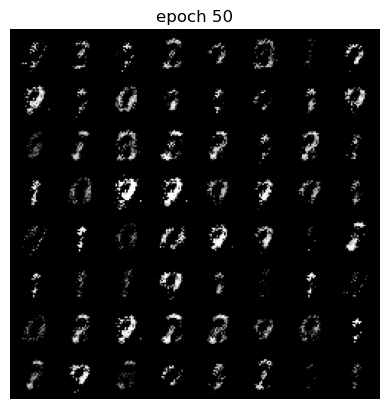

Epoch 50 of 100
Generator loss: 2.77590489, Discriminator loss: 0.79484892


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8128, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:08, 14.37it/s]

tensor(0.8476, grad_fn=<AddBackward0>)
tensor(0.7995, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.51it/s]

tensor(0.7845, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.88it/s]

tensor(0.7863, grad_fn=<AddBackward0>)
tensor(0.8685, grad_fn=<AddBackward0>)
tensor(0.7809, grad_fn=<AddBackward0>)
tensor(0.7507, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.97it/s]

tensor(0.7648, grad_fn=<AddBackward0>)
tensor(0.7779, grad_fn=<AddBackward0>)
tensor(0.7093, grad_fn=<AddBackward0>)
tensor(0.7193, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.02it/s]

tensor(0.6719, grad_fn=<AddBackward0>)
tensor(0.7256, grad_fn=<AddBackward0>)
tensor(0.7047, grad_fn=<AddBackward0>)
tensor(0.6719, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.09it/s]

tensor(0.7329, grad_fn=<AddBackward0>)
tensor(0.6451, grad_fn=<AddBackward0>)
tensor(0.6720, grad_fn=<AddBackward0>)
tensor(0.6307, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.16it/s]

tensor(0.6678, grad_fn=<AddBackward0>)
tensor(0.7085, grad_fn=<AddBackward0>)
tensor(0.6765, grad_fn=<AddBackward0>)
tensor(0.6377, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.28it/s]

tensor(0.6932, grad_fn=<AddBackward0>)
tensor(0.6820, grad_fn=<AddBackward0>)
tensor(0.7536, grad_fn=<AddBackward0>)
tensor(0.7460, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.16it/s]

tensor(0.7641, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)
tensor(0.7839, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.14it/s]

tensor(0.8278, grad_fn=<AddBackward0>)
tensor(0.8353, grad_fn=<AddBackward0>)
tensor(0.8315, grad_fn=<AddBackward0>)
tensor(0.8497, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.19it/s]

tensor(0.9274, grad_fn=<AddBackward0>)
tensor(0.9619, grad_fn=<AddBackward0>)
tensor(0.8768, grad_fn=<AddBackward0>)
tensor(0.9196, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.19it/s]

tensor(0.8797, grad_fn=<AddBackward0>)
tensor(0.9047, grad_fn=<AddBackward0>)
tensor(0.8872, grad_fn=<AddBackward0>)
tensor(0.9127, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.20it/s]

tensor(0.9342, grad_fn=<AddBackward0>)
tensor(0.8930, grad_fn=<AddBackward0>)
tensor(0.9182, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.19it/s]

tensor(0.9022, grad_fn=<AddBackward0>)
tensor(0.9637, grad_fn=<AddBackward0>)
tensor(0.9419, grad_fn=<AddBackward0>)
tensor(0.9749, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.21it/s]

tensor(0.9121, grad_fn=<AddBackward0>)
tensor(0.9305, grad_fn=<AddBackward0>)
tensor(0.8938, grad_fn=<AddBackward0>)
tensor(0.8375, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.08it/s]

tensor(0.8681, grad_fn=<AddBackward0>)
tensor(0.8077, grad_fn=<AddBackward0>)
tensor(0.7944, grad_fn=<AddBackward0>)
tensor(0.7957, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.03it/s]

tensor(0.7949, grad_fn=<AddBackward0>)
tensor(0.7470, grad_fn=<AddBackward0>)
tensor(0.7613, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.89it/s]

tensor(0.7221, grad_fn=<AddBackward0>)
tensor(0.7422, grad_fn=<AddBackward0>)
tensor(0.7432, grad_fn=<AddBackward0>)
tensor(0.7227, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.92it/s]

tensor(0.6837, grad_fn=<AddBackward0>)
tensor(0.6919, grad_fn=<AddBackward0>)
tensor(0.6850, grad_fn=<AddBackward0>)
tensor(0.6434, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.00it/s]

tensor(0.6779, grad_fn=<AddBackward0>)
tensor(0.6282, grad_fn=<AddBackward0>)
tensor(0.6339, grad_fn=<AddBackward0>)
tensor(0.7049, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(0.6747, grad_fn=<AddBackward0>)
tensor(0.6432, grad_fn=<AddBackward0>)
tensor(0.6399, grad_fn=<AddBackward0>)
tensor(0.6499, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.11it/s]

tensor(0.6223, grad_fn=<AddBackward0>)
tensor(0.6618, grad_fn=<AddBackward0>)
tensor(0.6807, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.10it/s]

tensor(0.6631, grad_fn=<AddBackward0>)
tensor(0.6739, grad_fn=<AddBackward0>)
tensor(0.7031, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.02it/s]

tensor(0.7309, grad_fn=<AddBackward0>)
tensor(0.7703, grad_fn=<AddBackward0>)
tensor(0.7847, grad_fn=<AddBackward0>)
tensor(0.7644, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.05it/s]

tensor(0.8421, grad_fn=<AddBackward0>)
tensor(0.8589, grad_fn=<AddBackward0>)
tensor(0.8296, grad_fn=<AddBackward0>)
tensor(0.9535, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.14it/s]

tensor(0.8704, grad_fn=<AddBackward0>)
tensor(0.8685, grad_fn=<AddBackward0>)
tensor(0.8544, grad_fn=<AddBackward0>)
tensor(0.9160, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.20it/s]

tensor(0.8414, grad_fn=<AddBackward0>)
tensor(0.8328, grad_fn=<AddBackward0>)
tensor(0.8168, grad_fn=<AddBackward0>)
tensor(0.8636, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.18it/s]

tensor(0.7977, grad_fn=<AddBackward0>)
tensor(0.7991, grad_fn=<AddBackward0>)
tensor(0.7470, grad_fn=<AddBackward0>)
tensor(0.7150, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.18it/s]

tensor(0.6992, grad_fn=<AddBackward0>)
tensor(0.6795, grad_fn=<AddBackward0>)
tensor(0.6446, grad_fn=<AddBackward0>)
tensor(0.6465, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.19it/s]

tensor(0.6328, grad_fn=<AddBackward0>)
tensor(0.6825, grad_fn=<AddBackward0>)
tensor(0.6020, grad_fn=<AddBackward0>)
tensor(0.6110, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 13.61it/s]

tensor(0.6399, grad_fn=<AddBackward0>)
tensor(0.6452, grad_fn=<AddBackward0>)
tensor(0.6375, grad_fn=<AddBackward0>)
tensor(0.6354, grad_fn=<AddBackward0>)


118it [00:07, 15.04it/s]                                                          


tensor(0.6567, grad_fn=<AddBackward0>)
Epoch 51 of 100
Generator loss: 2.95340896, Discriminator loss: 0.77119106


  2%|▊                                            | 2/117 [00:00<00:07, 15.23it/s]

tensor(0.6208, grad_fn=<AddBackward0>)
tensor(0.6504, grad_fn=<AddBackward0>)
tensor(0.6547, grad_fn=<AddBackward0>)
tensor(0.6586, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.19it/s]

tensor(0.7198, grad_fn=<AddBackward0>)
tensor(0.6536, grad_fn=<AddBackward0>)
tensor(0.6847, grad_fn=<AddBackward0>)
tensor(0.7111, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.17it/s]

tensor(0.6479, grad_fn=<AddBackward0>)
tensor(0.6991, grad_fn=<AddBackward0>)
tensor(0.6762, grad_fn=<AddBackward0>)
tensor(0.6998, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.17it/s]

tensor(0.6599, grad_fn=<AddBackward0>)
tensor(0.6395, grad_fn=<AddBackward0>)
tensor(0.6759, grad_fn=<AddBackward0>)
tensor(0.6505, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.16it/s]

tensor(0.6804, grad_fn=<AddBackward0>)
tensor(0.6692, grad_fn=<AddBackward0>)
tensor(0.6410, grad_fn=<AddBackward0>)
tensor(0.6659, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.20it/s]

tensor(0.6702, grad_fn=<AddBackward0>)
tensor(0.6096, grad_fn=<AddBackward0>)
tensor(0.6056, grad_fn=<AddBackward0>)
tensor(0.6319, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.12it/s]

tensor(0.6381, grad_fn=<AddBackward0>)
tensor(0.6315, grad_fn=<AddBackward0>)
tensor(0.6322, grad_fn=<AddBackward0>)
tensor(0.6538, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.11it/s]

tensor(0.6622, grad_fn=<AddBackward0>)
tensor(0.6488, grad_fn=<AddBackward0>)
tensor(0.6335, grad_fn=<AddBackward0>)
tensor(0.6451, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.97it/s]

tensor(0.6872, grad_fn=<AddBackward0>)
tensor(0.6827, grad_fn=<AddBackward0>)
tensor(0.7306, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.97it/s]

tensor(0.6693, grad_fn=<AddBackward0>)
tensor(0.6792, grad_fn=<AddBackward0>)
tensor(0.6546, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.98it/s]

tensor(0.6139, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.89it/s]

tensor(0.6635, grad_fn=<AddBackward0>)
tensor(0.6609, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.80it/s]

tensor(0.6556, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:05, 14.41it/s]

tensor(0.7022, grad_fn=<AddBackward0>)
tensor(0.6825, grad_fn=<AddBackward0>)
tensor(0.6175, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.52it/s]

tensor(0.6822, grad_fn=<AddBackward0>)
tensor(0.6211, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.49it/s]

tensor(0.6649, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.66it/s]

tensor(0.6512, grad_fn=<AddBackward0>)
tensor(0.6080, grad_fn=<AddBackward0>)
tensor(0.6452, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.66it/s]

tensor(0.6149, grad_fn=<AddBackward0>)
tensor(0.6146, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.78it/s]

tensor(0.6218, grad_fn=<AddBackward0>)
tensor(0.6027, grad_fn=<AddBackward0>)
tensor(0.6277, grad_fn=<AddBackward0>)
tensor(0.6445, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.98it/s]

tensor(0.6087, grad_fn=<AddBackward0>)
tensor(0.6361, grad_fn=<AddBackward0>)
tensor(0.6911, grad_fn=<AddBackward0>)
tensor(0.6808, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.03it/s]

tensor(0.7043, grad_fn=<AddBackward0>)
tensor(0.6536, grad_fn=<AddBackward0>)
tensor(0.6898, grad_fn=<AddBackward0>)
tensor(0.7111, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.96it/s]

tensor(0.7063, grad_fn=<AddBackward0>)
tensor(0.7027, grad_fn=<AddBackward0>)
tensor(0.6877, grad_fn=<AddBackward0>)
tensor(0.7749, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.11it/s]

tensor(0.7550, grad_fn=<AddBackward0>)
tensor(0.7471, grad_fn=<AddBackward0>)
tensor(0.7161, grad_fn=<AddBackward0>)
tensor(0.7010, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.10it/s]

tensor(0.7177, grad_fn=<AddBackward0>)
tensor(0.7261, grad_fn=<AddBackward0>)
tensor(0.6956, grad_fn=<AddBackward0>)
tensor(0.7244, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.10it/s]

tensor(0.6589, grad_fn=<AddBackward0>)
tensor(0.6782, grad_fn=<AddBackward0>)
tensor(0.6686, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.04it/s]

tensor(0.6510, grad_fn=<AddBackward0>)
tensor(0.6838, grad_fn=<AddBackward0>)
tensor(0.6299, grad_fn=<AddBackward0>)
tensor(0.6216, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.03it/s]

tensor(0.6258, grad_fn=<AddBackward0>)
tensor(0.5874, grad_fn=<AddBackward0>)
tensor(0.5795, grad_fn=<AddBackward0>)
tensor(0.6348, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.10it/s]

tensor(0.5972, grad_fn=<AddBackward0>)
tensor(0.6124, grad_fn=<AddBackward0>)
tensor(0.6268, grad_fn=<AddBackward0>)
tensor(0.6558, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.14it/s]

tensor(0.6492, grad_fn=<AddBackward0>)
tensor(0.6250, grad_fn=<AddBackward0>)
tensor(0.6845, grad_fn=<AddBackward0>)
tensor(0.6316, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.03it/s]

tensor(0.6884, grad_fn=<AddBackward0>)
tensor(0.6660, grad_fn=<AddBackward0>)
tensor(0.6876, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.06it/s]

tensor(0.7391, grad_fn=<AddBackward0>)
tensor(0.8548, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.8141, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.96it/s]

tensor(0.8495, grad_fn=<AddBackward0>)
tensor(0.8553, grad_fn=<AddBackward0>)
tensor(0.8891, grad_fn=<AddBackward0>)
tensor(0.8906, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.95it/s]

tensor(0.8096, grad_fn=<AddBackward0>)
tensor(0.8628, grad_fn=<AddBackward0>)
tensor(0.8312, grad_fn=<AddBackward0>)
tensor(0.8073, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.03it/s]

tensor(0.7835, grad_fn=<AddBackward0>)
tensor(0.7178, grad_fn=<AddBackward0>)
tensor(0.7299, grad_fn=<AddBackward0>)
tensor(0.7271, grad_fn=<AddBackward0>)


118it [00:07, 15.07it/s]                                                          


tensor(0.7449, grad_fn=<AddBackward0>)
Epoch 52 of 100
Generator loss: 3.21776772, Discriminator loss: 0.68890452


  2%|▊                                            | 2/117 [00:00<00:07, 15.31it/s]

tensor(0.6246, grad_fn=<AddBackward0>)
tensor(0.5847, grad_fn=<AddBackward0>)
tensor(0.6597, grad_fn=<AddBackward0>)
tensor(0.6317, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.21it/s]

tensor(0.6233, grad_fn=<AddBackward0>)
tensor(0.6099, grad_fn=<AddBackward0>)
tensor(0.5962, grad_fn=<AddBackward0>)
tensor(0.5746, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.22it/s]

tensor(0.5587, grad_fn=<AddBackward0>)
tensor(0.5809, grad_fn=<AddBackward0>)
tensor(0.5921, grad_fn=<AddBackward0>)
tensor(0.5956, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.11it/s]

tensor(0.6807, grad_fn=<AddBackward0>)
tensor(0.6189, grad_fn=<AddBackward0>)
tensor(0.7116, grad_fn=<AddBackward0>)
tensor(0.6691, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.11it/s]

tensor(0.6905, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)
tensor(0.7487, grad_fn=<AddBackward0>)
tensor(0.8093, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.05it/s]

tensor(0.7792, grad_fn=<AddBackward0>)
tensor(0.8451, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.94it/s]

tensor(0.8171, grad_fn=<AddBackward0>)
tensor(0.8692, grad_fn=<AddBackward0>)
tensor(0.8084, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.11it/s]

tensor(0.8543, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.03it/s]

tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.8396, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.98it/s]

tensor(0.8092, grad_fn=<AddBackward0>)
tensor(0.8070, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.04it/s]

tensor(0.7684, grad_fn=<AddBackward0>)
tensor(0.7555, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.09it/s]

tensor(0.7336, grad_fn=<AddBackward0>)
tensor(0.7199, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.11it/s]

tensor(0.6894, grad_fn=<AddBackward0>)
tensor(0.7442, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.13it/s]

tensor(0.7612, grad_fn=<AddBackward0>)
tensor(0.7168, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.17it/s]

tensor(0.7512, grad_fn=<AddBackward0>)
tensor(0.6911, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.19it/s]

tensor(0.6968, grad_fn=<AddBackward0>)
tensor(0.7309, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.14it/s]

tensor(0.7448, grad_fn=<AddBackward0>)
tensor(0.7388, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.21it/s]

tensor(0.7643, grad_fn=<AddBackward0>)
tensor(0.7437, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.17it/s]

tensor(0.7966, grad_fn=<AddBackward0>)
tensor(0.8305, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.15it/s]

tensor(0.8761, grad_fn=<AddBackward0>)
tensor(0.7796, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.10it/s]

tensor(0.9183, grad_fn=<AddBackward0>)
tensor(0.8779, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.9617, grad_fn=<AddBackward0>)
tensor(0.8925, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.14it/s]

tensor(0.8828, grad_fn=<AddBackward0>)
tensor(0.8587, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.15it/s]

tensor(0.8632, grad_fn=<AddBackward0>)
tensor(0.8884, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.02it/s]

tensor(0.7975, grad_fn=<AddBackward0>)
tensor(0.8119, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.11it/s]

tensor(0.7747, grad_fn=<AddBackward0>)
tensor(0.7396, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.09it/s]

tensor(0.7125, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.02it/s]

tensor(0.7247, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.02it/s]

tensor(0.7340, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.02it/s]

tensor(0.6969, grad_fn=<AddBackward0>)
tensor(0.7033, grad_fn=<AddBackward0>)
tensor(0.6775, grad_fn=<AddBackward0>)
tensor(0.7435, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.06it/s]

tensor(0.6967, grad_fn=<AddBackward0>)
tensor(0.7772, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)
tensor(0.7980, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.07it/s]

tensor(0.8158, grad_fn=<AddBackward0>)
tensor(0.8559, grad_fn=<AddBackward0>)
tensor(0.8307, grad_fn=<AddBackward0>)
tensor(0.8437, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.02it/s]

tensor(0.8720, grad_fn=<AddBackward0>)
tensor(0.8360, grad_fn=<AddBackward0>)
tensor(0.8308, grad_fn=<AddBackward0>)
tensor(0.8175, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.05it/s]

tensor(0.8010, grad_fn=<AddBackward0>)
tensor(0.8205, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.00it/s]

tensor(0.7690, grad_fn=<AddBackward0>)
tensor(0.7558, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.07it/s]

tensor(0.7141, grad_fn=<AddBackward0>)
tensor(0.6534, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.04it/s]

tensor(0.6451, grad_fn=<AddBackward0>)
tensor(0.6533, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.05it/s]

tensor(0.6225, grad_fn=<AddBackward0>)
tensor(0.5908, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.08it/s]

tensor(0.6077, grad_fn=<AddBackward0>)
tensor(0.6105, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.06it/s]

tensor(0.6656, grad_fn=<AddBackward0>)
tensor(0.6296, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.02it/s]

tensor(0.6924, grad_fn=<AddBackward0>)
tensor(0.6866, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.08it/s]

tensor(0.7458, grad_fn=<AddBackward0>)
tensor(0.7544, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.10it/s]

tensor(0.8174, grad_fn=<AddBackward0>)
tensor(0.8890, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.16it/s]

tensor(0.9125, grad_fn=<AddBackward0>)
tensor(0.9042, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.13it/s]

tensor(1.0257, grad_fn=<AddBackward0>)
tensor(1.0006, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.09it/s]

tensor(0.9431, grad_fn=<AddBackward0>)
tensor(0.9148, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.10it/s]

tensor(0.8781, grad_fn=<AddBackward0>)
tensor(0.8370, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.11it/s]

tensor(0.7525, grad_fn=<AddBackward0>)
tensor(0.7069, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.14it/s]

tensor(0.6503, grad_fn=<AddBackward0>)
tensor(0.6148, grad_fn=<AddBackward0>)


118it [00:07, 15.18it/s]                                                          


tensor(0.5755, grad_fn=<AddBackward0>)
tensor(0.5745, grad_fn=<AddBackward0>)
Epoch 53 of 100
Generator loss: 3.29416347, Discriminator loss: 0.75968128


  2%|▊                                            | 2/117 [00:00<00:07, 15.30it/s]

tensor(0.5608, grad_fn=<AddBackward0>)
tensor(0.5535, grad_fn=<AddBackward0>)
tensor(0.5558, grad_fn=<AddBackward0>)
tensor(0.5435, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.16it/s]

tensor(0.5059, grad_fn=<AddBackward0>)
tensor(0.5430, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.18it/s]

tensor(0.5759, grad_fn=<AddBackward0>)
tensor(0.5787, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.16it/s]

tensor(0.5920, grad_fn=<AddBackward0>)
tensor(0.5661, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.24it/s]

tensor(0.5909, grad_fn=<AddBackward0>)
tensor(0.6138, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.15it/s]

tensor(0.6105, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:07, 14.69it/s]

tensor(0.5831, grad_fn=<AddBackward0>)
tensor(0.6556, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.78it/s]

tensor(0.6473, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.88it/s]

tensor(0.6483, grad_fn=<AddBackward0>)
tensor(0.6314, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)
tensor(0.6845, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.02it/s]

tensor(0.6401, grad_fn=<AddBackward0>)
tensor(0.7074, grad_fn=<AddBackward0>)
tensor(0.7565, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.03it/s]

tensor(0.7480, grad_fn=<AddBackward0>)
tensor(0.7879, grad_fn=<AddBackward0>)
tensor(0.7582, grad_fn=<AddBackward0>)
tensor(0.8158, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.24it/s]

tensor(0.8322, grad_fn=<AddBackward0>)
tensor(0.8432, grad_fn=<AddBackward0>)
tensor(0.8264, grad_fn=<AddBackward0>)
tensor(0.9116, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.14it/s]

tensor(0.9217, grad_fn=<AddBackward0>)
tensor(0.9414, grad_fn=<AddBackward0>)
tensor(1.0351, grad_fn=<AddBackward0>)
tensor(0.9842, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.19it/s]

tensor(1.0308, grad_fn=<AddBackward0>)
tensor(1.0908, grad_fn=<AddBackward0>)
tensor(1.0116, grad_fn=<AddBackward0>)
tensor(1.0136, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.21it/s]

tensor(1.0154, grad_fn=<AddBackward0>)
tensor(1.0210, grad_fn=<AddBackward0>)
tensor(1.0007, grad_fn=<AddBackward0>)
tensor(1.0322, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.05it/s]

tensor(0.9556, grad_fn=<AddBackward0>)
tensor(0.9463, grad_fn=<AddBackward0>)
tensor(0.9051, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.87it/s]

tensor(0.8109, grad_fn=<AddBackward0>)
tensor(0.8163, grad_fn=<AddBackward0>)
tensor(0.7865, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.52it/s]

tensor(0.7445, grad_fn=<AddBackward0>)
tensor(0.7603, grad_fn=<AddBackward0>)
tensor(0.7415, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.38it/s]

tensor(0.6858, grad_fn=<AddBackward0>)
tensor(0.7014, grad_fn=<AddBackward0>)
tensor(0.6532, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.76it/s]

tensor(0.6579, grad_fn=<AddBackward0>)
tensor(0.6551, grad_fn=<AddBackward0>)
tensor(0.6046, grad_fn=<AddBackward0>)
tensor(0.6223, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.00it/s]

tensor(0.6337, grad_fn=<AddBackward0>)
tensor(0.6221, grad_fn=<AddBackward0>)
tensor(0.6614, grad_fn=<AddBackward0>)
tensor(0.6839, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.08it/s]

tensor(0.6804, grad_fn=<AddBackward0>)
tensor(0.7338, grad_fn=<AddBackward0>)
tensor(0.7307, grad_fn=<AddBackward0>)
tensor(0.7577, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.19it/s]

tensor(0.8104, grad_fn=<AddBackward0>)
tensor(0.8292, grad_fn=<AddBackward0>)
tensor(0.8734, grad_fn=<AddBackward0>)
tensor(0.8592, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.24it/s]

tensor(0.9143, grad_fn=<AddBackward0>)
tensor(0.9380, grad_fn=<AddBackward0>)
tensor(0.9046, grad_fn=<AddBackward0>)
tensor(0.8531, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.18it/s]

tensor(0.8132, grad_fn=<AddBackward0>)
tensor(0.8431, grad_fn=<AddBackward0>)
tensor(0.8993, grad_fn=<AddBackward0>)
tensor(0.7524, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.20it/s]

tensor(0.7609, grad_fn=<AddBackward0>)
tensor(0.6971, grad_fn=<AddBackward0>)
tensor(0.7147, grad_fn=<AddBackward0>)
tensor(0.6730, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.13it/s]

tensor(0.6830, grad_fn=<AddBackward0>)
tensor(0.6204, grad_fn=<AddBackward0>)
tensor(0.6502, grad_fn=<AddBackward0>)
tensor(0.6286, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.09it/s]

tensor(0.6248, grad_fn=<AddBackward0>)
tensor(0.6830, grad_fn=<AddBackward0>)
tensor(0.6717, grad_fn=<AddBackward0>)
tensor(0.6632, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.02it/s]

tensor(0.6725, grad_fn=<AddBackward0>)
tensor(0.7366, grad_fn=<AddBackward0>)
tensor(0.6799, grad_fn=<AddBackward0>)
tensor(0.6609, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.01it/s]

tensor(0.7099, grad_fn=<AddBackward0>)
tensor(0.7554, grad_fn=<AddBackward0>)
tensor(0.7612, grad_fn=<AddBackward0>)
tensor(0.7909, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.04it/s]

tensor(0.7687, grad_fn=<AddBackward0>)
tensor(0.8101, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.8504, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.05it/s]

tensor(0.8351, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)
tensor(0.8380, grad_fn=<AddBackward0>)
tensor(0.8315, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.18it/s]

tensor(0.8292, grad_fn=<AddBackward0>)
tensor(0.7945, grad_fn=<AddBackward0>)
tensor(0.7605, grad_fn=<AddBackward0>)
tensor(0.7785, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.18it/s]

tensor(0.7909, grad_fn=<AddBackward0>)
tensor(0.7544, grad_fn=<AddBackward0>)
tensor(0.8055, grad_fn=<AddBackward0>)
tensor(0.7650, grad_fn=<AddBackward0>)


118it [00:07, 15.13it/s]                                                          


tensor(0.7428, grad_fn=<AddBackward0>)
tensor(0.8268, grad_fn=<AddBackward0>)
tensor(0.8149, grad_fn=<AddBackward0>)
Epoch 54 of 100
Generator loss: 3.16140842, Discriminator loss: 0.76483774


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8277, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.27it/s]

tensor(0.7930, grad_fn=<AddBackward0>)
tensor(0.8393, grad_fn=<AddBackward0>)
tensor(0.7648, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.19it/s]

tensor(0.7556, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.12it/s]

tensor(0.7879, grad_fn=<AddBackward0>)
tensor(0.7811, grad_fn=<AddBackward0>)
tensor(0.7952, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.09it/s]

tensor(0.7324, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.16it/s]

tensor(0.7369, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.6924, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.07it/s]

tensor(0.6654, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(0.6706, grad_fn=<AddBackward0>)
tensor(0.6584, grad_fn=<AddBackward0>)
tensor(0.6485, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.04it/s]

tensor(0.5972, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.03it/s]

tensor(0.6398, grad_fn=<AddBackward0>)
tensor(0.5957, grad_fn=<AddBackward0>)
tensor(0.6318, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.12it/s]

tensor(0.5966, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.06it/s]

tensor(0.5805, grad_fn=<AddBackward0>)
tensor(0.5973, grad_fn=<AddBackward0>)
tensor(0.6208, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.07it/s]

tensor(0.6080, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.14it/s]

tensor(0.6456, grad_fn=<AddBackward0>)
tensor(0.6184, grad_fn=<AddBackward0>)
tensor(0.6353, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.12it/s]

tensor(0.5986, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.06it/s]

tensor(0.6045, grad_fn=<AddBackward0>)
tensor(0.6498, grad_fn=<AddBackward0>)
tensor(0.6988, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.10it/s]

tensor(0.7022, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(0.6865, grad_fn=<AddBackward0>)
tensor(0.7078, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.96it/s]

tensor(0.7422, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.03it/s]

tensor(0.6973, grad_fn=<AddBackward0>)
tensor(0.7447, grad_fn=<AddBackward0>)
tensor(0.7565, grad_fn=<AddBackward0>)
tensor(0.7446, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.03it/s]

tensor(0.7668, grad_fn=<AddBackward0>)
tensor(0.7698, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)
tensor(0.8342, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.98it/s]

tensor(0.8364, grad_fn=<AddBackward0>)
tensor(0.8105, grad_fn=<AddBackward0>)
tensor(0.8309, grad_fn=<AddBackward0>)
tensor(0.8894, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.04it/s]

tensor(0.8719, grad_fn=<AddBackward0>)
tensor(0.8651, grad_fn=<AddBackward0>)
tensor(0.8290, grad_fn=<AddBackward0>)
tensor(0.8072, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.06it/s]

tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.7801, grad_fn=<AddBackward0>)
tensor(0.7872, grad_fn=<AddBackward0>)
tensor(0.7276, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.06it/s]

tensor(0.7449, grad_fn=<AddBackward0>)
tensor(0.7712, grad_fn=<AddBackward0>)
tensor(0.6811, grad_fn=<AddBackward0>)
tensor(0.6690, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.02it/s]

tensor(0.6578, grad_fn=<AddBackward0>)
tensor(0.6470, grad_fn=<AddBackward0>)
tensor(0.6796, grad_fn=<AddBackward0>)
tensor(0.6388, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.06it/s]

tensor(0.5988, grad_fn=<AddBackward0>)
tensor(0.6197, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.04it/s]

tensor(0.6633, grad_fn=<AddBackward0>)
tensor(0.6617, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.07it/s]

tensor(0.6234, grad_fn=<AddBackward0>)
tensor(0.6415, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.01it/s]

tensor(0.6567, grad_fn=<AddBackward0>)
tensor(0.6562, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.05it/s]

tensor(0.6519, grad_fn=<AddBackward0>)
tensor(0.6822, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.00it/s]

tensor(0.6713, grad_fn=<AddBackward0>)
tensor(0.6638, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(0.6932, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.91it/s]

tensor(0.7327, grad_fn=<AddBackward0>)
tensor(0.7945, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.94it/s]

tensor(0.8090, grad_fn=<AddBackward0>)
tensor(0.7549, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.99it/s]

tensor(0.7768, grad_fn=<AddBackward0>)
tensor(0.7483, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.96it/s]

tensor(0.8114, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.05it/s]

tensor(0.8557, grad_fn=<AddBackward0>)
tensor(0.8087, grad_fn=<AddBackward0>)
tensor(0.8258, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.00it/s]

tensor(0.7524, grad_fn=<AddBackward0>)
tensor(0.7893, grad_fn=<AddBackward0>)
tensor(0.7893, grad_fn=<AddBackward0>)
tensor(0.7787, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.06it/s]

tensor(0.7570, grad_fn=<AddBackward0>)
tensor(0.7493, grad_fn=<AddBackward0>)
tensor(0.7625, grad_fn=<AddBackward0>)
tensor(0.7038, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.00it/s]

tensor(0.7101, grad_fn=<AddBackward0>)
tensor(0.7125, grad_fn=<AddBackward0>)
tensor(0.7182, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.86it/s]

tensor(0.6369, grad_fn=<AddBackward0>)
tensor(0.7452, grad_fn=<AddBackward0>)
tensor(0.7031, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.94it/s]

tensor(0.6705, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.89it/s]

tensor(0.6985, grad_fn=<AddBackward0>)
tensor(0.6547, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.91it/s]

tensor(0.6826, grad_fn=<AddBackward0>)
tensor(0.6795, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.97it/s]

tensor(0.6650, grad_fn=<AddBackward0>)
tensor(0.6703, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.09it/s]

tensor(0.7001, grad_fn=<AddBackward0>)
tensor(0.6854, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.09it/s]

tensor(0.6853, grad_fn=<AddBackward0>)
tensor(0.6698, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.08it/s]

tensor(0.7521, grad_fn=<AddBackward0>)
tensor(0.7798, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.03it/s]

tensor(0.6962, grad_fn=<AddBackward0>)
tensor(0.7122, grad_fn=<AddBackward0>)


118it [00:07, 15.11it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8031, grad_fn=<AddBackward0>)


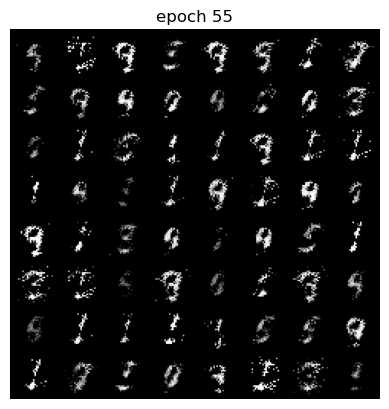

Epoch 55 of 100
Generator loss: 3.13703227, Discriminator loss: 0.72428620


  2%|▊                                            | 2/117 [00:00<00:07, 14.52it/s]

tensor(0.7838, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)
tensor(0.6981, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.64it/s]

tensor(0.7015, grad_fn=<AddBackward0>)
tensor(0.7156, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.68it/s]

tensor(0.7048, grad_fn=<AddBackward0>)
tensor(0.6524, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.86it/s]

tensor(0.7004, grad_fn=<AddBackward0>)
tensor(0.6920, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.91it/s]

tensor(0.6591, grad_fn=<AddBackward0>)
tensor(0.6965, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.94it/s]

tensor(0.6608, grad_fn=<AddBackward0>)
tensor(0.6955, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.99it/s]

tensor(0.7217, grad_fn=<AddBackward0>)
tensor(0.7012, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.07it/s]

tensor(0.6909, grad_fn=<AddBackward0>)
tensor(0.6990, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.81it/s]

tensor(0.7070, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.69it/s]

tensor(0.7163, grad_fn=<AddBackward0>)
tensor(0.8088, grad_fn=<AddBackward0>)
tensor(0.7166, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.66it/s]

tensor(0.7683, grad_fn=<AddBackward0>)
tensor(0.7752, grad_fn=<AddBackward0>)
tensor(0.8245, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.85it/s]

tensor(0.8192, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.89it/s]

tensor(0.8105, grad_fn=<AddBackward0>)
tensor(0.8891, grad_fn=<AddBackward0>)
tensor(0.8628, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.92it/s]

tensor(0.8713, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.96it/s]

tensor(0.8515, grad_fn=<AddBackward0>)
tensor(0.8620, grad_fn=<AddBackward0>)
tensor(0.8406, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.99it/s]

tensor(0.8416, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.97it/s]

tensor(0.8851, grad_fn=<AddBackward0>)
tensor(0.8553, grad_fn=<AddBackward0>)
tensor(0.8701, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.03it/s]

tensor(0.8112, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.06it/s]

tensor(0.9030, grad_fn=<AddBackward0>)
tensor(0.9045, grad_fn=<AddBackward0>)
tensor(0.9059, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.10it/s]

tensor(0.8717, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.05it/s]

tensor(0.8845, grad_fn=<AddBackward0>)
tensor(0.9409, grad_fn=<AddBackward0>)
tensor(0.8742, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.17it/s]

tensor(0.8709, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.16it/s]

tensor(0.8871, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)
tensor(0.8815, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.18it/s]

tensor(0.9118, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.02it/s]

tensor(0.8635, grad_fn=<AddBackward0>)
tensor(0.8008, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.87it/s]

tensor(0.8933, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.63it/s]

tensor(0.8758, grad_fn=<AddBackward0>)
tensor(0.8911, grad_fn=<AddBackward0>)
tensor(0.8776, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.52it/s]

tensor(0.8399, grad_fn=<AddBackward0>)
tensor(0.8415, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.40it/s]

tensor(0.8531, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.45it/s]

tensor(0.8409, grad_fn=<AddBackward0>)
tensor(0.8072, grad_fn=<AddBackward0>)
tensor(0.8114, grad_fn=<AddBackward0>)
tensor(0.8107, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.61it/s]

tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.7789, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.80it/s]

tensor(0.7431, grad_fn=<AddBackward0>)
tensor(0.7726, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.89it/s]

tensor(0.7665, grad_fn=<AddBackward0>)
tensor(0.7175, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.97it/s]

tensor(0.7497, grad_fn=<AddBackward0>)
tensor(0.7722, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.99it/s]

tensor(0.7228, grad_fn=<AddBackward0>)
tensor(0.7256, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.02it/s]

tensor(0.6896, grad_fn=<AddBackward0>)
tensor(0.7411, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.07it/s]

tensor(0.7618, grad_fn=<AddBackward0>)
tensor(0.7756, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.07it/s]

tensor(0.7399, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.12it/s]

tensor(0.7701, grad_fn=<AddBackward0>)
tensor(0.8179, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.13it/s]

tensor(0.8455, grad_fn=<AddBackward0>)
tensor(0.8261, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.12it/s]

tensor(0.8222, grad_fn=<AddBackward0>)
tensor(0.8422, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.10it/s]

tensor(0.8613, grad_fn=<AddBackward0>)
tensor(0.8615, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.10it/s]

tensor(0.8389, grad_fn=<AddBackward0>)
tensor(0.8468, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.14it/s]

tensor(0.8254, grad_fn=<AddBackward0>)
tensor(0.8318, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.09it/s]

tensor(0.8014, grad_fn=<AddBackward0>)
tensor(0.8196, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.04it/s]

tensor(0.7631, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.04it/s]

tensor(0.7950, grad_fn=<AddBackward0>)
tensor(0.8067, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.06it/s]

tensor(0.7290, grad_fn=<AddBackward0>)
tensor(0.7429, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.06it/s]

tensor(0.7669, grad_fn=<AddBackward0>)
tensor(0.7775, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.00it/s]

tensor(0.7760, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.93it/s]

tensor(0.7194, grad_fn=<AddBackward0>)
tensor(0.7776, grad_fn=<AddBackward0>)
tensor(0.7448, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.00it/s]

tensor(0.7440, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.97it/s]

tensor(0.7566, grad_fn=<AddBackward0>)
tensor(0.7900, grad_fn=<AddBackward0>)
tensor(0.8218, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.06it/s]

tensor(0.8404, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.07it/s]

tensor(0.8459, grad_fn=<AddBackward0>)
tensor(0.8976, grad_fn=<AddBackward0>)
tensor(0.9382, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.98it/s]

tensor(0.9110, grad_fn=<AddBackward0>)
tensor(1.0401, grad_fn=<AddBackward0>)
tensor(0.9661, grad_fn=<AddBackward0>)
tensor(0.9904, grad_fn=<AddBackward0>)


118it [00:07, 15.02it/s]                                                          


tensor(1.0337, grad_fn=<AddBackward0>)
tensor(0.9682, grad_fn=<AddBackward0>)
Epoch 56 of 100
Generator loss: 2.93498540, Discriminator loss: 0.81499398


  2%|▊                                            | 2/117 [00:00<00:07, 15.12it/s]

tensor(1.0336, grad_fn=<AddBackward0>)
tensor(1.0697, grad_fn=<AddBackward0>)
tensor(0.9990, grad_fn=<AddBackward0>)
tensor(0.9427, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.07it/s]

tensor(0.8772, grad_fn=<AddBackward0>)
tensor(0.8750, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.04it/s]

tensor(0.9273, grad_fn=<AddBackward0>)
tensor(0.8194, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.00it/s]

tensor(0.7666, grad_fn=<AddBackward0>)
tensor(0.7603, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.03it/s]

tensor(0.7580, grad_fn=<AddBackward0>)
tensor(0.7115, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.12it/s]

tensor(0.7117, grad_fn=<AddBackward0>)
tensor(0.6993, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.11it/s]

tensor(0.6910, grad_fn=<AddBackward0>)
tensor(0.7178, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.07it/s]

tensor(0.7327, grad_fn=<AddBackward0>)
tensor(0.6929, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.00it/s]

tensor(0.6953, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.95it/s]

tensor(0.7081, grad_fn=<AddBackward0>)
tensor(0.7290, grad_fn=<AddBackward0>)
tensor(0.7284, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.04it/s]

tensor(0.7621, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.14it/s]

tensor(0.7856, grad_fn=<AddBackward0>)
tensor(0.7289, grad_fn=<AddBackward0>)
tensor(0.7885, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.13it/s]

tensor(0.7972, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.12it/s]

tensor(0.8141, grad_fn=<AddBackward0>)
tensor(0.7902, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.01it/s]

tensor(0.8882, grad_fn=<AddBackward0>)
tensor(0.8455, grad_fn=<AddBackward0>)
tensor(0.8988, grad_fn=<AddBackward0>)
tensor(0.7763, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.02it/s]

tensor(0.8279, grad_fn=<AddBackward0>)
tensor(0.7715, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)
tensor(0.7607, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.08it/s]

tensor(0.7706, grad_fn=<AddBackward0>)
tensor(0.7017, grad_fn=<AddBackward0>)
tensor(0.7890, grad_fn=<AddBackward0>)
tensor(0.6881, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.12it/s]

tensor(0.6721, grad_fn=<AddBackward0>)
tensor(0.7101, grad_fn=<AddBackward0>)
tensor(0.6825, grad_fn=<AddBackward0>)
tensor(0.6452, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.08it/s]

tensor(0.6670, grad_fn=<AddBackward0>)
tensor(0.6657, grad_fn=<AddBackward0>)
tensor(0.6812, grad_fn=<AddBackward0>)
tensor(0.6588, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.01it/s]

tensor(0.6591, grad_fn=<AddBackward0>)
tensor(0.6176, grad_fn=<AddBackward0>)
tensor(0.6267, grad_fn=<AddBackward0>)
tensor(0.6599, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.01it/s]

tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6685, grad_fn=<AddBackward0>)
tensor(0.6878, grad_fn=<AddBackward0>)
tensor(0.7186, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.00it/s]

tensor(0.7026, grad_fn=<AddBackward0>)
tensor(0.7089, grad_fn=<AddBackward0>)
tensor(0.6980, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.97it/s]

tensor(0.7574, grad_fn=<AddBackward0>)
tensor(0.7883, grad_fn=<AddBackward0>)
tensor(0.7662, grad_fn=<AddBackward0>)
tensor(0.7440, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.05it/s]

tensor(0.8154, grad_fn=<AddBackward0>)
tensor(0.7710, grad_fn=<AddBackward0>)
tensor(0.7420, grad_fn=<AddBackward0>)
tensor(0.7520, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.98it/s]

tensor(0.7462, grad_fn=<AddBackward0>)
tensor(0.8034, grad_fn=<AddBackward0>)
tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.8017, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.90it/s]

tensor(0.8480, grad_fn=<AddBackward0>)
tensor(0.8778, grad_fn=<AddBackward0>)
tensor(0.8800, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.80it/s]

tensor(0.8255, grad_fn=<AddBackward0>)
tensor(0.8406, grad_fn=<AddBackward0>)
tensor(0.7839, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.78it/s]

tensor(0.7912, grad_fn=<AddBackward0>)
tensor(0.7841, grad_fn=<AddBackward0>)
tensor(0.7751, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.76it/s]

tensor(0.7244, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.7637, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.89it/s]

tensor(0.6870, grad_fn=<AddBackward0>)
tensor(0.7086, grad_fn=<AddBackward0>)
tensor(0.6945, grad_fn=<AddBackward0>)
tensor(0.6677, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.91it/s]

tensor(0.6865, grad_fn=<AddBackward0>)
tensor(0.6559, grad_fn=<AddBackward0>)
tensor(0.6566, grad_fn=<AddBackward0>)
tensor(0.6721, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.02it/s]

tensor(0.6216, grad_fn=<AddBackward0>)
tensor(0.6411, grad_fn=<AddBackward0>)
tensor(0.6616, grad_fn=<AddBackward0>)
tensor(0.6236, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.09it/s]

tensor(0.6334, grad_fn=<AddBackward0>)
tensor(0.5954, grad_fn=<AddBackward0>)
tensor(0.6077, grad_fn=<AddBackward0>)
tensor(0.6383, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.05it/s]

tensor(0.5814, grad_fn=<AddBackward0>)
tensor(0.6286, grad_fn=<AddBackward0>)
tensor(0.5633, grad_fn=<AddBackward0>)
tensor(0.5817, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.12it/s]

tensor(0.5716, grad_fn=<AddBackward0>)
tensor(0.5281, grad_fn=<AddBackward0>)
tensor(0.5753, grad_fn=<AddBackward0>)
tensor(0.5764, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.02it/s]

tensor(0.5704, grad_fn=<AddBackward0>)
tensor(0.5902, grad_fn=<AddBackward0>)
tensor(0.5486, grad_fn=<AddBackward0>)
tensor(0.6507, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.96it/s]

tensor(0.6348, grad_fn=<AddBackward0>)
tensor(0.6060, grad_fn=<AddBackward0>)
tensor(0.6014, grad_fn=<AddBackward0>)


118it [00:07, 15.08it/s]                                                          


tensor(0.6741, grad_fn=<AddBackward0>)
tensor(0.6548, grad_fn=<AddBackward0>)
Epoch 57 of 100
Generator loss: 2.93822360, Discriminator loss: 0.73343581


  2%|▊                                            | 2/117 [00:00<00:07, 15.29it/s]

tensor(0.6095, grad_fn=<AddBackward0>)
tensor(0.6676, grad_fn=<AddBackward0>)
tensor(0.6334, grad_fn=<AddBackward0>)
tensor(0.6482, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.06it/s]

tensor(0.6673, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.89it/s]

tensor(0.6426, grad_fn=<AddBackward0>)
tensor(0.6354, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.83it/s]

tensor(0.6536, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.00it/s]

tensor(0.6300, grad_fn=<AddBackward0>)
tensor(0.6833, grad_fn=<AddBackward0>)
tensor(0.6284, grad_fn=<AddBackward0>)
tensor(0.6601, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.23it/s]

tensor(0.6597, grad_fn=<AddBackward0>)
tensor(0.6505, grad_fn=<AddBackward0>)
tensor(0.6357, grad_fn=<AddBackward0>)
tensor(0.6441, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.17it/s]

tensor(0.6649, grad_fn=<AddBackward0>)
tensor(0.6247, grad_fn=<AddBackward0>)
tensor(0.6743, grad_fn=<AddBackward0>)
tensor(0.6188, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.22it/s]

tensor(0.6153, grad_fn=<AddBackward0>)
tensor(0.6984, grad_fn=<AddBackward0>)
tensor(0.6530, grad_fn=<AddBackward0>)
tensor(0.6054, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.25it/s]

tensor(0.6902, grad_fn=<AddBackward0>)
tensor(0.6630, grad_fn=<AddBackward0>)
tensor(0.6241, grad_fn=<AddBackward0>)
tensor(0.6547, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.12it/s]

tensor(0.6602, grad_fn=<AddBackward0>)
tensor(0.6789, grad_fn=<AddBackward0>)
tensor(0.6471, grad_fn=<AddBackward0>)
tensor(0.6873, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.13it/s]

tensor(0.6761, grad_fn=<AddBackward0>)
tensor(0.6623, grad_fn=<AddBackward0>)
tensor(0.6314, grad_fn=<AddBackward0>)
tensor(0.6800, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.89it/s]

tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.6571, grad_fn=<AddBackward0>)
tensor(0.6956, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.89it/s]

tensor(0.6493, grad_fn=<AddBackward0>)
tensor(0.7072, grad_fn=<AddBackward0>)
tensor(0.6936, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.00it/s]

tensor(0.6475, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.99it/s]

tensor(0.6759, grad_fn=<AddBackward0>)
tensor(0.6478, grad_fn=<AddBackward0>)
tensor(0.6287, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.07it/s]

tensor(0.6571, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.08it/s]

tensor(0.6516, grad_fn=<AddBackward0>)
tensor(0.6653, grad_fn=<AddBackward0>)
tensor(0.6729, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.10it/s]

tensor(0.6707, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.07it/s]

tensor(0.7236, grad_fn=<AddBackward0>)
tensor(0.6818, grad_fn=<AddBackward0>)
tensor(0.6356, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.84it/s]

tensor(0.6862, grad_fn=<AddBackward0>)
tensor(0.6544, grad_fn=<AddBackward0>)
tensor(0.7373, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.68it/s]

tensor(0.6921, grad_fn=<AddBackward0>)
tensor(0.7266, grad_fn=<AddBackward0>)
tensor(0.7334, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:04, 13.49it/s]

tensor(0.6923, grad_fn=<AddBackward0>)
tensor(0.7062, grad_fn=<AddBackward0>)
tensor(0.6926, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.21it/s]

tensor(0.6871, grad_fn=<AddBackward0>)
tensor(0.6996, grad_fn=<AddBackward0>)
tensor(0.7013, grad_fn=<AddBackward0>)
tensor(0.6670, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.52it/s]

tensor(0.7083, grad_fn=<AddBackward0>)
tensor(0.6924, grad_fn=<AddBackward0>)
tensor(0.6506, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.61it/s]

tensor(0.6485, grad_fn=<AddBackward0>)
tensor(0.6884, grad_fn=<AddBackward0>)
tensor(0.6355, grad_fn=<AddBackward0>)
tensor(0.6367, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.88it/s]

tensor(0.6228, grad_fn=<AddBackward0>)
tensor(0.6123, grad_fn=<AddBackward0>)
tensor(0.6382, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.96it/s]

tensor(0.6342, grad_fn=<AddBackward0>)
tensor(0.6449, grad_fn=<AddBackward0>)
tensor(0.6335, grad_fn=<AddBackward0>)
tensor(0.6501, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.92it/s]

tensor(0.6779, grad_fn=<AddBackward0>)
tensor(0.6397, grad_fn=<AddBackward0>)
tensor(0.6518, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.89it/s]

tensor(0.6460, grad_fn=<AddBackward0>)
tensor(0.6815, grad_fn=<AddBackward0>)
tensor(0.7165, grad_fn=<AddBackward0>)
tensor(0.7495, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.92it/s]

tensor(0.7242, grad_fn=<AddBackward0>)
tensor(0.7325, grad_fn=<AddBackward0>)
tensor(0.6811, grad_fn=<AddBackward0>)
tensor(0.7689, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.99it/s]

tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.7624, grad_fn=<AddBackward0>)
tensor(0.7281, grad_fn=<AddBackward0>)
tensor(0.7913, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.02it/s]

tensor(0.7263, grad_fn=<AddBackward0>)
tensor(0.7613, grad_fn=<AddBackward0>)
tensor(0.7104, grad_fn=<AddBackward0>)
tensor(0.7358, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.18it/s]

tensor(0.7010, grad_fn=<AddBackward0>)
tensor(0.6742, grad_fn=<AddBackward0>)
tensor(0.7444, grad_fn=<AddBackward0>)
tensor(0.6831, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.13it/s]

tensor(0.7346, grad_fn=<AddBackward0>)
tensor(0.6488, grad_fn=<AddBackward0>)
tensor(0.6936, grad_fn=<AddBackward0>)
tensor(0.6683, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.99it/s]

tensor(0.7353, grad_fn=<AddBackward0>)
tensor(0.7116, grad_fn=<AddBackward0>)
tensor(0.6596, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.95it/s]

tensor(0.7069, grad_fn=<AddBackward0>)
tensor(0.7424, grad_fn=<AddBackward0>)
tensor(0.7122, grad_fn=<AddBackward0>)


118it [00:07, 14.97it/s]                                                          


tensor(0.7375, grad_fn=<AddBackward0>)
tensor(0.7492, grad_fn=<AddBackward0>)
tensor(0.7984, grad_fn=<AddBackward0>)
tensor(0.8188, grad_fn=<AddBackward0>)
Epoch 58 of 100
Generator loss: 3.34521437, Discriminator loss: 0.68632364


  2%|▊                                            | 2/117 [00:00<00:07, 15.12it/s]

tensor(0.7761, grad_fn=<AddBackward0>)
tensor(0.7947, grad_fn=<AddBackward0>)
tensor(0.8852, grad_fn=<AddBackward0>)
tensor(0.8335, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.95it/s]

tensor(0.8348, grad_fn=<AddBackward0>)
tensor(0.7964, grad_fn=<AddBackward0>)
tensor(0.7798, grad_fn=<AddBackward0>)
tensor(0.7664, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.07it/s]

tensor(0.7637, grad_fn=<AddBackward0>)
tensor(0.7254, grad_fn=<AddBackward0>)
tensor(0.6950, grad_fn=<AddBackward0>)
tensor(0.6787, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.00it/s]

tensor(0.7409, grad_fn=<AddBackward0>)
tensor(0.6805, grad_fn=<AddBackward0>)
tensor(0.6771, grad_fn=<AddBackward0>)
tensor(0.6853, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.04it/s]

tensor(0.6429, grad_fn=<AddBackward0>)
tensor(0.6176, grad_fn=<AddBackward0>)
tensor(0.6311, grad_fn=<AddBackward0>)
tensor(0.5878, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.08it/s]

tensor(0.6470, grad_fn=<AddBackward0>)
tensor(0.5997, grad_fn=<AddBackward0>)
tensor(0.6269, grad_fn=<AddBackward0>)
tensor(0.6527, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.05it/s]

tensor(0.6633, grad_fn=<AddBackward0>)
tensor(0.6749, grad_fn=<AddBackward0>)
tensor(0.7007, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.00it/s]

tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.8315, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.11it/s]

tensor(0.8037, grad_fn=<AddBackward0>)
tensor(0.8505, grad_fn=<AddBackward0>)
tensor(0.8459, grad_fn=<AddBackward0>)
tensor(0.8714, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.03it/s]

tensor(0.8545, grad_fn=<AddBackward0>)
tensor(0.7523, grad_fn=<AddBackward0>)
tensor(0.7827, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.05it/s]

tensor(0.7670, grad_fn=<AddBackward0>)
tensor(0.7161, grad_fn=<AddBackward0>)
tensor(0.6868, grad_fn=<AddBackward0>)
tensor(0.7235, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.04it/s]

tensor(0.7150, grad_fn=<AddBackward0>)
tensor(0.6463, grad_fn=<AddBackward0>)
tensor(0.5840, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.00it/s]

tensor(0.6384, grad_fn=<AddBackward0>)
tensor(0.5801, grad_fn=<AddBackward0>)
tensor(0.5658, grad_fn=<AddBackward0>)
tensor(0.5828, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.03it/s]

tensor(0.5813, grad_fn=<AddBackward0>)
tensor(0.5462, grad_fn=<AddBackward0>)
tensor(0.5500, grad_fn=<AddBackward0>)
tensor(0.5722, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.01it/s]

tensor(0.5503, grad_fn=<AddBackward0>)
tensor(0.6411, grad_fn=<AddBackward0>)
tensor(0.6479, grad_fn=<AddBackward0>)
tensor(0.6814, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.12it/s]

tensor(0.6738, grad_fn=<AddBackward0>)
tensor(0.7075, grad_fn=<AddBackward0>)
tensor(0.8100, grad_fn=<AddBackward0>)
tensor(0.8175, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.09it/s]

tensor(0.8779, grad_fn=<AddBackward0>)
tensor(0.8590, grad_fn=<AddBackward0>)
tensor(0.9207, grad_fn=<AddBackward0>)
tensor(0.8653, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.07it/s]

tensor(0.8722, grad_fn=<AddBackward0>)
tensor(0.9146, grad_fn=<AddBackward0>)
tensor(0.9645, grad_fn=<AddBackward0>)
tensor(0.9235, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.08it/s]

tensor(0.8612, grad_fn=<AddBackward0>)
tensor(0.8492, grad_fn=<AddBackward0>)
tensor(0.8490, grad_fn=<AddBackward0>)
tensor(0.7789, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.00it/s]

tensor(0.7417, grad_fn=<AddBackward0>)
tensor(0.7446, grad_fn=<AddBackward0>)
tensor(0.7680, grad_fn=<AddBackward0>)
tensor(0.7073, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.04it/s]

tensor(0.7344, grad_fn=<AddBackward0>)
tensor(0.6893, grad_fn=<AddBackward0>)
tensor(0.6851, grad_fn=<AddBackward0>)
tensor(0.6791, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.04it/s]

tensor(0.6896, grad_fn=<AddBackward0>)
tensor(0.7203, grad_fn=<AddBackward0>)
tensor(0.6948, grad_fn=<AddBackward0>)
tensor(0.7169, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.10it/s]

tensor(0.6748, grad_fn=<AddBackward0>)
tensor(0.6853, grad_fn=<AddBackward0>)
tensor(0.7553, grad_fn=<AddBackward0>)
tensor(0.7856, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.10it/s]

tensor(0.7984, grad_fn=<AddBackward0>)
tensor(0.7540, grad_fn=<AddBackward0>)
tensor(0.8026, grad_fn=<AddBackward0>)
tensor(0.8119, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.07it/s]

tensor(0.8047, grad_fn=<AddBackward0>)
tensor(0.8033, grad_fn=<AddBackward0>)
tensor(0.9083, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.10it/s]

tensor(0.8616, grad_fn=<AddBackward0>)
tensor(0.8694, grad_fn=<AddBackward0>)
tensor(0.9067, grad_fn=<AddBackward0>)
tensor(0.8590, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.06it/s]

tensor(0.8907, grad_fn=<AddBackward0>)
tensor(0.9360, grad_fn=<AddBackward0>)
tensor(0.8760, grad_fn=<AddBackward0>)
tensor(0.8624, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.04it/s]

tensor(0.8732, grad_fn=<AddBackward0>)
tensor(0.8691, grad_fn=<AddBackward0>)
tensor(0.8586, grad_fn=<AddBackward0>)
tensor(0.8151, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.04it/s]

tensor(0.7910, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.8022, grad_fn=<AddBackward0>)
tensor(0.8023, grad_fn=<AddBackward0>)


118it [00:07, 15.13it/s]                                                          


tensor(0.8090, grad_fn=<AddBackward0>)
tensor(0.8053, grad_fn=<AddBackward0>)
tensor(0.8278, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)
Epoch 59 of 100
Generator loss: 3.32841754, Discriminator loss: 0.76199460


  2%|▊                                            | 2/117 [00:00<00:07, 14.93it/s]

tensor(0.8598, grad_fn=<AddBackward0>)
tensor(0.8223, grad_fn=<AddBackward0>)
tensor(0.8471, grad_fn=<AddBackward0>)
tensor(0.8663, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.08it/s]

tensor(0.8776, grad_fn=<AddBackward0>)
tensor(0.8670, grad_fn=<AddBackward0>)
tensor(0.9286, grad_fn=<AddBackward0>)
tensor(0.8760, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.04it/s]

tensor(0.8572, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)
tensor(0.7894, grad_fn=<AddBackward0>)
tensor(0.7995, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.07it/s]

tensor(0.8166, grad_fn=<AddBackward0>)
tensor(0.7621, grad_fn=<AddBackward0>)
tensor(0.7374, grad_fn=<AddBackward0>)
tensor(0.7817, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.93it/s]

tensor(0.7465, grad_fn=<AddBackward0>)
tensor(0.7408, grad_fn=<AddBackward0>)
tensor(0.7566, grad_fn=<AddBackward0>)
tensor(0.7586, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.00it/s]

tensor(0.6639, grad_fn=<AddBackward0>)
tensor(0.7544, grad_fn=<AddBackward0>)
tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.7549, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.59it/s]

tensor(0.7490, grad_fn=<AddBackward0>)
tensor(0.7169, grad_fn=<AddBackward0>)
tensor(0.8461, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:06, 14.49it/s]

tensor(0.7943, grad_fn=<AddBackward0>)
tensor(0.7773, grad_fn=<AddBackward0>)
tensor(0.8756, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.56it/s]

tensor(0.8637, grad_fn=<AddBackward0>)
tensor(0.9249, grad_fn=<AddBackward0>)
tensor(0.8876, grad_fn=<AddBackward0>)
tensor(0.8831, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.78it/s]

tensor(0.9107, grad_fn=<AddBackward0>)
tensor(0.8652, grad_fn=<AddBackward0>)
tensor(0.8876, grad_fn=<AddBackward0>)
tensor(0.9103, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.92it/s]

tensor(0.8737, grad_fn=<AddBackward0>)
tensor(0.8482, grad_fn=<AddBackward0>)
tensor(0.8614, grad_fn=<AddBackward0>)
tensor(0.8330, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.98it/s]

tensor(0.8751, grad_fn=<AddBackward0>)
tensor(0.8207, grad_fn=<AddBackward0>)
tensor(0.8056, grad_fn=<AddBackward0>)
tensor(0.8063, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.56it/s]

tensor(0.7731, grad_fn=<AddBackward0>)
tensor(0.7618, grad_fn=<AddBackward0>)
tensor(0.7346, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.80it/s]

tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.6693, grad_fn=<AddBackward0>)
tensor(0.6948, grad_fn=<AddBackward0>)
tensor(0.7305, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.97it/s]

tensor(0.6779, grad_fn=<AddBackward0>)
tensor(0.6275, grad_fn=<AddBackward0>)
tensor(0.6932, grad_fn=<AddBackward0>)
tensor(0.6493, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.77it/s]

tensor(0.7009, grad_fn=<AddBackward0>)
tensor(0.6795, grad_fn=<AddBackward0>)
tensor(0.6905, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.69it/s]

tensor(0.6926, grad_fn=<AddBackward0>)
tensor(0.7222, grad_fn=<AddBackward0>)
tensor(0.6717, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.39it/s]

tensor(0.7259, grad_fn=<AddBackward0>)
tensor(0.7336, grad_fn=<AddBackward0>)
tensor(0.6945, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.28it/s]

tensor(0.7150, grad_fn=<AddBackward0>)
tensor(0.7268, grad_fn=<AddBackward0>)
tensor(0.7622, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.56it/s]

tensor(0.8231, grad_fn=<AddBackward0>)
tensor(0.8092, grad_fn=<AddBackward0>)
tensor(0.8639, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.68it/s]

tensor(0.7931, grad_fn=<AddBackward0>)
tensor(0.8333, grad_fn=<AddBackward0>)
tensor(0.8540, grad_fn=<AddBackward0>)
tensor(0.9546, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.82it/s]

tensor(0.9195, grad_fn=<AddBackward0>)
tensor(0.9071, grad_fn=<AddBackward0>)
tensor(0.8668, grad_fn=<AddBackward0>)
tensor(0.9237, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.91it/s]

tensor(0.9428, grad_fn=<AddBackward0>)
tensor(0.9515, grad_fn=<AddBackward0>)
tensor(0.8475, grad_fn=<AddBackward0>)
tensor(0.9864, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.96it/s]

tensor(0.8928, grad_fn=<AddBackward0>)
tensor(0.8220, grad_fn=<AddBackward0>)
tensor(0.8945, grad_fn=<AddBackward0>)
tensor(0.8156, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.00it/s]

tensor(0.8278, grad_fn=<AddBackward0>)
tensor(0.7608, grad_fn=<AddBackward0>)
tensor(0.7385, grad_fn=<AddBackward0>)
tensor(0.7529, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.94it/s]

tensor(0.6956, grad_fn=<AddBackward0>)
tensor(0.7337, grad_fn=<AddBackward0>)
tensor(0.6889, grad_fn=<AddBackward0>)
tensor(0.7111, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.95it/s]

tensor(0.7160, grad_fn=<AddBackward0>)
tensor(0.6724, grad_fn=<AddBackward0>)
tensor(0.6688, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.98it/s]

tensor(0.6813, grad_fn=<AddBackward0>)
tensor(0.6235, grad_fn=<AddBackward0>)
tensor(0.6476, grad_fn=<AddBackward0>)
tensor(0.6437, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.02it/s]

tensor(0.6378, grad_fn=<AddBackward0>)
tensor(0.6818, grad_fn=<AddBackward0>)
tensor(0.6872, grad_fn=<AddBackward0>)
tensor(0.6464, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.6619, grad_fn=<AddBackward0>)
tensor(0.6696, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)
tensor(0.6928, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.02it/s]

tensor(0.7417, grad_fn=<AddBackward0>)
tensor(0.6835, grad_fn=<AddBackward0>)
tensor(0.7604, grad_fn=<AddBackward0>)
tensor(0.7182, grad_fn=<AddBackward0>)


118it [00:07, 14.94it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8314, grad_fn=<AddBackward0>)
tensor(0.8229, grad_fn=<AddBackward0>)
tensor(0.7521, grad_fn=<AddBackward0>)


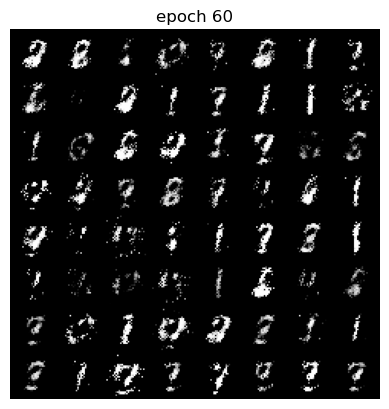

Epoch 60 of 100
Generator loss: 3.13458824, Discriminator loss: 0.78773558


  2%|▊                                            | 2/117 [00:00<00:07, 14.53it/s]

tensor(0.8522, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.8726, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.72it/s]

tensor(0.8165, grad_fn=<AddBackward0>)
tensor(0.9055, grad_fn=<AddBackward0>)
tensor(0.8739, grad_fn=<AddBackward0>)
tensor(0.8812, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.83it/s]

tensor(0.9079, grad_fn=<AddBackward0>)
tensor(0.8832, grad_fn=<AddBackward0>)
tensor(0.8880, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.81it/s]

tensor(0.9289, grad_fn=<AddBackward0>)
tensor(0.8506, grad_fn=<AddBackward0>)
tensor(0.8611, grad_fn=<AddBackward0>)
tensor(0.8956, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.90it/s]

tensor(0.9062, grad_fn=<AddBackward0>)
tensor(0.8690, grad_fn=<AddBackward0>)
tensor(0.9013, grad_fn=<AddBackward0>)
tensor(0.8213, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.99it/s]

tensor(0.8039, grad_fn=<AddBackward0>)
tensor(0.7945, grad_fn=<AddBackward0>)
tensor(0.8279, grad_fn=<AddBackward0>)
tensor(0.7272, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.07it/s]

tensor(0.7725, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)
tensor(0.7182, grad_fn=<AddBackward0>)
tensor(0.7481, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.08it/s]

tensor(0.7189, grad_fn=<AddBackward0>)
tensor(0.6834, grad_fn=<AddBackward0>)
tensor(0.6573, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.04it/s]

tensor(0.6333, grad_fn=<AddBackward0>)
tensor(0.6791, grad_fn=<AddBackward0>)
tensor(0.6636, grad_fn=<AddBackward0>)
tensor(0.5991, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.07it/s]

tensor(0.6705, grad_fn=<AddBackward0>)
tensor(0.5843, grad_fn=<AddBackward0>)
tensor(0.6595, grad_fn=<AddBackward0>)
tensor(0.6698, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.01it/s]

tensor(0.6863, grad_fn=<AddBackward0>)
tensor(0.6342, grad_fn=<AddBackward0>)
tensor(0.6622, grad_fn=<AddBackward0>)
tensor(0.6431, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.09it/s]

tensor(0.6864, grad_fn=<AddBackward0>)
tensor(0.6544, grad_fn=<AddBackward0>)
tensor(0.6998, grad_fn=<AddBackward0>)
tensor(0.6819, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.11it/s]

tensor(0.7151, grad_fn=<AddBackward0>)
tensor(0.6833, grad_fn=<AddBackward0>)
tensor(0.7445, grad_fn=<AddBackward0>)
tensor(0.7092, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.08it/s]

tensor(0.7223, grad_fn=<AddBackward0>)
tensor(0.7505, grad_fn=<AddBackward0>)
tensor(0.8111, grad_fn=<AddBackward0>)
tensor(0.8489, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.18it/s]

tensor(0.7967, grad_fn=<AddBackward0>)
tensor(0.8082, grad_fn=<AddBackward0>)
tensor(0.8223, grad_fn=<AddBackward0>)
tensor(0.8201, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.13it/s]

tensor(0.8656, grad_fn=<AddBackward0>)
tensor(0.8314, grad_fn=<AddBackward0>)
tensor(0.8444, grad_fn=<AddBackward0>)
tensor(0.8235, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.10it/s]

tensor(0.7519, grad_fn=<AddBackward0>)
tensor(0.7872, grad_fn=<AddBackward0>)
tensor(0.7645, grad_fn=<AddBackward0>)
tensor(0.7787, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.00it/s]

tensor(0.7189, grad_fn=<AddBackward0>)
tensor(0.7391, grad_fn=<AddBackward0>)
tensor(0.7009, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.02it/s]

tensor(0.7080, grad_fn=<AddBackward0>)
tensor(0.6558, grad_fn=<AddBackward0>)
tensor(0.7106, grad_fn=<AddBackward0>)
tensor(0.6770, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.02it/s]

tensor(0.6866, grad_fn=<AddBackward0>)
tensor(0.6884, grad_fn=<AddBackward0>)
tensor(0.6847, grad_fn=<AddBackward0>)
tensor(0.6862, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.96it/s]

tensor(0.6957, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6991, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.07it/s]

tensor(0.7527, grad_fn=<AddBackward0>)
tensor(0.6963, grad_fn=<AddBackward0>)
tensor(0.7072, grad_fn=<AddBackward0>)
tensor(0.7514, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.00it/s]

tensor(0.7373, grad_fn=<AddBackward0>)
tensor(0.8010, grad_fn=<AddBackward0>)
tensor(0.7797, grad_fn=<AddBackward0>)
tensor(0.7652, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.04it/s]

tensor(0.8165, grad_fn=<AddBackward0>)
tensor(0.7826, grad_fn=<AddBackward0>)
tensor(0.8132, grad_fn=<AddBackward0>)
tensor(0.8165, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.03it/s]

tensor(0.8695, grad_fn=<AddBackward0>)
tensor(0.8244, grad_fn=<AddBackward0>)
tensor(0.7982, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.01it/s]

tensor(0.7643, grad_fn=<AddBackward0>)
tensor(0.7253, grad_fn=<AddBackward0>)
tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.7327, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.99it/s]

tensor(0.6915, grad_fn=<AddBackward0>)
tensor(0.6880, grad_fn=<AddBackward0>)
tensor(0.6747, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.94it/s]

tensor(0.6518, grad_fn=<AddBackward0>)
tensor(0.6714, grad_fn=<AddBackward0>)
tensor(0.6360, grad_fn=<AddBackward0>)
tensor(0.6542, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.04it/s]

tensor(0.6360, grad_fn=<AddBackward0>)
tensor(0.6454, grad_fn=<AddBackward0>)
tensor(0.6391, grad_fn=<AddBackward0>)
tensor(0.6140, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.06it/s]

tensor(0.6039, grad_fn=<AddBackward0>)
tensor(0.6435, grad_fn=<AddBackward0>)
tensor(0.6454, grad_fn=<AddBackward0>)
tensor(0.6364, grad_fn=<AddBackward0>)


118it [00:07, 15.11it/s]                                                          


tensor(0.6273, grad_fn=<AddBackward0>)
tensor(0.6952, grad_fn=<AddBackward0>)
tensor(0.6852, grad_fn=<AddBackward0>)
tensor(0.6821, grad_fn=<AddBackward0>)
Epoch 61 of 100
Generator loss: 3.10217714, Discriminator loss: 0.74885553


  2%|▊                                            | 2/117 [00:00<00:07, 15.10it/s]

tensor(0.6594, grad_fn=<AddBackward0>)
tensor(0.6836, grad_fn=<AddBackward0>)
tensor(0.7198, grad_fn=<AddBackward0>)
tensor(0.7377, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.07it/s]

tensor(0.7282, grad_fn=<AddBackward0>)
tensor(0.7854, grad_fn=<AddBackward0>)
tensor(0.7656, grad_fn=<AddBackward0>)
tensor(0.7601, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.04it/s]

tensor(0.7848, grad_fn=<AddBackward0>)
tensor(0.8313, grad_fn=<AddBackward0>)
tensor(0.7873, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.00it/s]

tensor(0.7757, grad_fn=<AddBackward0>)
tensor(0.7625, grad_fn=<AddBackward0>)
tensor(0.7937, grad_fn=<AddBackward0>)
tensor(0.7979, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.02it/s]

tensor(0.8079, grad_fn=<AddBackward0>)
tensor(0.7299, grad_fn=<AddBackward0>)
tensor(0.7348, grad_fn=<AddBackward0>)
tensor(0.7499, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.98it/s]

tensor(0.8412, grad_fn=<AddBackward0>)
tensor(0.7203, grad_fn=<AddBackward0>)
tensor(0.7711, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.95it/s]

tensor(0.7549, grad_fn=<AddBackward0>)
tensor(0.7070, grad_fn=<AddBackward0>)
tensor(0.6808, grad_fn=<AddBackward0>)
tensor(0.7270, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.97it/s]

tensor(0.7341, grad_fn=<AddBackward0>)
tensor(0.7100, grad_fn=<AddBackward0>)
tensor(0.7335, grad_fn=<AddBackward0>)
tensor(0.7582, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.92it/s]

tensor(0.7273, grad_fn=<AddBackward0>)
tensor(0.7343, grad_fn=<AddBackward0>)
tensor(0.7448, grad_fn=<AddBackward0>)
tensor(0.7188, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.96it/s]

tensor(0.7684, grad_fn=<AddBackward0>)
tensor(0.7746, grad_fn=<AddBackward0>)
tensor(0.7731, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.91it/s]

tensor(0.7534, grad_fn=<AddBackward0>)
tensor(0.7740, grad_fn=<AddBackward0>)
tensor(0.7420, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.94it/s]

tensor(0.8258, grad_fn=<AddBackward0>)
tensor(0.7980, grad_fn=<AddBackward0>)
tensor(0.7989, grad_fn=<AddBackward0>)
tensor(0.7738, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.00it/s]

tensor(0.8358, grad_fn=<AddBackward0>)
tensor(0.7527, grad_fn=<AddBackward0>)
tensor(0.8271, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.97it/s]

tensor(0.7787, grad_fn=<AddBackward0>)
tensor(0.7972, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.7709, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.98it/s]

tensor(0.7518, grad_fn=<AddBackward0>)
tensor(0.7593, grad_fn=<AddBackward0>)
tensor(0.7407, grad_fn=<AddBackward0>)
tensor(0.6944, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.89it/s]

tensor(0.7208, grad_fn=<AddBackward0>)
tensor(0.7166, grad_fn=<AddBackward0>)
tensor(0.7045, grad_fn=<AddBackward0>)
tensor(0.8053, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.97it/s]

tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.7459, grad_fn=<AddBackward0>)
tensor(0.7358, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.64it/s]

tensor(0.6778, grad_fn=<AddBackward0>)
tensor(0.7301, grad_fn=<AddBackward0>)
tensor(0.7176, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.53it/s]

tensor(0.6694, grad_fn=<AddBackward0>)
tensor(0.7113, grad_fn=<AddBackward0>)
tensor(0.7202, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.51it/s]

tensor(0.7078, grad_fn=<AddBackward0>)
tensor(0.6949, grad_fn=<AddBackward0>)
tensor(0.7060, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.59it/s]

tensor(0.7323, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)
tensor(0.7782, grad_fn=<AddBackward0>)
tensor(0.7304, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.85it/s]

tensor(0.7623, grad_fn=<AddBackward0>)
tensor(0.7448, grad_fn=<AddBackward0>)
tensor(0.7543, grad_fn=<AddBackward0>)
tensor(0.7606, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.90it/s]

tensor(0.7669, grad_fn=<AddBackward0>)
tensor(0.7556, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.8045, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.96it/s]

tensor(0.7623, grad_fn=<AddBackward0>)
tensor(0.7632, grad_fn=<AddBackward0>)
tensor(0.7745, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.91it/s]

tensor(0.7141, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7244, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.96it/s]

tensor(0.7392, grad_fn=<AddBackward0>)
tensor(0.7448, grad_fn=<AddBackward0>)
tensor(0.7710, grad_fn=<AddBackward0>)
tensor(0.7492, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.95it/s]

tensor(0.7259, grad_fn=<AddBackward0>)
tensor(0.7062, grad_fn=<AddBackward0>)
tensor(0.6838, grad_fn=<AddBackward0>)
tensor(0.7176, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.93it/s]

tensor(0.7034, grad_fn=<AddBackward0>)
tensor(0.6666, grad_fn=<AddBackward0>)
tensor(0.6831, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.96it/s]

tensor(0.6601, grad_fn=<AddBackward0>)
tensor(0.7325, grad_fn=<AddBackward0>)
tensor(0.6391, grad_fn=<AddBackward0>)
tensor(0.6667, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.08it/s]

tensor(0.6165, grad_fn=<AddBackward0>)
tensor(0.6733, grad_fn=<AddBackward0>)
tensor(0.6613, grad_fn=<AddBackward0>)
tensor(0.6113, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.09it/s]

tensor(0.6560, grad_fn=<AddBackward0>)
tensor(0.6565, grad_fn=<AddBackward0>)
tensor(0.6576, grad_fn=<AddBackward0>)
tensor(0.6474, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.93it/s]

tensor(0.6439, grad_fn=<AddBackward0>)
tensor(0.6324, grad_fn=<AddBackward0>)
tensor(0.6132, grad_fn=<AddBackward0>)


118it [00:07, 15.01it/s]                                                          


tensor(0.6341, grad_fn=<AddBackward0>)
tensor(0.6381, grad_fn=<AddBackward0>)
Epoch 62 of 100
Generator loss: 3.22746944, Discriminator loss: 0.74106932


  2%|▊                                            | 2/117 [00:00<00:07, 15.19it/s]

tensor(0.6534, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)
tensor(0.7379, grad_fn=<AddBackward0>)
tensor(0.6891, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.13it/s]

tensor(0.7656, grad_fn=<AddBackward0>)
tensor(0.6767, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.14it/s]

tensor(0.7983, grad_fn=<AddBackward0>)
tensor(0.7686, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.98it/s]

tensor(0.7324, grad_fn=<AddBackward0>)
tensor(0.7568, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.05it/s]

tensor(0.7832, grad_fn=<AddBackward0>)
tensor(0.7100, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 15.00it/s]

tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.7104, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.02it/s]

tensor(0.7382, grad_fn=<AddBackward0>)
tensor(0.7362, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.02it/s]

tensor(0.7140, grad_fn=<AddBackward0>)
tensor(0.7406, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.01it/s]

tensor(0.6977, grad_fn=<AddBackward0>)
tensor(0.7187, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.03it/s]

tensor(0.6747, grad_fn=<AddBackward0>)
tensor(0.6697, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.97it/s]

tensor(0.6994, grad_fn=<AddBackward0>)
tensor(0.7032, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.95it/s]

tensor(0.6236, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.91it/s]

tensor(0.6839, grad_fn=<AddBackward0>)
tensor(0.6792, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.91it/s]

tensor(0.6445, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.92it/s]

tensor(0.7210, grad_fn=<AddBackward0>)
tensor(0.7065, grad_fn=<AddBackward0>)
tensor(0.6651, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.74it/s]

tensor(0.7032, grad_fn=<AddBackward0>)
tensor(0.7258, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.74it/s]

tensor(0.7299, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.81it/s]

tensor(0.6783, grad_fn=<AddBackward0>)
tensor(0.7219, grad_fn=<AddBackward0>)
tensor(0.7488, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.81it/s]

tensor(0.7695, grad_fn=<AddBackward0>)
tensor(0.7674, grad_fn=<AddBackward0>)
tensor(0.8371, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.79it/s]

tensor(0.7796, grad_fn=<AddBackward0>)
tensor(0.7883, grad_fn=<AddBackward0>)
tensor(0.8140, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.89it/s]

tensor(0.8229, grad_fn=<AddBackward0>)
tensor(0.7994, grad_fn=<AddBackward0>)
tensor(0.8136, grad_fn=<AddBackward0>)
tensor(0.8375, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.86it/s]

tensor(0.7636, grad_fn=<AddBackward0>)
tensor(0.8187, grad_fn=<AddBackward0>)
tensor(0.7942, grad_fn=<AddBackward0>)
tensor(0.7653, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.00it/s]

tensor(0.7577, grad_fn=<AddBackward0>)
tensor(0.7567, grad_fn=<AddBackward0>)
tensor(0.7406, grad_fn=<AddBackward0>)
tensor(0.7239, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.95it/s]

tensor(0.7060, grad_fn=<AddBackward0>)
tensor(0.6918, grad_fn=<AddBackward0>)
tensor(0.6742, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.94it/s]

tensor(0.6364, grad_fn=<AddBackward0>)
tensor(0.6386, grad_fn=<AddBackward0>)
tensor(0.6212, grad_fn=<AddBackward0>)
tensor(0.6476, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.95it/s]

tensor(0.6421, grad_fn=<AddBackward0>)
tensor(0.6792, grad_fn=<AddBackward0>)
tensor(0.6536, grad_fn=<AddBackward0>)
tensor(0.6201, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.01it/s]

tensor(0.7300, grad_fn=<AddBackward0>)
tensor(0.6866, grad_fn=<AddBackward0>)
tensor(0.7305, grad_fn=<AddBackward0>)
tensor(0.7383, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.05it/s]

tensor(0.7670, grad_fn=<AddBackward0>)
tensor(0.7847, grad_fn=<AddBackward0>)
tensor(0.8005, grad_fn=<AddBackward0>)
tensor(0.8076, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.96it/s]

tensor(0.7857, grad_fn=<AddBackward0>)
tensor(0.8519, grad_fn=<AddBackward0>)
tensor(0.7786, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.98it/s]

tensor(0.8584, grad_fn=<AddBackward0>)
tensor(0.8143, grad_fn=<AddBackward0>)
tensor(0.7717, grad_fn=<AddBackward0>)
tensor(0.8709, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.96it/s]

tensor(0.7090, grad_fn=<AddBackward0>)
tensor(0.7032, grad_fn=<AddBackward0>)
tensor(0.6246, grad_fn=<AddBackward0>)
tensor(0.6644, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.91it/s]

tensor(0.6150, grad_fn=<AddBackward0>)
tensor(0.6103, grad_fn=<AddBackward0>)
tensor(0.6119, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.86it/s]

tensor(0.6201, grad_fn=<AddBackward0>)
tensor(0.5813, grad_fn=<AddBackward0>)
tensor(0.5965, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.63it/s]

tensor(0.5742, grad_fn=<AddBackward0>)
tensor(0.6123, grad_fn=<AddBackward0>)
tensor(0.6168, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.78it/s]

tensor(0.6464, grad_fn=<AddBackward0>)
tensor(0.7038, grad_fn=<AddBackward0>)
tensor(0.6774, grad_fn=<AddBackward0>)
tensor(0.6761, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.89it/s]

tensor(0.7197, grad_fn=<AddBackward0>)
tensor(0.8618, grad_fn=<AddBackward0>)
tensor(0.8117, grad_fn=<AddBackward0>)
tensor(0.8791, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.91it/s]

tensor(0.8964, grad_fn=<AddBackward0>)
tensor(1.0263, grad_fn=<AddBackward0>)
tensor(0.9282, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.92it/s]

tensor(0.9746, grad_fn=<AddBackward0>)
tensor(0.8847, grad_fn=<AddBackward0>)
tensor(0.9428, grad_fn=<AddBackward0>)
tensor(0.8020, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.93it/s]

tensor(0.8650, grad_fn=<AddBackward0>)
tensor(0.8427, grad_fn=<AddBackward0>)
tensor(0.8116, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.90it/s]

tensor(0.8079, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7395, grad_fn=<AddBackward0>)
tensor(0.7209, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(0.7382, grad_fn=<AddBackward0>)
tensor(0.7035, grad_fn=<AddBackward0>)
Epoch 63 of 100
Generator loss: 3.27520394, Discriminator loss: 0.74432331


  2%|▊                                            | 2/117 [00:00<00:07, 15.06it/s]

tensor(0.7217, grad_fn=<AddBackward0>)
tensor(0.7352, grad_fn=<AddBackward0>)
tensor(0.7743, grad_fn=<AddBackward0>)
tensor(0.7565, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.94it/s]

tensor(0.7866, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.83it/s]

tensor(0.7813, grad_fn=<AddBackward0>)
tensor(0.8189, grad_fn=<AddBackward0>)
tensor(0.7945, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.02it/s]

tensor(0.7929, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.08it/s]

tensor(0.7838, grad_fn=<AddBackward0>)
tensor(0.8268, grad_fn=<AddBackward0>)
tensor(0.7825, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.18it/s]

tensor(0.8106, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.04it/s]

tensor(0.8248, grad_fn=<AddBackward0>)
tensor(0.7459, grad_fn=<AddBackward0>)
tensor(0.7684, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.01it/s]

tensor(0.7577, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.00it/s]

tensor(0.7151, grad_fn=<AddBackward0>)
tensor(0.6853, grad_fn=<AddBackward0>)
tensor(0.6948, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.98it/s]

tensor(0.6773, grad_fn=<AddBackward0>)
tensor(0.6621, grad_fn=<AddBackward0>)
tensor(0.6426, grad_fn=<AddBackward0>)
tensor(0.6305, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.96it/s]

tensor(0.6623, grad_fn=<AddBackward0>)
tensor(0.6388, grad_fn=<AddBackward0>)
tensor(0.6632, grad_fn=<AddBackward0>)
tensor(0.6928, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.02it/s]

tensor(0.6700, grad_fn=<AddBackward0>)
tensor(0.6899, grad_fn=<AddBackward0>)
tensor(0.6473, grad_fn=<AddBackward0>)
tensor(0.6343, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.96it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.7364, grad_fn=<AddBackward0>)
tensor(0.7469, grad_fn=<AddBackward0>)
tensor(0.6983, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.95it/s]

tensor(0.7612, grad_fn=<AddBackward0>)
tensor(0.7986, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.8004, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.99it/s]

tensor(0.8104, grad_fn=<AddBackward0>)
tensor(0.8535, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)
tensor(0.8392, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.00it/s]

tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.7829, grad_fn=<AddBackward0>)
tensor(0.7354, grad_fn=<AddBackward0>)
tensor(0.7853, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.17it/s]

tensor(0.7553, grad_fn=<AddBackward0>)
tensor(0.7245, grad_fn=<AddBackward0>)
tensor(0.6653, grad_fn=<AddBackward0>)
tensor(0.6814, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.14it/s]

tensor(0.6854, grad_fn=<AddBackward0>)
tensor(0.6622, grad_fn=<AddBackward0>)
tensor(0.6531, grad_fn=<AddBackward0>)
tensor(0.6498, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.03it/s]

tensor(0.6778, grad_fn=<AddBackward0>)
tensor(0.6482, grad_fn=<AddBackward0>)
tensor(0.6818, grad_fn=<AddBackward0>)
tensor(0.6528, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.02it/s]

tensor(0.6686, grad_fn=<AddBackward0>)
tensor(0.6527, grad_fn=<AddBackward0>)
tensor(0.6722, grad_fn=<AddBackward0>)
tensor(0.6899, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.01it/s]

tensor(0.7370, grad_fn=<AddBackward0>)
tensor(0.7495, grad_fn=<AddBackward0>)
tensor(0.6969, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.73it/s]

tensor(0.8019, grad_fn=<AddBackward0>)
tensor(0.8138, grad_fn=<AddBackward0>)
tensor(0.8165, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.67it/s]

tensor(0.8108, grad_fn=<AddBackward0>)
tensor(0.8967, grad_fn=<AddBackward0>)
tensor(0.8967, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.39it/s]

tensor(0.9643, grad_fn=<AddBackward0>)
tensor(0.9313, grad_fn=<AddBackward0>)
tensor(0.9388, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.60it/s]

tensor(0.9176, grad_fn=<AddBackward0>)
tensor(0.8310, grad_fn=<AddBackward0>)
tensor(0.8383, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.74it/s]

tensor(0.7691, grad_fn=<AddBackward0>)
tensor(0.6851, grad_fn=<AddBackward0>)
tensor(0.7010, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.83it/s]

tensor(0.6697, grad_fn=<AddBackward0>)
tensor(0.6167, grad_fn=<AddBackward0>)
tensor(0.6460, grad_fn=<AddBackward0>)
tensor(0.6261, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.00it/s]

tensor(0.5814, grad_fn=<AddBackward0>)
tensor(0.6101, grad_fn=<AddBackward0>)
tensor(0.6130, grad_fn=<AddBackward0>)
tensor(0.5519, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.99it/s]

tensor(0.5900, grad_fn=<AddBackward0>)
tensor(0.5426, grad_fn=<AddBackward0>)
tensor(0.5433, grad_fn=<AddBackward0>)
tensor(0.5443, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.5032, grad_fn=<AddBackward0>)
tensor(0.5384, grad_fn=<AddBackward0>)
tensor(0.5474, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.93it/s]

tensor(0.5256, grad_fn=<AddBackward0>)
tensor(0.5641, grad_fn=<AddBackward0>)
tensor(0.5996, grad_fn=<AddBackward0>)
tensor(0.6022, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.95it/s]

tensor(0.6532, grad_fn=<AddBackward0>)
tensor(0.6542, grad_fn=<AddBackward0>)
tensor(0.7022, grad_fn=<AddBackward0>)
tensor(0.7606, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.81it/s]

tensor(0.7618, grad_fn=<AddBackward0>)
tensor(0.7885, grad_fn=<AddBackward0>)
tensor(0.8248, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.58it/s]

tensor(0.8779, grad_fn=<AddBackward0>)
tensor(0.9301, grad_fn=<AddBackward0>)
tensor(0.9161, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.52it/s]

tensor(0.9228, grad_fn=<AddBackward0>)
tensor(0.9649, grad_fn=<AddBackward0>)
tensor(1.0079, grad_fn=<AddBackward0>)


118it [00:07, 14.98it/s]                                                          


tensor(1.0226, grad_fn=<AddBackward0>)
tensor(0.9698, grad_fn=<AddBackward0>)
tensor(0.9387, grad_fn=<AddBackward0>)
Epoch 64 of 100
Generator loss: 3.48858857, Discriminator loss: 0.74147755


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9367, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.83it/s]

tensor(0.9510, grad_fn=<AddBackward0>)
tensor(0.9025, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:09, 12.43it/s]

tensor(0.8814, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:08, 13.54it/s]

tensor(0.8182, grad_fn=<AddBackward0>)
tensor(0.8640, grad_fn=<AddBackward0>)
tensor(0.7929, grad_fn=<AddBackward0>)
tensor(0.7759, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.27it/s]

tensor(0.7873, grad_fn=<AddBackward0>)
tensor(0.7794, grad_fn=<AddBackward0>)
tensor(0.7039, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.50it/s]

tensor(0.7246, grad_fn=<AddBackward0>)
tensor(0.6719, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.73it/s]

tensor(0.6972, grad_fn=<AddBackward0>)
tensor(0.7239, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.85it/s]

tensor(0.6949, grad_fn=<AddBackward0>)
tensor(0.6716, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.92it/s]

tensor(0.7201, grad_fn=<AddBackward0>)
tensor(0.7379, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.89it/s]

tensor(0.7401, grad_fn=<AddBackward0>)
tensor(0.7527, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.99it/s]

tensor(0.7463, grad_fn=<AddBackward0>)
tensor(0.7342, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.05it/s]

tensor(0.7531, grad_fn=<AddBackward0>)
tensor(0.8203, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.06it/s]

tensor(0.8071, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.01it/s]

tensor(0.8074, grad_fn=<AddBackward0>)
tensor(0.9269, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.14it/s]

tensor(0.8629, grad_fn=<AddBackward0>)
tensor(0.8900, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.16it/s]

tensor(0.8937, grad_fn=<AddBackward0>)
tensor(0.9699, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.17it/s]

tensor(0.8912, grad_fn=<AddBackward0>)
tensor(0.8441, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.12it/s]

tensor(0.8646, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.13it/s]

tensor(0.8511, grad_fn=<AddBackward0>)
tensor(0.8227, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.13it/s]

tensor(0.8285, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.99it/s]

tensor(0.7758, grad_fn=<AddBackward0>)
tensor(0.7854, grad_fn=<AddBackward0>)
tensor(0.7918, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.04it/s]

tensor(0.7592, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.10it/s]

tensor(0.7780, grad_fn=<AddBackward0>)
tensor(0.7292, grad_fn=<AddBackward0>)
tensor(0.7260, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.10it/s]

tensor(0.7484, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.11it/s]

tensor(0.6991, grad_fn=<AddBackward0>)
tensor(0.7773, grad_fn=<AddBackward0>)
tensor(0.7060, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.12it/s]

tensor(0.7925, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.7929, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7787, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.07it/s]

tensor(0.7858, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.05it/s]

tensor(0.7978, grad_fn=<AddBackward0>)
tensor(0.7554, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.98it/s]

tensor(0.7072, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.95it/s]

tensor(0.7755, grad_fn=<AddBackward0>)
tensor(0.7890, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)
tensor(0.7298, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.05it/s]

tensor(0.7694, grad_fn=<AddBackward0>)
tensor(0.7436, grad_fn=<AddBackward0>)
tensor(0.7498, grad_fn=<AddBackward0>)
tensor(0.7588, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.11it/s]

tensor(0.7730, grad_fn=<AddBackward0>)
tensor(0.6963, grad_fn=<AddBackward0>)
tensor(0.7246, grad_fn=<AddBackward0>)
tensor(0.7796, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.15it/s]

tensor(0.7679, grad_fn=<AddBackward0>)
tensor(0.7365, grad_fn=<AddBackward0>)
tensor(0.7819, grad_fn=<AddBackward0>)
tensor(0.7933, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.12it/s]

tensor(0.7626, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.8456, grad_fn=<AddBackward0>)
tensor(0.8410, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.08it/s]

tensor(0.8816, grad_fn=<AddBackward0>)
tensor(0.8334, grad_fn=<AddBackward0>)
tensor(0.8673, grad_fn=<AddBackward0>)
tensor(0.8229, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.23it/s]

tensor(0.9017, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)
tensor(0.9401, grad_fn=<AddBackward0>)
tensor(0.9220, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.12it/s]

tensor(0.9067, grad_fn=<AddBackward0>)
tensor(0.9690, grad_fn=<AddBackward0>)
tensor(0.9254, grad_fn=<AddBackward0>)
tensor(0.9307, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.08it/s]

tensor(0.8774, grad_fn=<AddBackward0>)
tensor(0.9157, grad_fn=<AddBackward0>)
tensor(0.9021, grad_fn=<AddBackward0>)
tensor(0.8757, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.04it/s]

tensor(0.8834, grad_fn=<AddBackward0>)
tensor(0.8553, grad_fn=<AddBackward0>)
tensor(0.8882, grad_fn=<AddBackward0>)
tensor(0.8231, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.96it/s]

tensor(0.7974, grad_fn=<AddBackward0>)
tensor(0.7972, grad_fn=<AddBackward0>)
tensor(0.7557, grad_fn=<AddBackward0>)
tensor(0.7512, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.96it/s]

tensor(0.7261, grad_fn=<AddBackward0>)
tensor(0.7185, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.05it/s]

tensor(0.7303, grad_fn=<AddBackward0>)
tensor(0.6724, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.05it/s]

tensor(0.6753, grad_fn=<AddBackward0>)
tensor(0.6182, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.14it/s]

tensor(0.6540, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.90it/s]

tensor(0.6211, grad_fn=<AddBackward0>)
tensor(0.6239, grad_fn=<AddBackward0>)
tensor(0.6210, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.96it/s]

tensor(0.6519, grad_fn=<AddBackward0>)


118it [00:07, 15.05it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.6671, grad_fn=<AddBackward0>)
tensor(0.6837, grad_fn=<AddBackward0>)
tensor(0.6537, grad_fn=<AddBackward0>)


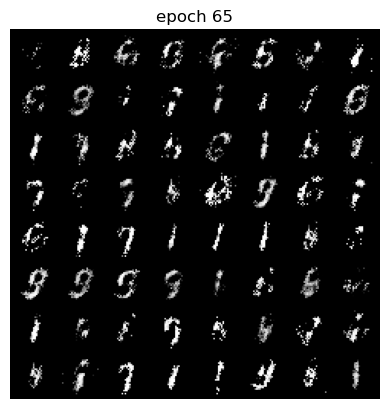

Epoch 65 of 100
Generator loss: 3.08551645, Discriminator loss: 0.79541981


  2%|▊                                            | 2/117 [00:00<00:08, 14.35it/s]

tensor(0.7232, grad_fn=<AddBackward0>)
tensor(0.7577, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.64it/s]

tensor(0.7514, grad_fn=<AddBackward0>)
tensor(0.7421, grad_fn=<AddBackward0>)
tensor(0.8445, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.75it/s]

tensor(0.7494, grad_fn=<AddBackward0>)
tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.8065, grad_fn=<AddBackward0>)
tensor(0.8019, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.89it/s]

tensor(0.8370, grad_fn=<AddBackward0>)
tensor(0.7737, grad_fn=<AddBackward0>)
tensor(0.7896, grad_fn=<AddBackward0>)
tensor(0.7658, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.96it/s]

tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.7674, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7042, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.00it/s]

tensor(0.7237, grad_fn=<AddBackward0>)
tensor(0.7015, grad_fn=<AddBackward0>)
tensor(0.6527, grad_fn=<AddBackward0>)
tensor(0.6402, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.06it/s]

tensor(0.6842, grad_fn=<AddBackward0>)
tensor(0.6912, grad_fn=<AddBackward0>)
tensor(0.6489, grad_fn=<AddBackward0>)
tensor(0.6448, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(0.6625, grad_fn=<AddBackward0>)
tensor(0.6319, grad_fn=<AddBackward0>)
tensor(0.6540, grad_fn=<AddBackward0>)
tensor(0.6158, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.03it/s]

tensor(0.6401, grad_fn=<AddBackward0>)
tensor(0.6671, grad_fn=<AddBackward0>)
tensor(0.6872, grad_fn=<AddBackward0>)
tensor(0.6765, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.13it/s]

tensor(0.6523, grad_fn=<AddBackward0>)
tensor(0.7482, grad_fn=<AddBackward0>)
tensor(0.7033, grad_fn=<AddBackward0>)
tensor(0.7122, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.09it/s]

tensor(0.7406, grad_fn=<AddBackward0>)
tensor(0.7200, grad_fn=<AddBackward0>)
tensor(0.7558, grad_fn=<AddBackward0>)
tensor(0.8100, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.05it/s]

tensor(0.8091, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.8962, grad_fn=<AddBackward0>)
tensor(0.8338, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.10it/s]

tensor(0.8542, grad_fn=<AddBackward0>)
tensor(0.8669, grad_fn=<AddBackward0>)
tensor(0.8768, grad_fn=<AddBackward0>)
tensor(0.8788, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.01it/s]

tensor(0.8729, grad_fn=<AddBackward0>)
tensor(0.8392, grad_fn=<AddBackward0>)
tensor(0.7761, grad_fn=<AddBackward0>)
tensor(0.8268, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.09it/s]

tensor(0.8380, grad_fn=<AddBackward0>)
tensor(0.7699, grad_fn=<AddBackward0>)
tensor(0.7938, grad_fn=<AddBackward0>)
tensor(0.7914, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.20it/s]

tensor(0.7215, grad_fn=<AddBackward0>)
tensor(0.7537, grad_fn=<AddBackward0>)
tensor(0.6903, grad_fn=<AddBackward0>)
tensor(0.7160, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.13it/s]

tensor(0.7340, grad_fn=<AddBackward0>)
tensor(0.6814, grad_fn=<AddBackward0>)
tensor(0.6433, grad_fn=<AddBackward0>)
tensor(0.6679, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.22it/s]

tensor(0.6525, grad_fn=<AddBackward0>)
tensor(0.6581, grad_fn=<AddBackward0>)
tensor(0.6104, grad_fn=<AddBackward0>)
tensor(0.6484, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.83it/s]

tensor(0.6268, grad_fn=<AddBackward0>)
tensor(0.6150, grad_fn=<AddBackward0>)
tensor(0.6195, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.57it/s]

tensor(0.5572, grad_fn=<AddBackward0>)
tensor(0.6512, grad_fn=<AddBackward0>)
tensor(0.6373, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.44it/s]

tensor(0.6226, grad_fn=<AddBackward0>)
tensor(0.6791, grad_fn=<AddBackward0>)
tensor(0.6427, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.63it/s]

tensor(0.6433, grad_fn=<AddBackward0>)
tensor(0.6939, grad_fn=<AddBackward0>)
tensor(0.6349, grad_fn=<AddBackward0>)
tensor(0.6843, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.93it/s]

tensor(0.6522, grad_fn=<AddBackward0>)
tensor(0.6925, grad_fn=<AddBackward0>)
tensor(0.6725, grad_fn=<AddBackward0>)
tensor(0.6467, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.97it/s]

tensor(0.7486, grad_fn=<AddBackward0>)
tensor(0.7953, grad_fn=<AddBackward0>)
tensor(0.7841, grad_fn=<AddBackward0>)
tensor(0.8570, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.92it/s]

tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.8110, grad_fn=<AddBackward0>)
tensor(0.8638, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.91it/s]

tensor(0.8559, grad_fn=<AddBackward0>)
tensor(0.8492, grad_fn=<AddBackward0>)
tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.8626, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.05it/s]

tensor(0.8987, grad_fn=<AddBackward0>)
tensor(0.8446, grad_fn=<AddBackward0>)
tensor(0.8698, grad_fn=<AddBackward0>)
tensor(0.8616, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.00it/s]

tensor(0.8017, grad_fn=<AddBackward0>)
tensor(0.7980, grad_fn=<AddBackward0>)
tensor(0.8002, grad_fn=<AddBackward0>)
tensor(0.7638, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.08it/s]

tensor(0.7849, grad_fn=<AddBackward0>)
tensor(0.7370, grad_fn=<AddBackward0>)
tensor(0.7486, grad_fn=<AddBackward0>)
tensor(0.7289, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.07it/s]

tensor(0.7144, grad_fn=<AddBackward0>)
tensor(0.6916, grad_fn=<AddBackward0>)
tensor(0.6643, grad_fn=<AddBackward0>)
tensor(0.6596, grad_fn=<AddBackward0>)


118it [00:07, 15.05it/s]                                                          


tensor(0.6569, grad_fn=<AddBackward0>)
tensor(0.6664, grad_fn=<AddBackward0>)
tensor(0.6652, grad_fn=<AddBackward0>)
tensor(0.7416, grad_fn=<AddBackward0>)
Epoch 66 of 100
Generator loss: 3.11000156, Discriminator loss: 0.74337572


  2%|▊                                            | 2/117 [00:00<00:07, 15.09it/s]

tensor(0.6831, grad_fn=<AddBackward0>)
tensor(0.7023, grad_fn=<AddBackward0>)
tensor(0.6493, grad_fn=<AddBackward0>)
tensor(0.7498, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.21it/s]

tensor(0.6936, grad_fn=<AddBackward0>)
tensor(0.7243, grad_fn=<AddBackward0>)
tensor(0.7782, grad_fn=<AddBackward0>)
tensor(0.8136, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.05it/s]

tensor(0.7989, grad_fn=<AddBackward0>)
tensor(0.8000, grad_fn=<AddBackward0>)
tensor(0.8111, grad_fn=<AddBackward0>)
tensor(0.8664, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.07it/s]

tensor(0.8820, grad_fn=<AddBackward0>)
tensor(0.9040, grad_fn=<AddBackward0>)
tensor(0.8624, grad_fn=<AddBackward0>)
tensor(0.9008, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.03it/s]

tensor(0.8520, grad_fn=<AddBackward0>)
tensor(0.8975, grad_fn=<AddBackward0>)
tensor(0.8816, grad_fn=<AddBackward0>)
tensor(0.8493, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.14it/s]

tensor(0.8537, grad_fn=<AddBackward0>)
tensor(0.8098, grad_fn=<AddBackward0>)
tensor(0.7974, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.19it/s]

tensor(0.7286, grad_fn=<AddBackward0>)
tensor(0.7549, grad_fn=<AddBackward0>)
tensor(0.7377, grad_fn=<AddBackward0>)
tensor(0.6959, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.08it/s]

tensor(0.6753, grad_fn=<AddBackward0>)
tensor(0.6615, grad_fn=<AddBackward0>)
tensor(0.6841, grad_fn=<AddBackward0>)
tensor(0.6254, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.08it/s]

tensor(0.6293, grad_fn=<AddBackward0>)
tensor(0.5904, grad_fn=<AddBackward0>)
tensor(0.5942, grad_fn=<AddBackward0>)
tensor(0.6524, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.07it/s]

tensor(0.6303, grad_fn=<AddBackward0>)
tensor(0.5978, grad_fn=<AddBackward0>)
tensor(0.6409, grad_fn=<AddBackward0>)
tensor(0.6236, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.08it/s]

tensor(0.6033, grad_fn=<AddBackward0>)
tensor(0.6562, grad_fn=<AddBackward0>)
tensor(0.6365, grad_fn=<AddBackward0>)
tensor(0.6441, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.06it/s]

tensor(0.6694, grad_fn=<AddBackward0>)
tensor(0.6792, grad_fn=<AddBackward0>)
tensor(0.6762, grad_fn=<AddBackward0>)
tensor(0.7193, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.07it/s]

tensor(0.6812, grad_fn=<AddBackward0>)
tensor(0.7899, grad_fn=<AddBackward0>)
tensor(0.8037, grad_fn=<AddBackward0>)
tensor(0.7782, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.13it/s]

tensor(0.7806, grad_fn=<AddBackward0>)
tensor(0.8333, grad_fn=<AddBackward0>)
tensor(0.8435, grad_fn=<AddBackward0>)
tensor(0.8385, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.15it/s]

tensor(0.8801, grad_fn=<AddBackward0>)
tensor(0.8030, grad_fn=<AddBackward0>)
tensor(0.7859, grad_fn=<AddBackward0>)
tensor(0.8385, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.10it/s]

tensor(0.7822, grad_fn=<AddBackward0>)
tensor(0.7857, grad_fn=<AddBackward0>)
tensor(0.7962, grad_fn=<AddBackward0>)
tensor(0.7332, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.17it/s]

tensor(0.7662, grad_fn=<AddBackward0>)
tensor(0.7231, grad_fn=<AddBackward0>)
tensor(0.7390, grad_fn=<AddBackward0>)
tensor(0.6818, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.08it/s]

tensor(0.6894, grad_fn=<AddBackward0>)
tensor(0.6989, grad_fn=<AddBackward0>)
tensor(0.6962, grad_fn=<AddBackward0>)
tensor(0.7332, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.16it/s]

tensor(0.7282, grad_fn=<AddBackward0>)
tensor(0.7252, grad_fn=<AddBackward0>)
tensor(0.7339, grad_fn=<AddBackward0>)
tensor(0.7412, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.16it/s]

tensor(0.7485, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)
tensor(0.7870, grad_fn=<AddBackward0>)
tensor(0.8018, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.12it/s]

tensor(0.8191, grad_fn=<AddBackward0>)
tensor(0.8211, grad_fn=<AddBackward0>)
tensor(0.8010, grad_fn=<AddBackward0>)
tensor(0.8820, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.16it/s]

tensor(0.8743, grad_fn=<AddBackward0>)
tensor(0.9173, grad_fn=<AddBackward0>)
tensor(0.9203, grad_fn=<AddBackward0>)
tensor(0.9147, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.12it/s]

tensor(0.9579, grad_fn=<AddBackward0>)
tensor(0.8656, grad_fn=<AddBackward0>)
tensor(0.9485, grad_fn=<AddBackward0>)
tensor(0.9181, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.13it/s]

tensor(0.9369, grad_fn=<AddBackward0>)
tensor(0.8919, grad_fn=<AddBackward0>)
tensor(0.8743, grad_fn=<AddBackward0>)
tensor(0.9016, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.13it/s]

tensor(0.8340, grad_fn=<AddBackward0>)
tensor(0.8170, grad_fn=<AddBackward0>)
tensor(0.7557, grad_fn=<AddBackward0>)
tensor(0.7754, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.12it/s]

tensor(0.7317, grad_fn=<AddBackward0>)
tensor(0.7158, grad_fn=<AddBackward0>)
tensor(0.7078, grad_fn=<AddBackward0>)
tensor(0.6608, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.10it/s]

tensor(0.6712, grad_fn=<AddBackward0>)
tensor(0.6625, grad_fn=<AddBackward0>)
tensor(0.6203, grad_fn=<AddBackward0>)
tensor(0.6152, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.07it/s]

tensor(0.6357, grad_fn=<AddBackward0>)
tensor(0.6508, grad_fn=<AddBackward0>)
tensor(0.6001, grad_fn=<AddBackward0>)
tensor(0.6354, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.05it/s]

tensor(0.6556, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.6813, grad_fn=<AddBackward0>)
tensor(0.6758, grad_fn=<AddBackward0>)


118it [00:07, 15.19it/s]                                                          


tensor(0.7096, grad_fn=<AddBackward0>)
tensor(0.6599, grad_fn=<AddBackward0>)
Epoch 67 of 100
Generator loss: 3.08036041, Discriminator loss: 0.76103753


  2%|▊                                            | 2/117 [00:00<00:07, 15.19it/s]

tensor(0.7646, grad_fn=<AddBackward0>)
tensor(0.7866, grad_fn=<AddBackward0>)
tensor(0.7966, grad_fn=<AddBackward0>)
tensor(0.8494, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.05it/s]

tensor(0.9015, grad_fn=<AddBackward0>)
tensor(0.8561, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.98it/s]

tensor(0.8983, grad_fn=<AddBackward0>)
tensor(0.8605, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.03it/s]

tensor(0.8039, grad_fn=<AddBackward0>)
tensor(0.8582, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.00it/s]

tensor(0.7987, grad_fn=<AddBackward0>)
tensor(0.8082, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.99it/s]

tensor(0.8020, grad_fn=<AddBackward0>)
tensor(0.8039, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.08it/s]

tensor(0.7169, grad_fn=<AddBackward0>)
tensor(0.7370, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.06it/s]

tensor(0.7121, grad_fn=<AddBackward0>)
tensor(0.6649, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.06it/s]

tensor(0.6999, grad_fn=<AddBackward0>)
tensor(0.6380, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.05it/s]

tensor(0.6494, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.92it/s]

tensor(0.6532, grad_fn=<AddBackward0>)
tensor(0.6375, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.91it/s]

tensor(0.6510, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.98it/s]

tensor(0.6021, grad_fn=<AddBackward0>)
tensor(0.6060, grad_fn=<AddBackward0>)
tensor(0.6144, grad_fn=<AddBackward0>)
tensor(0.5985, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.01it/s]

tensor(0.6104, grad_fn=<AddBackward0>)
tensor(0.6556, grad_fn=<AddBackward0>)
tensor(0.6125, grad_fn=<AddBackward0>)
tensor(0.6254, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.03it/s]

tensor(0.6463, grad_fn=<AddBackward0>)
tensor(0.6639, grad_fn=<AddBackward0>)
tensor(0.6137, grad_fn=<AddBackward0>)
tensor(0.6766, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.06it/s]

tensor(0.7069, grad_fn=<AddBackward0>)
tensor(0.6634, grad_fn=<AddBackward0>)
tensor(0.7473, grad_fn=<AddBackward0>)
tensor(0.7281, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.14it/s]

tensor(0.7662, grad_fn=<AddBackward0>)
tensor(0.8641, grad_fn=<AddBackward0>)
tensor(0.8389, grad_fn=<AddBackward0>)
tensor(0.8599, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.00it/s]

tensor(0.9160, grad_fn=<AddBackward0>)
tensor(0.9585, grad_fn=<AddBackward0>)
tensor(0.8901, grad_fn=<AddBackward0>)
tensor(0.9446, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.96it/s]

tensor(0.9193, grad_fn=<AddBackward0>)
tensor(0.8705, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.02it/s]

tensor(0.9480, grad_fn=<AddBackward0>)
tensor(0.8453, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.04it/s]

tensor(0.9184, grad_fn=<AddBackward0>)
tensor(0.8532, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.01it/s]

tensor(0.8674, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.02it/s]

tensor(0.8494, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.99it/s]

tensor(0.8249, grad_fn=<AddBackward0>)
tensor(0.7788, grad_fn=<AddBackward0>)
tensor(0.7815, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.02it/s]

tensor(0.7278, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.03it/s]

tensor(0.7504, grad_fn=<AddBackward0>)
tensor(0.7870, grad_fn=<AddBackward0>)
tensor(0.7246, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.04it/s]

tensor(0.7719, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.06it/s]

tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.6676, grad_fn=<AddBackward0>)
tensor(0.7728, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.07it/s]

tensor(0.7118, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.05it/s]

tensor(0.7283, grad_fn=<AddBackward0>)
tensor(0.7338, grad_fn=<AddBackward0>)
tensor(0.7641, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.17it/s]

tensor(0.7415, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.06it/s]

tensor(0.7354, grad_fn=<AddBackward0>)
tensor(0.7593, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.91it/s]

tensor(0.7769, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.87it/s]

tensor(0.8112, grad_fn=<AddBackward0>)
tensor(0.8498, grad_fn=<AddBackward0>)
tensor(0.7567, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.70it/s]

tensor(0.8472, grad_fn=<AddBackward0>)
tensor(0.8289, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.48it/s]

tensor(0.9277, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.34it/s]

tensor(0.9406, grad_fn=<AddBackward0>)
tensor(0.8999, grad_fn=<AddBackward0>)
tensor(0.8766, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.46it/s]

tensor(0.9086, grad_fn=<AddBackward0>)
tensor(0.9291, grad_fn=<AddBackward0>)
tensor(0.9252, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.58it/s]

tensor(0.8752, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.64it/s]

tensor(0.8728, grad_fn=<AddBackward0>)
tensor(0.8805, grad_fn=<AddBackward0>)
tensor(0.8258, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.79it/s]

tensor(0.8329, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.83it/s]

tensor(0.8102, grad_fn=<AddBackward0>)
tensor(0.7766, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.83it/s]

tensor(0.7264, grad_fn=<AddBackward0>)
tensor(0.7836, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.89it/s]

tensor(0.7603, grad_fn=<AddBackward0>)
tensor(0.6863, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.92it/s]

tensor(0.6709, grad_fn=<AddBackward0>)
tensor(0.7060, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.93it/s]

tensor(0.6613, grad_fn=<AddBackward0>)
tensor(0.6418, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.97it/s]

tensor(0.6615, grad_fn=<AddBackward0>)
tensor(0.6476, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.02it/s]

tensor(0.6493, grad_fn=<AddBackward0>)
tensor(0.6239, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.09it/s]

tensor(0.6561, grad_fn=<AddBackward0>)
tensor(0.6265, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.04it/s]

tensor(0.6359, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.02it/s]

tensor(0.6377, grad_fn=<AddBackward0>)
tensor(0.6775, grad_fn=<AddBackward0>)
tensor(0.6660, grad_fn=<AddBackward0>)
tensor(0.6533, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.96it/s]

tensor(0.6602, grad_fn=<AddBackward0>)
tensor(0.6728, grad_fn=<AddBackward0>)


118it [00:07, 15.03it/s]                                                          


tensor(0.6884, grad_fn=<AddBackward0>)
tensor(0.6891, grad_fn=<AddBackward0>)
Epoch 68 of 100
Generator loss: 2.91375804, Discriminator loss: 0.76715451


  2%|▊                                            | 2/117 [00:00<00:07, 15.22it/s]

tensor(0.7871, grad_fn=<AddBackward0>)
tensor(0.7411, grad_fn=<AddBackward0>)
tensor(0.7748, grad_fn=<AddBackward0>)
tensor(0.7386, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.12it/s]

tensor(0.7522, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.85it/s]

tensor(0.7802, grad_fn=<AddBackward0>)
tensor(0.8087, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.82it/s]

tensor(0.7776, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.89it/s]

tensor(0.7395, grad_fn=<AddBackward0>)
tensor(0.7593, grad_fn=<AddBackward0>)
tensor(0.7921, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.79it/s]

tensor(0.7475, grad_fn=<AddBackward0>)
tensor(0.7955, grad_fn=<AddBackward0>)
tensor(0.7778, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.82it/s]

tensor(0.7693, grad_fn=<AddBackward0>)
tensor(0.7732, grad_fn=<AddBackward0>)
tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.7711, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.89it/s]

tensor(0.7533, grad_fn=<AddBackward0>)
tensor(0.7419, grad_fn=<AddBackward0>)
tensor(0.7536, grad_fn=<AddBackward0>)
tensor(0.6907, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.06it/s]

tensor(0.7282, grad_fn=<AddBackward0>)
tensor(0.7291, grad_fn=<AddBackward0>)
tensor(0.7528, grad_fn=<AddBackward0>)
tensor(0.7816, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.14it/s]

tensor(0.7178, grad_fn=<AddBackward0>)
tensor(0.7404, grad_fn=<AddBackward0>)
tensor(0.7678, grad_fn=<AddBackward0>)
tensor(0.7223, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.05it/s]

tensor(0.7352, grad_fn=<AddBackward0>)
tensor(0.7369, grad_fn=<AddBackward0>)
tensor(0.7647, grad_fn=<AddBackward0>)
tensor(0.7685, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.93it/s]

tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7601, grad_fn=<AddBackward0>)
tensor(0.7259, grad_fn=<AddBackward0>)
tensor(0.7814, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.79it/s]

tensor(0.7666, grad_fn=<AddBackward0>)
tensor(0.7528, grad_fn=<AddBackward0>)
tensor(0.7909, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.84it/s]

tensor(0.7981, grad_fn=<AddBackward0>)
tensor(0.8100, grad_fn=<AddBackward0>)
tensor(0.8201, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.88it/s]

tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.8354, grad_fn=<AddBackward0>)
tensor(0.8500, grad_fn=<AddBackward0>)
tensor(0.8361, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.88it/s]

tensor(0.8489, grad_fn=<AddBackward0>)
tensor(0.7998, grad_fn=<AddBackward0>)
tensor(0.8827, grad_fn=<AddBackward0>)
tensor(0.8413, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.88it/s]

tensor(0.8039, grad_fn=<AddBackward0>)
tensor(0.8175, grad_fn=<AddBackward0>)
tensor(0.8109, grad_fn=<AddBackward0>)
tensor(0.8474, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.89it/s]

tensor(0.8007, grad_fn=<AddBackward0>)
tensor(0.8402, grad_fn=<AddBackward0>)
tensor(0.8303, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.90it/s]

tensor(0.8203, grad_fn=<AddBackward0>)
tensor(0.7912, grad_fn=<AddBackward0>)
tensor(0.7756, grad_fn=<AddBackward0>)
tensor(0.7750, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.92it/s]

tensor(0.7571, grad_fn=<AddBackward0>)
tensor(0.7617, grad_fn=<AddBackward0>)
tensor(0.7137, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.94it/s]

tensor(0.7073, grad_fn=<AddBackward0>)
tensor(0.7291, grad_fn=<AddBackward0>)
tensor(0.7708, grad_fn=<AddBackward0>)
tensor(0.6685, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.91it/s]

tensor(0.7312, grad_fn=<AddBackward0>)
tensor(0.7365, grad_fn=<AddBackward0>)
tensor(0.7312, grad_fn=<AddBackward0>)
tensor(0.7056, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.92it/s]

tensor(0.7143, grad_fn=<AddBackward0>)
tensor(0.7793, grad_fn=<AddBackward0>)
tensor(0.7624, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.90it/s]

tensor(0.7533, grad_fn=<AddBackward0>)
tensor(0.8150, grad_fn=<AddBackward0>)
tensor(0.7977, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.90it/s]

tensor(0.7833, grad_fn=<AddBackward0>)
tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.7345, grad_fn=<AddBackward0>)
tensor(0.7516, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.01it/s]

tensor(0.8125, grad_fn=<AddBackward0>)
tensor(0.7641, grad_fn=<AddBackward0>)
tensor(0.7793, grad_fn=<AddBackward0>)
tensor(0.7974, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.09it/s]

tensor(0.7209, grad_fn=<AddBackward0>)
tensor(0.8341, grad_fn=<AddBackward0>)
tensor(0.8064, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.99it/s]

tensor(0.7683, grad_fn=<AddBackward0>)
tensor(0.7573, grad_fn=<AddBackward0>)
tensor(0.7712, grad_fn=<AddBackward0>)
tensor(0.7762, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.96it/s]

tensor(0.7866, grad_fn=<AddBackward0>)
tensor(0.7562, grad_fn=<AddBackward0>)
tensor(0.8056, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.90it/s]

tensor(0.8367, grad_fn=<AddBackward0>)
tensor(0.7553, grad_fn=<AddBackward0>)
tensor(0.8335, grad_fn=<AddBackward0>)
tensor(0.8041, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.90it/s]

tensor(0.7468, grad_fn=<AddBackward0>)
tensor(0.7573, grad_fn=<AddBackward0>)
tensor(0.7826, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.93it/s]

tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.8254, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.8957, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.94it/s]

tensor(0.7608, grad_fn=<AddBackward0>)
tensor(0.8137, grad_fn=<AddBackward0>)
tensor(0.7677, grad_fn=<AddBackward0>)
tensor(0.8174, grad_fn=<AddBackward0>)


118it [00:07, 15.02it/s]                                                          


tensor(0.8275, grad_fn=<AddBackward0>)
tensor(0.8699, grad_fn=<AddBackward0>)
tensor(0.8237, grad_fn=<AddBackward0>)
tensor(0.8500, grad_fn=<AddBackward0>)
Epoch 69 of 100
Generator loss: 3.01034927, Discriminator loss: 0.78534579


  2%|▊                                            | 2/117 [00:00<00:07, 15.05it/s]

tensor(0.8711, grad_fn=<AddBackward0>)
tensor(0.7924, grad_fn=<AddBackward0>)
tensor(0.8113, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.91it/s]

tensor(0.8143, grad_fn=<AddBackward0>)
tensor(0.8453, grad_fn=<AddBackward0>)
tensor(0.8291, grad_fn=<AddBackward0>)
tensor(0.8427, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.03it/s]

tensor(0.8423, grad_fn=<AddBackward0>)
tensor(0.8302, grad_fn=<AddBackward0>)
tensor(0.8238, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.00it/s]

tensor(0.8148, grad_fn=<AddBackward0>)
tensor(0.8190, grad_fn=<AddBackward0>)
tensor(0.7943, grad_fn=<AddBackward0>)
tensor(0.8194, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.74it/s]

tensor(0.7585, grad_fn=<AddBackward0>)
tensor(0.7662, grad_fn=<AddBackward0>)
tensor(0.7329, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.82it/s]

tensor(0.7345, grad_fn=<AddBackward0>)
tensor(0.7816, grad_fn=<AddBackward0>)
tensor(0.7471, grad_fn=<AddBackward0>)
tensor(0.7427, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.94it/s]

tensor(0.8208, grad_fn=<AddBackward0>)
tensor(0.8011, grad_fn=<AddBackward0>)
tensor(0.8408, grad_fn=<AddBackward0>)
tensor(0.7698, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.05it/s]

tensor(0.7941, grad_fn=<AddBackward0>)
tensor(0.8735, grad_fn=<AddBackward0>)
tensor(0.8654, grad_fn=<AddBackward0>)
tensor(0.9000, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.11it/s]

tensor(0.8561, grad_fn=<AddBackward0>)
tensor(0.9003, grad_fn=<AddBackward0>)
tensor(0.9593, grad_fn=<AddBackward0>)
tensor(0.9434, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.02it/s]

tensor(0.9045, grad_fn=<AddBackward0>)
tensor(0.8791, grad_fn=<AddBackward0>)
tensor(0.9513, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.04it/s]

tensor(0.8005, grad_fn=<AddBackward0>)
tensor(0.8429, grad_fn=<AddBackward0>)
tensor(0.8451, grad_fn=<AddBackward0>)
tensor(0.8253, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.07it/s]

tensor(0.8487, grad_fn=<AddBackward0>)
tensor(0.8191, grad_fn=<AddBackward0>)
tensor(0.8106, grad_fn=<AddBackward0>)
tensor(0.7343, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.94it/s]

tensor(0.7321, grad_fn=<AddBackward0>)
tensor(0.7127, grad_fn=<AddBackward0>)
tensor(0.7315, grad_fn=<AddBackward0>)
tensor(0.7327, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.93it/s]

tensor(0.6599, grad_fn=<AddBackward0>)
tensor(0.6920, grad_fn=<AddBackward0>)
tensor(0.7111, grad_fn=<AddBackward0>)
tensor(0.6767, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.88it/s]

tensor(0.6687, grad_fn=<AddBackward0>)
tensor(0.6630, grad_fn=<AddBackward0>)
tensor(0.6575, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.93it/s]

tensor(0.6477, grad_fn=<AddBackward0>)
tensor(0.6856, grad_fn=<AddBackward0>)
tensor(0.6267, grad_fn=<AddBackward0>)
tensor(0.6525, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.94it/s]

tensor(0.6880, grad_fn=<AddBackward0>)
tensor(0.7220, grad_fn=<AddBackward0>)
tensor(0.6782, grad_fn=<AddBackward0>)
tensor(0.7366, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.93it/s]

tensor(0.7160, grad_fn=<AddBackward0>)
tensor(0.7629, grad_fn=<AddBackward0>)
tensor(0.7246, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.91it/s]

tensor(0.7563, grad_fn=<AddBackward0>)
tensor(0.8275, grad_fn=<AddBackward0>)
tensor(0.8166, grad_fn=<AddBackward0>)
tensor(0.8468, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.94it/s]

tensor(0.8716, grad_fn=<AddBackward0>)
tensor(0.8223, grad_fn=<AddBackward0>)
tensor(0.8715, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.95it/s]

tensor(0.8888, grad_fn=<AddBackward0>)
tensor(0.8854, grad_fn=<AddBackward0>)
tensor(0.9041, grad_fn=<AddBackward0>)
tensor(0.8787, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.81it/s]

tensor(0.9036, grad_fn=<AddBackward0>)
tensor(0.9111, grad_fn=<AddBackward0>)
tensor(0.9035, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.81it/s]

tensor(0.9290, grad_fn=<AddBackward0>)
tensor(0.9411, grad_fn=<AddBackward0>)
tensor(0.8805, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.53it/s]

tensor(0.9023, grad_fn=<AddBackward0>)
tensor(0.9316, grad_fn=<AddBackward0>)
tensor(0.8797, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.59it/s]

tensor(0.8369, grad_fn=<AddBackward0>)
tensor(0.9024, grad_fn=<AddBackward0>)
tensor(0.9428, grad_fn=<AddBackward0>)
tensor(0.7932, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.73it/s]

tensor(0.8348, grad_fn=<AddBackward0>)
tensor(0.7690, grad_fn=<AddBackward0>)
tensor(0.8394, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.84it/s]

tensor(0.7601, grad_fn=<AddBackward0>)
tensor(0.7818, grad_fn=<AddBackward0>)
tensor(0.7385, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.87it/s]

tensor(0.7205, grad_fn=<AddBackward0>)
tensor(0.7030, grad_fn=<AddBackward0>)
tensor(0.6930, grad_fn=<AddBackward0>)
tensor(0.6981, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.91it/s]

tensor(0.7089, grad_fn=<AddBackward0>)
tensor(0.6631, grad_fn=<AddBackward0>)
tensor(0.6930, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.89it/s]

tensor(0.6999, grad_fn=<AddBackward0>)
tensor(0.6745, grad_fn=<AddBackward0>)
tensor(0.6649, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.91it/s]

tensor(0.7251, grad_fn=<AddBackward0>)
tensor(0.7189, grad_fn=<AddBackward0>)
tensor(0.7323, grad_fn=<AddBackward0>)
tensor(0.6995, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.90it/s]

tensor(0.8214, grad_fn=<AddBackward0>)
tensor(0.8057, grad_fn=<AddBackward0>)
tensor(0.8827, grad_fn=<AddBackward0>)
tensor(0.8941, grad_fn=<AddBackward0>)


118it [00:07, 14.99it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9624, grad_fn=<AddBackward0>)
tensor(0.9230, grad_fn=<AddBackward0>)


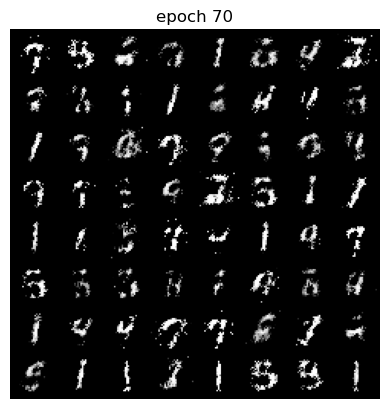

Epoch 70 of 100
Generator loss: 2.93036819, Discriminator loss: 0.80467105


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9682, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:08, 14.35it/s]

tensor(1.0462, grad_fn=<AddBackward0>)
tensor(1.0443, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.36it/s]

tensor(1.0259, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.60it/s]

tensor(1.0075, grad_fn=<AddBackward0>)
tensor(1.0353, grad_fn=<AddBackward0>)
tensor(1.0091, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.47it/s]

tensor(0.9349, grad_fn=<AddBackward0>)
tensor(0.9734, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.55it/s]

tensor(0.8834, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.63it/s]

tensor(0.8424, grad_fn=<AddBackward0>)
tensor(0.7955, grad_fn=<AddBackward0>)
tensor(0.8301, grad_fn=<AddBackward0>)
tensor(0.7648, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.77it/s]

tensor(0.7140, grad_fn=<AddBackward0>)
tensor(0.6540, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.86it/s]

tensor(0.6605, grad_fn=<AddBackward0>)
tensor(0.6368, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.94it/s]

tensor(0.6207, grad_fn=<AddBackward0>)
tensor(0.5882, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.96it/s]

tensor(0.6004, grad_fn=<AddBackward0>)
tensor(0.5947, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.96it/s]

tensor(0.6196, grad_fn=<AddBackward0>)
tensor(0.5655, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.99it/s]

tensor(0.6056, grad_fn=<AddBackward0>)
tensor(0.5730, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.95it/s]

tensor(0.6237, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.96it/s]

tensor(0.6188, grad_fn=<AddBackward0>)
tensor(0.6492, grad_fn=<AddBackward0>)
tensor(0.7218, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.04it/s]

tensor(0.7316, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.11it/s]

tensor(0.8188, grad_fn=<AddBackward0>)
tensor(0.8426, grad_fn=<AddBackward0>)
tensor(0.8701, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.94it/s]

tensor(0.8635, grad_fn=<AddBackward0>)
tensor(0.9731, grad_fn=<AddBackward0>)
tensor(0.9761, grad_fn=<AddBackward0>)
tensor(1.0424, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.97it/s]

tensor(1.0241, grad_fn=<AddBackward0>)
tensor(1.1211, grad_fn=<AddBackward0>)
tensor(1.0927, grad_fn=<AddBackward0>)
tensor(1.1004, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.02it/s]

tensor(1.0610, grad_fn=<AddBackward0>)
tensor(1.1458, grad_fn=<AddBackward0>)
tensor(1.0659, grad_fn=<AddBackward0>)
tensor(1.0135, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.02it/s]

tensor(0.9996, grad_fn=<AddBackward0>)
tensor(0.9704, grad_fn=<AddBackward0>)
tensor(0.9687, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.55it/s]

tensor(0.9671, grad_fn=<AddBackward0>)
tensor(0.8595, grad_fn=<AddBackward0>)
tensor(0.9269, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.59it/s]

tensor(0.8946, grad_fn=<AddBackward0>)
tensor(0.9003, grad_fn=<AddBackward0>)
tensor(0.8230, grad_fn=<AddBackward0>)
tensor(0.8499, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.83it/s]

tensor(0.8103, grad_fn=<AddBackward0>)
tensor(0.7726, grad_fn=<AddBackward0>)
tensor(0.7699, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.67it/s]

tensor(0.7257, grad_fn=<AddBackward0>)
tensor(0.7257, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 13.41it/s]

tensor(0.7415, grad_fn=<AddBackward0>)
tensor(0.7176, grad_fn=<AddBackward0>)
tensor(0.7285, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 13.93it/s]

tensor(0.7108, grad_fn=<AddBackward0>)
tensor(0.6717, grad_fn=<AddBackward0>)
tensor(0.7151, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.24it/s]

tensor(0.7400, grad_fn=<AddBackward0>)
tensor(0.8090, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.7811, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 14.48it/s]

tensor(0.7860, grad_fn=<AddBackward0>)
tensor(0.7484, grad_fn=<AddBackward0>)
tensor(0.7723, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.05it/s]

tensor(0.8305, grad_fn=<AddBackward0>)
tensor(0.8077, grad_fn=<AddBackward0>)
tensor(0.8143, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.01it/s]

tensor(0.8701, grad_fn=<AddBackward0>)
tensor(0.8270, grad_fn=<AddBackward0>)
tensor(0.8637, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 13.99it/s]

tensor(0.8650, grad_fn=<AddBackward0>)
tensor(0.8855, grad_fn=<AddBackward0>)
tensor(0.8731, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 13.99it/s]

tensor(0.8425, grad_fn=<AddBackward0>)
tensor(0.8587, grad_fn=<AddBackward0>)
tensor(0.8621, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.01it/s]

tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8232, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.19it/s]

tensor(0.8098, grad_fn=<AddBackward0>)
tensor(0.8604, grad_fn=<AddBackward0>)
tensor(0.8694, grad_fn=<AddBackward0>)
tensor(0.8276, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.50it/s]

tensor(0.8150, grad_fn=<AddBackward0>)
tensor(0.7919, grad_fn=<AddBackward0>)
tensor(0.8572, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.72it/s]

tensor(0.7713, grad_fn=<AddBackward0>)
tensor(0.7352, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)
tensor(0.7638, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 14.84it/s]

tensor(0.7443, grad_fn=<AddBackward0>)
tensor(0.7369, grad_fn=<AddBackward0>)
tensor(0.7534, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.88it/s]

tensor(0.7023, grad_fn=<AddBackward0>)
tensor(0.7546, grad_fn=<AddBackward0>)
tensor(0.7369, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.01it/s]

tensor(0.6911, grad_fn=<AddBackward0>)
tensor(0.6865, grad_fn=<AddBackward0>)
tensor(0.6905, grad_fn=<AddBackward0>)
tensor(0.7024, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.08it/s]

tensor(0.6910, grad_fn=<AddBackward0>)
tensor(0.7059, grad_fn=<AddBackward0>)
tensor(0.6804, grad_fn=<AddBackward0>)
tensor(0.7264, grad_fn=<AddBackward0>)


118it [00:08, 14.68it/s]                                                          


tensor(0.6990, grad_fn=<AddBackward0>)
tensor(0.6501, grad_fn=<AddBackward0>)
Epoch 71 of 100
Generator loss: 3.02375031, Discriminator loss: 0.82057315


  2%|▊                                            | 2/117 [00:00<00:07, 15.21it/s]

tensor(0.7152, grad_fn=<AddBackward0>)
tensor(0.6779, grad_fn=<AddBackward0>)
tensor(0.7682, grad_fn=<AddBackward0>)
tensor(0.7101, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.24it/s]

tensor(0.7337, grad_fn=<AddBackward0>)
tensor(0.7649, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.18it/s]

tensor(0.7571, grad_fn=<AddBackward0>)
tensor(0.7416, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.12it/s]

tensor(0.8117, grad_fn=<AddBackward0>)
tensor(0.7881, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.11it/s]

tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8353, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.05it/s]

tensor(0.8619, grad_fn=<AddBackward0>)
tensor(0.8615, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.08it/s]

tensor(0.8716, grad_fn=<AddBackward0>)
tensor(0.8799, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.11it/s]

tensor(0.8310, grad_fn=<AddBackward0>)
tensor(0.9082, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.15it/s]

tensor(0.9331, grad_fn=<AddBackward0>)
tensor(0.9296, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.16it/s]

tensor(0.8993, grad_fn=<AddBackward0>)
tensor(0.8766, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.11it/s]

tensor(0.8589, grad_fn=<AddBackward0>)
tensor(0.8818, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.14it/s]

tensor(0.8351, grad_fn=<AddBackward0>)
tensor(0.7868, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.18it/s]

tensor(0.7981, grad_fn=<AddBackward0>)
tensor(0.8395, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.10it/s]

tensor(0.7687, grad_fn=<AddBackward0>)
tensor(0.7544, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.08it/s]

tensor(0.7253, grad_fn=<AddBackward0>)
tensor(0.7406, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.17it/s]

tensor(0.6968, grad_fn=<AddBackward0>)
tensor(0.6845, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.10it/s]

tensor(0.6450, grad_fn=<AddBackward0>)
tensor(0.7008, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.14it/s]

tensor(0.6876, grad_fn=<AddBackward0>)
tensor(0.6396, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.12it/s]

tensor(0.6657, grad_fn=<AddBackward0>)
tensor(0.6607, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.16it/s]

tensor(0.6498, grad_fn=<AddBackward0>)
tensor(0.6820, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.22it/s]

tensor(0.6805, grad_fn=<AddBackward0>)
tensor(0.6610, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.18it/s]

tensor(0.6638, grad_fn=<AddBackward0>)
tensor(0.7054, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.18it/s]

tensor(0.6465, grad_fn=<AddBackward0>)
tensor(0.6769, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.10it/s]

tensor(0.6925, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.05it/s]

tensor(0.7033, grad_fn=<AddBackward0>)
tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.7534, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.03it/s]

tensor(0.7508, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.8163, grad_fn=<AddBackward0>)
tensor(0.7845, grad_fn=<AddBackward0>)
tensor(0.8331, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.10it/s]

tensor(0.8326, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.12it/s]

tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8529, grad_fn=<AddBackward0>)
tensor(0.8938, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.14it/s]

tensor(0.8991, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.20it/s]

tensor(0.8988, grad_fn=<AddBackward0>)
tensor(0.9551, grad_fn=<AddBackward0>)
tensor(0.8856, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.18it/s]

tensor(0.8822, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.07it/s]

tensor(0.9012, grad_fn=<AddBackward0>)
tensor(0.9327, grad_fn=<AddBackward0>)
tensor(0.9115, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.12it/s]

tensor(0.9571, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.11it/s]

tensor(0.9417, grad_fn=<AddBackward0>)
tensor(0.9068, grad_fn=<AddBackward0>)
tensor(0.9518, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.10it/s]

tensor(0.8825, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.07it/s]

tensor(0.8571, grad_fn=<AddBackward0>)
tensor(0.8381, grad_fn=<AddBackward0>)
tensor(0.8419, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.04it/s]

tensor(0.8222, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.03it/s]

tensor(0.8209, grad_fn=<AddBackward0>)
tensor(0.7901, grad_fn=<AddBackward0>)
tensor(0.8087, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.04it/s]

tensor(0.7488, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.01it/s]

tensor(0.7284, grad_fn=<AddBackward0>)
tensor(0.7208, grad_fn=<AddBackward0>)
tensor(0.7082, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.81it/s]

tensor(0.7050, grad_fn=<AddBackward0>)
tensor(0.6427, grad_fn=<AddBackward0>)
tensor(0.6689, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 14.62it/s]

tensor(0.6627, grad_fn=<AddBackward0>)
tensor(0.6331, grad_fn=<AddBackward0>)
tensor(0.7147, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.76it/s]

tensor(0.7213, grad_fn=<AddBackward0>)
tensor(0.6804, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6240, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.98it/s]

tensor(0.6448, grad_fn=<AddBackward0>)
tensor(0.6239, grad_fn=<AddBackward0>)
tensor(0.6406, grad_fn=<AddBackward0>)
tensor(0.6683, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.97it/s]

tensor(0.6512, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6676, grad_fn=<AddBackward0>)
tensor(0.7040, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.04it/s]

tensor(0.6592, grad_fn=<AddBackward0>)
tensor(0.6974, grad_fn=<AddBackward0>)
tensor(0.6731, grad_fn=<AddBackward0>)
tensor(0.7868, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.99it/s]

tensor(0.8075, grad_fn=<AddBackward0>)
tensor(0.7685, grad_fn=<AddBackward0>)
tensor(0.8387, grad_fn=<AddBackward0>)
tensor(0.8063, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.01it/s]

tensor(0.8996, grad_fn=<AddBackward0>)
tensor(0.9264, grad_fn=<AddBackward0>)
tensor(0.9259, grad_fn=<AddBackward0>)
tensor(0.9412, grad_fn=<AddBackward0>)


118it [00:07, 15.14it/s]                                                          


tensor(0.9177, grad_fn=<AddBackward0>)
tensor(0.8870, grad_fn=<AddBackward0>)
tensor(0.9473, grad_fn=<AddBackward0>)
tensor(0.8859, grad_fn=<AddBackward0>)
Epoch 72 of 100
Generator loss: 2.98252010, Discriminator loss: 0.78809977


  2%|▊                                            | 2/117 [00:00<00:07, 15.27it/s]

tensor(0.9244, grad_fn=<AddBackward0>)
tensor(0.9431, grad_fn=<AddBackward0>)
tensor(0.8588, grad_fn=<AddBackward0>)
tensor(0.8707, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.18it/s]

tensor(0.8964, grad_fn=<AddBackward0>)
tensor(0.8671, grad_fn=<AddBackward0>)
tensor(0.8948, grad_fn=<AddBackward0>)
tensor(0.8256, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.18it/s]

tensor(0.7978, grad_fn=<AddBackward0>)
tensor(0.7698, grad_fn=<AddBackward0>)
tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.7330, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.16it/s]

tensor(0.7476, grad_fn=<AddBackward0>)
tensor(0.7030, grad_fn=<AddBackward0>)
tensor(0.7567, grad_fn=<AddBackward0>)
tensor(0.6819, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.14it/s]

tensor(0.6749, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6706, grad_fn=<AddBackward0>)
tensor(0.6838, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.13it/s]

tensor(0.6334, grad_fn=<AddBackward0>)
tensor(0.6583, grad_fn=<AddBackward0>)
tensor(0.6438, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.09it/s]

tensor(0.6592, grad_fn=<AddBackward0>)
tensor(0.6152, grad_fn=<AddBackward0>)
tensor(0.6550, grad_fn=<AddBackward0>)
tensor(0.6311, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.15it/s]

tensor(0.6549, grad_fn=<AddBackward0>)
tensor(0.6469, grad_fn=<AddBackward0>)
tensor(0.7012, grad_fn=<AddBackward0>)
tensor(0.6731, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.17it/s]

tensor(0.6584, grad_fn=<AddBackward0>)
tensor(0.6653, grad_fn=<AddBackward0>)
tensor(0.7334, grad_fn=<AddBackward0>)
tensor(0.7463, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.17it/s]

tensor(0.7195, grad_fn=<AddBackward0>)
tensor(0.7812, grad_fn=<AddBackward0>)
tensor(0.7681, grad_fn=<AddBackward0>)
tensor(0.7918, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.24it/s]

tensor(0.8202, grad_fn=<AddBackward0>)
tensor(0.8936, grad_fn=<AddBackward0>)
tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.19it/s]

tensor(0.8578, grad_fn=<AddBackward0>)
tensor(0.8992, grad_fn=<AddBackward0>)
tensor(0.8744, grad_fn=<AddBackward0>)
tensor(0.8373, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.14it/s]

tensor(0.8496, grad_fn=<AddBackward0>)
tensor(0.8466, grad_fn=<AddBackward0>)
tensor(0.8864, grad_fn=<AddBackward0>)
tensor(0.8420, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.11it/s]

tensor(0.8035, grad_fn=<AddBackward0>)
tensor(0.8383, grad_fn=<AddBackward0>)
tensor(0.8467, grad_fn=<AddBackward0>)
tensor(0.8580, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.02it/s]

tensor(0.8272, grad_fn=<AddBackward0>)
tensor(0.7954, grad_fn=<AddBackward0>)
tensor(0.8018, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.00it/s]

tensor(0.7727, grad_fn=<AddBackward0>)
tensor(0.7633, grad_fn=<AddBackward0>)
tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.7255, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.00it/s]

tensor(0.7299, grad_fn=<AddBackward0>)
tensor(0.7168, grad_fn=<AddBackward0>)
tensor(0.7048, grad_fn=<AddBackward0>)
tensor(0.7214, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.01it/s]

tensor(0.7129, grad_fn=<AddBackward0>)
tensor(0.7468, grad_fn=<AddBackward0>)
tensor(0.7098, grad_fn=<AddBackward0>)
tensor(0.6540, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.06it/s]

tensor(0.6876, grad_fn=<AddBackward0>)
tensor(0.6762, grad_fn=<AddBackward0>)
tensor(0.6884, grad_fn=<AddBackward0>)
tensor(0.6970, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.10it/s]

tensor(0.6724, grad_fn=<AddBackward0>)
tensor(0.6644, grad_fn=<AddBackward0>)
tensor(0.7003, grad_fn=<AddBackward0>)
tensor(0.7061, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.17it/s]

tensor(0.6870, grad_fn=<AddBackward0>)
tensor(0.7339, grad_fn=<AddBackward0>)
tensor(0.6962, grad_fn=<AddBackward0>)
tensor(0.7078, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.20it/s]

tensor(0.7548, grad_fn=<AddBackward0>)
tensor(0.7439, grad_fn=<AddBackward0>)
tensor(0.7521, grad_fn=<AddBackward0>)
tensor(0.7708, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.08it/s]

tensor(0.7278, grad_fn=<AddBackward0>)
tensor(0.7264, grad_fn=<AddBackward0>)
tensor(0.8055, grad_fn=<AddBackward0>)
tensor(0.7922, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.00it/s]

tensor(0.7216, grad_fn=<AddBackward0>)
tensor(0.8126, grad_fn=<AddBackward0>)
tensor(0.8168, grad_fn=<AddBackward0>)
tensor(0.8681, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.10it/s]

tensor(0.8086, grad_fn=<AddBackward0>)
tensor(0.8375, grad_fn=<AddBackward0>)
tensor(0.8536, grad_fn=<AddBackward0>)
tensor(0.8408, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.10it/s]

tensor(0.8202, grad_fn=<AddBackward0>)
tensor(0.8592, grad_fn=<AddBackward0>)
tensor(0.7454, grad_fn=<AddBackward0>)
tensor(0.7879, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.11it/s]

tensor(0.7581, grad_fn=<AddBackward0>)
tensor(0.7955, grad_fn=<AddBackward0>)
tensor(0.7520, grad_fn=<AddBackward0>)
tensor(0.7126, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.85it/s]

tensor(0.7422, grad_fn=<AddBackward0>)
tensor(0.7518, grad_fn=<AddBackward0>)
tensor(0.7237, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.67it/s]

tensor(0.7350, grad_fn=<AddBackward0>)
tensor(0.6962, grad_fn=<AddBackward0>)
tensor(0.7771, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.68it/s]

tensor(0.7440, grad_fn=<AddBackward0>)
tensor(0.7205, grad_fn=<AddBackward0>)
tensor(0.7004, grad_fn=<AddBackward0>)


118it [00:07, 15.14it/s]                                                          


tensor(0.7200, grad_fn=<AddBackward0>)
tensor(0.6751, grad_fn=<AddBackward0>)
tensor(0.7418, grad_fn=<AddBackward0>)
Epoch 73 of 100
Generator loss: 2.82438779, Discriminator loss: 0.76480943


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.7378, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.96it/s]

tensor(0.6803, grad_fn=<AddBackward0>)
tensor(0.6976, grad_fn=<AddBackward0>)
tensor(0.6752, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.05it/s]

tensor(0.7090, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.17it/s]

tensor(0.7533, grad_fn=<AddBackward0>)
tensor(0.7038, grad_fn=<AddBackward0>)
tensor(0.7361, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.10it/s]

tensor(0.7411, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.06it/s]

tensor(0.7481, grad_fn=<AddBackward0>)
tensor(0.7544, grad_fn=<AddBackward0>)
tensor(0.7272, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.10it/s]

tensor(0.7540, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.11it/s]

tensor(0.7312, grad_fn=<AddBackward0>)
tensor(0.7696, grad_fn=<AddBackward0>)
tensor(0.6998, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.15it/s]

tensor(0.7472, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.19it/s]

tensor(0.7250, grad_fn=<AddBackward0>)
tensor(0.7129, grad_fn=<AddBackward0>)
tensor(0.7846, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.17it/s]

tensor(0.7291, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.19it/s]

tensor(0.7725, grad_fn=<AddBackward0>)
tensor(0.7309, grad_fn=<AddBackward0>)
tensor(0.7502, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.15it/s]

tensor(0.8138, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.17it/s]

tensor(0.7254, grad_fn=<AddBackward0>)
tensor(0.7757, grad_fn=<AddBackward0>)
tensor(0.7774, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.15it/s]

tensor(0.7853, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.19it/s]

tensor(0.7967, grad_fn=<AddBackward0>)
tensor(0.8036, grad_fn=<AddBackward0>)
tensor(0.8161, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.26it/s]

tensor(0.8317, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.22it/s]

tensor(0.8063, grad_fn=<AddBackward0>)
tensor(0.8438, grad_fn=<AddBackward0>)
tensor(0.8174, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.24it/s]

tensor(0.8318, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.24it/s]

tensor(0.8883, grad_fn=<AddBackward0>)
tensor(0.8373, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.18it/s]

tensor(0.8509, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.19it/s]

tensor(0.7752, grad_fn=<AddBackward0>)
tensor(0.8049, grad_fn=<AddBackward0>)
tensor(0.7526, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.05it/s]

tensor(0.7670, grad_fn=<AddBackward0>)
tensor(0.7510, grad_fn=<AddBackward0>)
tensor(0.7482, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.06it/s]

tensor(0.7643, grad_fn=<AddBackward0>)
tensor(0.7154, grad_fn=<AddBackward0>)
tensor(0.7182, grad_fn=<AddBackward0>)
tensor(0.7242, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.04it/s]

tensor(0.6817, grad_fn=<AddBackward0>)
tensor(0.7591, grad_fn=<AddBackward0>)
tensor(0.7046, grad_fn=<AddBackward0>)
tensor(0.7406, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.18it/s]

tensor(0.7083, grad_fn=<AddBackward0>)
tensor(0.7481, grad_fn=<AddBackward0>)
tensor(0.7572, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.22it/s]

tensor(0.7573, grad_fn=<AddBackward0>)
tensor(0.7534, grad_fn=<AddBackward0>)
tensor(0.8474, grad_fn=<AddBackward0>)
tensor(0.7617, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.23it/s]

tensor(0.8411, grad_fn=<AddBackward0>)
tensor(0.7818, grad_fn=<AddBackward0>)
tensor(0.7974, grad_fn=<AddBackward0>)
tensor(0.8391, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.28it/s]

tensor(0.8437, grad_fn=<AddBackward0>)
tensor(0.8624, grad_fn=<AddBackward0>)
tensor(0.8535, grad_fn=<AddBackward0>)
tensor(0.8096, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.28it/s]

tensor(0.9111, grad_fn=<AddBackward0>)
tensor(0.8208, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)
tensor(0.8172, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.20it/s]

tensor(0.7770, grad_fn=<AddBackward0>)
tensor(0.8094, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7415, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.21it/s]

tensor(0.7512, grad_fn=<AddBackward0>)
tensor(0.6553, grad_fn=<AddBackward0>)
tensor(0.7164, grad_fn=<AddBackward0>)
tensor(0.7047, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.12it/s]

tensor(0.6799, grad_fn=<AddBackward0>)
tensor(0.6490, grad_fn=<AddBackward0>)
tensor(0.6769, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 14.86it/s]

tensor(0.6109, grad_fn=<AddBackward0>)
tensor(0.7263, grad_fn=<AddBackward0>)
tensor(0.6461, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.80it/s]

tensor(0.7199, grad_fn=<AddBackward0>)
tensor(0.6394, grad_fn=<AddBackward0>)
tensor(0.7063, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.70it/s]

tensor(0.6764, grad_fn=<AddBackward0>)
tensor(0.6427, grad_fn=<AddBackward0>)
tensor(0.7026, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.76it/s]

tensor(0.7185, grad_fn=<AddBackward0>)
tensor(0.7109, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7178, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.98it/s]

tensor(0.7851, grad_fn=<AddBackward0>)
tensor(0.7825, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7971, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.09it/s]

tensor(0.8394, grad_fn=<AddBackward0>)
tensor(0.8858, grad_fn=<AddBackward0>)
tensor(0.8258, grad_fn=<AddBackward0>)
tensor(0.8801, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.12it/s]

tensor(0.8740, grad_fn=<AddBackward0>)
tensor(0.9492, grad_fn=<AddBackward0>)
tensor(0.9668, grad_fn=<AddBackward0>)
tensor(0.8966, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.04it/s]

tensor(0.9283, grad_fn=<AddBackward0>)
tensor(0.8952, grad_fn=<AddBackward0>)
tensor(0.8654, grad_fn=<AddBackward0>)
tensor(0.8799, grad_fn=<AddBackward0>)


118it [00:07, 15.19it/s]                                                          


tensor(0.8456, grad_fn=<AddBackward0>)
tensor(0.8697, grad_fn=<AddBackward0>)
Epoch 74 of 100
Generator loss: 2.91063309, Discriminator loss: 0.77850461


  2%|▊                                            | 2/117 [00:00<00:07, 15.26it/s]

tensor(0.8319, grad_fn=<AddBackward0>)
tensor(0.8355, grad_fn=<AddBackward0>)
tensor(0.8243, grad_fn=<AddBackward0>)
tensor(0.7768, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.28it/s]

tensor(0.7875, grad_fn=<AddBackward0>)
tensor(0.7243, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.35it/s]

tensor(0.7361, grad_fn=<AddBackward0>)
tensor(0.7247, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.21it/s]

tensor(0.7486, grad_fn=<AddBackward0>)
tensor(0.7310, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.20it/s]

tensor(0.7215, grad_fn=<AddBackward0>)
tensor(0.7100, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.01it/s]

tensor(0.7031, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.84it/s]

tensor(0.7209, grad_fn=<AddBackward0>)
tensor(0.6882, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.73it/s]

tensor(0.6840, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.75it/s]

tensor(0.6856, grad_fn=<AddBackward0>)
tensor(0.7094, grad_fn=<AddBackward0>)
tensor(0.7431, grad_fn=<AddBackward0>)
tensor(0.7696, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.83it/s]

tensor(0.7685, grad_fn=<AddBackward0>)
tensor(0.7736, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.91it/s]

tensor(0.7819, grad_fn=<AddBackward0>)
tensor(0.8761, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.96it/s]

tensor(0.8632, grad_fn=<AddBackward0>)
tensor(0.8397, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.95it/s]

tensor(0.8993, grad_fn=<AddBackward0>)
tensor(0.8464, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.01it/s]

tensor(0.9076, grad_fn=<AddBackward0>)
tensor(0.8794, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.08it/s]

tensor(0.9029, grad_fn=<AddBackward0>)
tensor(0.8457, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.11it/s]

tensor(0.9019, grad_fn=<AddBackward0>)
tensor(0.9402, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.23it/s]

tensor(0.8887, grad_fn=<AddBackward0>)
tensor(0.8674, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.25it/s]

tensor(0.8785, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.07it/s]

tensor(0.8622, grad_fn=<AddBackward0>)
tensor(0.8112, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.15it/s]

tensor(0.8254, grad_fn=<AddBackward0>)
tensor(0.7996, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.11it/s]

tensor(0.8267, grad_fn=<AddBackward0>)
tensor(0.8320, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.08it/s]

tensor(0.7867, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.11it/s]

tensor(0.8040, grad_fn=<AddBackward0>)
tensor(0.7673, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.00it/s]

tensor(0.7501, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.05it/s]

tensor(0.7519, grad_fn=<AddBackward0>)
tensor(0.7451, grad_fn=<AddBackward0>)
tensor(0.7167, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.06it/s]

tensor(0.7277, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.6915, grad_fn=<AddBackward0>)
tensor(0.7128, grad_fn=<AddBackward0>)
tensor(0.7289, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.16it/s]

tensor(0.7104, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.21it/s]

tensor(0.7155, grad_fn=<AddBackward0>)
tensor(0.7413, grad_fn=<AddBackward0>)
tensor(0.6803, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.16it/s]

tensor(0.7140, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.12it/s]

tensor(0.7007, grad_fn=<AddBackward0>)
tensor(0.7030, grad_fn=<AddBackward0>)
tensor(0.7323, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.18it/s]

tensor(0.7049, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.17it/s]

tensor(0.7571, grad_fn=<AddBackward0>)
tensor(0.7287, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.95it/s]

tensor(0.7627, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.98it/s]

tensor(0.7387, grad_fn=<AddBackward0>)
tensor(0.7454, grad_fn=<AddBackward0>)
tensor(0.7767, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.02it/s]

tensor(0.7718, grad_fn=<AddBackward0>)
tensor(0.7516, grad_fn=<AddBackward0>)
tensor(0.8194, grad_fn=<AddBackward0>)
tensor(0.8221, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.09it/s]

tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7869, grad_fn=<AddBackward0>)
tensor(0.8316, grad_fn=<AddBackward0>)
tensor(0.8066, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.12it/s]

tensor(0.8730, grad_fn=<AddBackward0>)
tensor(0.8537, grad_fn=<AddBackward0>)
tensor(0.8914, grad_fn=<AddBackward0>)
tensor(0.8991, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.06it/s]

tensor(0.9205, grad_fn=<AddBackward0>)
tensor(0.9025, grad_fn=<AddBackward0>)
tensor(0.9117, grad_fn=<AddBackward0>)
tensor(0.9816, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.13it/s]

tensor(0.9478, grad_fn=<AddBackward0>)
tensor(0.9683, grad_fn=<AddBackward0>)
tensor(0.9632, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.30it/s]

tensor(0.9314, grad_fn=<AddBackward0>)
tensor(0.9489, grad_fn=<AddBackward0>)
tensor(0.8965, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.58it/s]

tensor(0.9085, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.72it/s]

tensor(0.8907, grad_fn=<AddBackward0>)
tensor(0.8459, grad_fn=<AddBackward0>)
tensor(0.8565, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.84it/s]

tensor(0.8293, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.95it/s]

tensor(0.7533, grad_fn=<AddBackward0>)
tensor(0.8335, grad_fn=<AddBackward0>)
tensor(0.7570, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.95it/s]

tensor(0.7551, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.99it/s]

tensor(0.7749, grad_fn=<AddBackward0>)
tensor(0.7620, grad_fn=<AddBackward0>)
tensor(0.7437, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.01it/s]

tensor(0.7381, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.04it/s]

tensor(0.7083, grad_fn=<AddBackward0>)
tensor(0.8032, grad_fn=<AddBackward0>)
tensor(0.7587, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.10it/s]

tensor(0.7892, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.12it/s]

tensor(0.7766, grad_fn=<AddBackward0>)
tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.8383, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.16it/s]

tensor(0.8309, grad_fn=<AddBackward0>)


118it [00:07, 15.10it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.8680, grad_fn=<AddBackward0>)
tensor(0.8968, grad_fn=<AddBackward0>)
tensor(0.9012, grad_fn=<AddBackward0>)


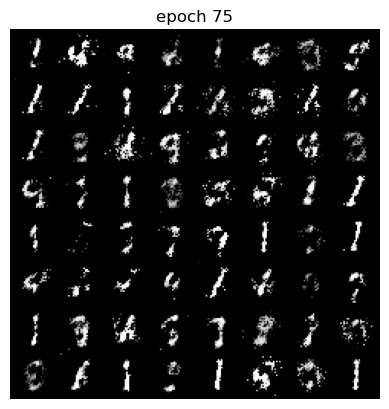

Epoch 75 of 100
Generator loss: 2.70119429, Discriminator loss: 0.80970997


  2%|▊                                            | 2/117 [00:00<00:07, 14.67it/s]

tensor(0.8843, grad_fn=<AddBackward0>)
tensor(0.9529, grad_fn=<AddBackward0>)
tensor(0.9673, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.91it/s]

tensor(0.9900, grad_fn=<AddBackward0>)
tensor(0.9749, grad_fn=<AddBackward0>)
tensor(0.9750, grad_fn=<AddBackward0>)
tensor(0.8996, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.08it/s]

tensor(0.9054, grad_fn=<AddBackward0>)
tensor(0.8705, grad_fn=<AddBackward0>)
tensor(0.8448, grad_fn=<AddBackward0>)
tensor(0.8319, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.00it/s]

tensor(0.7945, grad_fn=<AddBackward0>)
tensor(0.7578, grad_fn=<AddBackward0>)
tensor(0.8070, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.97it/s]

tensor(0.7698, grad_fn=<AddBackward0>)
tensor(0.7251, grad_fn=<AddBackward0>)
tensor(0.7592, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.94it/s]

tensor(0.7359, grad_fn=<AddBackward0>)
tensor(0.7028, grad_fn=<AddBackward0>)
tensor(0.6953, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.91it/s]

tensor(0.7273, grad_fn=<AddBackward0>)
tensor(0.7200, grad_fn=<AddBackward0>)
tensor(0.7582, grad_fn=<AddBackward0>)
tensor(0.7425, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7567, grad_fn=<AddBackward0>)
tensor(0.7808, grad_fn=<AddBackward0>)
tensor(0.8799, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.08it/s]

tensor(0.9008, grad_fn=<AddBackward0>)
tensor(0.9126, grad_fn=<AddBackward0>)
tensor(0.9022, grad_fn=<AddBackward0>)
tensor(1.0389, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.09it/s]

tensor(0.9991, grad_fn=<AddBackward0>)
tensor(1.0060, grad_fn=<AddBackward0>)
tensor(1.0435, grad_fn=<AddBackward0>)
tensor(0.9844, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.03it/s]

tensor(1.0357, grad_fn=<AddBackward0>)
tensor(1.0441, grad_fn=<AddBackward0>)
tensor(0.9508, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.99it/s]

tensor(0.9535, grad_fn=<AddBackward0>)
tensor(0.9899, grad_fn=<AddBackward0>)
tensor(0.9872, grad_fn=<AddBackward0>)
tensor(0.9552, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.98it/s]

tensor(0.9194, grad_fn=<AddBackward0>)
tensor(0.9371, grad_fn=<AddBackward0>)
tensor(0.8193, grad_fn=<AddBackward0>)
tensor(0.8410, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.03it/s]

tensor(0.8270, grad_fn=<AddBackward0>)
tensor(0.8217, grad_fn=<AddBackward0>)
tensor(0.8359, grad_fn=<AddBackward0>)
tensor(0.8853, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.04it/s]

tensor(0.8451, grad_fn=<AddBackward0>)
tensor(0.8508, grad_fn=<AddBackward0>)
tensor(0.8260, grad_fn=<AddBackward0>)
tensor(0.8010, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.06it/s]

tensor(0.7724, grad_fn=<AddBackward0>)
tensor(0.8393, grad_fn=<AddBackward0>)
tensor(0.8293, grad_fn=<AddBackward0>)
tensor(0.7519, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.08it/s]

tensor(0.8258, grad_fn=<AddBackward0>)
tensor(0.9319, grad_fn=<AddBackward0>)
tensor(0.8566, grad_fn=<AddBackward0>)
tensor(0.8331, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.10it/s]

tensor(0.8169, grad_fn=<AddBackward0>)
tensor(0.9021, grad_fn=<AddBackward0>)
tensor(0.8071, grad_fn=<AddBackward0>)
tensor(0.8745, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.19it/s]

tensor(0.8844, grad_fn=<AddBackward0>)
tensor(0.8675, grad_fn=<AddBackward0>)
tensor(0.8933, grad_fn=<AddBackward0>)
tensor(0.8797, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.08it/s]

tensor(0.9054, grad_fn=<AddBackward0>)
tensor(0.8709, grad_fn=<AddBackward0>)
tensor(0.8605, grad_fn=<AddBackward0>)
tensor(0.9229, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.12it/s]

tensor(0.8869, grad_fn=<AddBackward0>)
tensor(0.8818, grad_fn=<AddBackward0>)
tensor(0.8530, grad_fn=<AddBackward0>)
tensor(0.8510, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.17it/s]

tensor(0.8451, grad_fn=<AddBackward0>)
tensor(0.8933, grad_fn=<AddBackward0>)
tensor(0.8864, grad_fn=<AddBackward0>)
tensor(0.8543, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.07it/s]

tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.8421, grad_fn=<AddBackward0>)
tensor(0.8323, grad_fn=<AddBackward0>)
tensor(0.8565, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.08it/s]

tensor(0.8484, grad_fn=<AddBackward0>)
tensor(0.8187, grad_fn=<AddBackward0>)
tensor(0.8424, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.78it/s]

tensor(0.9017, grad_fn=<AddBackward0>)
tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.8381, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.66it/s]

tensor(0.8729, grad_fn=<AddBackward0>)
tensor(0.8505, grad_fn=<AddBackward0>)
tensor(0.9027, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.36it/s]

tensor(0.8468, grad_fn=<AddBackward0>)
tensor(0.8066, grad_fn=<AddBackward0>)
tensor(0.8286, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.59it/s]

tensor(0.8385, grad_fn=<AddBackward0>)
tensor(0.8316, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)
tensor(0.8363, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.87it/s]

tensor(0.7819, grad_fn=<AddBackward0>)
tensor(0.7932, grad_fn=<AddBackward0>)
tensor(0.8079, grad_fn=<AddBackward0>)
tensor(0.7698, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.97it/s]

tensor(0.7986, grad_fn=<AddBackward0>)
tensor(0.8214, grad_fn=<AddBackward0>)
tensor(0.8120, grad_fn=<AddBackward0>)
tensor(0.7881, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.10it/s]

tensor(0.7596, grad_fn=<AddBackward0>)
tensor(0.7750, grad_fn=<AddBackward0>)
tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.7781, grad_fn=<AddBackward0>)


118it [00:07, 15.08it/s]                                                          


tensor(0.7587, grad_fn=<AddBackward0>)
tensor(0.8728, grad_fn=<AddBackward0>)
Epoch 76 of 100
Generator loss: 2.67755389, Discriminator loss: 0.86098784


  2%|▊                                            | 2/117 [00:00<00:07, 15.34it/s]

tensor(0.7962, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.7487, grad_fn=<AddBackward0>)
tensor(0.7547, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.29it/s]

tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.7843, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.20it/s]

tensor(0.7924, grad_fn=<AddBackward0>)
tensor(0.8136, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.14it/s]

tensor(0.8045, grad_fn=<AddBackward0>)
tensor(0.8397, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.18it/s]

tensor(0.7951, grad_fn=<AddBackward0>)
tensor(0.8311, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.11it/s]

tensor(0.8531, grad_fn=<AddBackward0>)
tensor(0.8373, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.12it/s]

tensor(0.8877, grad_fn=<AddBackward0>)
tensor(0.8254, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.07it/s]

tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.7957, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.12it/s]

tensor(0.8193, grad_fn=<AddBackward0>)
tensor(0.8432, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.21it/s]

tensor(0.8086, grad_fn=<AddBackward0>)
tensor(0.7832, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.16it/s]

tensor(0.8538, grad_fn=<AddBackward0>)
tensor(0.7811, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.11it/s]

tensor(0.7865, grad_fn=<AddBackward0>)
tensor(0.7892, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.18it/s]

tensor(0.7741, grad_fn=<AddBackward0>)
tensor(0.7947, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.08it/s]

tensor(0.7455, grad_fn=<AddBackward0>)
tensor(0.7244, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.16it/s]

tensor(0.7293, grad_fn=<AddBackward0>)
tensor(0.7267, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.19it/s]

tensor(0.6894, grad_fn=<AddBackward0>)
tensor(0.7214, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.12it/s]

tensor(0.7445, grad_fn=<AddBackward0>)
tensor(0.6863, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.11it/s]

tensor(0.6981, grad_fn=<AddBackward0>)
tensor(0.7056, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.11it/s]

tensor(0.7466, grad_fn=<AddBackward0>)
tensor(0.7149, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.05it/s]

tensor(0.6502, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.02it/s]

tensor(0.7258, grad_fn=<AddBackward0>)
tensor(0.7036, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.07it/s]

tensor(0.7296, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.08it/s]

tensor(0.8228, grad_fn=<AddBackward0>)
tensor(0.8159, grad_fn=<AddBackward0>)
tensor(0.7690, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.11it/s]

tensor(0.8290, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.10it/s]

tensor(0.8332, grad_fn=<AddBackward0>)
tensor(0.8495, grad_fn=<AddBackward0>)
tensor(0.8484, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.17it/s]

tensor(0.8421, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.18it/s]

tensor(0.9131, grad_fn=<AddBackward0>)
tensor(0.9530, grad_fn=<AddBackward0>)
tensor(0.9124, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.23it/s]

tensor(0.9460, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.17it/s]

tensor(0.9743, grad_fn=<AddBackward0>)
tensor(0.9473, grad_fn=<AddBackward0>)
tensor(0.9789, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.16it/s]

tensor(0.9152, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.11it/s]

tensor(0.9116, grad_fn=<AddBackward0>)
tensor(0.9088, grad_fn=<AddBackward0>)
tensor(0.8763, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.10it/s]

tensor(0.9063, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.07it/s]

tensor(0.8667, grad_fn=<AddBackward0>)
tensor(0.8075, grad_fn=<AddBackward0>)
tensor(0.8017, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.05it/s]

tensor(0.7947, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.12it/s]

tensor(0.7625, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.7197, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.09it/s]

tensor(0.7288, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.10it/s]

tensor(0.7038, grad_fn=<AddBackward0>)
tensor(0.6946, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.94it/s]

tensor(0.6937, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.00it/s]

tensor(0.6810, grad_fn=<AddBackward0>)
tensor(0.6761, grad_fn=<AddBackward0>)
tensor(0.6741, grad_fn=<AddBackward0>)
tensor(0.6951, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.08it/s]

tensor(0.7199, grad_fn=<AddBackward0>)
tensor(0.7771, grad_fn=<AddBackward0>)
tensor(0.7524, grad_fn=<AddBackward0>)
tensor(0.7532, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.21it/s]

tensor(0.7818, grad_fn=<AddBackward0>)
tensor(0.8301, grad_fn=<AddBackward0>)
tensor(0.8668, grad_fn=<AddBackward0>)
tensor(0.8646, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.20it/s]

tensor(0.9251, grad_fn=<AddBackward0>)
tensor(0.8979, grad_fn=<AddBackward0>)
tensor(0.9422, grad_fn=<AddBackward0>)
tensor(1.0103, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.16it/s]

tensor(0.9944, grad_fn=<AddBackward0>)
tensor(0.9602, grad_fn=<AddBackward0>)
tensor(1.0099, grad_fn=<AddBackward0>)
tensor(0.9722, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.17it/s]

tensor(0.9696, grad_fn=<AddBackward0>)
tensor(0.9430, grad_fn=<AddBackward0>)
tensor(0.9606, grad_fn=<AddBackward0>)
tensor(0.8915, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.19it/s]

tensor(0.8877, grad_fn=<AddBackward0>)
tensor(0.8422, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)
tensor(0.8323, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.17it/s]

tensor(0.8305, grad_fn=<AddBackward0>)
tensor(0.8088, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7557, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.14it/s]

tensor(0.7609, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7686, grad_fn=<AddBackward0>)
tensor(0.7593, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.07it/s]

tensor(0.7346, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.00it/s]

tensor(0.7394, grad_fn=<AddBackward0>)


118it [00:07, 15.21it/s]                                                          


tensor(0.8116, grad_fn=<AddBackward0>)
tensor(0.7375, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)
Epoch 77 of 100
Generator loss: 2.84794021, Discriminator loss: 0.81608987


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.7887, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.06it/s]

tensor(0.7965, grad_fn=<AddBackward0>)
tensor(0.8367, grad_fn=<AddBackward0>)
tensor(0.8670, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.12it/s]

tensor(0.8431, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.15it/s]

tensor(0.8967, grad_fn=<AddBackward0>)
tensor(0.9242, grad_fn=<AddBackward0>)
tensor(0.8840, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.17it/s]

tensor(0.8981, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.14it/s]

tensor(0.8489, grad_fn=<AddBackward0>)
tensor(0.9597, grad_fn=<AddBackward0>)
tensor(0.8673, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.98it/s]

tensor(0.8725, grad_fn=<AddBackward0>)
tensor(0.8402, grad_fn=<AddBackward0>)
tensor(0.8708, grad_fn=<AddBackward0>)
tensor(0.8713, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.12it/s]

tensor(0.8931, grad_fn=<AddBackward0>)
tensor(0.8731, grad_fn=<AddBackward0>)
tensor(0.8274, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.07it/s]

tensor(0.8462, grad_fn=<AddBackward0>)
tensor(0.8394, grad_fn=<AddBackward0>)
tensor(0.8328, grad_fn=<AddBackward0>)
tensor(0.7939, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.58it/s]

tensor(0.8495, grad_fn=<AddBackward0>)
tensor(0.8719, grad_fn=<AddBackward0>)
tensor(0.7670, grad_fn=<AddBackward0>)
tensor(0.8096, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.97it/s]

tensor(0.8596, grad_fn=<AddBackward0>)
tensor(0.7765, grad_fn=<AddBackward0>)
tensor(0.8381, grad_fn=<AddBackward0>)
tensor(0.7282, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.08it/s]

tensor(0.7482, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)
tensor(0.7362, grad_fn=<AddBackward0>)
tensor(0.7383, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.22it/s]

tensor(0.7349, grad_fn=<AddBackward0>)
tensor(0.7721, grad_fn=<AddBackward0>)
tensor(0.7918, grad_fn=<AddBackward0>)
tensor(0.8158, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.13it/s]

tensor(0.7587, grad_fn=<AddBackward0>)
tensor(0.7880, grad_fn=<AddBackward0>)
tensor(0.7721, grad_fn=<AddBackward0>)
tensor(0.7440, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.04it/s]

tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.7699, grad_fn=<AddBackward0>)
tensor(0.8119, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.89it/s]

tensor(0.7544, grad_fn=<AddBackward0>)
tensor(0.8156, grad_fn=<AddBackward0>)
tensor(0.8450, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.88it/s]

tensor(0.7970, grad_fn=<AddBackward0>)
tensor(0.7982, grad_fn=<AddBackward0>)
tensor(0.8069, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.96it/s]

tensor(0.8261, grad_fn=<AddBackward0>)
tensor(0.8222, grad_fn=<AddBackward0>)
tensor(0.8318, grad_fn=<AddBackward0>)
tensor(0.8071, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.00it/s]

tensor(0.8086, grad_fn=<AddBackward0>)
tensor(0.8418, grad_fn=<AddBackward0>)
tensor(0.8203, grad_fn=<AddBackward0>)
tensor(0.7994, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.18it/s]

tensor(0.8097, grad_fn=<AddBackward0>)
tensor(0.8204, grad_fn=<AddBackward0>)
tensor(0.8093, grad_fn=<AddBackward0>)
tensor(0.7860, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.21it/s]

tensor(0.8642, grad_fn=<AddBackward0>)
tensor(0.7529, grad_fn=<AddBackward0>)
tensor(0.8089, grad_fn=<AddBackward0>)
tensor(0.8270, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.09it/s]

tensor(0.7585, grad_fn=<AddBackward0>)
tensor(0.7524, grad_fn=<AddBackward0>)
tensor(0.7803, grad_fn=<AddBackward0>)
tensor(0.7738, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.04it/s]

tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.8240, grad_fn=<AddBackward0>)
tensor(0.7703, grad_fn=<AddBackward0>)
tensor(0.7997, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.97it/s]

tensor(0.8043, grad_fn=<AddBackward0>)
tensor(0.7937, grad_fn=<AddBackward0>)
tensor(0.8282, grad_fn=<AddBackward0>)
tensor(0.8821, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.04it/s]

tensor(0.8216, grad_fn=<AddBackward0>)
tensor(0.8282, grad_fn=<AddBackward0>)
tensor(0.8470, grad_fn=<AddBackward0>)
tensor(0.8855, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.05it/s]

tensor(0.8580, grad_fn=<AddBackward0>)
tensor(0.8476, grad_fn=<AddBackward0>)
tensor(0.8808, grad_fn=<AddBackward0>)
tensor(0.8924, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.15it/s]

tensor(0.8295, grad_fn=<AddBackward0>)
tensor(0.8788, grad_fn=<AddBackward0>)
tensor(0.8540, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.09it/s]

tensor(0.8406, grad_fn=<AddBackward0>)
tensor(0.8049, grad_fn=<AddBackward0>)
tensor(0.8441, grad_fn=<AddBackward0>)
tensor(0.8168, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.08it/s]

tensor(0.7894, grad_fn=<AddBackward0>)
tensor(0.8824, grad_fn=<AddBackward0>)
tensor(0.8250, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.78it/s]

tensor(0.8296, grad_fn=<AddBackward0>)
tensor(0.8080, grad_fn=<AddBackward0>)
tensor(0.7702, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.75it/s]

tensor(0.8046, grad_fn=<AddBackward0>)
tensor(0.7700, grad_fn=<AddBackward0>)
tensor(0.8140, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.66it/s]

tensor(0.8407, grad_fn=<AddBackward0>)
tensor(0.8129, grad_fn=<AddBackward0>)
tensor(0.8244, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.71it/s]

tensor(0.8150, grad_fn=<AddBackward0>)
tensor(0.8837, grad_fn=<AddBackward0>)
tensor(0.8668, grad_fn=<AddBackward0>)
tensor(0.8423, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.82it/s]

tensor(0.7984, grad_fn=<AddBackward0>)
tensor(0.8012, grad_fn=<AddBackward0>)
tensor(0.8794, grad_fn=<AddBackward0>)
tensor(0.8484, grad_fn=<AddBackward0>)


118it [00:07, 15.03it/s]                                                          


tensor(0.7811, grad_fn=<AddBackward0>)
tensor(0.7600, grad_fn=<AddBackward0>)
Epoch 78 of 100
Generator loss: 2.54742932, Discriminator loss: 0.82776248


  2%|▊                                            | 2/117 [00:00<00:07, 15.36it/s]

tensor(0.7999, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7837, grad_fn=<AddBackward0>)
tensor(0.7488, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.15it/s]

tensor(0.7383, grad_fn=<AddBackward0>)
tensor(0.7556, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.16it/s]

tensor(0.7722, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.89it/s]

tensor(0.7461, grad_fn=<AddBackward0>)
tensor(0.7080, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.90it/s]

tensor(0.7370, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.98it/s]

tensor(0.7460, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)
tensor(0.7263, grad_fn=<AddBackward0>)
tensor(0.7801, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.03it/s]

tensor(0.7978, grad_fn=<AddBackward0>)
tensor(0.8030, grad_fn=<AddBackward0>)
tensor(0.7483, grad_fn=<AddBackward0>)
tensor(0.8089, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.10it/s]

tensor(0.7946, grad_fn=<AddBackward0>)
tensor(0.7925, grad_fn=<AddBackward0>)
tensor(0.8681, grad_fn=<AddBackward0>)
tensor(0.8322, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.09it/s]

tensor(0.8505, grad_fn=<AddBackward0>)
tensor(0.8498, grad_fn=<AddBackward0>)
tensor(0.8529, grad_fn=<AddBackward0>)
tensor(0.8501, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.12it/s]

tensor(0.8521, grad_fn=<AddBackward0>)
tensor(0.8587, grad_fn=<AddBackward0>)
tensor(0.9569, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.02it/s]

tensor(0.8237, grad_fn=<AddBackward0>)
tensor(0.9159, grad_fn=<AddBackward0>)
tensor(0.9065, grad_fn=<AddBackward0>)
tensor(0.9217, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.20it/s]

tensor(0.8787, grad_fn=<AddBackward0>)
tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.8713, grad_fn=<AddBackward0>)
tensor(0.8640, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.23it/s]

tensor(0.8661, grad_fn=<AddBackward0>)
tensor(0.8660, grad_fn=<AddBackward0>)
tensor(0.8865, grad_fn=<AddBackward0>)
tensor(0.8432, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.22it/s]

tensor(0.8601, grad_fn=<AddBackward0>)
tensor(0.8107, grad_fn=<AddBackward0>)
tensor(0.8094, grad_fn=<AddBackward0>)
tensor(0.7716, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.24it/s]

tensor(0.7586, grad_fn=<AddBackward0>)
tensor(0.7478, grad_fn=<AddBackward0>)
tensor(0.7375, grad_fn=<AddBackward0>)
tensor(0.7738, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.21it/s]

tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.7681, grad_fn=<AddBackward0>)
tensor(0.7310, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.18it/s]

tensor(0.7558, grad_fn=<AddBackward0>)
tensor(0.7542, grad_fn=<AddBackward0>)
tensor(0.7594, grad_fn=<AddBackward0>)
tensor(0.7958, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.21it/s]

tensor(0.8043, grad_fn=<AddBackward0>)
tensor(0.7719, grad_fn=<AddBackward0>)
tensor(0.8254, grad_fn=<AddBackward0>)
tensor(0.8758, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.15it/s]

tensor(0.8805, grad_fn=<AddBackward0>)
tensor(0.8943, grad_fn=<AddBackward0>)
tensor(0.9135, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.17it/s]

tensor(0.8819, grad_fn=<AddBackward0>)
tensor(0.8476, grad_fn=<AddBackward0>)
tensor(0.8923, grad_fn=<AddBackward0>)
tensor(0.8603, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.06it/s]

tensor(0.8649, grad_fn=<AddBackward0>)
tensor(0.8575, grad_fn=<AddBackward0>)
tensor(0.8265, grad_fn=<AddBackward0>)
tensor(0.8424, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.09it/s]

tensor(0.7887, grad_fn=<AddBackward0>)
tensor(0.7877, grad_fn=<AddBackward0>)
tensor(0.7969, grad_fn=<AddBackward0>)
tensor(0.8312, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.99it/s]

tensor(0.8178, grad_fn=<AddBackward0>)
tensor(0.8502, grad_fn=<AddBackward0>)
tensor(0.8451, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.06it/s]

tensor(0.7942, grad_fn=<AddBackward0>)
tensor(0.8397, grad_fn=<AddBackward0>)
tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.7994, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.15it/s]

tensor(0.8203, grad_fn=<AddBackward0>)
tensor(0.8511, grad_fn=<AddBackward0>)
tensor(0.8198, grad_fn=<AddBackward0>)
tensor(0.8284, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.09it/s]

tensor(0.7680, grad_fn=<AddBackward0>)
tensor(0.8585, grad_fn=<AddBackward0>)
tensor(0.8236, grad_fn=<AddBackward0>)
tensor(0.8582, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.20it/s]

tensor(0.8403, grad_fn=<AddBackward0>)
tensor(0.8923, grad_fn=<AddBackward0>)
tensor(0.8691, grad_fn=<AddBackward0>)
tensor(0.9104, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.11it/s]

tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8138, grad_fn=<AddBackward0>)
tensor(0.8200, grad_fn=<AddBackward0>)
tensor(0.8832, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.14it/s]

tensor(0.8884, grad_fn=<AddBackward0>)
tensor(0.8391, grad_fn=<AddBackward0>)
tensor(0.8164, grad_fn=<AddBackward0>)
tensor(0.7917, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.13it/s]

tensor(0.7927, grad_fn=<AddBackward0>)
tensor(0.8019, grad_fn=<AddBackward0>)
tensor(0.8084, grad_fn=<AddBackward0>)
tensor(0.8003, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.11it/s]

tensor(0.7600, grad_fn=<AddBackward0>)
tensor(0.7642, grad_fn=<AddBackward0>)
tensor(0.7948, grad_fn=<AddBackward0>)
tensor(0.7240, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.04it/s]

tensor(0.7670, grad_fn=<AddBackward0>)
tensor(0.7264, grad_fn=<AddBackward0>)
tensor(0.7846, grad_fn=<AddBackward0>)
tensor(0.7115, grad_fn=<AddBackward0>)


118it [00:07, 15.19it/s]                                                          


tensor(0.7361, grad_fn=<AddBackward0>)
tensor(0.7391, grad_fn=<AddBackward0>)
Epoch 79 of 100
Generator loss: 2.57587481, Discriminator loss: 0.82126462


  2%|▊                                            | 2/117 [00:00<00:07, 15.33it/s]

tensor(0.7907, grad_fn=<AddBackward0>)
tensor(0.7782, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)
tensor(0.7800, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.15it/s]

tensor(0.7870, grad_fn=<AddBackward0>)
tensor(0.7974, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.05it/s]

tensor(0.7639, grad_fn=<AddBackward0>)
tensor(0.8609, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.09it/s]

tensor(0.8046, grad_fn=<AddBackward0>)
tensor(0.8164, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.11it/s]

tensor(0.8383, grad_fn=<AddBackward0>)
tensor(0.8591, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.15it/s]

tensor(0.8991, grad_fn=<AddBackward0>)
tensor(0.8441, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.21it/s]

tensor(0.8663, grad_fn=<AddBackward0>)
tensor(0.8669, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.26it/s]

tensor(0.8516, grad_fn=<AddBackward0>)
tensor(0.8619, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.21it/s]

tensor(0.8257, grad_fn=<AddBackward0>)
tensor(0.8573, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.26it/s]

tensor(0.8042, grad_fn=<AddBackward0>)
tensor(0.8595, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.25it/s]

tensor(0.7886, grad_fn=<AddBackward0>)
tensor(0.7919, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.18it/s]

tensor(0.8046, grad_fn=<AddBackward0>)
tensor(0.7739, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.13it/s]

tensor(0.7963, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.82it/s]

tensor(0.7703, grad_fn=<AddBackward0>)
tensor(0.8303, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.78it/s]

tensor(0.7578, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.47it/s]

tensor(0.7339, grad_fn=<AddBackward0>)
tensor(0.7045, grad_fn=<AddBackward0>)
tensor(0.7690, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.46it/s]

tensor(0.7371, grad_fn=<AddBackward0>)
tensor(0.7464, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.63it/s]

tensor(0.7480, grad_fn=<AddBackward0>)
tensor(0.7835, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.71it/s]

tensor(0.7748, grad_fn=<AddBackward0>)
tensor(0.7672, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.81it/s]

tensor(0.8164, grad_fn=<AddBackward0>)
tensor(0.8208, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.86it/s]

tensor(0.8743, grad_fn=<AddBackward0>)
tensor(0.8529, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.94it/s]

tensor(0.8220, grad_fn=<AddBackward0>)
tensor(0.8853, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.97it/s]

tensor(0.8976, grad_fn=<AddBackward0>)
tensor(0.9435, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.08it/s]

tensor(0.9074, grad_fn=<AddBackward0>)
tensor(0.8761, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.16it/s]

tensor(0.8688, grad_fn=<AddBackward0>)
tensor(0.8941, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.20it/s]

tensor(0.8854, grad_fn=<AddBackward0>)
tensor(0.8792, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.21it/s]

tensor(0.8144, grad_fn=<AddBackward0>)
tensor(0.8404, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.14it/s]

tensor(0.8133, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 14.77it/s]

tensor(0.8595, grad_fn=<AddBackward0>)
tensor(0.7900, grad_fn=<AddBackward0>)
tensor(0.7491, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.80it/s]

tensor(0.7752, grad_fn=<AddBackward0>)
tensor(0.7631, grad_fn=<AddBackward0>)
tensor(0.7600, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.83it/s]

tensor(0.7619, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.93it/s]

tensor(0.7372, grad_fn=<AddBackward0>)
tensor(0.7309, grad_fn=<AddBackward0>)
tensor(0.6958, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.98it/s]

tensor(0.7346, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.84it/s]

tensor(0.7534, grad_fn=<AddBackward0>)
tensor(0.7232, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.86it/s]

tensor(0.7555, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.93it/s]

tensor(0.8180, grad_fn=<AddBackward0>)
tensor(0.8023, grad_fn=<AddBackward0>)
tensor(0.8542, grad_fn=<AddBackward0>)
tensor(0.8238, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.02it/s]

tensor(0.8328, grad_fn=<AddBackward0>)
tensor(0.9188, grad_fn=<AddBackward0>)
tensor(0.9476, grad_fn=<AddBackward0>)
tensor(0.9271, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.03it/s]

tensor(0.9439, grad_fn=<AddBackward0>)
tensor(0.9244, grad_fn=<AddBackward0>)
tensor(0.8955, grad_fn=<AddBackward0>)
tensor(0.9290, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.05it/s]

tensor(0.8981, grad_fn=<AddBackward0>)
tensor(0.8904, grad_fn=<AddBackward0>)
tensor(0.9451, grad_fn=<AddBackward0>)
tensor(0.8796, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.02it/s]

tensor(0.8587, grad_fn=<AddBackward0>)
tensor(0.9004, grad_fn=<AddBackward0>)
tensor(0.8544, grad_fn=<AddBackward0>)
tensor(0.8566, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.07it/s]

tensor(0.8341, grad_fn=<AddBackward0>)
tensor(0.8494, grad_fn=<AddBackward0>)
tensor(0.8352, grad_fn=<AddBackward0>)
tensor(0.7887, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.03it/s]

tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.7402, grad_fn=<AddBackward0>)
tensor(0.7709, grad_fn=<AddBackward0>)
tensor(0.7467, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.03it/s]

tensor(0.7902, grad_fn=<AddBackward0>)
tensor(0.7583, grad_fn=<AddBackward0>)
tensor(0.7858, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.83it/s]

tensor(0.7825, grad_fn=<AddBackward0>)
tensor(0.7714, grad_fn=<AddBackward0>)
tensor(0.7926, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.62it/s]

tensor(0.7994, grad_fn=<AddBackward0>)
tensor(0.8861, grad_fn=<AddBackward0>)
tensor(0.8981, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.34it/s]

tensor(0.8502, grad_fn=<AddBackward0>)
tensor(0.9067, grad_fn=<AddBackward0>)
tensor(0.9817, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 14.16it/s]

tensor(0.9700, grad_fn=<AddBackward0>)
tensor(0.9847, grad_fn=<AddBackward0>)
tensor(1.0136, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 14.61it/s]

tensor(1.0744, grad_fn=<AddBackward0>)
tensor(1.0823, grad_fn=<AddBackward0>)
tensor(1.1127, grad_fn=<AddBackward0>)
tensor(1.0808, grad_fn=<AddBackward0>)


118it [00:07, 14.99it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(1.0868, grad_fn=<AddBackward0>)


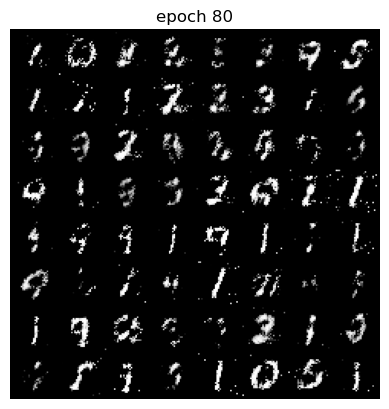

Epoch 80 of 100
Generator loss: 2.71440625, Discriminator loss: 0.84594184


  2%|▊                                            | 2/117 [00:00<00:07, 14.66it/s]

tensor(1.1030, grad_fn=<AddBackward0>)
tensor(1.0038, grad_fn=<AddBackward0>)
tensor(1.0464, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.74it/s]

tensor(1.0141, grad_fn=<AddBackward0>)
tensor(1.0654, grad_fn=<AddBackward0>)
tensor(1.0183, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.04it/s]

tensor(0.9677, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.05it/s]

tensor(0.9414, grad_fn=<AddBackward0>)
tensor(0.9537, grad_fn=<AddBackward0>)
tensor(0.9134, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.05it/s]

tensor(0.9146, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.13it/s]

tensor(0.8655, grad_fn=<AddBackward0>)
tensor(0.8363, grad_fn=<AddBackward0>)
tensor(0.8398, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.13it/s]

tensor(0.8132, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.10it/s]

tensor(0.8061, grad_fn=<AddBackward0>)
tensor(0.7757, grad_fn=<AddBackward0>)
tensor(0.7925, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.12it/s]

tensor(0.7591, grad_fn=<AddBackward0>)
tensor(0.7241, grad_fn=<AddBackward0>)
tensor(0.7169, grad_fn=<AddBackward0>)
tensor(0.7218, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.19it/s]

tensor(0.6902, grad_fn=<AddBackward0>)
tensor(0.6518, grad_fn=<AddBackward0>)
tensor(0.6650, grad_fn=<AddBackward0>)
tensor(0.6968, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.22it/s]

tensor(0.6666, grad_fn=<AddBackward0>)
tensor(0.7147, grad_fn=<AddBackward0>)
tensor(0.7063, grad_fn=<AddBackward0>)
tensor(0.7067, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.23it/s]

tensor(0.7491, grad_fn=<AddBackward0>)
tensor(0.7145, grad_fn=<AddBackward0>)
tensor(0.7896, grad_fn=<AddBackward0>)
tensor(0.7610, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.19it/s]

tensor(0.8526, grad_fn=<AddBackward0>)
tensor(0.8494, grad_fn=<AddBackward0>)
tensor(0.8539, grad_fn=<AddBackward0>)
tensor(0.9102, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.09it/s]

tensor(0.9569, grad_fn=<AddBackward0>)
tensor(0.9736, grad_fn=<AddBackward0>)
tensor(0.9870, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.09it/s]

tensor(0.9656, grad_fn=<AddBackward0>)
tensor(1.0045, grad_fn=<AddBackward0>)
tensor(0.8940, grad_fn=<AddBackward0>)
tensor(0.9386, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.18it/s]

tensor(0.8865, grad_fn=<AddBackward0>)
tensor(0.8954, grad_fn=<AddBackward0>)
tensor(0.8612, grad_fn=<AddBackward0>)
tensor(0.8792, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.19it/s]

tensor(0.8307, grad_fn=<AddBackward0>)
tensor(0.8278, grad_fn=<AddBackward0>)
tensor(0.8573, grad_fn=<AddBackward0>)
tensor(0.7647, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.10it/s]

tensor(0.8010, grad_fn=<AddBackward0>)
tensor(0.7813, grad_fn=<AddBackward0>)
tensor(0.7295, grad_fn=<AddBackward0>)
tensor(0.7417, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.15it/s]

tensor(0.7111, grad_fn=<AddBackward0>)
tensor(0.7850, grad_fn=<AddBackward0>)
tensor(0.7726, grad_fn=<AddBackward0>)
tensor(0.7941, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.16it/s]

tensor(0.7840, grad_fn=<AddBackward0>)
tensor(0.8966, grad_fn=<AddBackward0>)
tensor(0.8776, grad_fn=<AddBackward0>)
tensor(0.8592, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.19it/s]

tensor(0.8614, grad_fn=<AddBackward0>)
tensor(0.9102, grad_fn=<AddBackward0>)
tensor(0.9912, grad_fn=<AddBackward0>)
tensor(0.9701, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.24it/s]

tensor(0.9490, grad_fn=<AddBackward0>)
tensor(0.9622, grad_fn=<AddBackward0>)
tensor(1.0182, grad_fn=<AddBackward0>)
tensor(0.9733, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.23it/s]

tensor(0.9336, grad_fn=<AddBackward0>)
tensor(0.9914, grad_fn=<AddBackward0>)
tensor(0.9698, grad_fn=<AddBackward0>)
tensor(0.9464, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.19it/s]

tensor(0.9527, grad_fn=<AddBackward0>)
tensor(0.9619, grad_fn=<AddBackward0>)
tensor(0.8905, grad_fn=<AddBackward0>)
tensor(0.8843, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.31it/s]

tensor(0.8229, grad_fn=<AddBackward0>)
tensor(0.8531, grad_fn=<AddBackward0>)
tensor(0.8109, grad_fn=<AddBackward0>)
tensor(0.8064, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.25it/s]

tensor(0.7742, grad_fn=<AddBackward0>)
tensor(0.7340, grad_fn=<AddBackward0>)
tensor(0.7697, grad_fn=<AddBackward0>)
tensor(0.7211, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.32it/s]

tensor(0.7021, grad_fn=<AddBackward0>)
tensor(0.7218, grad_fn=<AddBackward0>)
tensor(0.7110, grad_fn=<AddBackward0>)
tensor(0.6937, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.21it/s]

tensor(0.7040, grad_fn=<AddBackward0>)
tensor(0.6912, grad_fn=<AddBackward0>)
tensor(0.7066, grad_fn=<AddBackward0>)
tensor(0.6973, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.26it/s]

tensor(0.7058, grad_fn=<AddBackward0>)
tensor(0.7047, grad_fn=<AddBackward0>)
tensor(0.7040, grad_fn=<AddBackward0>)
tensor(0.6903, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.12it/s]

tensor(0.6961, grad_fn=<AddBackward0>)
tensor(0.7152, grad_fn=<AddBackward0>)
tensor(0.7606, grad_fn=<AddBackward0>)
tensor(0.7590, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.16it/s]

tensor(0.7519, grad_fn=<AddBackward0>)
tensor(0.7677, grad_fn=<AddBackward0>)
tensor(0.8519, grad_fn=<AddBackward0>)
tensor(0.8763, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.11it/s]

tensor(0.8935, grad_fn=<AddBackward0>)
tensor(0.8922, grad_fn=<AddBackward0>)
tensor(0.9322, grad_fn=<AddBackward0>)
tensor(0.9346, grad_fn=<AddBackward0>)


118it [00:07, 15.23it/s]                                                          


tensor(0.9977, grad_fn=<AddBackward0>)
tensor(0.9822, grad_fn=<AddBackward0>)
tensor(1.0174, grad_fn=<AddBackward0>)
tensor(0.9982, grad_fn=<AddBackward0>)
Epoch 81 of 100
Generator loss: 2.68751860, Discriminator loss: 0.84927362


  2%|▊                                            | 2/117 [00:00<00:07, 14.98it/s]

tensor(1.0682, grad_fn=<AddBackward0>)
tensor(1.0407, grad_fn=<AddBackward0>)
tensor(1.0487, grad_fn=<AddBackward0>)
tensor(1.0344, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.93it/s]

tensor(0.9981, grad_fn=<AddBackward0>)
tensor(1.0253, grad_fn=<AddBackward0>)
tensor(0.9711, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.96it/s]

tensor(0.9959, grad_fn=<AddBackward0>)
tensor(1.0043, grad_fn=<AddBackward0>)
tensor(0.9839, grad_fn=<AddBackward0>)
tensor(0.9508, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.20it/s]

tensor(0.9792, grad_fn=<AddBackward0>)
tensor(0.9507, grad_fn=<AddBackward0>)
tensor(0.8859, grad_fn=<AddBackward0>)
tensor(0.9076, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.21it/s]

tensor(0.8665, grad_fn=<AddBackward0>)
tensor(0.8397, grad_fn=<AddBackward0>)
tensor(0.8207, grad_fn=<AddBackward0>)
tensor(0.8381, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.23it/s]

tensor(0.8155, grad_fn=<AddBackward0>)
tensor(0.7830, grad_fn=<AddBackward0>)
tensor(0.7826, grad_fn=<AddBackward0>)
tensor(0.8046, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.38it/s]

tensor(0.7602, grad_fn=<AddBackward0>)
tensor(0.7964, grad_fn=<AddBackward0>)
tensor(0.7782, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.44it/s]

tensor(0.7878, grad_fn=<AddBackward0>)
tensor(0.7472, grad_fn=<AddBackward0>)
tensor(0.8142, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.19it/s]

tensor(0.8266, grad_fn=<AddBackward0>)
tensor(0.7731, grad_fn=<AddBackward0>)
tensor(0.8238, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.21it/s]

tensor(0.8921, grad_fn=<AddBackward0>)
tensor(0.9103, grad_fn=<AddBackward0>)
tensor(0.9231, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.27it/s]

tensor(0.9546, grad_fn=<AddBackward0>)
tensor(1.0343, grad_fn=<AddBackward0>)
tensor(1.0015, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.30it/s]

tensor(0.9968, grad_fn=<AddBackward0>)
tensor(1.0607, grad_fn=<AddBackward0>)
tensor(1.0339, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:05, 14.35it/s]

tensor(1.0358, grad_fn=<AddBackward0>)
tensor(1.0071, grad_fn=<AddBackward0>)
tensor(0.9778, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.33it/s]

tensor(0.9970, grad_fn=<AddBackward0>)
tensor(1.0121, grad_fn=<AddBackward0>)
tensor(0.9280, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.36it/s]

tensor(0.9128, grad_fn=<AddBackward0>)
tensor(0.9678, grad_fn=<AddBackward0>)
tensor(0.8364, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.44it/s]

tensor(0.8663, grad_fn=<AddBackward0>)
tensor(0.8007, grad_fn=<AddBackward0>)
tensor(0.8537, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.36it/s]

tensor(0.7813, grad_fn=<AddBackward0>)
tensor(0.7783, grad_fn=<AddBackward0>)
tensor(0.7780, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.43it/s]

tensor(0.7644, grad_fn=<AddBackward0>)
tensor(0.7454, grad_fn=<AddBackward0>)
tensor(0.7404, grad_fn=<AddBackward0>)
tensor(0.7710, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.78it/s]

tensor(0.7864, grad_fn=<AddBackward0>)
tensor(0.7479, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)
tensor(0.7565, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 14.94it/s]

tensor(0.7088, grad_fn=<AddBackward0>)
tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.7102, grad_fn=<AddBackward0>)
tensor(0.7256, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.02it/s]

tensor(0.7696, grad_fn=<AddBackward0>)
tensor(0.7312, grad_fn=<AddBackward0>)
tensor(0.8160, grad_fn=<AddBackward0>)
tensor(0.7606, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 15.03it/s]

tensor(0.8311, grad_fn=<AddBackward0>)
tensor(0.7733, grad_fn=<AddBackward0>)
tensor(0.7808, grad_fn=<AddBackward0>)
tensor(0.8336, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.09it/s]

tensor(0.8037, grad_fn=<AddBackward0>)
tensor(0.8300, grad_fn=<AddBackward0>)
tensor(0.8481, grad_fn=<AddBackward0>)
tensor(0.8952, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.13it/s]

tensor(0.8648, grad_fn=<AddBackward0>)
tensor(0.8765, grad_fn=<AddBackward0>)
tensor(0.8569, grad_fn=<AddBackward0>)
tensor(0.8852, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.16it/s]

tensor(0.8476, grad_fn=<AddBackward0>)
tensor(0.8653, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.8315, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.14it/s]

tensor(0.8548, grad_fn=<AddBackward0>)
tensor(0.8126, grad_fn=<AddBackward0>)
tensor(0.8321, grad_fn=<AddBackward0>)
tensor(0.8039, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.24it/s]

tensor(0.8346, grad_fn=<AddBackward0>)
tensor(0.8561, grad_fn=<AddBackward0>)
tensor(0.8054, grad_fn=<AddBackward0>)
tensor(0.8135, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.19it/s]

tensor(0.8185, grad_fn=<AddBackward0>)
tensor(0.8139, grad_fn=<AddBackward0>)
tensor(0.8069, grad_fn=<AddBackward0>)
tensor(0.7931, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.10it/s]

tensor(0.7815, grad_fn=<AddBackward0>)
tensor(0.8202, grad_fn=<AddBackward0>)
tensor(0.7816, grad_fn=<AddBackward0>)
tensor(0.8336, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.07it/s]

tensor(0.8639, grad_fn=<AddBackward0>)
tensor(0.8211, grad_fn=<AddBackward0>)
tensor(0.8199, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.05it/s]

tensor(0.8288, grad_fn=<AddBackward0>)
tensor(0.8297, grad_fn=<AddBackward0>)
tensor(0.8289, grad_fn=<AddBackward0>)
tensor(0.8189, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 14.86it/s]

tensor(0.8835, grad_fn=<AddBackward0>)
tensor(0.8359, grad_fn=<AddBackward0>)
tensor(0.8395, grad_fn=<AddBackward0>)


118it [00:07, 14.90it/s]                                                          


tensor(0.8028, grad_fn=<AddBackward0>)
tensor(0.8630, grad_fn=<AddBackward0>)
tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.8496, grad_fn=<AddBackward0>)
Epoch 82 of 100
Generator loss: 2.50766110, Discriminator loss: 0.86461031


  2%|▊                                            | 2/117 [00:00<00:07, 15.24it/s]

tensor(0.8749, grad_fn=<AddBackward0>)
tensor(0.7984, grad_fn=<AddBackward0>)
tensor(0.8426, grad_fn=<AddBackward0>)
tensor(0.8799, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.26it/s]

tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8932, grad_fn=<AddBackward0>)
tensor(0.8367, grad_fn=<AddBackward0>)
tensor(0.8328, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.23it/s]

tensor(0.8480, grad_fn=<AddBackward0>)
tensor(0.8056, grad_fn=<AddBackward0>)
tensor(0.8362, grad_fn=<AddBackward0>)
tensor(0.8049, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.20it/s]

tensor(0.7966, grad_fn=<AddBackward0>)
tensor(0.8129, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)
tensor(0.7385, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.23it/s]

tensor(0.7553, grad_fn=<AddBackward0>)
tensor(0.7449, grad_fn=<AddBackward0>)
tensor(0.7279, grad_fn=<AddBackward0>)
tensor(0.7398, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.19it/s]

tensor(0.7187, grad_fn=<AddBackward0>)
tensor(0.7110, grad_fn=<AddBackward0>)
tensor(0.7113, grad_fn=<AddBackward0>)
tensor(0.7104, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.21it/s]

tensor(0.7018, grad_fn=<AddBackward0>)
tensor(0.7112, grad_fn=<AddBackward0>)
tensor(0.7499, grad_fn=<AddBackward0>)
tensor(0.7401, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.19it/s]

tensor(0.7411, grad_fn=<AddBackward0>)
tensor(0.7513, grad_fn=<AddBackward0>)
tensor(0.7309, grad_fn=<AddBackward0>)
tensor(0.7588, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.13it/s]

tensor(0.7773, grad_fn=<AddBackward0>)
tensor(0.8453, grad_fn=<AddBackward0>)
tensor(0.8303, grad_fn=<AddBackward0>)
tensor(0.8687, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.07it/s]

tensor(0.8955, grad_fn=<AddBackward0>)
tensor(0.9144, grad_fn=<AddBackward0>)
tensor(0.8816, grad_fn=<AddBackward0>)
tensor(0.9264, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.17it/s]

tensor(0.9382, grad_fn=<AddBackward0>)
tensor(0.9502, grad_fn=<AddBackward0>)
tensor(0.9414, grad_fn=<AddBackward0>)
tensor(0.9495, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.04it/s]

tensor(0.9494, grad_fn=<AddBackward0>)
tensor(0.8656, grad_fn=<AddBackward0>)
tensor(0.9303, grad_fn=<AddBackward0>)
tensor(0.9761, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.12it/s]

tensor(0.9062, grad_fn=<AddBackward0>)
tensor(0.9269, grad_fn=<AddBackward0>)
tensor(0.8748, grad_fn=<AddBackward0>)
tensor(0.8348, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.07it/s]

tensor(0.8583, grad_fn=<AddBackward0>)
tensor(0.8099, grad_fn=<AddBackward0>)
tensor(0.8077, grad_fn=<AddBackward0>)
tensor(0.8667, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.20it/s]

tensor(0.7816, grad_fn=<AddBackward0>)
tensor(0.7667, grad_fn=<AddBackward0>)
tensor(0.7660, grad_fn=<AddBackward0>)
tensor(0.7910, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.03it/s]

tensor(0.7502, grad_fn=<AddBackward0>)
tensor(0.7728, grad_fn=<AddBackward0>)
tensor(0.7888, grad_fn=<AddBackward0>)
tensor(0.7514, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.10it/s]

tensor(0.7925, grad_fn=<AddBackward0>)
tensor(0.8051, grad_fn=<AddBackward0>)
tensor(0.8262, grad_fn=<AddBackward0>)
tensor(0.7821, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.16it/s]

tensor(0.8388, grad_fn=<AddBackward0>)
tensor(0.9038, grad_fn=<AddBackward0>)
tensor(0.8751, grad_fn=<AddBackward0>)
tensor(0.8958, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.14it/s]

tensor(0.8911, grad_fn=<AddBackward0>)
tensor(0.8730, grad_fn=<AddBackward0>)
tensor(0.8584, grad_fn=<AddBackward0>)
tensor(0.9273, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.17it/s]

tensor(0.8944, grad_fn=<AddBackward0>)
tensor(0.9352, grad_fn=<AddBackward0>)
tensor(0.9009, grad_fn=<AddBackward0>)
tensor(0.8925, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.10it/s]

tensor(0.9179, grad_fn=<AddBackward0>)
tensor(0.8583, grad_fn=<AddBackward0>)
tensor(0.8469, grad_fn=<AddBackward0>)
tensor(0.8194, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.04it/s]

tensor(0.8815, grad_fn=<AddBackward0>)
tensor(0.7862, grad_fn=<AddBackward0>)
tensor(0.8052, grad_fn=<AddBackward0>)
tensor(0.7804, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.02it/s]

tensor(0.7910, grad_fn=<AddBackward0>)
tensor(0.8424, grad_fn=<AddBackward0>)
tensor(0.7778, grad_fn=<AddBackward0>)
tensor(0.7900, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.11it/s]

tensor(0.7687, grad_fn=<AddBackward0>)
tensor(0.7710, grad_fn=<AddBackward0>)
tensor(0.7297, grad_fn=<AddBackward0>)
tensor(0.7426, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.11it/s]

tensor(0.7721, grad_fn=<AddBackward0>)
tensor(0.8202, grad_fn=<AddBackward0>)
tensor(0.7910, grad_fn=<AddBackward0>)
tensor(0.8572, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.09it/s]

tensor(0.7802, grad_fn=<AddBackward0>)
tensor(0.8128, grad_fn=<AddBackward0>)
tensor(0.8902, grad_fn=<AddBackward0>)
tensor(0.7971, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.11it/s]

tensor(0.8289, grad_fn=<AddBackward0>)
tensor(0.9019, grad_fn=<AddBackward0>)
tensor(0.8196, grad_fn=<AddBackward0>)
tensor(0.8606, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.17it/s]

tensor(0.8395, grad_fn=<AddBackward0>)
tensor(0.8365, grad_fn=<AddBackward0>)
tensor(0.8792, grad_fn=<AddBackward0>)
tensor(0.8379, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.08it/s]

tensor(0.8277, grad_fn=<AddBackward0>)
tensor(0.8489, grad_fn=<AddBackward0>)
tensor(0.8199, grad_fn=<AddBackward0>)
tensor(0.8159, grad_fn=<AddBackward0>)


118it [00:07, 15.22it/s]                                                          


tensor(0.7601, grad_fn=<AddBackward0>)
tensor(0.8437, grad_fn=<AddBackward0>)
Epoch 83 of 100
Generator loss: 2.65009642, Discriminator loss: 0.83309525


  2%|▊                                            | 2/117 [00:00<00:07, 15.28it/s]

tensor(0.8109, grad_fn=<AddBackward0>)
tensor(0.7824, grad_fn=<AddBackward0>)
tensor(0.7929, grad_fn=<AddBackward0>)
tensor(0.7660, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.28it/s]

tensor(0.7754, grad_fn=<AddBackward0>)
tensor(0.7647, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.13it/s]

tensor(0.7658, grad_fn=<AddBackward0>)
tensor(0.7834, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.12it/s]

tensor(0.7795, grad_fn=<AddBackward0>)
tensor(0.7941, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.11it/s]

tensor(0.7996, grad_fn=<AddBackward0>)
tensor(0.7518, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.17it/s]

tensor(0.7758, grad_fn=<AddBackward0>)
tensor(0.7696, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.04it/s]

tensor(0.8105, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.81it/s]

tensor(0.7999, grad_fn=<AddBackward0>)
tensor(0.8126, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.77it/s]

tensor(0.8100, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.70it/s]

tensor(0.8934, grad_fn=<AddBackward0>)
tensor(0.8849, grad_fn=<AddBackward0>)
tensor(0.8450, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.69it/s]

tensor(0.8873, grad_fn=<AddBackward0>)
tensor(0.8827, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.62it/s]

tensor(0.8750, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.75it/s]

tensor(0.9229, grad_fn=<AddBackward0>)
tensor(0.9232, grad_fn=<AddBackward0>)
tensor(0.9404, grad_fn=<AddBackward0>)
tensor(0.9074, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.90it/s]

tensor(0.9058, grad_fn=<AddBackward0>)
tensor(0.9465, grad_fn=<AddBackward0>)
tensor(0.9123, grad_fn=<AddBackward0>)
tensor(0.8600, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.00it/s]

tensor(0.8738, grad_fn=<AddBackward0>)
tensor(0.8813, grad_fn=<AddBackward0>)
tensor(0.8694, grad_fn=<AddBackward0>)
tensor(0.8417, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.06it/s]

tensor(0.8551, grad_fn=<AddBackward0>)
tensor(0.8393, grad_fn=<AddBackward0>)
tensor(0.7987, grad_fn=<AddBackward0>)
tensor(0.8748, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.09it/s]

tensor(0.8292, grad_fn=<AddBackward0>)
tensor(0.8266, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)
tensor(0.8546, grad_fn=<AddBackward0>)

 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.05it/s]


tensor(0.7740, grad_fn=<AddBackward0>)
tensor(0.8266, grad_fn=<AddBackward0>)
tensor(0.8156, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.05it/s]

tensor(0.8117, grad_fn=<AddBackward0>)
tensor(0.8509, grad_fn=<AddBackward0>)
tensor(0.9074, grad_fn=<AddBackward0>)
tensor(0.8902, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.8380, grad_fn=<AddBackward0>)
tensor(0.8043, grad_fn=<AddBackward0>)
tensor(0.8469, grad_fn=<AddBackward0>)
tensor(0.7851, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.00it/s]

tensor(0.8049, grad_fn=<AddBackward0>)
tensor(0.8457, grad_fn=<AddBackward0>)
tensor(0.8382, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.98it/s]

tensor(0.7852, grad_fn=<AddBackward0>)
tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.7593, grad_fn=<AddBackward0>)
tensor(0.7472, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.96it/s]

tensor(0.7839, grad_fn=<AddBackward0>)
tensor(0.7303, grad_fn=<AddBackward0>)
tensor(0.7360, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.87it/s]

tensor(0.7156, grad_fn=<AddBackward0>)
tensor(0.7242, grad_fn=<AddBackward0>)
tensor(0.7175, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 12.69it/s]

tensor(0.7499, grad_fn=<AddBackward0>)
tensor(0.7495, grad_fn=<AddBackward0>)
tensor(0.7592, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 13.17it/s]

tensor(0.8329, grad_fn=<AddBackward0>)
tensor(0.7543, grad_fn=<AddBackward0>)
tensor(0.8172, grad_fn=<AddBackward0>)


 66%|████████████████████████████▉               | 77/117 [00:05<00:02, 14.95it/s]

tensor(0.8730, grad_fn=<AddBackward0>)
tensor(0.8993, grad_fn=<AddBackward0>)
tensor(0.9459, grad_fn=<AddBackward0>)


 68%|█████████████████████████████▋              | 79/117 [00:05<00:02, 14.92it/s]

tensor(0.9485, grad_fn=<AddBackward0>)
tensor(0.9748, grad_fn=<AddBackward0>)
tensor(0.9847, grad_fn=<AddBackward0>)
tensor(1.1244, grad_fn=<AddBackward0>)


 71%|███████████████████████████████▏            | 83/117 [00:05<00:02, 15.02it/s]

tensor(1.0898, grad_fn=<AddBackward0>)
tensor(1.0918, grad_fn=<AddBackward0>)
tensor(1.1465, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▋           | 87/117 [00:05<00:01, 15.09it/s]

tensor(1.0995, grad_fn=<AddBackward0>)
tensor(1.0753, grad_fn=<AddBackward0>)
tensor(1.0419, grad_fn=<AddBackward0>)
tensor(1.0260, grad_fn=<AddBackward0>)


 78%|██████████████████████████████████▏         | 91/117 [00:06<00:01, 15.25it/s]

tensor(0.9636, grad_fn=<AddBackward0>)
tensor(0.8800, grad_fn=<AddBackward0>)
tensor(0.8487, grad_fn=<AddBackward0>)
tensor(0.8220, grad_fn=<AddBackward0>)


 81%|███████████████████████████████████▋        | 95/117 [00:06<00:01, 15.30it/s]

tensor(0.8034, grad_fn=<AddBackward0>)
tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.7269, grad_fn=<AddBackward0>)
tensor(0.7412, grad_fn=<AddBackward0>)


 85%|█████████████████████████████████████▏      | 99/117 [00:06<00:01, 15.29it/s]

tensor(0.7045, grad_fn=<AddBackward0>)
tensor(0.7272, grad_fn=<AddBackward0>)
tensor(0.6864, grad_fn=<AddBackward0>)
tensor(0.6602, grad_fn=<AddBackward0>)


 88%|█████████████████████████████████████▊     | 103/117 [00:06<00:00, 15.09it/s]

tensor(0.7063, grad_fn=<AddBackward0>)
tensor(0.6768, grad_fn=<AddBackward0>)
tensor(0.6587, grad_fn=<AddBackward0>)
tensor(0.6696, grad_fn=<AddBackward0>)


 91%|███████████████████████████████████████▎   | 107/117 [00:07<00:00, 15.21it/s]

tensor(0.7049, grad_fn=<AddBackward0>)
tensor(0.7084, grad_fn=<AddBackward0>)
tensor(0.7805, grad_fn=<AddBackward0>)
tensor(0.7935, grad_fn=<AddBackward0>)


 95%|████████████████████████████████████████▊  | 111/117 [00:07<00:00, 15.22it/s]

tensor(0.7918, grad_fn=<AddBackward0>)
tensor(0.8296, grad_fn=<AddBackward0>)
tensor(0.8388, grad_fn=<AddBackward0>)
tensor(0.9419, grad_fn=<AddBackward0>)


 98%|██████████████████████████████████████████▎| 115/117 [00:07<00:00, 15.07it/s]

tensor(0.9597, grad_fn=<AddBackward0>)
tensor(0.9477, grad_fn=<AddBackward0>)
tensor(0.9731, grad_fn=<AddBackward0>)


118it [00:07, 15.01it/s]                                                          


tensor(1.0216, grad_fn=<AddBackward0>)
tensor(1.0088, grad_fn=<AddBackward0>)
tensor(1.1135, grad_fn=<AddBackward0>)
Epoch 84 of 100
Generator loss: 2.71930981, Discriminator loss: 0.85026026


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(1.1102, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.66it/s]

tensor(1.0217, grad_fn=<AddBackward0>)
tensor(1.0702, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.62it/s]

tensor(1.0017, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.73it/s]

tensor(0.9814, grad_fn=<AddBackward0>)
tensor(1.0337, grad_fn=<AddBackward0>)
tensor(0.9480, grad_fn=<AddBackward0>)
tensor(0.9535, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.96it/s]

tensor(0.9217, grad_fn=<AddBackward0>)
tensor(0.8533, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.09it/s]

tensor(0.8702, grad_fn=<AddBackward0>)
tensor(0.8702, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.15it/s]

tensor(0.8220, grad_fn=<AddBackward0>)
tensor(0.7943, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.10it/s]

tensor(0.7881, grad_fn=<AddBackward0>)
tensor(0.8106, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.15it/s]

tensor(0.7795, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.61it/s]

tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.7986, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.76it/s]

tensor(0.7724, grad_fn=<AddBackward0>)
tensor(0.7905, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.83it/s]

tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7688, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(0.7725, grad_fn=<AddBackward0>)
tensor(0.8082, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.05it/s]

tensor(0.8270, grad_fn=<AddBackward0>)
tensor(0.8179, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.02it/s]

tensor(0.8401, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.03it/s]

tensor(0.8493, grad_fn=<AddBackward0>)
tensor(0.8970, grad_fn=<AddBackward0>)
tensor(0.8376, grad_fn=<AddBackward0>)
tensor(0.8923, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.17it/s]

tensor(0.9283, grad_fn=<AddBackward0>)
tensor(0.9500, grad_fn=<AddBackward0>)
tensor(1.0205, grad_fn=<AddBackward0>)
tensor(0.9872, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.18it/s]

tensor(0.9984, grad_fn=<AddBackward0>)
tensor(0.9754, grad_fn=<AddBackward0>)
tensor(1.0163, grad_fn=<AddBackward0>)
tensor(0.9979, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.16it/s]

tensor(0.9643, grad_fn=<AddBackward0>)
tensor(0.9861, grad_fn=<AddBackward0>)
tensor(0.9618, grad_fn=<AddBackward0>)
tensor(0.9295, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.19it/s]

tensor(0.8814, grad_fn=<AddBackward0>)
tensor(0.9437, grad_fn=<AddBackward0>)
tensor(0.9166, grad_fn=<AddBackward0>)
tensor(0.8881, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.19it/s]

tensor(0.8380, grad_fn=<AddBackward0>)
tensor(0.8103, grad_fn=<AddBackward0>)
tensor(0.8309, grad_fn=<AddBackward0>)
tensor(0.7757, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.22it/s]

tensor(0.7843, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)
tensor(0.7735, grad_fn=<AddBackward0>)
tensor(0.7331, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.21it/s]

tensor(0.7283, grad_fn=<AddBackward0>)
tensor(0.7158, grad_fn=<AddBackward0>)
tensor(0.6989, grad_fn=<AddBackward0>)
tensor(0.7232, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.17it/s]

tensor(0.6773, grad_fn=<AddBackward0>)
tensor(0.6522, grad_fn=<AddBackward0>)
tensor(0.6932, grad_fn=<AddBackward0>)
tensor(0.7350, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.13it/s]

tensor(0.6875, grad_fn=<AddBackward0>)
tensor(0.7034, grad_fn=<AddBackward0>)
tensor(0.6835, grad_fn=<AddBackward0>)
tensor(0.7314, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.23it/s]

tensor(0.7229, grad_fn=<AddBackward0>)
tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.7958, grad_fn=<AddBackward0>)
tensor(0.8257, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.19it/s]

tensor(0.8040, grad_fn=<AddBackward0>)
tensor(0.8034, grad_fn=<AddBackward0>)
tensor(0.8605, grad_fn=<AddBackward0>)
tensor(0.8825, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.11it/s]

tensor(0.9321, grad_fn=<AddBackward0>)
tensor(0.9193, grad_fn=<AddBackward0>)
tensor(0.9011, grad_fn=<AddBackward0>)
tensor(1.0606, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.13it/s]

tensor(0.9988, grad_fn=<AddBackward0>)
tensor(1.0065, grad_fn=<AddBackward0>)
tensor(1.0302, grad_fn=<AddBackward0>)
tensor(1.0952, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.11it/s]

tensor(1.0104, grad_fn=<AddBackward0>)
tensor(1.0403, grad_fn=<AddBackward0>)
tensor(1.0266, grad_fn=<AddBackward0>)
tensor(1.0284, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.12it/s]

tensor(1.0147, grad_fn=<AddBackward0>)
tensor(1.0064, grad_fn=<AddBackward0>)
tensor(0.9710, grad_fn=<AddBackward0>)
tensor(0.9554, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.11it/s]

tensor(0.9490, grad_fn=<AddBackward0>)
tensor(0.9324, grad_fn=<AddBackward0>)
tensor(0.8928, grad_fn=<AddBackward0>)
tensor(0.9200, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.17it/s]

tensor(0.9223, grad_fn=<AddBackward0>)
tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8494, grad_fn=<AddBackward0>)
tensor(0.8135, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.09it/s]

tensor(0.7743, grad_fn=<AddBackward0>)
tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.8042, grad_fn=<AddBackward0>)
tensor(0.8131, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.02it/s]

tensor(0.7906, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.7829, grad_fn=<AddBackward0>)
tensor(0.7978, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.03it/s]

tensor(0.7753, grad_fn=<AddBackward0>)
tensor(0.7726, grad_fn=<AddBackward0>)
tensor(0.7261, grad_fn=<AddBackward0>)
tensor(0.7601, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.14it/s]

tensor(0.7758, grad_fn=<AddBackward0>)
tensor(0.7714, grad_fn=<AddBackward0>)
tensor(0.7616, grad_fn=<AddBackward0>)
tensor(0.7513, grad_fn=<AddBackward0>)


118it [00:07, 15.18it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.7913, grad_fn=<AddBackward0>)
tensor(0.7927, grad_fn=<AddBackward0>)


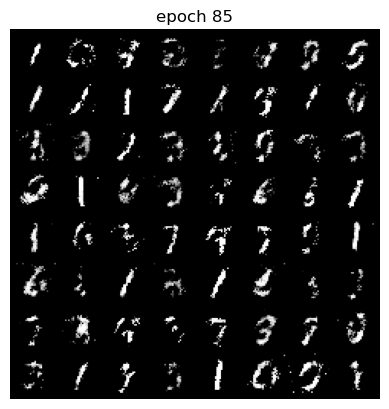

Epoch 85 of 100
Generator loss: 2.52175784, Discriminator loss: 0.86815625


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.8463, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.49it/s]

tensor(0.8690, grad_fn=<AddBackward0>)
tensor(0.8605, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.56it/s]

tensor(0.9136, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.91it/s]

tensor(0.9475, grad_fn=<AddBackward0>)
tensor(0.9034, grad_fn=<AddBackward0>)
tensor(0.9295, grad_fn=<AddBackward0>)
tensor(0.9036, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.14it/s]

tensor(0.8482, grad_fn=<AddBackward0>)
tensor(0.8676, grad_fn=<AddBackward0>)
tensor(0.8641, grad_fn=<AddBackward0>)
tensor(0.8924, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.21it/s]

tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.8410, grad_fn=<AddBackward0>)
tensor(0.8208, grad_fn=<AddBackward0>)
tensor(0.7837, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.17it/s]

tensor(0.8360, grad_fn=<AddBackward0>)
tensor(0.7863, grad_fn=<AddBackward0>)
tensor(0.7760, grad_fn=<AddBackward0>)
tensor(0.8225, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.18it/s]

tensor(0.7858, grad_fn=<AddBackward0>)
tensor(0.7884, grad_fn=<AddBackward0>)
tensor(0.7342, grad_fn=<AddBackward0>)
tensor(0.7436, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.16it/s]

tensor(0.7529, grad_fn=<AddBackward0>)
tensor(0.7238, grad_fn=<AddBackward0>)
tensor(0.7311, grad_fn=<AddBackward0>)
tensor(0.7137, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.11it/s]

tensor(0.7532, grad_fn=<AddBackward0>)
tensor(0.7260, grad_fn=<AddBackward0>)
tensor(0.7003, grad_fn=<AddBackward0>)
tensor(0.7887, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.12it/s]

tensor(0.7228, grad_fn=<AddBackward0>)
tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.7300, grad_fn=<AddBackward0>)
tensor(0.7403, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.19it/s]

tensor(0.7849, grad_fn=<AddBackward0>)
tensor(0.7903, grad_fn=<AddBackward0>)
tensor(0.7861, grad_fn=<AddBackward0>)
tensor(0.8454, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.11it/s]

tensor(0.8439, grad_fn=<AddBackward0>)
tensor(0.8027, grad_fn=<AddBackward0>)
tensor(0.8412, grad_fn=<AddBackward0>)
tensor(0.8632, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.08it/s]

tensor(0.8780, grad_fn=<AddBackward0>)
tensor(0.8443, grad_fn=<AddBackward0>)
tensor(0.9107, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.92it/s]

tensor(0.8856, grad_fn=<AddBackward0>)
tensor(0.8495, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.86it/s]

tensor(0.9546, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.88it/s]

tensor(0.9486, grad_fn=<AddBackward0>)
tensor(0.9228, grad_fn=<AddBackward0>)
tensor(0.8972, grad_fn=<AddBackward0>)
tensor(0.8528, grad_fn=<AddBackward0>)

 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.91it/s]


tensor(0.8983, grad_fn=<AddBackward0>)
tensor(0.8642, grad_fn=<AddBackward0>)
tensor(0.8320, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.02it/s]

tensor(0.8590, grad_fn=<AddBackward0>)
tensor(0.8175, grad_fn=<AddBackward0>)
tensor(0.8067, grad_fn=<AddBackward0>)
tensor(0.8499, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.08it/s]

tensor(0.8047, grad_fn=<AddBackward0>)
tensor(0.8280, grad_fn=<AddBackward0>)
tensor(0.8253, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.74it/s]

tensor(0.7915, grad_fn=<AddBackward0>)
tensor(0.8019, grad_fn=<AddBackward0>)
tensor(0.7749, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.78it/s]

tensor(0.7854, grad_fn=<AddBackward0>)
tensor(0.7798, grad_fn=<AddBackward0>)
tensor(0.8061, grad_fn=<AddBackward0>)
tensor(0.7850, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.03it/s]

tensor(0.7770, grad_fn=<AddBackward0>)
tensor(0.7735, grad_fn=<AddBackward0>)
tensor(0.7827, grad_fn=<AddBackward0>)
tensor(0.7637, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.05it/s]

tensor(0.7620, grad_fn=<AddBackward0>)
tensor(0.7775, grad_fn=<AddBackward0>)
tensor(0.8287, grad_fn=<AddBackward0>)
tensor(0.7770, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.04it/s]

tensor(0.7626, grad_fn=<AddBackward0>)
tensor(0.8520, grad_fn=<AddBackward0>)
tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.8272, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.86it/s]

tensor(0.8192, grad_fn=<AddBackward0>)
tensor(0.8644, grad_fn=<AddBackward0>)
tensor(0.8082, grad_fn=<AddBackward0>)
tensor(0.8475, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 14.98it/s]

tensor(0.7893, grad_fn=<AddBackward0>)
tensor(0.8655, grad_fn=<AddBackward0>)
tensor(0.8278, grad_fn=<AddBackward0>)
tensor(0.8629, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.08it/s]

tensor(0.8632, grad_fn=<AddBackward0>)
tensor(0.9152, grad_fn=<AddBackward0>)
tensor(0.8330, grad_fn=<AddBackward0>)
tensor(0.8843, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.17it/s]

tensor(0.8311, grad_fn=<AddBackward0>)
tensor(0.8250, grad_fn=<AddBackward0>)
tensor(0.8229, grad_fn=<AddBackward0>)
tensor(0.8113, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.25it/s]

tensor(0.8216, grad_fn=<AddBackward0>)
tensor(0.8288, grad_fn=<AddBackward0>)
tensor(0.8260, grad_fn=<AddBackward0>)
tensor(0.8390, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.08it/s]

tensor(0.7950, grad_fn=<AddBackward0>)
tensor(0.8200, grad_fn=<AddBackward0>)
tensor(0.7520, grad_fn=<AddBackward0>)
tensor(0.7907, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.09it/s]

tensor(0.7708, grad_fn=<AddBackward0>)
tensor(0.7480, grad_fn=<AddBackward0>)
tensor(0.7610, grad_fn=<AddBackward0>)
tensor(0.7491, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.06it/s]

tensor(0.7629, grad_fn=<AddBackward0>)
tensor(0.7561, grad_fn=<AddBackward0>)
tensor(0.7364, grad_fn=<AddBackward0>)
tensor(0.7250, grad_fn=<AddBackward0>)


118it [00:07, 15.12it/s]                                                          


tensor(0.7969, grad_fn=<AddBackward0>)
tensor(0.6885, grad_fn=<AddBackward0>)
Epoch 86 of 100
Generator loss: 2.66887403, Discriminator loss: 0.82194883


  2%|▊                                            | 2/117 [00:00<00:07, 14.65it/s]

tensor(0.8059, grad_fn=<AddBackward0>)
tensor(0.8389, grad_fn=<AddBackward0>)
tensor(0.7968, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.55it/s]

tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.7445, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.31it/s]

tensor(0.7837, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 13.96it/s]

tensor(0.8453, grad_fn=<AddBackward0>)
tensor(0.8578, grad_fn=<AddBackward0>)
tensor(0.8731, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.19it/s]

tensor(0.8531, grad_fn=<AddBackward0>)
tensor(0.8994, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.45it/s]

tensor(0.8547, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.75it/s]

tensor(0.8876, grad_fn=<AddBackward0>)
tensor(0.9634, grad_fn=<AddBackward0>)
tensor(0.8932, grad_fn=<AddBackward0>)
tensor(0.9941, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.85it/s]

tensor(0.9097, grad_fn=<AddBackward0>)
tensor(0.9303, grad_fn=<AddBackward0>)
tensor(0.9796, grad_fn=<AddBackward0>)
tensor(0.9197, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.89it/s]

tensor(1.0270, grad_fn=<AddBackward0>)
tensor(0.9244, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.90it/s]

tensor(0.9367, grad_fn=<AddBackward0>)
tensor(0.9345, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(0.8778, grad_fn=<AddBackward0>)
tensor(0.8640, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.05it/s]

tensor(0.8714, grad_fn=<AddBackward0>)
tensor(0.8484, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.03it/s]

tensor(0.8259, grad_fn=<AddBackward0>)
tensor(0.8272, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.12it/s]

tensor(0.7740, grad_fn=<AddBackward0>)
tensor(0.7349, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.07it/s]

tensor(0.7115, grad_fn=<AddBackward0>)
tensor(0.7386, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.14it/s]

tensor(0.7620, grad_fn=<AddBackward0>)
tensor(0.7013, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.16it/s]

tensor(0.7216, grad_fn=<AddBackward0>)
tensor(0.6996, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.11it/s]

tensor(0.7244, grad_fn=<AddBackward0>)
tensor(0.7621, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.10it/s]

tensor(0.7559, grad_fn=<AddBackward0>)
tensor(0.7362, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.10it/s]

tensor(0.7109, grad_fn=<AddBackward0>)
tensor(0.7815, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.17it/s]

tensor(0.7316, grad_fn=<AddBackward0>)
tensor(0.7296, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.17it/s]

tensor(0.7615, grad_fn=<AddBackward0>)
tensor(0.7876, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.15it/s]

tensor(0.8007, grad_fn=<AddBackward0>)
tensor(0.8012, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.15it/s]

tensor(0.8474, grad_fn=<AddBackward0>)
tensor(0.7681, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.14it/s]

tensor(0.8679, grad_fn=<AddBackward0>)
tensor(0.8151, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.12it/s]

tensor(0.8261, grad_fn=<AddBackward0>)
tensor(0.9234, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.11it/s]

tensor(0.8665, grad_fn=<AddBackward0>)
tensor(0.8791, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.12it/s]

tensor(0.8051, grad_fn=<AddBackward0>)
tensor(0.8341, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.11it/s]

tensor(0.8038, grad_fn=<AddBackward0>)
tensor(0.8343, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.05it/s]

tensor(0.8458, grad_fn=<AddBackward0>)
tensor(0.8162, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.14it/s]

tensor(0.7963, grad_fn=<AddBackward0>)
tensor(0.7523, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.12it/s]

tensor(0.7747, grad_fn=<AddBackward0>)
tensor(0.7964, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.12it/s]

tensor(0.8136, grad_fn=<AddBackward0>)
tensor(0.8153, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.11it/s]

tensor(0.8105, grad_fn=<AddBackward0>)
tensor(0.8206, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.10it/s]

tensor(0.7961, grad_fn=<AddBackward0>)
tensor(0.7885, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.11it/s]

tensor(0.8818, grad_fn=<AddBackward0>)
tensor(0.8360, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.15it/s]

tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.8945, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.11it/s]

tensor(0.8209, grad_fn=<AddBackward0>)
tensor(0.8159, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.12it/s]

tensor(0.8161, grad_fn=<AddBackward0>)
tensor(0.8437, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.13it/s]

tensor(0.8287, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.03it/s]

tensor(0.8259, grad_fn=<AddBackward0>)
tensor(0.8602, grad_fn=<AddBackward0>)
tensor(0.9178, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.05it/s]

tensor(0.8624, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.08it/s]

tensor(0.9009, grad_fn=<AddBackward0>)
tensor(0.8860, grad_fn=<AddBackward0>)
tensor(0.8650, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.12it/s]

tensor(0.8862, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.19it/s]

tensor(0.8548, grad_fn=<AddBackward0>)
tensor(0.8906, grad_fn=<AddBackward0>)
tensor(0.9070, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.17it/s]

tensor(0.8748, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.80it/s]

tensor(0.9222, grad_fn=<AddBackward0>)
tensor(0.9198, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 14.72it/s]

tensor(0.8029, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.76it/s]

tensor(0.8442, grad_fn=<AddBackward0>)
tensor(0.9145, grad_fn=<AddBackward0>)
tensor(0.8427, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.83it/s]

tensor(0.8136, grad_fn=<AddBackward0>)
tensor(0.8245, grad_fn=<AddBackward0>)
tensor(0.8207, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.85it/s]

tensor(0.7987, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 14.90it/s]

tensor(0.7906, grad_fn=<AddBackward0>)
tensor(0.7550, grad_fn=<AddBackward0>)
tensor(0.8011, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 14.98it/s]

tensor(0.7704, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 14.95it/s]

tensor(0.7663, grad_fn=<AddBackward0>)
tensor(0.7729, grad_fn=<AddBackward0>)
tensor(0.7278, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.00it/s]

tensor(0.7067, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.03it/s]

tensor(0.7492, grad_fn=<AddBackward0>)
tensor(0.7580, grad_fn=<AddBackward0>)
tensor(0.7488, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.14it/s]

tensor(0.7657, grad_fn=<AddBackward0>)


118it [00:07, 15.07it/s]                                                          


tensor(0.7630, grad_fn=<AddBackward0>)
Epoch 87 of 100
Generator loss: 2.61538529, Discriminator loss: 0.83293897


  2%|▊                                            | 2/117 [00:00<00:07, 15.16it/s]

tensor(0.7286, grad_fn=<AddBackward0>)
tensor(0.7298, grad_fn=<AddBackward0>)
tensor(0.7784, grad_fn=<AddBackward0>)
tensor(0.7725, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.02it/s]

tensor(0.7348, grad_fn=<AddBackward0>)
tensor(0.7740, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.11it/s]

tensor(0.7574, grad_fn=<AddBackward0>)
tensor(0.7997, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.13it/s]

tensor(0.8133, grad_fn=<AddBackward0>)
tensor(0.9109, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.23it/s]

tensor(0.8912, grad_fn=<AddBackward0>)
tensor(0.9455, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.27it/s]

tensor(0.9889, grad_fn=<AddBackward0>)
tensor(0.9489, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.26it/s]

tensor(0.9815, grad_fn=<AddBackward0>)
tensor(0.9560, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.14it/s]

tensor(1.0169, grad_fn=<AddBackward0>)
tensor(0.9080, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.12it/s]

tensor(1.0027, grad_fn=<AddBackward0>)
tensor(0.9218, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.16it/s]

tensor(0.9581, grad_fn=<AddBackward0>)
tensor(0.9607, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.09it/s]

tensor(0.9568, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.01it/s]

tensor(0.8944, grad_fn=<AddBackward0>)
tensor(0.8910, grad_fn=<AddBackward0>)
tensor(0.8230, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.06it/s]

tensor(0.8673, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.04it/s]

tensor(0.7976, grad_fn=<AddBackward0>)
tensor(0.8223, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.02it/s]

tensor(0.7892, grad_fn=<AddBackward0>)

 27%|████████████                                | 32/117 [00:02<00:05, 14.88it/s]


tensor(0.8149, grad_fn=<AddBackward0>)
tensor(0.7826, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.02it/s]

tensor(0.7846, grad_fn=<AddBackward0>)
tensor(0.7607, grad_fn=<AddBackward0>)
tensor(0.7608, grad_fn=<AddBackward0>)
tensor(0.7444, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.07it/s]

tensor(0.7508, grad_fn=<AddBackward0>)
tensor(0.7373, grad_fn=<AddBackward0>)
tensor(0.6951, grad_fn=<AddBackward0>)
tensor(0.7136, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.09it/s]

tensor(0.7454, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7321, grad_fn=<AddBackward0>)
tensor(0.7188, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.14it/s]

tensor(0.7196, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)
tensor(0.7205, grad_fn=<AddBackward0>)
tensor(0.7613, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.14it/s]

tensor(0.7869, grad_fn=<AddBackward0>)
tensor(0.8324, grad_fn=<AddBackward0>)
tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8373, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.13it/s]

tensor(0.8611, grad_fn=<AddBackward0>)
tensor(0.8817, grad_fn=<AddBackward0>)
tensor(0.8465, grad_fn=<AddBackward0>)
tensor(0.9027, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.08it/s]

tensor(0.8938, grad_fn=<AddBackward0>)
tensor(0.9328, grad_fn=<AddBackward0>)
tensor(0.9239, grad_fn=<AddBackward0>)
tensor(0.9674, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.15it/s]

tensor(0.9519, grad_fn=<AddBackward0>)
tensor(0.9422, grad_fn=<AddBackward0>)
tensor(1.0237, grad_fn=<AddBackward0>)
tensor(0.9975, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.11it/s]

tensor(0.9806, grad_fn=<AddBackward0>)
tensor(0.8963, grad_fn=<AddBackward0>)
tensor(0.9072, grad_fn=<AddBackward0>)
tensor(0.9627, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.98it/s]

tensor(0.9078, grad_fn=<AddBackward0>)
tensor(0.9678, grad_fn=<AddBackward0>)
tensor(0.8304, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.02it/s]

tensor(0.8795, grad_fn=<AddBackward0>)
tensor(0.8360, grad_fn=<AddBackward0>)
tensor(0.8239, grad_fn=<AddBackward0>)
tensor(0.8452, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.20it/s]

tensor(0.8057, grad_fn=<AddBackward0>)
tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.8666, grad_fn=<AddBackward0>)
tensor(0.7624, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.21it/s]

tensor(0.7417, grad_fn=<AddBackward0>)
tensor(0.7645, grad_fn=<AddBackward0>)
tensor(0.7631, grad_fn=<AddBackward0>)
tensor(0.7144, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.19it/s]

tensor(0.7486, grad_fn=<AddBackward0>)
tensor(0.7397, grad_fn=<AddBackward0>)
tensor(0.7763, grad_fn=<AddBackward0>)
tensor(0.8245, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.15it/s]

tensor(0.7968, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)
tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.8862, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.14it/s]

tensor(0.8682, grad_fn=<AddBackward0>)
tensor(0.9218, grad_fn=<AddBackward0>)
tensor(0.9199, grad_fn=<AddBackward0>)
tensor(0.8907, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.15it/s]

tensor(0.9600, grad_fn=<AddBackward0>)
tensor(0.9288, grad_fn=<AddBackward0>)
tensor(0.9504, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:01, 14.99it/s]

tensor(0.8803, grad_fn=<AddBackward0>)
tensor(0.9275, grad_fn=<AddBackward0>)
tensor(0.8948, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.01it/s]

tensor(0.9224, grad_fn=<AddBackward0>)
tensor(0.8877, grad_fn=<AddBackward0>)
tensor(0.8474, grad_fn=<AddBackward0>)
tensor(0.8774, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.00it/s]

tensor(0.7962, grad_fn=<AddBackward0>)
tensor(0.7984, grad_fn=<AddBackward0>)
tensor(0.8187, grad_fn=<AddBackward0>)
tensor(0.8106, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.12it/s]

tensor(0.8188, grad_fn=<AddBackward0>)
tensor(0.7846, grad_fn=<AddBackward0>)
tensor(0.8016, grad_fn=<AddBackward0>)
tensor(0.7909, grad_fn=<AddBackward0>)


118it [00:07, 15.18it/s]                                                          


tensor(0.7837, grad_fn=<AddBackward0>)
tensor(0.7842, grad_fn=<AddBackward0>)
tensor(0.7437, grad_fn=<AddBackward0>)
tensor(0.7680, grad_fn=<AddBackward0>)
Epoch 88 of 100
Generator loss: 2.57933402, Discriminator loss: 0.85013819


  2%|▊                                            | 2/117 [00:00<00:07, 14.94it/s]

tensor(0.7504, grad_fn=<AddBackward0>)
tensor(0.7576, grad_fn=<AddBackward0>)
tensor(0.7719, grad_fn=<AddBackward0>)
tensor(0.7706, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.90it/s]

tensor(0.7709, grad_fn=<AddBackward0>)
tensor(0.7602, grad_fn=<AddBackward0>)
tensor(0.8088, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.84it/s]

tensor(0.7923, grad_fn=<AddBackward0>)
tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.8057, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.86it/s]

tensor(0.8485, grad_fn=<AddBackward0>)
tensor(0.8698, grad_fn=<AddBackward0>)
tensor(0.8319, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.87it/s]

tensor(0.8744, grad_fn=<AddBackward0>)
tensor(0.9341, grad_fn=<AddBackward0>)
tensor(0.9261, grad_fn=<AddBackward0>)
tensor(0.9019, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.02it/s]

tensor(0.9429, grad_fn=<AddBackward0>)
tensor(0.9422, grad_fn=<AddBackward0>)
tensor(0.9499, grad_fn=<AddBackward0>)
tensor(0.9552, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.04it/s]

tensor(0.9414, grad_fn=<AddBackward0>)
tensor(0.9591, grad_fn=<AddBackward0>)
tensor(1.0141, grad_fn=<AddBackward0>)
tensor(0.9220, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.18it/s]

tensor(0.9201, grad_fn=<AddBackward0>)
tensor(0.9031, grad_fn=<AddBackward0>)
tensor(0.8833, grad_fn=<AddBackward0>)
tensor(0.8746, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.15it/s]

tensor(0.8844, grad_fn=<AddBackward0>)
tensor(0.8105, grad_fn=<AddBackward0>)
tensor(0.8452, grad_fn=<AddBackward0>)
tensor(0.8572, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.19it/s]

tensor(0.7968, grad_fn=<AddBackward0>)
tensor(0.8287, grad_fn=<AddBackward0>)
tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.7917, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.15it/s]

tensor(0.7940, grad_fn=<AddBackward0>)
tensor(0.7996, grad_fn=<AddBackward0>)
tensor(0.7594, grad_fn=<AddBackward0>)
tensor(0.7453, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.14it/s]

tensor(0.7847, grad_fn=<AddBackward0>)
tensor(0.7985, grad_fn=<AddBackward0>)
tensor(0.8177, grad_fn=<AddBackward0>)
tensor(0.7854, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.17it/s]

tensor(0.8134, grad_fn=<AddBackward0>)
tensor(0.8217, grad_fn=<AddBackward0>)
tensor(0.8568, grad_fn=<AddBackward0>)
tensor(0.8916, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.21it/s]

tensor(0.8534, grad_fn=<AddBackward0>)
tensor(0.9352, grad_fn=<AddBackward0>)
tensor(0.9281, grad_fn=<AddBackward0>)
tensor(0.9154, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.24it/s]

tensor(0.9458, grad_fn=<AddBackward0>)
tensor(1.0004, grad_fn=<AddBackward0>)
tensor(0.9436, grad_fn=<AddBackward0>)
tensor(1.0155, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.25it/s]

tensor(0.9674, grad_fn=<AddBackward0>)
tensor(1.0036, grad_fn=<AddBackward0>)
tensor(1.0301, grad_fn=<AddBackward0>)
tensor(1.0374, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.19it/s]

tensor(1.0042, grad_fn=<AddBackward0>)
tensor(0.9807, grad_fn=<AddBackward0>)
tensor(0.9694, grad_fn=<AddBackward0>)
tensor(0.9437, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.14it/s]

tensor(0.9534, grad_fn=<AddBackward0>)
tensor(0.9196, grad_fn=<AddBackward0>)
tensor(0.8896, grad_fn=<AddBackward0>)
tensor(0.8111, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.22it/s]

tensor(0.8600, grad_fn=<AddBackward0>)
tensor(0.8395, grad_fn=<AddBackward0>)
tensor(0.8894, grad_fn=<AddBackward0>)
tensor(0.8045, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.22it/s]

tensor(0.7751, grad_fn=<AddBackward0>)
tensor(0.7804, grad_fn=<AddBackward0>)
tensor(0.8309, grad_fn=<AddBackward0>)
tensor(0.7679, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.21it/s]

tensor(0.7911, grad_fn=<AddBackward0>)
tensor(0.7589, grad_fn=<AddBackward0>)
tensor(0.7794, grad_fn=<AddBackward0>)
tensor(0.8157, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.18it/s]

tensor(0.7601, grad_fn=<AddBackward0>)
tensor(0.8238, grad_fn=<AddBackward0>)
tensor(0.8133, grad_fn=<AddBackward0>)
tensor(0.7853, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.25it/s]

tensor(0.8133, grad_fn=<AddBackward0>)
tensor(0.8943, grad_fn=<AddBackward0>)
tensor(0.8848, grad_fn=<AddBackward0>)
tensor(0.9636, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.23it/s]

tensor(0.9165, grad_fn=<AddBackward0>)
tensor(0.8932, grad_fn=<AddBackward0>)
tensor(0.9526, grad_fn=<AddBackward0>)
tensor(0.9239, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.13it/s]

tensor(0.9895, grad_fn=<AddBackward0>)
tensor(1.0185, grad_fn=<AddBackward0>)
tensor(0.9895, grad_fn=<AddBackward0>)
tensor(0.9972, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.07it/s]

tensor(0.9494, grad_fn=<AddBackward0>)
tensor(0.9720, grad_fn=<AddBackward0>)
tensor(0.9215, grad_fn=<AddBackward0>)
tensor(1.0237, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.08it/s]

tensor(0.9520, grad_fn=<AddBackward0>)
tensor(0.9010, grad_fn=<AddBackward0>)
tensor(0.8939, grad_fn=<AddBackward0>)
tensor(0.8699, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.15it/s]

tensor(0.8560, grad_fn=<AddBackward0>)
tensor(0.8312, grad_fn=<AddBackward0>)
tensor(0.8525, grad_fn=<AddBackward0>)
tensor(0.8538, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.17it/s]

tensor(0.8141, grad_fn=<AddBackward0>)
tensor(0.8262, grad_fn=<AddBackward0>)
tensor(0.8358, grad_fn=<AddBackward0>)
tensor(0.8129, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.18it/s]

tensor(0.8440, grad_fn=<AddBackward0>)
tensor(0.8333, grad_fn=<AddBackward0>)
tensor(0.8958, grad_fn=<AddBackward0>)
tensor(0.9046, grad_fn=<AddBackward0>)


118it [00:07, 15.21it/s]                                                          


tensor(0.9709, grad_fn=<AddBackward0>)
Epoch 89 of 100
Generator loss: 2.47540569, Discriminator loss: 0.88262582


  2%|▊                                            | 2/117 [00:00<00:07, 15.18it/s]

tensor(0.9506, grad_fn=<AddBackward0>)
tensor(0.9649, grad_fn=<AddBackward0>)
tensor(0.9336, grad_fn=<AddBackward0>)
tensor(0.9745, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.21it/s]

tensor(0.9284, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)
tensor(0.9059, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.89it/s]

tensor(0.9394, grad_fn=<AddBackward0>)
tensor(0.8893, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.70it/s]

tensor(0.9131, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.61it/s]

tensor(0.9109, grad_fn=<AddBackward0>)
tensor(0.9452, grad_fn=<AddBackward0>)
tensor(0.8647, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:07, 14.69it/s]

tensor(0.8979, grad_fn=<AddBackward0>)
tensor(0.9180, grad_fn=<AddBackward0>)
tensor(0.8422, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 14.78it/s]

tensor(0.8389, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.87it/s]

tensor(0.8498, grad_fn=<AddBackward0>)
tensor(0.9271, grad_fn=<AddBackward0>)
tensor(0.8798, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.94it/s]

tensor(0.8723, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.01it/s]

tensor(0.8322, grad_fn=<AddBackward0>)
tensor(0.8475, grad_fn=<AddBackward0>)
tensor(0.8247, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.02it/s]

tensor(0.8752, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.04it/s]

tensor(0.8780, grad_fn=<AddBackward0>)
tensor(0.8674, grad_fn=<AddBackward0>)
tensor(0.8490, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.08it/s]

tensor(0.8855, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.09it/s]

tensor(0.9460, grad_fn=<AddBackward0>)
tensor(0.8595, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.00it/s]

tensor(0.8958, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.10it/s]

tensor(0.9173, grad_fn=<AddBackward0>)
tensor(0.8728, grad_fn=<AddBackward0>)
tensor(0.8847, grad_fn=<AddBackward0>)
tensor(0.8587, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.10it/s]

tensor(0.8714, grad_fn=<AddBackward0>)
tensor(0.9173, grad_fn=<AddBackward0>)
tensor(0.9301, grad_fn=<AddBackward0>)
tensor(0.8992, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.22it/s]

tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.8310, grad_fn=<AddBackward0>)
tensor(0.8586, grad_fn=<AddBackward0>)
tensor(0.8493, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.20it/s]

tensor(0.8854, grad_fn=<AddBackward0>)
tensor(0.8436, grad_fn=<AddBackward0>)
tensor(0.8609, grad_fn=<AddBackward0>)
tensor(0.8494, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.15it/s]

tensor(0.8138, grad_fn=<AddBackward0>)
tensor(0.8438, grad_fn=<AddBackward0>)
tensor(0.8446, grad_fn=<AddBackward0>)
tensor(0.8902, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.8662, grad_fn=<AddBackward0>)
tensor(0.9020, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.8804, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.11it/s]

tensor(0.8778, grad_fn=<AddBackward0>)
tensor(0.8331, grad_fn=<AddBackward0>)
tensor(0.8805, grad_fn=<AddBackward0>)
tensor(0.8913, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.08it/s]

tensor(0.8890, grad_fn=<AddBackward0>)
tensor(0.8818, grad_fn=<AddBackward0>)
tensor(0.9100, grad_fn=<AddBackward0>)
tensor(0.8654, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.16it/s]

tensor(0.9487, grad_fn=<AddBackward0>)
tensor(0.9121, grad_fn=<AddBackward0>)
tensor(0.9058, grad_fn=<AddBackward0>)
tensor(0.8896, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.11it/s]

tensor(0.9480, grad_fn=<AddBackward0>)
tensor(0.9154, grad_fn=<AddBackward0>)
tensor(0.8864, grad_fn=<AddBackward0>)
tensor(0.8804, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.06it/s]

tensor(0.8898, grad_fn=<AddBackward0>)
tensor(0.8772, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.07it/s]

tensor(0.8949, grad_fn=<AddBackward0>)
tensor(0.8476, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.12it/s]

tensor(0.8178, grad_fn=<AddBackward0>)
tensor(0.8469, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.15it/s]

tensor(0.7960, grad_fn=<AddBackward0>)
tensor(0.7991, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.23it/s]

tensor(0.7879, grad_fn=<AddBackward0>)
tensor(0.8035, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.26it/s]

tensor(0.8505, grad_fn=<AddBackward0>)
tensor(0.7729, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.25it/s]

tensor(0.7771, grad_fn=<AddBackward0>)
tensor(0.8431, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.16it/s]

tensor(0.8482, grad_fn=<AddBackward0>)
tensor(0.8130, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.16it/s]

tensor(0.8053, grad_fn=<AddBackward0>)
tensor(0.7951, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.18it/s]

tensor(0.8048, grad_fn=<AddBackward0>)
tensor(0.8318, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.11it/s]

tensor(0.8372, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.02it/s]

tensor(0.8467, grad_fn=<AddBackward0>)
tensor(0.9511, grad_fn=<AddBackward0>)
tensor(0.8826, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.07it/s]

tensor(0.9857, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.13it/s]

tensor(0.9394, grad_fn=<AddBackward0>)
tensor(1.0193, grad_fn=<AddBackward0>)
tensor(1.0571, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.21it/s]

tensor(1.0045, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.13it/s]

tensor(1.0189, grad_fn=<AddBackward0>)
tensor(1.0977, grad_fn=<AddBackward0>)
tensor(1.0906, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.20it/s]

tensor(1.0910, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.12it/s]

tensor(1.0595, grad_fn=<AddBackward0>)
tensor(1.0593, grad_fn=<AddBackward0>)
tensor(1.1153, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.17it/s]

tensor(1.0294, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.17it/s]

tensor(1.0124, grad_fn=<AddBackward0>)
tensor(1.0707, grad_fn=<AddBackward0>)
tensor(1.0933, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.18it/s]

tensor(0.9929, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.23it/s]

tensor(1.0313, grad_fn=<AddBackward0>)
tensor(0.9945, grad_fn=<AddBackward0>)
tensor(1.0146, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.20it/s]

tensor(0.9729, grad_fn=<AddBackward0>)


118it [00:07, 15.18it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9338, grad_fn=<AddBackward0>)


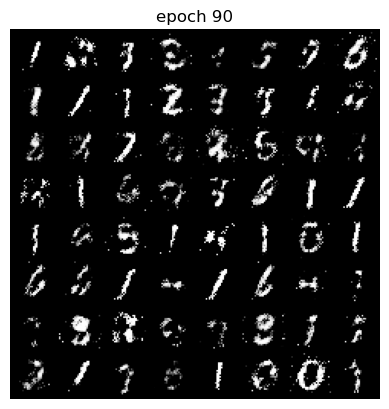

Epoch 90 of 100
Generator loss: 2.41892743, Discriminator loss: 0.91046858


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9200, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.66it/s]

tensor(0.9062, grad_fn=<AddBackward0>)
tensor(0.8957, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.71it/s]

tensor(0.8490, grad_fn=<AddBackward0>)
tensor(0.8344, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:09, 11.43it/s]

tensor(0.8287, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:08, 12.64it/s]

tensor(0.7644, grad_fn=<AddBackward0>)
tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.8137, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 13.78it/s]

tensor(0.7469, grad_fn=<AddBackward0>)
tensor(0.7827, grad_fn=<AddBackward0>)
tensor(0.7292, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:01<00:07, 14.06it/s]

tensor(0.7104, grad_fn=<AddBackward0>)
tensor(0.6927, grad_fn=<AddBackward0>)
tensor(0.7435, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.18it/s]

tensor(0.7271, grad_fn=<AddBackward0>)
tensor(0.7586, grad_fn=<AddBackward0>)
tensor(0.7793, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.57it/s]

tensor(0.7704, grad_fn=<AddBackward0>)
tensor(0.8252, grad_fn=<AddBackward0>)
tensor(0.8378, grad_fn=<AddBackward0>)
tensor(0.8279, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.01it/s]

tensor(0.8630, grad_fn=<AddBackward0>)
tensor(0.8659, grad_fn=<AddBackward0>)
tensor(0.8805, grad_fn=<AddBackward0>)
tensor(0.9367, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 15.11it/s]

tensor(0.9784, grad_fn=<AddBackward0>)
tensor(0.9190, grad_fn=<AddBackward0>)
tensor(1.0028, grad_fn=<AddBackward0>)
tensor(0.9970, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.21it/s]

tensor(1.0027, grad_fn=<AddBackward0>)
tensor(0.9908, grad_fn=<AddBackward0>)
tensor(1.0051, grad_fn=<AddBackward0>)
tensor(1.0195, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.33it/s]

tensor(1.0119, grad_fn=<AddBackward0>)
tensor(0.9967, grad_fn=<AddBackward0>)
tensor(0.9947, grad_fn=<AddBackward0>)
tensor(1.0226, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.13it/s]

tensor(0.9054, grad_fn=<AddBackward0>)
tensor(0.9293, grad_fn=<AddBackward0>)
tensor(0.9741, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:04, 15.00it/s]

tensor(0.9332, grad_fn=<AddBackward0>)
tensor(0.9566, grad_fn=<AddBackward0>)
tensor(0.9471, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.78it/s]

tensor(0.9147, grad_fn=<AddBackward0>)
tensor(0.9095, grad_fn=<AddBackward0>)
tensor(0.9177, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.70it/s]

tensor(0.9604, grad_fn=<AddBackward0>)
tensor(0.9418, grad_fn=<AddBackward0>)
tensor(0.9496, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.75it/s]

tensor(0.9870, grad_fn=<AddBackward0>)
tensor(0.9510, grad_fn=<AddBackward0>)
tensor(0.9560, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.84it/s]

tensor(0.9277, grad_fn=<AddBackward0>)
tensor(0.9182, grad_fn=<AddBackward0>)
tensor(0.8946, grad_fn=<AddBackward0>)
tensor(0.9752, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.10it/s]

tensor(0.9852, grad_fn=<AddBackward0>)
tensor(0.9597, grad_fn=<AddBackward0>)
tensor(0.9629, grad_fn=<AddBackward0>)
tensor(0.9834, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.01it/s]

tensor(0.9254, grad_fn=<AddBackward0>)
tensor(0.9320, grad_fn=<AddBackward0>)
tensor(0.9612, grad_fn=<AddBackward0>)
tensor(0.9018, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.16it/s]

tensor(0.9361, grad_fn=<AddBackward0>)
tensor(0.9230, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.9230, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.29it/s]

tensor(0.8651, grad_fn=<AddBackward0>)
tensor(0.7863, grad_fn=<AddBackward0>)
tensor(0.8330, grad_fn=<AddBackward0>)
tensor(0.8154, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.31it/s]

tensor(0.8240, grad_fn=<AddBackward0>)
tensor(0.8049, grad_fn=<AddBackward0>)
tensor(0.8012, grad_fn=<AddBackward0>)
tensor(0.8141, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.17it/s]

tensor(0.8271, grad_fn=<AddBackward0>)
tensor(0.8076, grad_fn=<AddBackward0>)
tensor(0.8113, grad_fn=<AddBackward0>)
tensor(0.8228, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.21it/s]

tensor(0.8243, grad_fn=<AddBackward0>)
tensor(0.8050, grad_fn=<AddBackward0>)
tensor(0.7721, grad_fn=<AddBackward0>)
tensor(0.8262, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.16it/s]

tensor(0.7910, grad_fn=<AddBackward0>)
tensor(0.8142, grad_fn=<AddBackward0>)
tensor(0.8629, grad_fn=<AddBackward0>)
tensor(0.8351, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.12it/s]

tensor(0.9059, grad_fn=<AddBackward0>)
tensor(0.8298, grad_fn=<AddBackward0>)
tensor(0.8280, grad_fn=<AddBackward0>)
tensor(0.8115, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.21it/s]

tensor(0.8731, grad_fn=<AddBackward0>)
tensor(0.8437, grad_fn=<AddBackward0>)
tensor(0.8331, grad_fn=<AddBackward0>)
tensor(0.8452, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.26it/s]

tensor(0.9285, grad_fn=<AddBackward0>)
tensor(0.9258, grad_fn=<AddBackward0>)
tensor(0.8908, grad_fn=<AddBackward0>)
tensor(0.9224, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.27it/s]

tensor(0.9621, grad_fn=<AddBackward0>)
tensor(0.9943, grad_fn=<AddBackward0>)
tensor(0.9734, grad_fn=<AddBackward0>)
tensor(0.9696, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.29it/s]

tensor(1.0010, grad_fn=<AddBackward0>)
tensor(0.9396, grad_fn=<AddBackward0>)
tensor(0.9522, grad_fn=<AddBackward0>)
tensor(0.9760, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.25it/s]

tensor(1.0077, grad_fn=<AddBackward0>)
tensor(0.9891, grad_fn=<AddBackward0>)
tensor(0.9844, grad_fn=<AddBackward0>)
tensor(1.0112, grad_fn=<AddBackward0>)


118it [00:07, 15.00it/s]                                                          


tensor(1.0019, grad_fn=<AddBackward0>)
tensor(0.9898, grad_fn=<AddBackward0>)
tensor(0.9579, grad_fn=<AddBackward0>)
tensor(0.8782, grad_fn=<AddBackward0>)
Epoch 91 of 100
Generator loss: 2.55828071, Discriminator loss: 0.90036690


  2%|▊                                            | 2/117 [00:00<00:07, 15.24it/s]

tensor(0.9788, grad_fn=<AddBackward0>)
tensor(0.9752, grad_fn=<AddBackward0>)
tensor(0.9767, grad_fn=<AddBackward0>)
tensor(0.8959, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.35it/s]

tensor(0.9289, grad_fn=<AddBackward0>)
tensor(0.8540, grad_fn=<AddBackward0>)
tensor(0.8799, grad_fn=<AddBackward0>)
tensor(0.9165, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.14it/s]

tensor(0.9117, grad_fn=<AddBackward0>)
tensor(0.8957, grad_fn=<AddBackward0>)
tensor(0.9167, grad_fn=<AddBackward0>)
tensor(0.8945, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.19it/s]

tensor(0.9235, grad_fn=<AddBackward0>)
tensor(0.9317, grad_fn=<AddBackward0>)
tensor(0.9500, grad_fn=<AddBackward0>)
tensor(0.8699, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.19it/s]

tensor(0.9556, grad_fn=<AddBackward0>)
tensor(0.9810, grad_fn=<AddBackward0>)
tensor(0.9674, grad_fn=<AddBackward0>)
tensor(0.9908, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.21it/s]

tensor(0.9978, grad_fn=<AddBackward0>)
tensor(0.9654, grad_fn=<AddBackward0>)
tensor(1.0491, grad_fn=<AddBackward0>)
tensor(1.0257, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.24it/s]

tensor(0.9372, grad_fn=<AddBackward0>)
tensor(0.9589, grad_fn=<AddBackward0>)
tensor(0.9451, grad_fn=<AddBackward0>)
tensor(0.9517, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.24it/s]

tensor(0.9235, grad_fn=<AddBackward0>)
tensor(0.8937, grad_fn=<AddBackward0>)
tensor(0.8675, grad_fn=<AddBackward0>)
tensor(0.8703, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.25it/s]

tensor(0.8852, grad_fn=<AddBackward0>)
tensor(0.8174, grad_fn=<AddBackward0>)
tensor(0.8128, grad_fn=<AddBackward0>)
tensor(0.8051, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.31it/s]

tensor(0.7690, grad_fn=<AddBackward0>)
tensor(0.7629, grad_fn=<AddBackward0>)
tensor(0.7574, grad_fn=<AddBackward0>)
tensor(0.7231, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.27it/s]

tensor(0.7283, grad_fn=<AddBackward0>)
tensor(0.7061, grad_fn=<AddBackward0>)
tensor(0.7262, grad_fn=<AddBackward0>)
tensor(0.7207, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.26it/s]

tensor(0.6812, grad_fn=<AddBackward0>)
tensor(0.6617, grad_fn=<AddBackward0>)
tensor(0.6766, grad_fn=<AddBackward0>)
tensor(0.7223, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.33it/s]

tensor(0.7312, grad_fn=<AddBackward0>)
tensor(0.7464, grad_fn=<AddBackward0>)
tensor(0.7391, grad_fn=<AddBackward0>)
tensor(0.7415, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.24it/s]

tensor(0.8362, grad_fn=<AddBackward0>)
tensor(0.7643, grad_fn=<AddBackward0>)
tensor(0.7967, grad_fn=<AddBackward0>)
tensor(0.8535, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.03it/s]

tensor(0.9063, grad_fn=<AddBackward0>)
tensor(0.8559, grad_fn=<AddBackward0>)
tensor(0.8705, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 14.84it/s]

tensor(0.9179, grad_fn=<AddBackward0>)
tensor(0.8879, grad_fn=<AddBackward0>)
tensor(0.9084, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.81it/s]

tensor(0.9666, grad_fn=<AddBackward0>)
tensor(0.9013, grad_fn=<AddBackward0>)
tensor(0.9030, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.78it/s]

tensor(0.8942, grad_fn=<AddBackward0>)
tensor(0.8820, grad_fn=<AddBackward0>)
tensor(0.8722, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.93it/s]

tensor(0.8647, grad_fn=<AddBackward0>)
tensor(0.8654, grad_fn=<AddBackward0>)
tensor(0.8719, grad_fn=<AddBackward0>)
tensor(0.7683, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 14.97it/s]

tensor(0.7905, grad_fn=<AddBackward0>)
tensor(0.8103, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)
tensor(0.7830, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.11it/s]

tensor(0.7837, grad_fn=<AddBackward0>)
tensor(0.7482, grad_fn=<AddBackward0>)
tensor(0.7488, grad_fn=<AddBackward0>)
tensor(0.8164, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.16it/s]

tensor(0.7504, grad_fn=<AddBackward0>)
tensor(0.8066, grad_fn=<AddBackward0>)
tensor(0.8848, grad_fn=<AddBackward0>)
tensor(0.8178, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.20it/s]

tensor(0.8160, grad_fn=<AddBackward0>)
tensor(0.8490, grad_fn=<AddBackward0>)
tensor(0.8991, grad_fn=<AddBackward0>)
tensor(0.9314, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 15.13it/s]

tensor(0.9286, grad_fn=<AddBackward0>)
tensor(0.9782, grad_fn=<AddBackward0>)
tensor(1.0096, grad_fn=<AddBackward0>)
tensor(1.0234, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.05it/s]

tensor(1.0339, grad_fn=<AddBackward0>)
tensor(1.0270, grad_fn=<AddBackward0>)
tensor(1.0450, grad_fn=<AddBackward0>)
tensor(1.0414, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.03it/s]

tensor(0.9888, grad_fn=<AddBackward0>)
tensor(0.9955, grad_fn=<AddBackward0>)
tensor(1.0445, grad_fn=<AddBackward0>)
tensor(0.9648, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.06it/s]

tensor(0.8986, grad_fn=<AddBackward0>)
tensor(0.9543, grad_fn=<AddBackward0>)
tensor(0.9045, grad_fn=<AddBackward0>)
tensor(0.8670, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.08it/s]

tensor(0.8599, grad_fn=<AddBackward0>)
tensor(0.8400, grad_fn=<AddBackward0>)
tensor(0.9022, grad_fn=<AddBackward0>)
tensor(0.7980, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.11it/s]

tensor(0.8269, grad_fn=<AddBackward0>)
tensor(0.7722, grad_fn=<AddBackward0>)
tensor(0.7850, grad_fn=<AddBackward0>)
tensor(0.7536, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.16it/s]

tensor(0.7494, grad_fn=<AddBackward0>)
tensor(0.7812, grad_fn=<AddBackward0>)
tensor(0.7805, grad_fn=<AddBackward0>)
tensor(0.7704, grad_fn=<AddBackward0>)


118it [00:07, 15.23it/s]                                                          


tensor(0.7546, grad_fn=<AddBackward0>)
tensor(0.7793, grad_fn=<AddBackward0>)
Epoch 92 of 100
Generator loss: 2.45565772, Discriminator loss: 0.87317431


  2%|▊                                            | 2/117 [00:00<00:07, 15.19it/s]

tensor(0.7689, grad_fn=<AddBackward0>)
tensor(0.8288, grad_fn=<AddBackward0>)
tensor(0.7893, grad_fn=<AddBackward0>)
tensor(0.8333, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.05it/s]

tensor(0.8921, grad_fn=<AddBackward0>)
tensor(0.8679, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.11it/s]

tensor(0.9621, grad_fn=<AddBackward0>)
tensor(0.9164, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.07it/s]

tensor(0.9489, grad_fn=<AddBackward0>)
tensor(0.9820, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.15it/s]

tensor(0.9755, grad_fn=<AddBackward0>)
tensor(0.9926, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.17it/s]

tensor(1.0354, grad_fn=<AddBackward0>)
tensor(0.9982, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.22it/s]

tensor(1.0997, grad_fn=<AddBackward0>)
tensor(1.0436, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.11it/s]

tensor(0.9932, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.97it/s]

tensor(1.0379, grad_fn=<AddBackward0>)
tensor(1.0000, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.84it/s]

tensor(0.9936, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.84it/s]

tensor(0.9207, grad_fn=<AddBackward0>)
tensor(0.9834, grad_fn=<AddBackward0>)
tensor(0.9213, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.63it/s]

tensor(0.9099, grad_fn=<AddBackward0>)
tensor(0.9152, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.76it/s]

tensor(0.8750, grad_fn=<AddBackward0>)
tensor(0.8873, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.82it/s]

tensor(0.8498, grad_fn=<AddBackward0>)
tensor(0.9106, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.94it/s]

tensor(0.8401, grad_fn=<AddBackward0>)
tensor(0.8119, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.94it/s]

tensor(0.7604, grad_fn=<AddBackward0>)
tensor(0.7344, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.79it/s]

tensor(0.7906, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.45it/s]

tensor(0.7647, grad_fn=<AddBackward0>)
tensor(0.8035, grad_fn=<AddBackward0>)
tensor(0.7355, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.36it/s]

tensor(0.7542, grad_fn=<AddBackward0>)
tensor(0.7466, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.43it/s]

tensor(0.8047, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.66it/s]

tensor(0.8030, grad_fn=<AddBackward0>)
tensor(0.7987, grad_fn=<AddBackward0>)
tensor(0.8458, grad_fn=<AddBackward0>)
tensor(0.9037, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.89it/s]

tensor(0.8850, grad_fn=<AddBackward0>)
tensor(0.8837, grad_fn=<AddBackward0>)
tensor(0.8693, grad_fn=<AddBackward0>)
tensor(0.9498, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.07it/s]

tensor(0.9531, grad_fn=<AddBackward0>)
tensor(0.9693, grad_fn=<AddBackward0>)
tensor(0.9369, grad_fn=<AddBackward0>)
tensor(1.0153, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.11it/s]

tensor(0.9952, grad_fn=<AddBackward0>)
tensor(0.9972, grad_fn=<AddBackward0>)
tensor(0.9286, grad_fn=<AddBackward0>)
tensor(0.9541, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.12it/s]

tensor(0.9765, grad_fn=<AddBackward0>)
tensor(0.8875, grad_fn=<AddBackward0>)
tensor(0.9180, grad_fn=<AddBackward0>)
tensor(0.8918, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.09it/s]

tensor(0.8922, grad_fn=<AddBackward0>)
tensor(0.8383, grad_fn=<AddBackward0>)
tensor(0.8343, grad_fn=<AddBackward0>)
tensor(0.8398, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.08it/s]

tensor(0.8026, grad_fn=<AddBackward0>)
tensor(0.7778, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)
tensor(0.7527, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.10it/s]

tensor(0.7011, grad_fn=<AddBackward0>)
tensor(0.7684, grad_fn=<AddBackward0>)
tensor(0.7375, grad_fn=<AddBackward0>)
tensor(0.7229, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.14it/s]

tensor(0.6938, grad_fn=<AddBackward0>)
tensor(0.7165, grad_fn=<AddBackward0>)
tensor(0.7459, grad_fn=<AddBackward0>)
tensor(0.7538, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.14it/s]

tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.7937, grad_fn=<AddBackward0>)
tensor(0.7783, grad_fn=<AddBackward0>)
tensor(0.7789, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.11it/s]

tensor(0.8100, grad_fn=<AddBackward0>)
tensor(0.8224, grad_fn=<AddBackward0>)
tensor(0.8151, grad_fn=<AddBackward0>)
tensor(0.8852, grad_fn=<AddBackward0>)

 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.10it/s]


tensor(0.8729, grad_fn=<AddBackward0>)
tensor(0.9231, grad_fn=<AddBackward0>)
tensor(1.0700, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.07it/s]

tensor(1.0530, grad_fn=<AddBackward0>)
tensor(1.1011, grad_fn=<AddBackward0>)
tensor(1.1253, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.05it/s]

tensor(1.1100, grad_fn=<AddBackward0>)
tensor(1.0951, grad_fn=<AddBackward0>)
tensor(1.1209, grad_fn=<AddBackward0>)
tensor(1.1144, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.08it/s]

tensor(1.0422, grad_fn=<AddBackward0>)
tensor(1.1252, grad_fn=<AddBackward0>)
tensor(1.0920, grad_fn=<AddBackward0>)
tensor(1.0038, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.98it/s]

tensor(1.0153, grad_fn=<AddBackward0>)
tensor(0.9813, grad_fn=<AddBackward0>)
tensor(0.9602, grad_fn=<AddBackward0>)
tensor(0.9752, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.05it/s]

tensor(0.9632, grad_fn=<AddBackward0>)
tensor(0.9150, grad_fn=<AddBackward0>)
tensor(0.9452, grad_fn=<AddBackward0>)
tensor(0.8872, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.27it/s]

tensor(0.8446, grad_fn=<AddBackward0>)
tensor(0.8761, grad_fn=<AddBackward0>)
tensor(0.8329, grad_fn=<AddBackward0>)
tensor(0.8286, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.23it/s]

tensor(0.7768, grad_fn=<AddBackward0>)
tensor(0.7896, grad_fn=<AddBackward0>)
tensor(0.8054, grad_fn=<AddBackward0>)
tensor(0.7592, grad_fn=<AddBackward0>)


118it [00:07, 15.09it/s]                                                          


tensor(0.7744, grad_fn=<AddBackward0>)
tensor(0.7823, grad_fn=<AddBackward0>)
tensor(0.7487, grad_fn=<AddBackward0>)
tensor(0.7778, grad_fn=<AddBackward0>)
Epoch 93 of 100
Generator loss: 2.40941930, Discriminator loss: 0.89672959


  2%|▊                                            | 2/117 [00:00<00:07, 15.20it/s]

tensor(0.7583, grad_fn=<AddBackward0>)
tensor(0.8136, grad_fn=<AddBackward0>)
tensor(0.7766, grad_fn=<AddBackward0>)
tensor(0.7853, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.12it/s]

tensor(0.7967, grad_fn=<AddBackward0>)
tensor(0.8496, grad_fn=<AddBackward0>)
tensor(0.8136, grad_fn=<AddBackward0>)
tensor(0.8651, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.24it/s]

tensor(0.9342, grad_fn=<AddBackward0>)
tensor(0.9195, grad_fn=<AddBackward0>)
tensor(0.9359, grad_fn=<AddBackward0>)
tensor(0.9909, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.13it/s]

tensor(0.9782, grad_fn=<AddBackward0>)
tensor(1.0042, grad_fn=<AddBackward0>)
tensor(1.0163, grad_fn=<AddBackward0>)
tensor(1.0662, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.17it/s]

tensor(1.1633, grad_fn=<AddBackward0>)
tensor(1.0654, grad_fn=<AddBackward0>)
tensor(1.1093, grad_fn=<AddBackward0>)
tensor(1.0714, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.18it/s]

tensor(1.0476, grad_fn=<AddBackward0>)
tensor(1.1274, grad_fn=<AddBackward0>)
tensor(1.0210, grad_fn=<AddBackward0>)
tensor(1.0476, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.23it/s]

tensor(1.0138, grad_fn=<AddBackward0>)
tensor(1.0406, grad_fn=<AddBackward0>)
tensor(0.9697, grad_fn=<AddBackward0>)
tensor(0.9956, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.21it/s]

tensor(0.9352, grad_fn=<AddBackward0>)
tensor(0.9057, grad_fn=<AddBackward0>)
tensor(0.9188, grad_fn=<AddBackward0>)
tensor(0.9323, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.17it/s]

tensor(0.8473, grad_fn=<AddBackward0>)
tensor(0.9089, grad_fn=<AddBackward0>)
tensor(0.8383, grad_fn=<AddBackward0>)
tensor(0.8084, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.26it/s]

tensor(0.8162, grad_fn=<AddBackward0>)
tensor(0.8022, grad_fn=<AddBackward0>)
tensor(0.8004, grad_fn=<AddBackward0>)
tensor(0.7946, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.98it/s]

tensor(0.7263, grad_fn=<AddBackward0>)
tensor(0.7527, grad_fn=<AddBackward0>)
tensor(0.6922, grad_fn=<AddBackward0>)
tensor(0.7229, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.02it/s]

tensor(0.7246, grad_fn=<AddBackward0>)
tensor(0.6898, grad_fn=<AddBackward0>)
tensor(0.7043, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.91it/s]

tensor(0.6987, grad_fn=<AddBackward0>)
tensor(0.6652, grad_fn=<AddBackward0>)
tensor(0.7299, grad_fn=<AddBackward0>)
tensor(0.7192, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.09it/s]

tensor(0.7324, grad_fn=<AddBackward0>)
tensor(0.7210, grad_fn=<AddBackward0>)
tensor(0.7378, grad_fn=<AddBackward0>)
tensor(0.7474, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.13it/s]

tensor(0.7910, grad_fn=<AddBackward0>)
tensor(0.8517, grad_fn=<AddBackward0>)
tensor(0.8766, grad_fn=<AddBackward0>)
tensor(0.8633, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.14it/s]

tensor(0.8201, grad_fn=<AddBackward0>)
tensor(0.9158, grad_fn=<AddBackward0>)
tensor(0.9249, grad_fn=<AddBackward0>)
tensor(1.0098, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.09it/s]

tensor(0.9297, grad_fn=<AddBackward0>)
tensor(0.9611, grad_fn=<AddBackward0>)
tensor(1.0192, grad_fn=<AddBackward0>)
tensor(1.0560, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.01it/s]

tensor(1.0321, grad_fn=<AddBackward0>)
tensor(0.9980, grad_fn=<AddBackward0>)
tensor(1.0443, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:03, 14.97it/s]

tensor(0.9925, grad_fn=<AddBackward0>)
tensor(0.9725, grad_fn=<AddBackward0>)
tensor(1.0619, grad_fn=<AddBackward0>)
tensor(1.0620, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.03it/s]

tensor(1.0262, grad_fn=<AddBackward0>)
tensor(1.0272, grad_fn=<AddBackward0>)
tensor(1.0084, grad_fn=<AddBackward0>)
tensor(0.9371, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.04it/s]

tensor(0.9986, grad_fn=<AddBackward0>)
tensor(0.9845, grad_fn=<AddBackward0>)
tensor(0.9078, grad_fn=<AddBackward0>)
tensor(0.8719, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.15it/s]

tensor(0.8472, grad_fn=<AddBackward0>)
tensor(0.8603, grad_fn=<AddBackward0>)
tensor(0.8807, grad_fn=<AddBackward0>)
tensor(0.8236, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 15.13it/s]

tensor(0.8596, grad_fn=<AddBackward0>)
tensor(0.8263, grad_fn=<AddBackward0>)
tensor(0.8210, grad_fn=<AddBackward0>)
tensor(0.8069, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.28it/s]

tensor(0.7943, grad_fn=<AddBackward0>)
tensor(0.7447, grad_fn=<AddBackward0>)
tensor(0.7790, grad_fn=<AddBackward0>)
tensor(0.7231, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.23it/s]

tensor(0.7547, grad_fn=<AddBackward0>)
tensor(0.7641, grad_fn=<AddBackward0>)
tensor(0.7475, grad_fn=<AddBackward0>)
tensor(0.7538, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.16it/s]

tensor(0.8020, grad_fn=<AddBackward0>)
tensor(0.8212, grad_fn=<AddBackward0>)
tensor(0.7951, grad_fn=<AddBackward0>)
tensor(0.8500, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.05it/s]

tensor(0.8783, grad_fn=<AddBackward0>)
tensor(0.9010, grad_fn=<AddBackward0>)
tensor(0.9239, grad_fn=<AddBackward0>)
tensor(0.9699, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.10it/s]

tensor(0.9881, grad_fn=<AddBackward0>)
tensor(0.9222, grad_fn=<AddBackward0>)
tensor(0.9813, grad_fn=<AddBackward0>)
tensor(0.9735, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.08it/s]

tensor(0.9835, grad_fn=<AddBackward0>)
tensor(0.9829, grad_fn=<AddBackward0>)
tensor(0.9245, grad_fn=<AddBackward0>)
tensor(0.9259, grad_fn=<AddBackward0>)


118it [00:07, 15.21it/s]                                                          


tensor(0.9369, grad_fn=<AddBackward0>)
tensor(0.9263, grad_fn=<AddBackward0>)
tensor(0.9109, grad_fn=<AddBackward0>)
tensor(0.9265, grad_fn=<AddBackward0>)
Epoch 94 of 100
Generator loss: 2.38389492, Discriminator loss: 0.89833277


  2%|▊                                            | 2/117 [00:00<00:07, 15.45it/s]

tensor(0.8940, grad_fn=<AddBackward0>)
tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8605, grad_fn=<AddBackward0>)
tensor(0.8618, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.12it/s]

tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.8456, grad_fn=<AddBackward0>)
tensor(0.8577, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.12it/s]

tensor(0.8647, grad_fn=<AddBackward0>)
tensor(0.8123, grad_fn=<AddBackward0>)
tensor(0.8627, grad_fn=<AddBackward0>)
tensor(0.8677, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.10it/s]

tensor(0.8501, grad_fn=<AddBackward0>)
tensor(0.8714, grad_fn=<AddBackward0>)
tensor(0.8359, grad_fn=<AddBackward0>)
tensor(0.9164, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.95it/s]

tensor(0.8753, grad_fn=<AddBackward0>)
tensor(0.9223, grad_fn=<AddBackward0>)
tensor(0.9048, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.76it/s]

tensor(0.9115, grad_fn=<AddBackward0>)
tensor(0.9348, grad_fn=<AddBackward0>)
tensor(0.9120, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.74it/s]

tensor(0.9209, grad_fn=<AddBackward0>)
tensor(0.9848, grad_fn=<AddBackward0>)
tensor(0.9493, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.50it/s]

tensor(0.9617, grad_fn=<AddBackward0>)
tensor(0.9504, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:07, 12.10it/s]

tensor(1.0207, grad_fn=<AddBackward0>)
tensor(0.9969, grad_fn=<AddBackward0>)
tensor(0.9302, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:06, 12.82it/s]

tensor(0.9703, grad_fn=<AddBackward0>)
tensor(1.0137, grad_fn=<AddBackward0>)
tensor(0.9404, grad_fn=<AddBackward0>)
tensor(0.9513, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 13.90it/s]

tensor(0.9426, grad_fn=<AddBackward0>)
tensor(0.9144, grad_fn=<AddBackward0>)
tensor(0.9235, grad_fn=<AddBackward0>)
tensor(0.8639, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.53it/s]

tensor(0.9578, grad_fn=<AddBackward0>)
tensor(0.8834, grad_fn=<AddBackward0>)
tensor(0.8610, grad_fn=<AddBackward0>)
tensor(0.8258, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:04, 14.80it/s]

tensor(0.8552, grad_fn=<AddBackward0>)
tensor(0.8488, grad_fn=<AddBackward0>)
tensor(0.8369, grad_fn=<AddBackward0>)
tensor(0.8003, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.07it/s]

tensor(0.7970, grad_fn=<AddBackward0>)
tensor(0.8178, grad_fn=<AddBackward0>)
tensor(0.8116, grad_fn=<AddBackward0>)
tensor(0.7798, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.05it/s]

tensor(0.7971, grad_fn=<AddBackward0>)
tensor(0.7867, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)
tensor(0.8678, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.14it/s]

tensor(0.8435, grad_fn=<AddBackward0>)
tensor(0.9258, grad_fn=<AddBackward0>)
tensor(0.8600, grad_fn=<AddBackward0>)
tensor(0.9680, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.08it/s]

tensor(0.9125, grad_fn=<AddBackward0>)
tensor(0.9448, grad_fn=<AddBackward0>)
tensor(1.0212, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.05it/s]

tensor(1.0059, grad_fn=<AddBackward0>)
tensor(1.0732, grad_fn=<AddBackward0>)
tensor(1.0051, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 14.83it/s]

tensor(0.9678, grad_fn=<AddBackward0>)
tensor(1.0631, grad_fn=<AddBackward0>)
tensor(1.0069, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 14.77it/s]

tensor(0.9993, grad_fn=<AddBackward0>)
tensor(1.0254, grad_fn=<AddBackward0>)
tensor(1.0012, grad_fn=<AddBackward0>)
tensor(0.9838, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:05<00:02, 15.05it/s]

tensor(0.9610, grad_fn=<AddBackward0>)
tensor(0.9402, grad_fn=<AddBackward0>)
tensor(0.9798, grad_fn=<AddBackward0>)
tensor(0.9004, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 14.90it/s]

tensor(0.8981, grad_fn=<AddBackward0>)
tensor(0.8477, grad_fn=<AddBackward0>)
tensor(0.8430, grad_fn=<AddBackward0>)
tensor(0.8662, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.03it/s]

tensor(0.8272, grad_fn=<AddBackward0>)
tensor(0.8035, grad_fn=<AddBackward0>)
tensor(0.7933, grad_fn=<AddBackward0>)
tensor(0.7756, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.12it/s]

tensor(0.7961, grad_fn=<AddBackward0>)
tensor(0.7507, grad_fn=<AddBackward0>)
tensor(0.8178, grad_fn=<AddBackward0>)
tensor(0.7383, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.08it/s]

tensor(0.7415, grad_fn=<AddBackward0>)
tensor(0.7229, grad_fn=<AddBackward0>)
tensor(0.7104, grad_fn=<AddBackward0>)
tensor(0.7102, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.15it/s]

tensor(0.7416, grad_fn=<AddBackward0>)
tensor(0.7444, grad_fn=<AddBackward0>)
tensor(0.7605, grad_fn=<AddBackward0>)
tensor(0.7899, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.17it/s]

tensor(0.7695, grad_fn=<AddBackward0>)
tensor(0.8109, grad_fn=<AddBackward0>)
tensor(0.7810, grad_fn=<AddBackward0>)
tensor(0.8527, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.10it/s]

tensor(0.8708, grad_fn=<AddBackward0>)
tensor(0.8558, grad_fn=<AddBackward0>)
tensor(0.8807, grad_fn=<AddBackward0>)
tensor(0.9452, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.17it/s]

tensor(0.9875, grad_fn=<AddBackward0>)
tensor(0.9759, grad_fn=<AddBackward0>)
tensor(0.9554, grad_fn=<AddBackward0>)
tensor(0.9699, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.18it/s]

tensor(0.9799, grad_fn=<AddBackward0>)
tensor(0.9722, grad_fn=<AddBackward0>)
tensor(0.9542, grad_fn=<AddBackward0>)
tensor(1.0148, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.06it/s]

tensor(0.9527, grad_fn=<AddBackward0>)
tensor(0.9466, grad_fn=<AddBackward0>)
tensor(0.9756, grad_fn=<AddBackward0>)
tensor(0.9290, grad_fn=<AddBackward0>)


118it [00:07, 14.88it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9686, grad_fn=<AddBackward0>)
tensor(0.9436, grad_fn=<AddBackward0>)


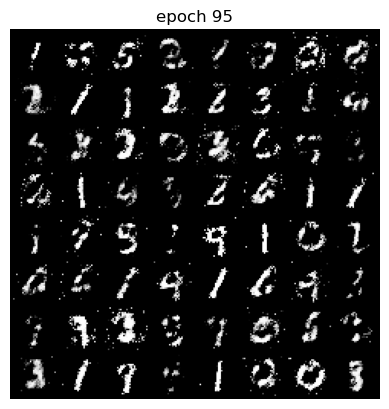

Epoch 95 of 100
Generator loss: 2.31313205, Discriminator loss: 0.89801782


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9258, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 14.71it/s]

tensor(0.8911, grad_fn=<AddBackward0>)
tensor(0.9019, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 14.67it/s]

tensor(0.9178, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.85it/s]

tensor(0.8767, grad_fn=<AddBackward0>)
tensor(0.8091, grad_fn=<AddBackward0>)
tensor(0.8315, grad_fn=<AddBackward0>)
tensor(0.8156, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 14.87it/s]

tensor(0.8251, grad_fn=<AddBackward0>)
tensor(0.8769, grad_fn=<AddBackward0>)
tensor(0.7770, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.90it/s]

tensor(0.8606, grad_fn=<AddBackward0>)
tensor(0.7592, grad_fn=<AddBackward0>)
tensor(0.8267, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.02it/s]

tensor(0.8391, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.10it/s]

tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.8217, grad_fn=<AddBackward0>)
tensor(0.8466, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.13it/s]

tensor(0.8547, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.15it/s]

tensor(0.8291, grad_fn=<AddBackward0>)
tensor(0.8316, grad_fn=<AddBackward0>)
tensor(0.8663, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.18it/s]

tensor(0.8486, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.21it/s]

tensor(0.8875, grad_fn=<AddBackward0>)
tensor(0.9080, grad_fn=<AddBackward0>)
tensor(0.9110, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:05, 15.28it/s]

tensor(0.9178, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.20it/s]

tensor(0.9694, grad_fn=<AddBackward0>)
tensor(0.9249, grad_fn=<AddBackward0>)
tensor(0.9267, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.27it/s]

tensor(0.9634, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.21it/s]

tensor(0.9826, grad_fn=<AddBackward0>)
tensor(0.9418, grad_fn=<AddBackward0>)
tensor(0.9738, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.23it/s]

tensor(0.9458, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.14it/s]

tensor(0.9086, grad_fn=<AddBackward0>)
tensor(0.9307, grad_fn=<AddBackward0>)
tensor(0.8747, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.18it/s]

tensor(0.9401, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.19it/s]

tensor(0.8860, grad_fn=<AddBackward0>)
tensor(0.9003, grad_fn=<AddBackward0>)
tensor(0.8929, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.09it/s]

tensor(0.8870, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.13it/s]

tensor(0.8692, grad_fn=<AddBackward0>)
tensor(0.8251, grad_fn=<AddBackward0>)
tensor(0.8017, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 15.13it/s]

tensor(0.8098, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 15.10it/s]

tensor(0.7926, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)
tensor(0.7479, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 15.12it/s]

tensor(0.7929, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.19it/s]

tensor(0.7600, grad_fn=<AddBackward0>)
tensor(0.7710, grad_fn=<AddBackward0>)
tensor(0.8066, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 15.19it/s]

tensor(0.8018, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.16it/s]

tensor(0.7878, grad_fn=<AddBackward0>)
tensor(0.8482, grad_fn=<AddBackward0>)
tensor(0.8959, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.17it/s]

tensor(0.8718, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.14it/s]

tensor(0.8815, grad_fn=<AddBackward0>)
tensor(0.9036, grad_fn=<AddBackward0>)
tensor(0.8698, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.06it/s]

tensor(0.9243, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.11it/s]

tensor(0.9286, grad_fn=<AddBackward0>)
tensor(1.0006, grad_fn=<AddBackward0>)
tensor(0.9971, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.17it/s]

tensor(1.0300, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.14it/s]

tensor(1.0174, grad_fn=<AddBackward0>)
tensor(1.0082, grad_fn=<AddBackward0>)
tensor(1.0258, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.13it/s]

tensor(0.9762, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.10it/s]

tensor(1.0095, grad_fn=<AddBackward0>)
tensor(0.9551, grad_fn=<AddBackward0>)
tensor(0.9798, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.10it/s]

tensor(0.9503, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.03it/s]

tensor(0.9696, grad_fn=<AddBackward0>)
tensor(0.9147, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.01it/s]

tensor(0.9146, grad_fn=<AddBackward0>)
tensor(0.8845, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.07it/s]

tensor(0.8645, grad_fn=<AddBackward0>)
tensor(0.8379, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 15.03it/s]

tensor(0.8492, grad_fn=<AddBackward0>)
tensor(0.7886, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.01it/s]

tensor(0.8111, grad_fn=<AddBackward0>)
tensor(0.7837, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.05it/s]

tensor(0.7997, grad_fn=<AddBackward0>)
tensor(0.7642, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.96it/s]

tensor(0.7633, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:05<00:01, 14.36it/s]

tensor(0.7144, grad_fn=<AddBackward0>)
tensor(0.7359, grad_fn=<AddBackward0>)
tensor(0.7525, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.32it/s]

tensor(0.7474, grad_fn=<AddBackward0>)
tensor(0.7012, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.47it/s]

tensor(0.7488, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 14.62it/s]

tensor(0.7746, grad_fn=<AddBackward0>)
tensor(0.7946, grad_fn=<AddBackward0>)
tensor(0.8036, grad_fn=<AddBackward0>)
tensor(0.8335, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 14.93it/s]

tensor(0.9712, grad_fn=<AddBackward0>)
tensor(0.9790, grad_fn=<AddBackward0>)
tensor(0.9523, grad_fn=<AddBackward0>)
tensor(1.0607, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 14.98it/s]

tensor(1.0141, grad_fn=<AddBackward0>)
tensor(1.1374, grad_fn=<AddBackward0>)
tensor(1.0945, grad_fn=<AddBackward0>)
tensor(1.1164, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.01it/s]

tensor(1.1358, grad_fn=<AddBackward0>)
tensor(1.0587, grad_fn=<AddBackward0>)
tensor(1.0473, grad_fn=<AddBackward0>)
tensor(0.9627, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.06it/s]

tensor(1.0358, grad_fn=<AddBackward0>)
tensor(0.9241, grad_fn=<AddBackward0>)
tensor(0.9419, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.11it/s]

tensor(0.8513, grad_fn=<AddBackward0>)
tensor(0.8724, grad_fn=<AddBackward0>)
tensor(0.8443, grad_fn=<AddBackward0>)
tensor(0.8392, grad_fn=<AddBackward0>)


118it [00:07, 15.12it/s]                                                          


tensor(0.7259, grad_fn=<AddBackward0>)
Epoch 96 of 100
Generator loss: 2.40576839, Discriminator loss: 0.89260221


  2%|▊                                            | 2/117 [00:00<00:07, 15.31it/s]

tensor(0.8071, grad_fn=<AddBackward0>)
tensor(0.8023, grad_fn=<AddBackward0>)
tensor(0.7776, grad_fn=<AddBackward0>)
tensor(0.7398, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.27it/s]

tensor(0.7543, grad_fn=<AddBackward0>)
tensor(0.7240, grad_fn=<AddBackward0>)
tensor(0.7052, grad_fn=<AddBackward0>)
tensor(0.7178, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.17it/s]

tensor(0.6905, grad_fn=<AddBackward0>)
tensor(0.6842, grad_fn=<AddBackward0>)
tensor(0.7116, grad_fn=<AddBackward0>)
tensor(0.7132, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.01it/s]

tensor(0.7183, grad_fn=<AddBackward0>)
tensor(0.6789, grad_fn=<AddBackward0>)
tensor(0.7237, grad_fn=<AddBackward0>)
tensor(0.7347, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 14.99it/s]

tensor(0.7296, grad_fn=<AddBackward0>)
tensor(0.8045, grad_fn=<AddBackward0>)
tensor(0.7822, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 14.80it/s]

tensor(0.8457, grad_fn=<AddBackward0>)
tensor(0.8666, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 14.82it/s]

tensor(0.8689, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.77it/s]

tensor(0.8354, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.8901, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 14.70it/s]

tensor(0.9326, grad_fn=<AddBackward0>)
tensor(0.9473, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:06, 14.68it/s]

tensor(0.9589, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:02<00:05, 14.54it/s]

tensor(0.9833, grad_fn=<AddBackward0>)
tensor(0.9554, grad_fn=<AddBackward0>)
tensor(1.0574, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.45it/s]

tensor(1.0328, grad_fn=<AddBackward0>)
tensor(0.9832, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.02it/s]

tensor(0.9726, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 13.96it/s]

tensor(1.0097, grad_fn=<AddBackward0>)
tensor(0.9565, grad_fn=<AddBackward0>)
tensor(0.9875, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 13.85it/s]

tensor(0.9689, grad_fn=<AddBackward0>)
tensor(0.8996, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 13.89it/s]

tensor(0.9497, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:05, 14.01it/s]

tensor(1.0169, grad_fn=<AddBackward0>)
tensor(0.9352, grad_fn=<AddBackward0>)
tensor(0.9463, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:03<00:05, 12.65it/s]

tensor(0.8822, grad_fn=<AddBackward0>)
tensor(0.8693, grad_fn=<AddBackward0>)
tensor(0.8720, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:05, 12.76it/s]

tensor(0.8411, grad_fn=<AddBackward0>)
tensor(0.8554, grad_fn=<AddBackward0>)
tensor(0.8075, grad_fn=<AddBackward0>)
tensor(0.7773, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 13.82it/s]

tensor(0.8130, grad_fn=<AddBackward0>)
tensor(0.8180, grad_fn=<AddBackward0>)
tensor(0.8034, grad_fn=<AddBackward0>)
tensor(0.7925, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.46it/s]

tensor(0.8071, grad_fn=<AddBackward0>)
tensor(0.7944, grad_fn=<AddBackward0>)
tensor(0.8186, grad_fn=<AddBackward0>)
tensor(0.7483, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.79it/s]

tensor(0.7784, grad_fn=<AddBackward0>)
tensor(0.7962, grad_fn=<AddBackward0>)
tensor(0.8021, grad_fn=<AddBackward0>)
tensor(0.8328, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.04it/s]

tensor(0.8231, grad_fn=<AddBackward0>)
tensor(0.8727, grad_fn=<AddBackward0>)
tensor(0.8682, grad_fn=<AddBackward0>)
tensor(0.9072, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.12it/s]

tensor(0.8917, grad_fn=<AddBackward0>)
tensor(0.9414, grad_fn=<AddBackward0>)
tensor(0.9824, grad_fn=<AddBackward0>)
tensor(0.9386, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.20it/s]

tensor(1.0230, grad_fn=<AddBackward0>)
tensor(1.0314, grad_fn=<AddBackward0>)
tensor(1.0860, grad_fn=<AddBackward0>)
tensor(1.0829, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.17it/s]

tensor(1.1169, grad_fn=<AddBackward0>)
tensor(1.0904, grad_fn=<AddBackward0>)
tensor(1.1023, grad_fn=<AddBackward0>)
tensor(1.0408, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.24it/s]

tensor(1.0524, grad_fn=<AddBackward0>)
tensor(1.0136, grad_fn=<AddBackward0>)
tensor(1.0307, grad_fn=<AddBackward0>)
tensor(1.0354, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 15.16it/s]

tensor(0.9900, grad_fn=<AddBackward0>)
tensor(0.9489, grad_fn=<AddBackward0>)
tensor(0.9642, grad_fn=<AddBackward0>)
tensor(0.9330, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:06<00:01, 15.16it/s]

tensor(0.9074, grad_fn=<AddBackward0>)
tensor(0.9026, grad_fn=<AddBackward0>)
tensor(0.9248, grad_fn=<AddBackward0>)
tensor(0.8924, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 15.15it/s]

tensor(0.8352, grad_fn=<AddBackward0>)
tensor(0.8812, grad_fn=<AddBackward0>)
tensor(0.8330, grad_fn=<AddBackward0>)
tensor(0.7732, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.14it/s]

tensor(0.8089, grad_fn=<AddBackward0>)
tensor(0.8059, grad_fn=<AddBackward0>)
tensor(0.8221, grad_fn=<AddBackward0>)
tensor(0.7744, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.09it/s]

tensor(0.8018, grad_fn=<AddBackward0>)
tensor(0.7746, grad_fn=<AddBackward0>)
tensor(0.7930, grad_fn=<AddBackward0>)
tensor(0.7818, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:07<00:00, 15.11it/s]

tensor(0.7331, grad_fn=<AddBackward0>)
tensor(0.7530, grad_fn=<AddBackward0>)
tensor(0.7207, grad_fn=<AddBackward0>)
tensor(0.7734, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.08it/s]

tensor(0.7830, grad_fn=<AddBackward0>)
tensor(0.7557, grad_fn=<AddBackward0>)
tensor(0.7953, grad_fn=<AddBackward0>)
tensor(0.8135, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.13it/s]

tensor(0.8210, grad_fn=<AddBackward0>)
tensor(0.8346, grad_fn=<AddBackward0>)
tensor(0.9008, grad_fn=<AddBackward0>)
tensor(0.9471, grad_fn=<AddBackward0>)


 99%|██████████████████████████████████████████▋| 116/117 [00:07<00:00, 15.15it/s]

tensor(0.8994, grad_fn=<AddBackward0>)
tensor(0.9425, grad_fn=<AddBackward0>)
tensor(0.9877, grad_fn=<AddBackward0>)


118it [00:07, 14.78it/s]                                                          


tensor(0.8850, grad_fn=<AddBackward0>)
Epoch 97 of 100
Generator loss: 2.52746844, Discriminator loss: 0.87684077


  2%|▊                                            | 2/117 [00:00<00:07, 14.97it/s]

tensor(1.0384, grad_fn=<AddBackward0>)
tensor(1.0381, grad_fn=<AddBackward0>)
tensor(1.0639, grad_fn=<AddBackward0>)
tensor(1.0683, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.12it/s]

tensor(1.0207, grad_fn=<AddBackward0>)
tensor(1.0841, grad_fn=<AddBackward0>)
tensor(1.0578, grad_fn=<AddBackward0>)
tensor(1.0680, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.03it/s]

tensor(1.0102, grad_fn=<AddBackward0>)
tensor(0.9925, grad_fn=<AddBackward0>)
tensor(0.9709, grad_fn=<AddBackward0>)
tensor(0.8804, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.07it/s]

tensor(0.9157, grad_fn=<AddBackward0>)
tensor(0.9100, grad_fn=<AddBackward0>)
tensor(0.9111, grad_fn=<AddBackward0>)
tensor(0.8732, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.04it/s]

tensor(0.8791, grad_fn=<AddBackward0>)
tensor(0.8149, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.03it/s]

tensor(0.8174, grad_fn=<AddBackward0>)
tensor(0.8739, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.10it/s]

tensor(0.8055, grad_fn=<AddBackward0>)
tensor(0.8231, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.11it/s]

tensor(0.8009, grad_fn=<AddBackward0>)
tensor(0.8536, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.12it/s]

tensor(0.8992, grad_fn=<AddBackward0>)
tensor(0.8607, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.11it/s]

tensor(0.8604, grad_fn=<AddBackward0>)
tensor(0.9037, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.16it/s]

tensor(0.9327, grad_fn=<AddBackward0>)
tensor(0.9397, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 15.02it/s]

tensor(0.9183, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.03it/s]

tensor(1.0081, grad_fn=<AddBackward0>)
tensor(0.9808, grad_fn=<AddBackward0>)
tensor(0.9728, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.01it/s]

tensor(0.9530, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.02it/s]

tensor(1.0804, grad_fn=<AddBackward0>)
tensor(1.0568, grad_fn=<AddBackward0>)
tensor(0.9854, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.04it/s]

tensor(1.0705, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.04it/s]

tensor(0.9569, grad_fn=<AddBackward0>)
tensor(0.9604, grad_fn=<AddBackward0>)
tensor(0.9521, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.04it/s]

tensor(0.9415, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.00it/s]

tensor(0.9014, grad_fn=<AddBackward0>)
tensor(0.9265, grad_fn=<AddBackward0>)
tensor(0.9476, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.66it/s]

tensor(0.8519, grad_fn=<AddBackward0>)
tensor(0.8616, grad_fn=<AddBackward0>)
tensor(0.8761, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.72it/s]

tensor(0.8408, grad_fn=<AddBackward0>)
tensor(0.7837, grad_fn=<AddBackward0>)
tensor(0.8128, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.69it/s]

tensor(0.8300, grad_fn=<AddBackward0>)
tensor(0.8132, grad_fn=<AddBackward0>)
tensor(0.7999, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:04, 14.69it/s]

tensor(0.7702, grad_fn=<AddBackward0>)
tensor(0.7638, grad_fn=<AddBackward0>)
tensor(0.7627, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 14.82it/s]

tensor(0.7655, grad_fn=<AddBackward0>)
tensor(0.7635, grad_fn=<AddBackward0>)
tensor(0.7904, grad_fn=<AddBackward0>)
tensor(0.7914, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 14.99it/s]

tensor(0.7538, grad_fn=<AddBackward0>)
tensor(0.7663, grad_fn=<AddBackward0>)
tensor(0.8208, grad_fn=<AddBackward0>)
tensor(0.8236, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.05it/s]

tensor(0.9038, grad_fn=<AddBackward0>)
tensor(0.8722, grad_fn=<AddBackward0>)
tensor(0.8541, grad_fn=<AddBackward0>)
tensor(0.8756, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.00it/s]

tensor(0.9856, grad_fn=<AddBackward0>)
tensor(0.9449, grad_fn=<AddBackward0>)
tensor(0.9481, grad_fn=<AddBackward0>)
tensor(1.0387, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.03it/s]

tensor(1.1008, grad_fn=<AddBackward0>)
tensor(1.0477, grad_fn=<AddBackward0>)
tensor(1.0824, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.96it/s]

tensor(1.1156, grad_fn=<AddBackward0>)
tensor(1.1059, grad_fn=<AddBackward0>)
tensor(1.0461, grad_fn=<AddBackward0>)
tensor(1.0313, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.96it/s]

tensor(1.0647, grad_fn=<AddBackward0>)
tensor(1.0555, grad_fn=<AddBackward0>)
tensor(1.0333, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 15.06it/s]

tensor(1.0296, grad_fn=<AddBackward0>)
tensor(1.0408, grad_fn=<AddBackward0>)
tensor(1.0228, grad_fn=<AddBackward0>)
tensor(0.9936, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.09it/s]

tensor(0.9440, grad_fn=<AddBackward0>)
tensor(0.9307, grad_fn=<AddBackward0>)
tensor(0.9163, grad_fn=<AddBackward0>)
tensor(0.9196, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 15.05it/s]

tensor(0.9042, grad_fn=<AddBackward0>)
tensor(0.8158, grad_fn=<AddBackward0>)
tensor(0.8166, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.08it/s]

tensor(0.8119, grad_fn=<AddBackward0>)
tensor(0.8115, grad_fn=<AddBackward0>)
tensor(0.8480, grad_fn=<AddBackward0>)
tensor(0.8602, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.09it/s]

tensor(0.8127, grad_fn=<AddBackward0>)
tensor(0.8143, grad_fn=<AddBackward0>)
tensor(0.8584, grad_fn=<AddBackward0>)
tensor(0.8355, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.10it/s]

tensor(0.8589, grad_fn=<AddBackward0>)
tensor(0.9016, grad_fn=<AddBackward0>)
tensor(0.8842, grad_fn=<AddBackward0>)
tensor(0.8878, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.22it/s]

tensor(0.9786, grad_fn=<AddBackward0>)
tensor(0.9490, grad_fn=<AddBackward0>)
tensor(0.9575, grad_fn=<AddBackward0>)
tensor(0.9434, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.17it/s]

tensor(1.0133, grad_fn=<AddBackward0>)
tensor(0.9915, grad_fn=<AddBackward0>)
tensor(0.9804, grad_fn=<AddBackward0>)
tensor(1.0038, grad_fn=<AddBackward0>)


118it [00:07, 15.09it/s]                                                          


tensor(0.9462, grad_fn=<AddBackward0>)
tensor(0.9729, grad_fn=<AddBackward0>)
tensor(1.0831, grad_fn=<AddBackward0>)
Epoch 98 of 100
Generator loss: 2.24404192, Discriminator loss: 0.93219525


  0%|                                                     | 0/117 [00:00<?, ?it/s]

tensor(0.9957, grad_fn=<AddBackward0>)


  2%|▊                                            | 2/117 [00:00<00:07, 15.32it/s]

tensor(1.0325, grad_fn=<AddBackward0>)
tensor(0.9448, grad_fn=<AddBackward0>)
tensor(0.9115, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.10it/s]

tensor(0.9217, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 15.06it/s]

tensor(0.9463, grad_fn=<AddBackward0>)
tensor(0.8818, grad_fn=<AddBackward0>)
tensor(0.9161, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 15.11it/s]

tensor(0.8761, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.07it/s]

tensor(0.9263, grad_fn=<AddBackward0>)
tensor(0.8420, grad_fn=<AddBackward0>)
tensor(0.8439, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:06, 15.05it/s]

tensor(0.8655, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 14.98it/s]

tensor(0.8234, grad_fn=<AddBackward0>)
tensor(0.8327, grad_fn=<AddBackward0>)
tensor(0.8374, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.04it/s]

tensor(0.8341, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.09it/s]

tensor(0.8716, grad_fn=<AddBackward0>)
tensor(0.8357, grad_fn=<AddBackward0>)
tensor(0.8484, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.10it/s]

tensor(0.8445, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.04it/s]

tensor(0.8313, grad_fn=<AddBackward0>)
tensor(0.8948, grad_fn=<AddBackward0>)
tensor(0.9013, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 15.11it/s]

tensor(0.9280, grad_fn=<AddBackward0>)


 22%|█████████▊                                  | 26/117 [00:01<00:06, 15.16it/s]

tensor(0.8660, grad_fn=<AddBackward0>)
tensor(0.9410, grad_fn=<AddBackward0>)
tensor(0.9218, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 15.06it/s]

tensor(0.9086, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.91it/s]

tensor(0.9034, grad_fn=<AddBackward0>)
tensor(0.9735, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 14.75it/s]

tensor(0.9589, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 14.65it/s]

tensor(0.9553, grad_fn=<AddBackward0>)
tensor(0.9725, grad_fn=<AddBackward0>)
tensor(0.9969, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 14.55it/s]

tensor(0.9581, grad_fn=<AddBackward0>)
tensor(0.9654, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 14.65it/s]

tensor(0.9574, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 14.77it/s]

tensor(0.9315, grad_fn=<AddBackward0>)
tensor(0.9468, grad_fn=<AddBackward0>)
tensor(0.9174, grad_fn=<AddBackward0>)
tensor(0.8922, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 15.01it/s]

tensor(0.9132, grad_fn=<AddBackward0>)
tensor(0.8983, grad_fn=<AddBackward0>)
tensor(0.9098, grad_fn=<AddBackward0>)
tensor(0.8949, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.98it/s]

tensor(0.8867, grad_fn=<AddBackward0>)
tensor(0.9363, grad_fn=<AddBackward0>)
tensor(0.8904, grad_fn=<AddBackward0>)
tensor(0.8516, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 15.05it/s]

tensor(0.8617, grad_fn=<AddBackward0>)
tensor(0.8828, grad_fn=<AddBackward0>)
tensor(0.9249, grad_fn=<AddBackward0>)
tensor(0.9227, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 15.12it/s]

tensor(0.8840, grad_fn=<AddBackward0>)
tensor(0.9397, grad_fn=<AddBackward0>)
tensor(0.9464, grad_fn=<AddBackward0>)
tensor(0.9253, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:04<00:03, 15.13it/s]

tensor(0.9622, grad_fn=<AddBackward0>)
tensor(0.9321, grad_fn=<AddBackward0>)
tensor(0.9269, grad_fn=<AddBackward0>)
tensor(0.9530, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.12it/s]

tensor(0.9557, grad_fn=<AddBackward0>)
tensor(0.9463, grad_fn=<AddBackward0>)
tensor(0.9892, grad_fn=<AddBackward0>)
tensor(0.9197, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.01it/s]

tensor(0.8927, grad_fn=<AddBackward0>)
tensor(0.9085, grad_fn=<AddBackward0>)
tensor(0.8742, grad_fn=<AddBackward0>)
tensor(0.9874, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.00it/s]

tensor(0.9696, grad_fn=<AddBackward0>)
tensor(0.9250, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.01it/s]

tensor(0.9139, grad_fn=<AddBackward0>)
tensor(0.9066, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.05it/s]

tensor(0.8919, grad_fn=<AddBackward0>)
tensor(0.8006, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 15.01it/s]

tensor(0.8336, grad_fn=<AddBackward0>)
tensor(0.8647, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.07it/s]

tensor(0.8384, grad_fn=<AddBackward0>)
tensor(0.8219, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 15.05it/s]

tensor(0.8120, grad_fn=<AddBackward0>)


 70%|██████████████████████████████▊             | 82/117 [00:05<00:02, 14.93it/s]

tensor(0.7949, grad_fn=<AddBackward0>)
tensor(0.7997, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.95it/s]

tensor(0.7719, grad_fn=<AddBackward0>)
tensor(0.7671, grad_fn=<AddBackward0>)


 74%|████████████████████████████████▎           | 86/117 [00:05<00:02, 14.99it/s]

tensor(0.7974, grad_fn=<AddBackward0>)
tensor(0.7609, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.95it/s]

tensor(0.7788, grad_fn=<AddBackward0>)
tensor(0.7723, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 15.00it/s]

tensor(0.7880, grad_fn=<AddBackward0>)


 79%|██████████████████████████████████▌         | 92/117 [00:06<00:01, 14.91it/s]

tensor(0.7852, grad_fn=<AddBackward0>)
tensor(0.8048, grad_fn=<AddBackward0>)
tensor(0.8161, grad_fn=<AddBackward0>)
tensor(0.8760, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.95it/s]

tensor(0.8331, grad_fn=<AddBackward0>)
tensor(0.8804, grad_fn=<AddBackward0>)


 82%|████████████████████████████████████        | 96/117 [00:06<00:01, 15.05it/s]

tensor(0.8621, grad_fn=<AddBackward0>)
tensor(0.8560, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.05it/s]

tensor(0.8912, grad_fn=<AddBackward0>)
tensor(0.9061, grad_fn=<AddBackward0>)


 85%|████████████████████████████████████▊      | 100/117 [00:06<00:01, 15.01it/s]

tensor(0.9309, grad_fn=<AddBackward0>)
tensor(0.8997, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.03it/s]

tensor(0.9660, grad_fn=<AddBackward0>)
tensor(0.9112, grad_fn=<AddBackward0>)


 89%|██████████████████████████████████████▏    | 104/117 [00:06<00:00, 15.08it/s]

tensor(0.9208, grad_fn=<AddBackward0>)
tensor(0.9391, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.07it/s]

tensor(0.9142, grad_fn=<AddBackward0>)
tensor(0.9073, grad_fn=<AddBackward0>)


 92%|███████████████████████████████████████▋   | 108/117 [00:07<00:00, 15.07it/s]

tensor(0.8828, grad_fn=<AddBackward0>)
tensor(0.9174, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.04it/s]

tensor(0.8810, grad_fn=<AddBackward0>)
tensor(0.8724, grad_fn=<AddBackward0>)


 96%|█████████████████████████████████████████▏ | 112/117 [00:07<00:00, 15.06it/s]

tensor(0.9111, grad_fn=<AddBackward0>)
tensor(0.8666, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.02it/s]

tensor(0.8656, grad_fn=<AddBackward0>)
tensor(0.8432, grad_fn=<AddBackward0>)


118it [00:07, 15.09it/s]                                                          


tensor(0.7655, grad_fn=<AddBackward0>)
tensor(0.8193, grad_fn=<AddBackward0>)
Epoch 99 of 100
Generator loss: 2.26499820, Discriminator loss: 0.89747685


  2%|▊                                            | 2/117 [00:00<00:07, 15.16it/s]

tensor(0.8341, grad_fn=<AddBackward0>)
tensor(0.8312, grad_fn=<AddBackward0>)
tensor(0.8638, grad_fn=<AddBackward0>)
tensor(0.8471, grad_fn=<AddBackward0>)


  3%|█▌                                           | 4/117 [00:00<00:07, 15.15it/s]

tensor(0.8428, grad_fn=<AddBackward0>)
tensor(0.8933, grad_fn=<AddBackward0>)


  5%|██▎                                          | 6/117 [00:00<00:07, 14.99it/s]

tensor(0.8683, grad_fn=<AddBackward0>)


  7%|███                                          | 8/117 [00:00<00:07, 14.98it/s]

tensor(0.9473, grad_fn=<AddBackward0>)
tensor(0.8710, grad_fn=<AddBackward0>)
tensor(0.9768, grad_fn=<AddBackward0>)


  9%|███▊                                        | 10/117 [00:00<00:07, 15.01it/s]

tensor(0.8836, grad_fn=<AddBackward0>)


 10%|████▌                                       | 12/117 [00:00<00:07, 14.99it/s]

tensor(0.9449, grad_fn=<AddBackward0>)
tensor(0.9107, grad_fn=<AddBackward0>)
tensor(0.9200, grad_fn=<AddBackward0>)


 12%|█████▎                                      | 14/117 [00:00<00:06, 15.09it/s]

tensor(0.9347, grad_fn=<AddBackward0>)


 14%|██████                                      | 16/117 [00:01<00:06, 15.12it/s]

tensor(0.9613, grad_fn=<AddBackward0>)
tensor(0.9434, grad_fn=<AddBackward0>)
tensor(0.9764, grad_fn=<AddBackward0>)


 15%|██████▊                                     | 18/117 [00:01<00:06, 15.17it/s]

tensor(0.9595, grad_fn=<AddBackward0>)


 17%|███████▌                                    | 20/117 [00:01<00:06, 15.12it/s]

tensor(0.9079, grad_fn=<AddBackward0>)
tensor(0.9114, grad_fn=<AddBackward0>)


 19%|████████▎                                   | 22/117 [00:01<00:06, 15.01it/s]

tensor(0.9143, grad_fn=<AddBackward0>)


 21%|█████████                                   | 24/117 [00:01<00:06, 14.98it/s]

tensor(0.8493, grad_fn=<AddBackward0>)
tensor(0.9140, grad_fn=<AddBackward0>)
tensor(0.8537, grad_fn=<AddBackward0>)
tensor(0.8422, grad_fn=<AddBackward0>)


 24%|██████████▌                                 | 28/117 [00:01<00:05, 14.96it/s]

tensor(0.8759, grad_fn=<AddBackward0>)
tensor(0.8542, grad_fn=<AddBackward0>)
tensor(0.8477, grad_fn=<AddBackward0>)
tensor(0.8382, grad_fn=<AddBackward0>)


 26%|███████████▎                                | 30/117 [00:01<00:05, 14.97it/s]

tensor(0.8347, grad_fn=<AddBackward0>)
tensor(0.8458, grad_fn=<AddBackward0>)


 27%|████████████                                | 32/117 [00:02<00:05, 15.05it/s]

tensor(0.7458, grad_fn=<AddBackward0>)
tensor(0.8059, grad_fn=<AddBackward0>)


 29%|████████████▊                               | 34/117 [00:02<00:05, 15.06it/s]

tensor(0.7882, grad_fn=<AddBackward0>)
tensor(0.7855, grad_fn=<AddBackward0>)


 31%|█████████████▌                              | 36/117 [00:02<00:05, 15.03it/s]

tensor(0.7906, grad_fn=<AddBackward0>)
tensor(0.8193, grad_fn=<AddBackward0>)


 32%|██████████████▎                             | 38/117 [00:02<00:05, 15.05it/s]

tensor(0.8551, grad_fn=<AddBackward0>)
tensor(0.8534, grad_fn=<AddBackward0>)


 34%|███████████████                             | 40/117 [00:02<00:05, 15.06it/s]

tensor(0.7992, grad_fn=<AddBackward0>)
tensor(0.8047, grad_fn=<AddBackward0>)


 36%|███████████████▊                            | 42/117 [00:02<00:04, 15.03it/s]

tensor(0.8718, grad_fn=<AddBackward0>)
tensor(0.8873, grad_fn=<AddBackward0>)


 38%|████████████████▌                           | 44/117 [00:02<00:04, 14.99it/s]

tensor(0.8711, grad_fn=<AddBackward0>)
tensor(0.9167, grad_fn=<AddBackward0>)


 39%|█████████████████▎                          | 46/117 [00:03<00:04, 14.96it/s]

tensor(0.9468, grad_fn=<AddBackward0>)


 41%|██████████████████                          | 48/117 [00:03<00:04, 14.90it/s]

tensor(0.9835, grad_fn=<AddBackward0>)
tensor(0.9243, grad_fn=<AddBackward0>)
tensor(0.9976, grad_fn=<AddBackward0>)


 43%|██████████████████▊                         | 50/117 [00:03<00:04, 14.96it/s]

tensor(1.0131, grad_fn=<AddBackward0>)


 44%|███████████████████▌                        | 52/117 [00:03<00:04, 14.93it/s]

tensor(1.0277, grad_fn=<AddBackward0>)
tensor(0.9742, grad_fn=<AddBackward0>)
tensor(1.0168, grad_fn=<AddBackward0>)


 46%|████████████████████▎                       | 54/117 [00:03<00:04, 14.95it/s]

tensor(0.9782, grad_fn=<AddBackward0>)


 48%|█████████████████████                       | 56/117 [00:03<00:04, 14.96it/s]

tensor(0.9983, grad_fn=<AddBackward0>)
tensor(1.0371, grad_fn=<AddBackward0>)
tensor(0.9211, grad_fn=<AddBackward0>)


 50%|█████████████████████▊                      | 58/117 [00:03<00:03, 15.04it/s]

tensor(0.9342, grad_fn=<AddBackward0>)


 51%|██████████████████████▌                     | 60/117 [00:03<00:03, 15.00it/s]

tensor(0.9378, grad_fn=<AddBackward0>)
tensor(0.9655, grad_fn=<AddBackward0>)
tensor(0.9045, grad_fn=<AddBackward0>)


 53%|███████████████████████▎                    | 62/117 [00:04<00:03, 15.09it/s]

tensor(0.8872, grad_fn=<AddBackward0>)


 55%|████████████████████████                    | 64/117 [00:04<00:03, 15.04it/s]

tensor(0.8396, grad_fn=<AddBackward0>)
tensor(0.7915, grad_fn=<AddBackward0>)
tensor(0.8735, grad_fn=<AddBackward0>)


 56%|████████████████████████▊                   | 66/117 [00:04<00:03, 15.07it/s]

tensor(0.8314, grad_fn=<AddBackward0>)


 58%|█████████████████████████▌                  | 68/117 [00:04<00:03, 15.11it/s]

tensor(0.7970, grad_fn=<AddBackward0>)
tensor(0.8127, grad_fn=<AddBackward0>)
tensor(0.8625, grad_fn=<AddBackward0>)


 60%|██████████████████████████▎                 | 70/117 [00:04<00:03, 15.12it/s]

tensor(0.8008, grad_fn=<AddBackward0>)


 62%|███████████████████████████                 | 72/117 [00:04<00:02, 15.04it/s]

tensor(0.8359, grad_fn=<AddBackward0>)
tensor(0.8771, grad_fn=<AddBackward0>)
tensor(0.8218, grad_fn=<AddBackward0>)


 63%|███████████████████████████▊                | 74/117 [00:04<00:02, 15.01it/s]

tensor(0.8910, grad_fn=<AddBackward0>)


 65%|████████████████████████████▌               | 76/117 [00:05<00:02, 14.95it/s]

tensor(0.9098, grad_fn=<AddBackward0>)
tensor(0.8882, grad_fn=<AddBackward0>)
tensor(0.9736, grad_fn=<AddBackward0>)


 67%|█████████████████████████████▎              | 78/117 [00:05<00:02, 15.02it/s]

tensor(0.9756, grad_fn=<AddBackward0>)


 68%|██████████████████████████████              | 80/117 [00:05<00:02, 14.98it/s]

tensor(0.9685, grad_fn=<AddBackward0>)
tensor(0.9805, grad_fn=<AddBackward0>)
tensor(1.0167, grad_fn=<AddBackward0>)


 72%|███████████████████████████████▌            | 84/117 [00:05<00:02, 14.92it/s]

tensor(1.0036, grad_fn=<AddBackward0>)
tensor(0.9887, grad_fn=<AddBackward0>)
tensor(0.9673, grad_fn=<AddBackward0>)


 75%|█████████████████████████████████           | 88/117 [00:05<00:01, 14.89it/s]

tensor(0.9692, grad_fn=<AddBackward0>)
tensor(0.9340, grad_fn=<AddBackward0>)
tensor(0.9850, grad_fn=<AddBackward0>)


 77%|█████████████████████████████████▊          | 90/117 [00:06<00:01, 14.83it/s]

tensor(0.9146, grad_fn=<AddBackward0>)
tensor(0.9526, grad_fn=<AddBackward0>)
tensor(0.9281, grad_fn=<AddBackward0>)
tensor(0.8693, grad_fn=<AddBackward0>)


 80%|███████████████████████████████████▎        | 94/117 [00:06<00:01, 14.88it/s]

tensor(0.8635, grad_fn=<AddBackward0>)
tensor(0.8417, grad_fn=<AddBackward0>)
tensor(0.8636, grad_fn=<AddBackward0>)
tensor(0.8520, grad_fn=<AddBackward0>)


 84%|████████████████████████████████████▊       | 98/117 [00:06<00:01, 15.01it/s]

tensor(0.8585, grad_fn=<AddBackward0>)
tensor(0.8352, grad_fn=<AddBackward0>)
tensor(0.8422, grad_fn=<AddBackward0>)
tensor(0.8025, grad_fn=<AddBackward0>)


 87%|█████████████████████████████████████▍     | 102/117 [00:06<00:00, 15.05it/s]

tensor(0.7727, grad_fn=<AddBackward0>)
tensor(0.7626, grad_fn=<AddBackward0>)
tensor(0.7656, grad_fn=<AddBackward0>)
tensor(0.7471, grad_fn=<AddBackward0>)


 91%|██████████████████████████████████████▉    | 106/117 [00:07<00:00, 15.04it/s]

tensor(0.8162, grad_fn=<AddBackward0>)
tensor(0.7829, grad_fn=<AddBackward0>)
tensor(0.7552, grad_fn=<AddBackward0>)
tensor(0.8296, grad_fn=<AddBackward0>)


 94%|████████████████████████████████████████▍  | 110/117 [00:07<00:00, 15.14it/s]

tensor(0.8513, grad_fn=<AddBackward0>)
tensor(0.8483, grad_fn=<AddBackward0>)
tensor(0.8099, grad_fn=<AddBackward0>)
tensor(0.8885, grad_fn=<AddBackward0>)


 97%|█████████████████████████████████████████▉ | 114/117 [00:07<00:00, 15.10it/s]

tensor(0.8217, grad_fn=<AddBackward0>)
tensor(0.9019, grad_fn=<AddBackward0>)
tensor(0.8876, grad_fn=<AddBackward0>)
tensor(0.9097, grad_fn=<AddBackward0>)


118it [00:07, 15.10it/s]                                                          
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(0.9877, grad_fn=<AddBackward0>)
tensor(0.9982, grad_fn=<AddBackward0>)


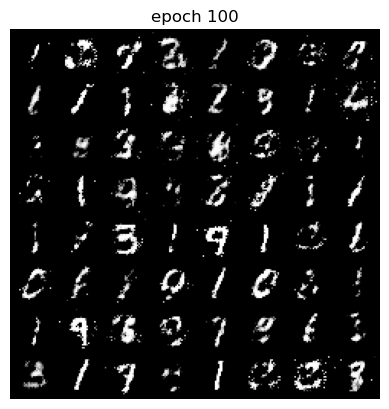

Epoch 100 of 100
Generator loss: 2.34386992, Discriminator loss: 0.89486039


In [13]:
#Training for 1c
#used this resource to get idea about ways to improve GAN: https://towardsdatascience.com/gan-ways-to-improve-gan-performance-acf37f9f59b

losses_g = [] # to store generator loss after each epoch
losses_d = [] # to store discriminator loss after each epoch
images = [] # to store images generatd by the generator
torch.manual_seed(7777)

def generator_loss(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_real(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################

def generator_loss_original(optimizer, fake_data):
    ############ YOUR CODE HERE ##########
    n = fake_data.size(0)
    optimizer.zero_grad()
    
    prediction = discriminator(fake_data)
    error = criterion(prediction, label_fake(n))
    
    error.backward()
    optimizer.step()
    
    return error
    ######################################
    
def discriminator_loss(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    return error_real + error_fake
    ######################################

def discriminator_loss_emma(optimizer, fake_data, real_data):
    ############ YOUR CODE HERE ##########
    n = real_data.size(0)

    optimizer.zero_grad()
    
    prediction_real = discriminator(real_data)
    error_real = criterion(prediction_real, label_real_penalized(n))
    error_real.backward()

    prediction_fake = discriminator(fake_data)
    error_fake = criterion(prediction_fake, label_fake(n))
    
    error_fake.backward()
    optimizer.step()
    print(error_real + error_fake)
    return error_real + error_fake
    ######################################
for epoch in range(epochs):
    loss_g = 0.0
    loss_d = 0.0
    for bi, data in tqdm(enumerate(train_loader), total=int(len(train_data)/train_loader.batch_size)):
        ############ YOUR CODE HERE ########## 
        imgs, _ = data
        m = len(imgs)
        fake_data = generator(create_noise(m, nz)).detach()
        real_data = imgs.to(device)
        loss_d += discriminator_loss_emma(optim_d, fake_data, real_data)
        fake_data = generator(create_noise(m, nz))
        loss_g += generator_loss(optim_g, fake_data)
        ######################################
    
    
    # create the final fake image for the epoch
    generated_img = generator(noise).cpu().detach()
    
    # make the images as grid
    generated_img = make_grid(generated_img)
    
    # visualize generated images
    if (epoch + 1) % 5 == 0:
        plt.imshow(generated_img.permute(1, 2, 0))
        plt.title(f'epoch {epoch+1}')
        plt.axis('off')
        plt.show()
    
    # save the generated torch tensor models to disk
    save_generator_image(generated_img, f"outputs_emma/gen_img{epoch+1}.png")
    images.append(generated_img)
    epoch_loss_g = loss_g / bi # total generator loss for the epoch
    epoch_loss_d = loss_d / bi # total discriminator loss for the epoch
    losses_g.append(epoch_loss_g.detach().numpy())
    losses_d.append(epoch_loss_d.detach().numpy())
    
    print(f"Epoch {epoch+1} of {epochs}")
    print(f"Generator loss: {epoch_loss_g:.8f}, Discriminator loss: {epoch_loss_d:.8f}")

In [87]:
print('DONE TRAINING')
torch.save(generator.state_dict(), 'outputs_emma/generator_original.pth')

DONE TRAINING


In [88]:
imgs = [np.array(to_pil_image(img)) for img in images]
imageio.mimsave('outputs_emma/generator_images_original.gif', imgs)

[array(2.88302, dtype=float32), array(3.2350743, dtype=float32), array(3.9117274, dtype=float32), array(4.334461, dtype=float32), array(4.4543114, dtype=float32), array(4.569675, dtype=float32), array(4.412225, dtype=float32), array(4.0881686, dtype=float32), array(3.7031877, dtype=float32), array(3.3084772, dtype=float32), array(3.2472274, dtype=float32), array(3.1973326, dtype=float32), array(3.1368067, dtype=float32), array(2.953303, dtype=float32), array(2.743185, dtype=float32), array(2.7093678, dtype=float32), array(2.4288018, dtype=float32), array(2.3222907, dtype=float32), array(2.2207785, dtype=float32), array(2.2202244, dtype=float32), array(2.2281327, dtype=float32), array(2.1771898, dtype=float32), array(2.14826, dtype=float32), array(2.1690943, dtype=float32), array(2.1079507, dtype=float32), array(2.0213757, dtype=float32), array(2.0259478, dtype=float32), array(1.9795316, dtype=float32), array(1.890774, dtype=float32), array(1.7980239, dtype=float32), array(1.8176216, dt

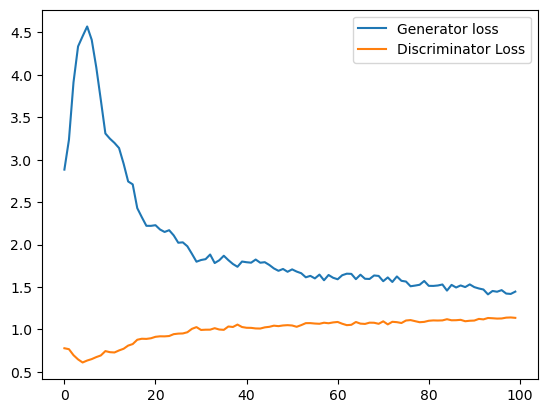

In [89]:
# plot and save the generator and discriminator loss
#losses_g_numpy = losses_g.detach().numpy()
print(losses_g)
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_d, label='Discriminator Loss')
plt.legend()
plt.savefig('outputs_emma/loss_emma1c.png')